In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def coth(a):
    if a>0: return (1+tf.math.exp(-2*a))/(1-tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)+1)/(tf.math.exp(2*a)-1)
    if a==0: return 0

def tanh(a):
    if a>0: return (1-tf.math.exp(-2*a))/(1+tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)-1)/(tf.math.exp(2*a)+1)
    if a==0: return 0

In [3]:
data=100
layer=10
n_ini=1.0
n_fin=0.1
dn=-0.1
m2=-1
lam=1
c_reg1=0.003
c_reg2=0.0001

<tf.Variable 'Shape/Variable:0' shape=(10,) dtype=float64, numpy=
array([ 0.24974819,  1.72018513, -0.82303895,  3.03569575,  2.19106004,
        0.9025919 ,  1.9755043 ,  3.03759896,  4.96341222, 11.03839812])>
tf.Tensor(
[ 3.01490951  3.02722263  3.04978824  3.09134316  3.16854751  3.31437385
  3.59861219  4.18820179  5.58607614 10.29821491], shape=(10,), dtype=float64)


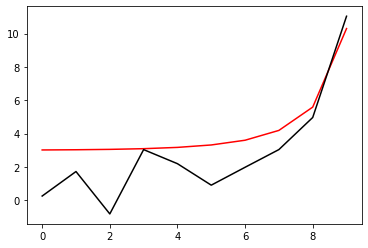

In [88]:
h=tf.zeros(layer)
h_in=[]
#h_in=[3.0205426, 3.022307 , 3.0291433, 3.04402  , 3.0732646, 3.131582 ,
# 3.2585216, 3.5762587, 4.59116  , 9.752249]
for i in range (layer):
#   midd=np.float64(10.0)
#    h_in.append(midd)
#    midd=3*coth(3*((i-layer)*dn)).numpy()
#    h_in.append(midd)
    mu=1/(1-i/10)
    h_inn=np.float64(np.random.normal(mu, 1))
    h_in.append(h_inn)
h=tf.Variable(h_in)
print(h)

h_real=tf.zeros(layer)
middd=[]
for i in range (layer):
    midd=3*coth(3*((i-layer)*dn)).numpy()
    middd.append(midd)
h_real=tf.constant(middd)
print(h_real)
plt.plot(h_real, 'r-')
plt.plot(h.numpy(), 'k-')
plt.show()

In [89]:
m2=tf.constant(np.float64(-1.0))
m2_2=tf.Variable(np.float64(np.random.uniform(-1.5, -0.5)))
print(m2_2)

<tf.Variable 'Shape/Variable:0' shape=() dtype=float64, numpy=-1.326700556469552>


In [7]:
phi=tf.Variable(tf.zeros(1))
pi=tf.Variable(tf.zeros(1))

def F_func(m, a,b):
    return 2*b/n_fin-m*a-lam*(a**3)

def t_func(a):
    return 0.5*(tf.math.tanh(100*(a-0.1))-tf.math.tanh(100*(a+0.1))+2)

In [8]:
def LP2(hh, m, phi, pi):
    for j in range (layer):
        phi1=phi+dn*pi
        pi1 =phi*m*dn+(1-dn*hh[j])*pi+dn*lam*(phi1**3)
        phi=phi1
        pi=pi1
    return phi, pi
def NN_func_p(hh, m):
    Positive=[]
    while len(Positive)<data:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, m, phi1, pi1)
        for i in range (10000):
            if len(Positive)>=100: break
            if tf.math.abs(F_func(m, phi_1[i], pi_1[i]))<0.1: Positive.append([phi1[i], pi1[i]]), print(len(Positive))
            else: continue
    return Positive
def NN_func_n(hh, m):
    Negative=[]
    while len(Negative)<data:
        phi1=np.random.uniform(0.0, 1.5, 200)
        pi1=np.random.uniform(-0.2, 0.2, 200)
        phi_1, pi_1 = LP2(hh, m, phi1, pi1)
        for i in range (200):
            if len(Negative)>=100: break
            if tf.math.abs(F_func(m, phi_1[i], pi_1[i]))>=0.1: Negative.append([phi1[i], pi1[i]])
            else: continue
    return Negative
def NN_func_01(hh, m, list1):
    PP=[]
    NN=[]
    for i in range (data):
        phi=list1[i][0]
        pi=list1[i][1]
        if tf.math.abs(LP2(hh, m, phi, pi)[1])<0.1: PP.append([phi, pi])
        else: NN.append([phi, pi])
    return PP, NN

In [73]:
Positive=NN_func_p(h_real, m2)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100


In [74]:
Negative=NN_func_n(h_real, m2)

In [79]:
[Positive0, Positive1]=NN_func_01(h, m2_2, Positive)
[Negative0, Negative1]=NN_func_01(h, m2_2, Negative)

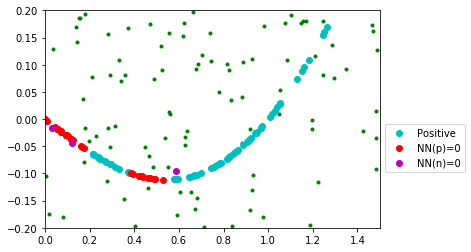

In [80]:
x_data1=[v[0] for v in Positive0]
y_data1=[v[1] for v in Positive0]
x_data2=[v[0] for v in Positive1]
y_data2=[v[1] for v in Positive1]
x_data3=[v[0] for v in Negative0]
y_data3=[v[1] for v in Negative0]
x_data4=[v[0] for v in Negative1]
y_data4=[v[1] for v in Negative1]
plt.plot(x_data4, y_data4, 'g.')
plt.plot(x_data2, y_data2, 'co', label='Positive')
plt.plot(x_data1, y_data1, 'ro', label='NN(p)=0')
plt.plot(x_data3, y_data3, 'mo', label='NN(n)=0')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.legend(bbox_to_anchor=(1, 0.5))
plt.show()

# Error function

$E=\sum_{data} \left\vert y(\bar{x}^{(1)}) - \bar{y} \right\vert+E_{reg}(W)$
, $E_{reg}=c_{reg}^{(1)}\sum_{n=1}^{N-1}(\eta^{(n)})^{4}(h(\eta^{(n+1)})-h(\eta^{(n)}))^{2}+c_{reg}^{(2)}(h(\eta^{(N)})-1/\eta^{(N)})^{2}$

In [81]:
def Error_func(hh, m):
    phi0=np.array([v[0] for v in Positive])
    pi0=np.array([v[1] for v in Positive])
    phi1=np.array([v[0] for v in Negative])
    pi1=np.array([v[1] for v in Negative])
    phi_0, pi_0=LP2(hh, m, phi0, pi0)
    phi_1, pi_1=LP2(hh, m, phi1, pi1)
    PPlist=t_func(pi_0)
    NNlist=t_func(pi_1)
    sum_p=sum(PPlist)
    sum_n=data-sum(NNlist)

    inside=0
    for k in range (layer-1):
        second=((n_ini+k*dn)**4)*((hh[k+1]-hh[k])**2)
        inside=inside+second
    E_reg1=c_reg1*inside
    E_reg2=c_reg2*((hh[layer-1]-1/n_fin)**2)
    return E_reg1+E_reg2+sum_p+sum_n

In [82]:
print(Error_func(h_real, m2))
print(Error_func(h, m2_2))

tf.Tensor(0.00022561923860088984, shape=(), dtype=float64)
tf.Tensor(70.99330170433609, shape=(), dtype=float64)


In [83]:
def run():
    with tf.GradientTape() as g:
        loss=Error_func(h, m2_2) #돌리기전에 Error함수 수정 잊지말것
        gradients=g.gradient(loss, [h, m2_2])
    optimizer.apply_gradients(zip(gradients, [h, m2_2]))

200 98.62807070499565 -1.3539376325001071
[ 0.01545933  1.48394967 -1.06365595  2.82334859  2.12546728  1.211314
  2.27434875  3.32948547  5.25216859 11.32593376]


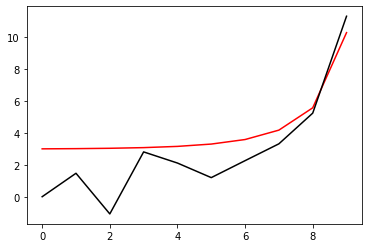

400 98.21672443805397 -1.343579207327585
[-0.16161415  1.29631275 -1.24224145  2.71191222  2.3956373   1.47778013
  2.52944522  3.57879055  5.49846277 11.57092497]


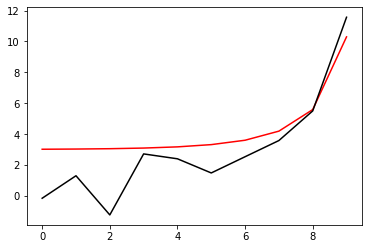

600 98.10916892020975 -1.3371687035803628
[-0.25956227  1.18272394 -1.32759582  2.63738681  2.54019434  1.61373038
  2.65850247  3.70473583  5.62266839 11.69422246]


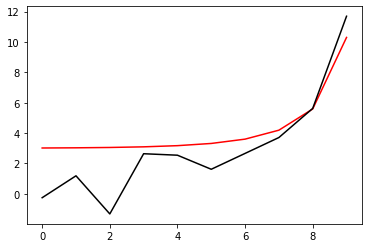

800 98.07591898664289 -1.3332962488201798
[-0.31544754  1.10360176 -1.36252024  2.57333595  2.62943868  1.69802204
  2.73677683  3.78081149  5.69747274 11.7681412 ]


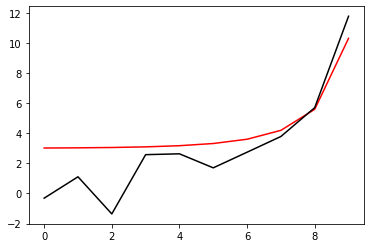

1000 98.06077739440406 -1.3305724665376697
[-0.35186033  1.03758534 -1.37171847  2.50883276  2.69288968  1.76003182
  2.79302905  3.83537066  5.75101694 11.82075121]


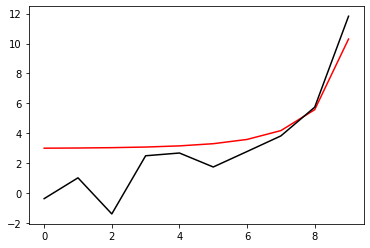

1200 98.05193539286647 -1.3284779522533792
[-0.37710918  0.97712808 -1.36435     2.4410229   2.74117952  1.81018197
  2.8374061   3.87838248  5.79317493 11.86189258]


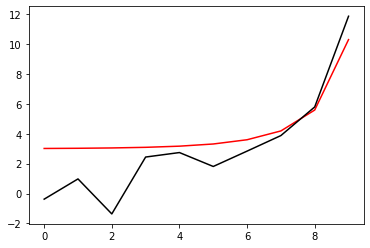

1400 98.04581723760076 -1.326776762645754
[-0.39497967  0.91894421 -1.34469476  2.36920059  2.77901809  1.85317879
  2.87446168  3.91430882  5.82835888 11.89595536]


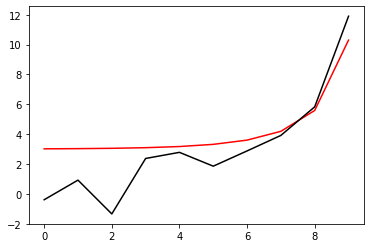

1600 98.04105397177099 -1.3253429991997718
[-0.40750285  0.86139038 -1.31516043  2.29341097  2.80877398  1.89153169
  2.90660673  3.94550747  5.85889743 11.92525013]


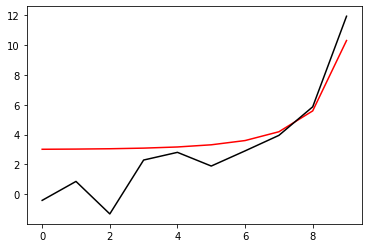

1800 98.03704028762624 -1.3241011520372787
[-0.41590398  0.80359052 -1.27731746  2.21402843  2.83170413  1.92673708
  2.93526725  3.97337123  5.88616495 11.95113443]


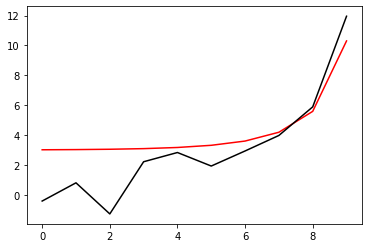

2000 98.03348475172328 -1.3230016520977688
[-0.42099359  0.74508476 -1.23232803  2.13159743  2.84846393  1.95976058
  2.96135535  3.99879048  5.91103951 11.97446932]


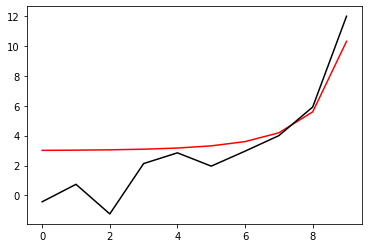

2200 98.03024141743526 -1.3220094687551962
[-0.42335231  0.68566854 -1.1811487   2.04675911  2.85935151  1.99126195
  2.98548923  4.02236874  5.93411617 11.99583195]


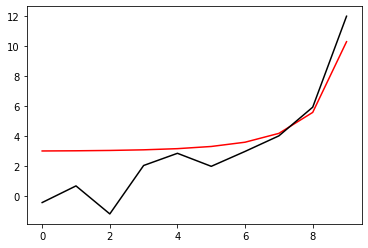

2400 98.02723761184615 -1.3210982798770095
[-0.4234278   0.62531115 -1.12463462  1.96021072  2.86443963  2.02171078
  3.00810698  4.04453405  5.95581701 12.01562513]


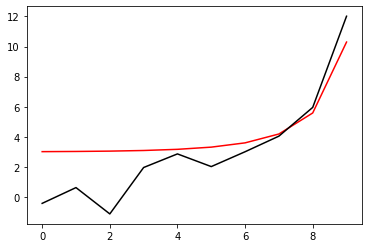

2600 98.02443946629839 -1.3202473026321664
[-0.42158972  0.56411053 -1.06359544  1.87267902  2.86365572  2.05145033
  3.02953017  4.06560109  5.97645257 12.03413833]


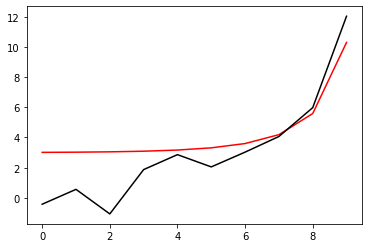

2800 98.0218339434969 -1.319439512831807
[-0.41816282  0.50226597 -0.99882503  1.78490075  2.85683684  2.08073468
  3.05000179  4.08580819  5.99625829 12.05158387]


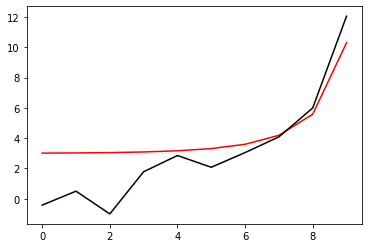

3000 98.01941875377865 -1.3186606413609447
[-0.41344755  0.44005975 -0.93111586  1.69760673  2.84377274  2.1097508
  3.06970998  4.10534041  6.01541739 12.06811944]


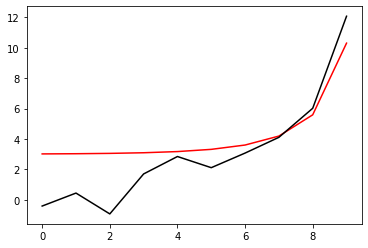

3200 98.017196367127 -1.3178986278848082
[-0.40773298  0.37784326 -0.86126409  1.61150856  2.82424359  2.13863202
  3.08880357  4.12434468  6.0340757  12.08386268]


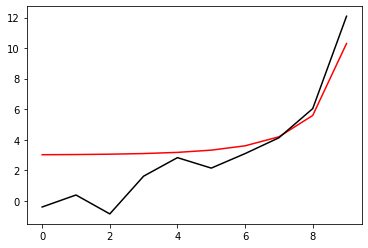

3400 98.01517033111358 -1.317143350546138
[-0.40130431  0.31602519 -0.79006878  1.52728652  2.79805574  2.16746595
  3.10740263  4.14293998  6.0523518  12.09890097]


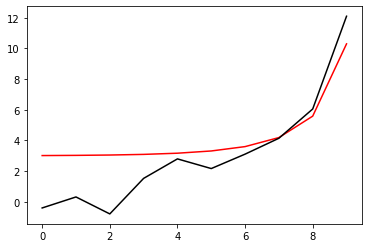

3600 98.01334299776947 -1.3163865201455425
[-0.3944465   0.25506033 -0.71832745  1.4455784   2.76507656  2.19629893
  3.12560571  4.16122447  6.07034397 12.11329807]


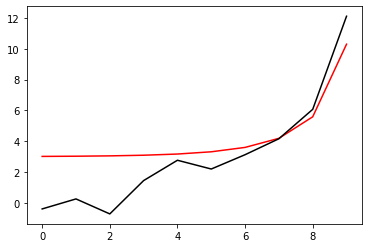

3800 98.01171418066447 -1.3156216639259355
[-0.38744442  0.19543818 -0.64682936  1.36696827  2.72526797  2.22513823
  3.14349501  4.17928045  6.08813518 12.12709871]


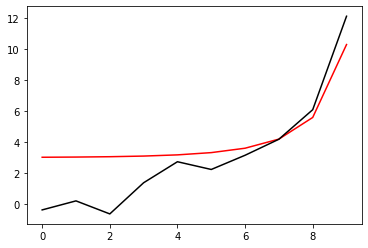

4000 98.01028046647302 -1.314844143906229
[-0.38058006  0.13767074 -0.57634729  1.29197505  2.67871687  2.25395284
  3.16114001  4.19717798  6.10579658 12.14033177]


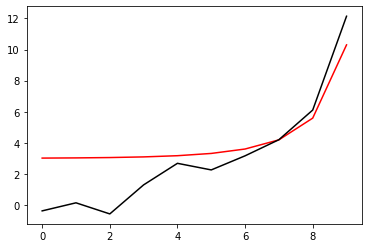

4200 98.00903500676917 -1.3140511662848768
[-0.37412687  0.08227906 -0.50762824  1.22104024  2.62565973  2.28267343
  3.17859993  4.21497737  6.12339005 12.15301233]


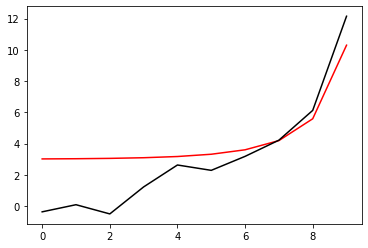

4400 98.00796766868325 -1.3132417471480275
[-0.36834159  0.02977807 -0.44138318  1.15451504  2.56649846  2.31119207
  3.19592545  4.23273105  6.14097001 12.16514313]


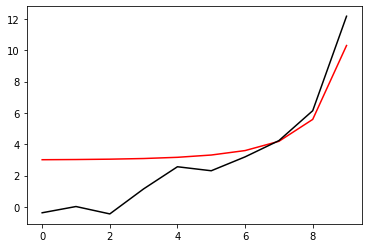

4600 98.00706545257971 -1.3124166093243248
[-0.36345377 -0.01934044 -0.37827567  1.09264705  2.50180474  2.33936211
  3.21315969  4.2504848   6.15858472 12.17671529]


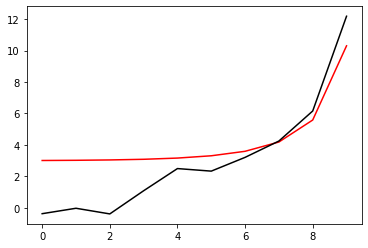

4800 98.00631310236105 -1.3115779978767603
[-0.35965361 -0.06462675 -0.31890943  1.03556752  2.43231146  2.36699865
  3.23033888  4.26827878  6.17627726 12.18770884]


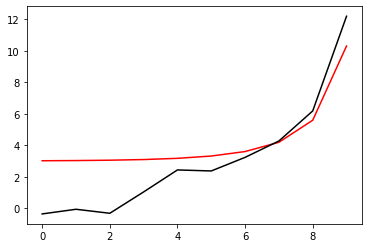

5000 98.00569384338813 -1.3107294174734347
[-0.35707889 -0.10569391 -0.26381493  0.98328069  2.35889119  2.39387991
  3.24749255  4.28614829  6.19408639 12.198093  ]


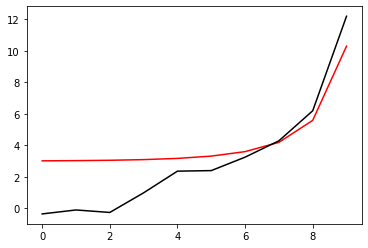

5200 98.00519018545536 -1.3098753115495096
[-0.35580222 -0.14223913 -0.21343544  0.9356571   2.28252373  2.41974969
  3.26464367  4.30412463  6.2120474  12.20782644]


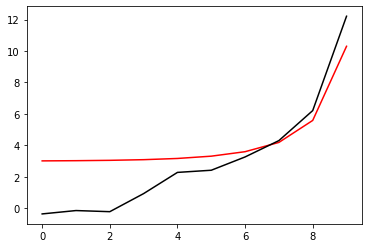

5400 98.0047847254029 -1.3090207169620283
[-0.35582008 -0.17406455 -0.16811336  0.89243367  2.2042558   2.4443212
  3.28180864  4.32223593  6.23019299 12.21685753]


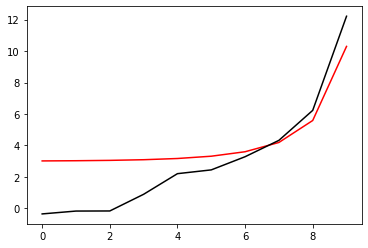

5600 98.0044608800257 -1.308170934672334
[-0.35704552 -0.20109507 -0.12807832  0.85322281  2.12515668  2.46728228
  3.2989972   4.34050831  6.24855443 12.22512488]


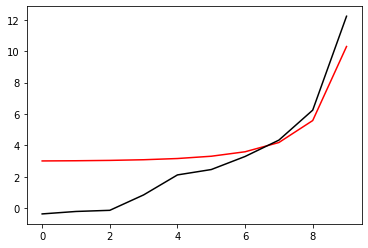

5800 98.00420348161316 -1.3073312540548463
[-0.35930637 -0.22339053 -0.09343865  0.8175326   2.04627343  2.48830197
  3.31621232  4.35896705  6.26716288 12.23255792]


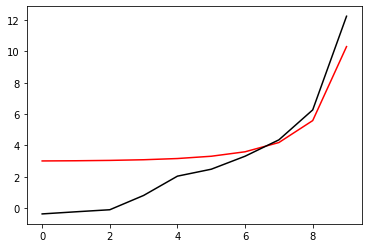

6000 98.00399918215399 -1.3065067553779017
[-0.36235062 -0.24114917 -0.06417798  0.78479847  1.96858872  2.50703859
  3.33345006  4.37763817  6.28605089 12.23907777]


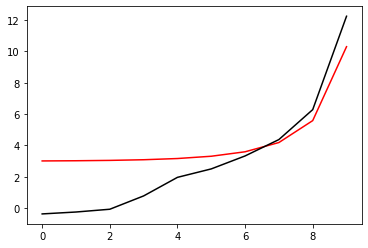

6200 98.00383664023641 -1.30570219452627
[-0.36585994 -0.25470012 -0.04015844  0.75442478  1.89298338  2.52314907
  3.35069926  4.39655001  6.30525414 12.24459824]


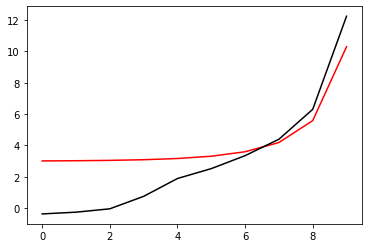

6400 98.00370650226438 -1.3049219516912596
[-0.36947147 -0.26448365 -0.02113074  0.72583214  1.82020523  2.53629939
  3.36794108  4.41573499  6.3248133  12.24902702]


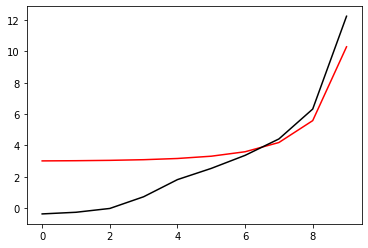

6600 98.00360122579765 -1.3041700088222756
[-3.72806342e-01 -2.71020148e-01 -6.75055294e-03  6.98504444e-01
  1.75084559e+00  2.54617604e+00  3.38514833e+00  4.43523144e+00
  6.34477594e+00  1.22522669e+01]


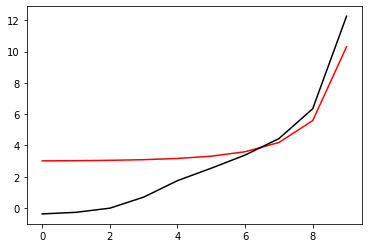

6800 98.00351481496554 -1.3034499158921644
[-3.75502220e-01 -2.74871023e-01  3.40107363e-03  6.72028164e-01
  1.68532444e+00  2.55249791e+00  3.40228456e+00  4.45508531e+00
  6.36519845e+00  1.22542172e+01]


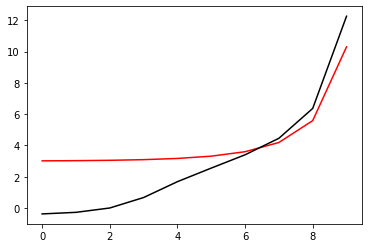

7000 98.00344253831868 -1.302764716834793
[-3.77246055e-01 -2.76596515e-01  9.79591011e-03  6.46117607e-01
  1.62388545e+00  2.55502849e+00  3.41930280e+00  4.47535171e+00
  6.38614794e+00  1.22547748e+01]


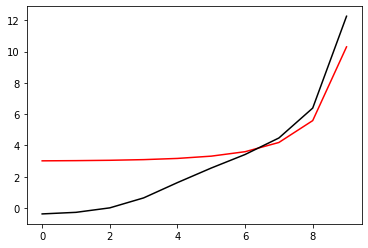

7200 98.00338067988419 -1.3021168298954577
[-0.37780235 -0.27671653  0.01293815  0.62062187  1.56660138  2.55358743
  3.43614405  4.49609626  6.40770384 12.25383577]


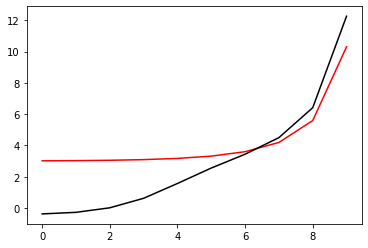

7400 98.00332634487351 -1.3015079055346745
[-0.37703282 -0.27568008  0.01334717  0.59551341  1.51338999  2.54806111
  3.45273547  4.51739589  6.42995931 12.25129602]


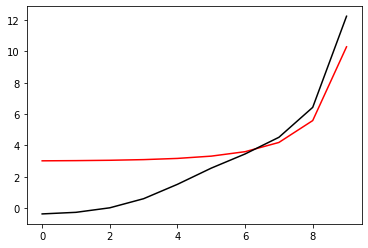

7600 98.0032773155554 -1.3009387061722075
[-3.74904272e-01 -2.73847191e-01  1.15436160e-02  5.70861868e-01
  1.46403910e+00  2.53841138e+00  3.46898840e+00  4.53933910e+00
  6.45302218e+00  1.22470523e+01]


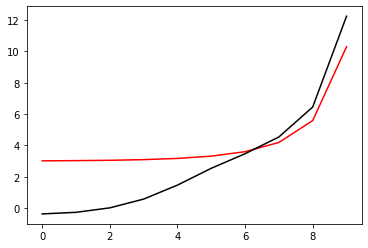

7800 98.0032319392211 -1.3004090562033992
[-3.71483554e-01 -2.71484569e-01  8.03764091e-03  5.46799944e-01
  1.41823888e+00  2.52468161e+00  3.48479612e+00  4.56202539e+00
  6.47701528e+00  1.22410026e+01]


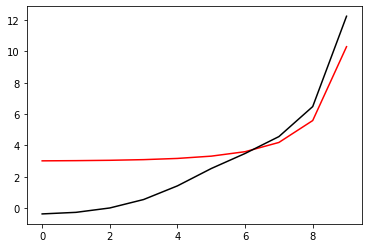

8000 98.0031890301599 -1.2999178951555455
[-3.66920629e-01 -2.68773348e-01  3.31738964e-03  5.23488593e-01
  1.37561814e+00  2.50699966e+00  3.50003175e+00  4.58556377e+00
  6.50207613e+00  1.22330461e+01]


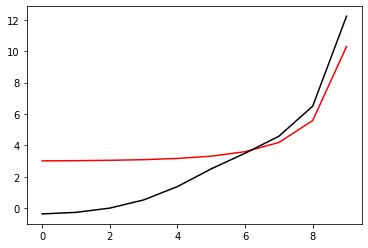

8200 98.00314777587693 -1.2994634376580574
[-3.61423022e-01 -2.65825285e-01 -2.16370168e-03  5.01087583e-01
  1.33578122e+00  2.48557697e+00  3.51454619e+00  4.61007011e+00
  6.52835578e+00  1.22230827e+01]


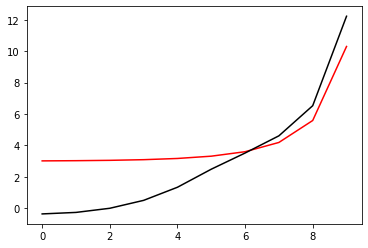

8400 98.003107647132 -1.299043413098922
[-3.55226208e-01 -2.62702574e-01 -8.00083035e-03  4.79734571e-01
  1.29834193e+00  2.46070365e+00  3.52816663e+00  4.63566333e+00
  6.55601681e+00  1.22110118e+01]


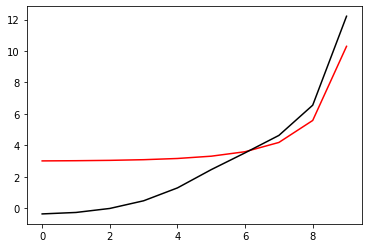

8600 98.00306831668915 -1.2986553374583933
[-0.34856497 -0.25943688 -0.0138514   0.45953298  1.26295146  2.43273974
  3.54069588  4.66246038  6.58523051 12.19673165]


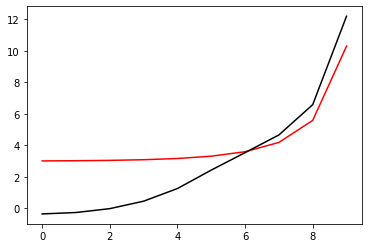

8800 98.00302959187673 -1.2982967662946592
[-0.34164993 -0.25604451 -0.01944559  0.4405472   1.22931788  2.40210276
  3.55191315  4.69057028  6.61617347 12.18013742]


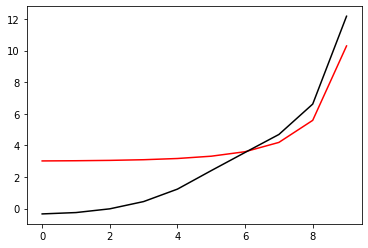

9000 98.00299136317757 -1.297965489840687
[-0.33465213 -0.25253649 -0.02459112  0.42280297  1.19721615  2.36925265
  3.56157681  4.72008749  6.64902386 12.16112085]


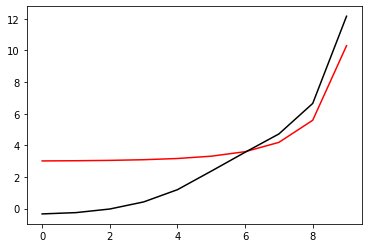

9200 98.00295356792653 -1.2976596513835497
[-0.32769635 -0.24892376 -0.02917082  0.40629145  1.1664887   2.33467458
  3.56942988  4.75108514  6.68395786 12.13957031]


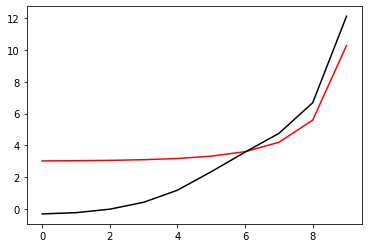

9400 98.00291616654766 -1.2973777896848446
[-0.32086256 -0.24521894 -0.03313302  0.39097591  1.13703844  2.29886086
  3.57520865  4.78360861  6.72114652 12.11537268]


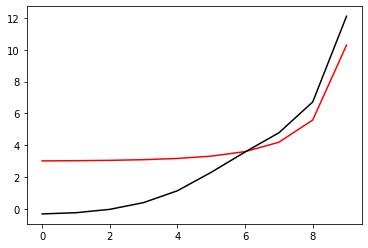

9600 98.00287912874728 -1.297118818841022
[-0.3141931  -0.24143606 -0.03647677  0.37680002  1.10881679  2.26229274
  3.57865458  4.81766972  6.7607534  12.08841704]


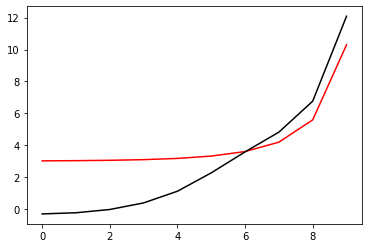

9800 98.0028424277898 -1.2968819628811459
[-0.30770302 -0.23758974 -0.03923505  0.36369689  1.08180966  2.22542287
  3.57952915  4.85324205  6.80293291 12.05860047]


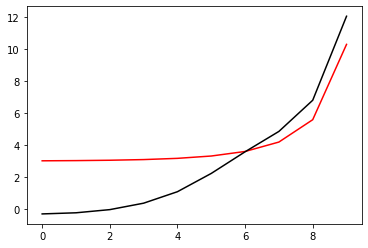

10000 98.00280604146933 -1.2966666599986167
[-0.30139076 -0.23369436 -0.04145888  0.35159713  1.05602369  2.18865957
  3.57763075  4.89025713  6.84782913 12.02583559]


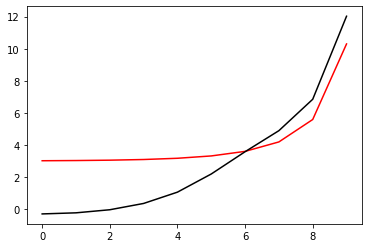

10200 98.0027699582494 -1.2964724475366665
[-0.29524719 -0.22976366 -0.04320499  0.34043465  1.03147379  2.15235371
  3.57281193  4.92860161  6.89557467 11.99005929]


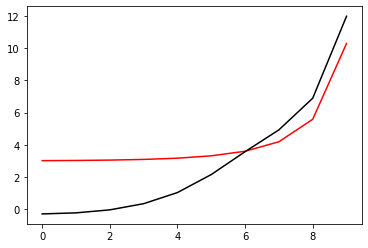

10400 98.00273418648007 -1.2962988385569825
[-0.28926176 -0.22581056 -0.04452786  0.33014926  1.0081725   2.11678921
  3.56499547  4.96811517  6.94628911 11.95124209]


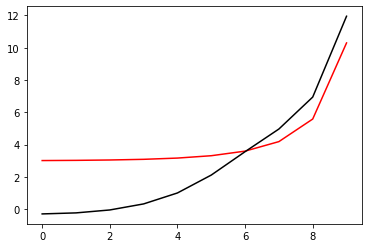

10600 98.00269876407471 -1.2961452058168272
[-0.28342559 -0.22184711 -0.0454762   0.32068597  0.98612099  2.08217823
  3.55418692  5.00858936  7.00007656 11.90939712]


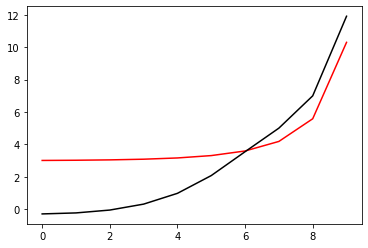

10800 98.0026637659476 -1.2960106958125268
[-0.27773204 -0.21788423 -0.04609258  0.31199221  0.96530235  2.04866136
  3.54048188  5.04976722  7.05702216 11.86458823]


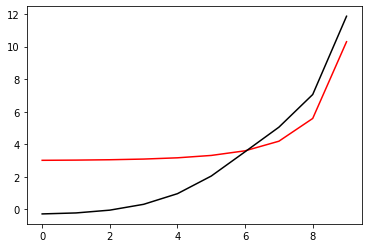

11000 98.0026293070283 -1.2958941967771953
[-0.27217567 -0.21393136 -0.04641474  0.30401438  0.94567763  2.01631324
  3.52406658  5.09134415  7.11718747 11.8169365 ]


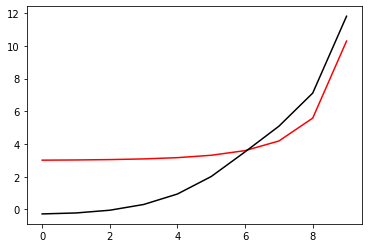

11200 98.00259553969556 -1.2957943745462903
[-0.26675065 -0.20999589 -0.04647707  0.29669556  0.92718581  1.98515302
  3.50521082  5.13297015  7.18060493 11.76662475]


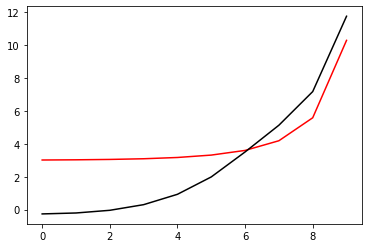

11400 98.00256264573505 -1.295709771237016
[-0.26144951 -0.20608286 -0.04631154  0.28997534  0.90974779  1.95515872
  3.48425348  5.17425386  7.24727181 11.71389973]


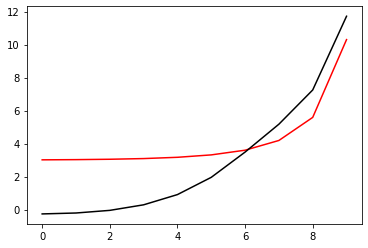

11600 98.00253082408622 -1.295638942911663
[-0.25626267 -0.20219473 -0.04594772  0.28379193  0.89327397  1.92628373
  3.46158177  5.21476849  7.31714407 11.65907201]


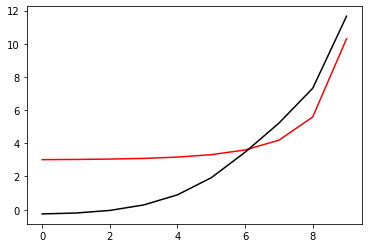

11800 98.00250027639771 -1.2955806021390655
[-0.25117904 -0.19833181 -0.04541212  0.2780859   0.87767407  1.8984735
  3.43760637  5.25405986  7.39013082 11.60251353]


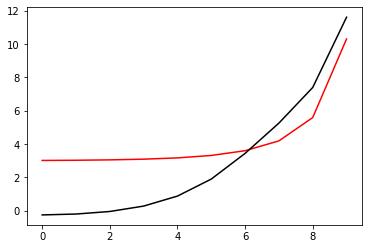

12000 98.00247119260933 -1.295533730802269
[-0.24618716 -0.19449288 -0.0447273   0.27280452  0.86286682  1.87167997
  3.41273529  5.29165681  7.46609002 11.54465318]


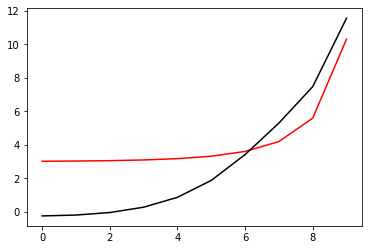

12200 98.00244373846004 -1.2954976331521693
[-0.24127678 -0.19067619 -0.04391126  0.2679052   0.84878779  1.84587182
  3.38734964  5.3270839   7.54482591 11.48597071]


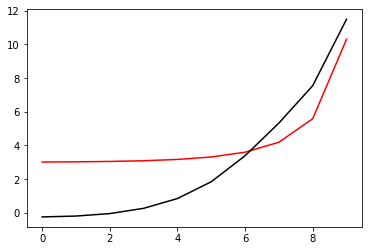

12400 98.00241804618506 -1.2954719050855044
[-0.2364403  -0.18688053 -0.04297754  0.26335717  0.83539326  1.8210389
  3.36178388  5.3598765   7.62608857 11.42698926]


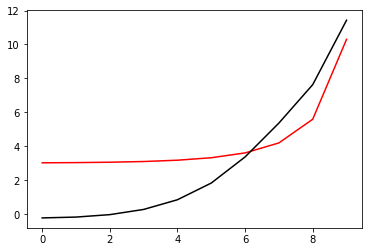

12600 98.00239420896004 -1.2954563041957101
[-0.2316741  -0.18310648 -0.04193626  0.25914062  0.82265952  1.79719042
  3.33631227  5.389598    7.70957568 11.36826638]


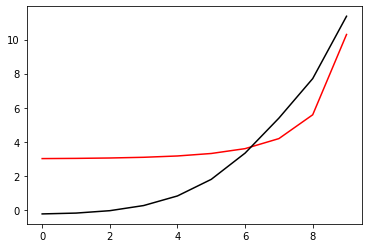

12800 98.00237227906125 -1.2954505227176192
[-0.22697965 -0.17935781 -0.04079618  0.25524346  0.81057768  1.77434764
  3.31114225  5.41585862  7.7949361  11.31038356]


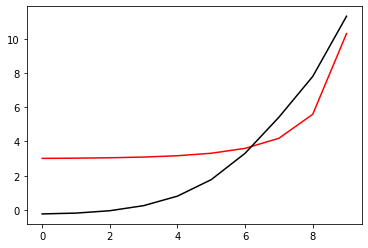

13000 98.0023522693041 -1.2954538978763186
[-0.22236453 -0.17564299 -0.03956756  0.25165624  0.79914537  1.7525328
  3.28641413  5.43833486  7.88177471 11.25393339]


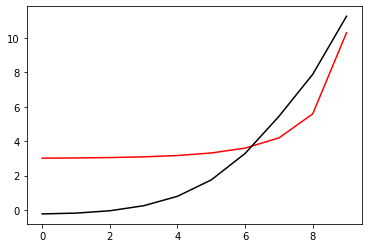

13200 98.00233415707878 -1.295465135374123
[-0.21784306 -0.17197644 -0.03826493  0.24836688  0.78835768  1.73175733
  3.26220613  5.45678849  7.96965804 11.19950423]


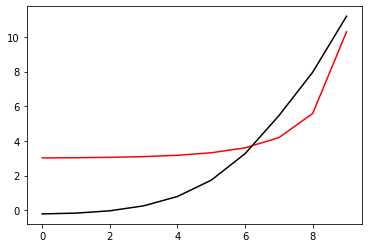

13400 98.00231789016408 -1.2954821464406674
[-0.21343605 -0.16837897 -0.03690902  0.24535638  0.77819954  1.71201235
  3.23854355  5.47108316  8.05811989 11.14766166]


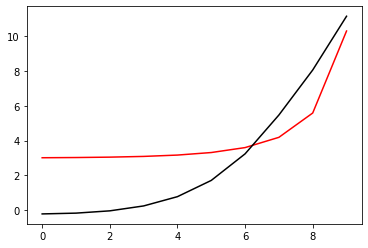

13600 98.00230339344937 -1.2955020768538277
[-0.20916942 -0.16487679 -0.03552683  0.24259706  0.76864174  1.6932641
  3.21541132  5.48119715  8.14666676 11.09892707]


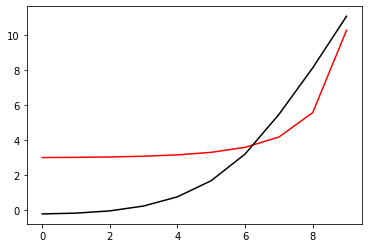

13800 98.00229057573127 -1.2955215374142008
[-0.20507166 -0.1614993  -0.03415     0.24005345  0.75964114  1.67545536
  3.19276915  5.48723006  8.23478281 11.053754  ]


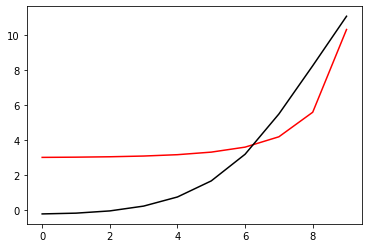

14000 98.0022793358726 -1.2955369712247258
[-0.20117099 -0.15827616 -0.03281198  0.23768529  0.75114471  1.65851284
  3.17056871  5.48940237  8.32193436 11.01250373]


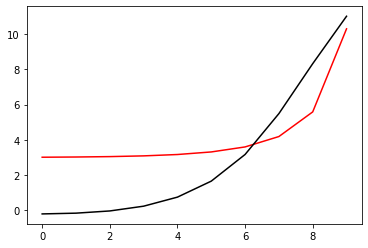

14200 98.00226956779764 -1.2955450591098112
[-0.19749283 -0.15523471 -0.03154493  0.23545173  0.74309611  1.64235849
  3.14877147  5.48804678  8.40757421 10.9754227 ]


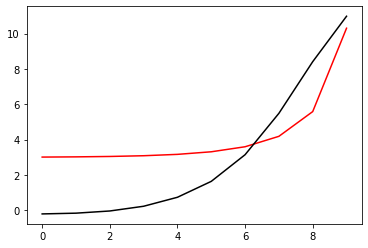

14400 98.00226116401272 -1.29554307696951
[-0.19405833 -0.15239805 -0.03037704  0.23331561  0.73544327  1.62692265
  3.12736562  5.48359214  8.49114605 10.94262495]


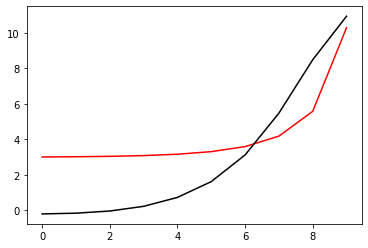

14600 98.00225401756535 -1.295529150995033
[-0.1908838  -0.14978427 -0.02933077  0.2312471   0.72814539  1.61215624
  3.10637959  5.4765411   8.57208946 10.91408321]


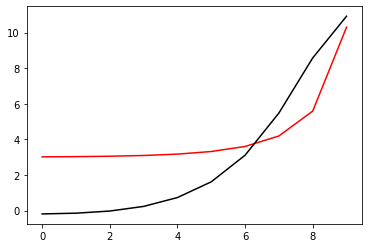

14800 98.00224802251287 -1.2955019062714181
[-0.18798379 -0.14740913 -0.02842495  0.22922318  0.72117486  1.59803642
  3.08589035  5.46744534  8.64984708 10.88963174]


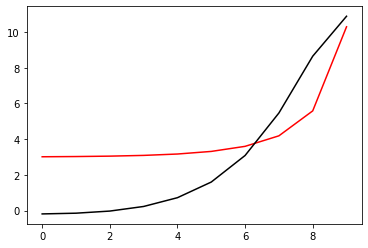

15000 98.00224307746305 -1.295486134037852
[-0.18537092 -0.14528408 -0.02766904  0.22723815  0.71453783  1.58459658
  3.06603222  5.45688087  8.72387441 10.86899228]


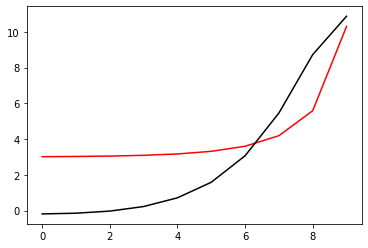

15200 98.00223906741358 -1.2953914502105826
[-0.18302888 -0.14339676 -0.02705473  0.22529862  0.70823314  1.5718501
  3.04694976  5.44539299  8.79363128 10.85176292]


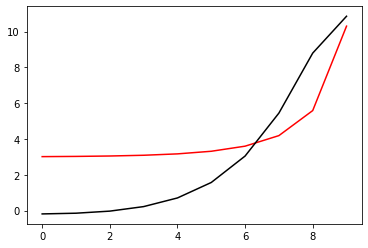

15400 98.00223588938759 -1.295352455730711
[-0.18098031 -0.14176469 -0.02659685  0.22339154  0.70227799  1.55986815
  3.02883913  5.43351598  8.85862572 10.83751269]


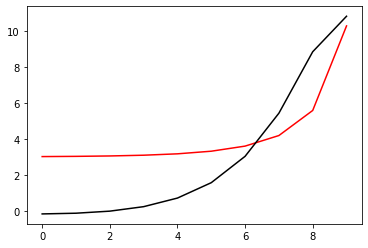

15600 98.00223343782342 -1.2952700532180998
[-0.1792346  -0.14039753 -0.02629474  0.2215427   0.69672245  1.54875354
  3.01191793  5.42174142  8.91842223 10.8258082 ]


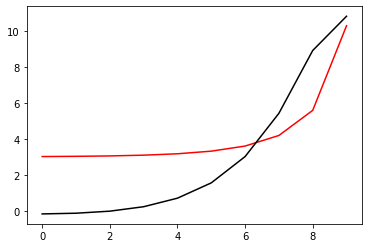

15800 98.00223160052863 -1.2952049495514595
[-0.17780532 -0.13930622 -0.02616117  0.2197367   0.6915703   1.53855087
  2.99634689  5.41045532  8.97263355 10.81620487]


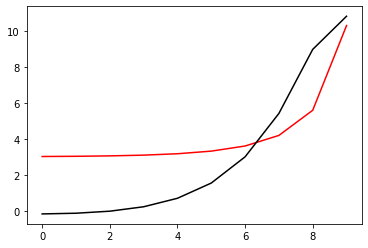

16000 98.00223026882874 -1.2950994369706457
[-0.17674233 -0.13853936 -0.0262354   0.21795354  0.68682377  1.52931474
  2.9822768   5.39998193  9.02097959 10.80833627]


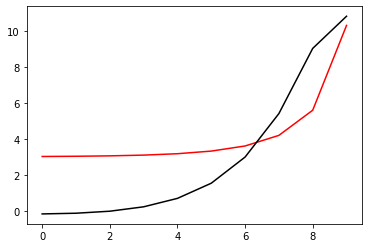

16200 98.002229340363 -1.2949788628296683
[-0.17619143 -0.13823557 -0.02664761  0.21607268  0.68239379  1.52101282
  2.96976266  5.39052607  9.06328099 10.80188549]


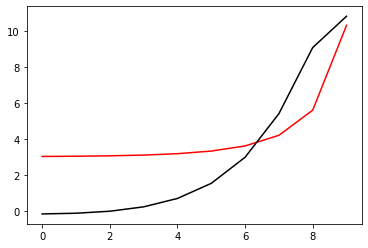

16400 98.00222871512133 -1.2947533842292394
[-0.17706447 -0.13927473 -0.02824917  0.21327126  0.6775699   1.51317449
  2.95859716  5.38211141  9.09945913 10.79656094]


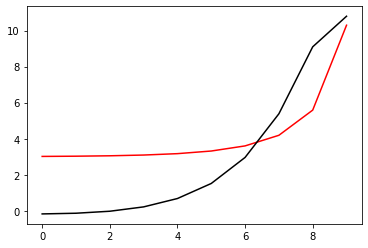

16600 96.00262358595 -1.2665647150892183
[-0.21975381 -0.18075802 -0.06998998  0.1692552   0.63469872  1.47415051
  2.92090304  5.34659737  9.08275994 10.76185762]


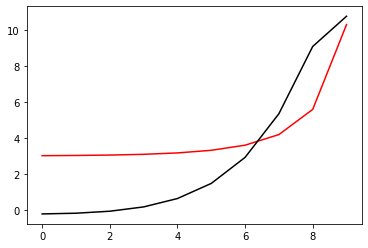

16800 96.00258492612211 -1.266963888807422
[-0.22003949 -0.18110404 -0.07032052  0.16908681  0.63492387  1.475196
  2.92350806  5.35182686  9.09167079 10.77372053]


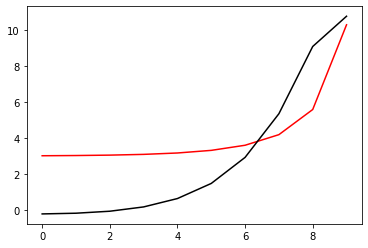

17000 96.00256281922688 -1.267160450358682
[-0.22053151 -0.1816596  -0.07086181  0.16871048  0.63494769  1.47605534
  2.92595793  5.35695336  9.10056779 10.785572  ]


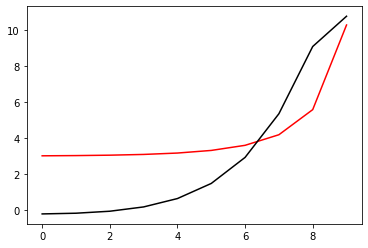

17200 96.00254459164528 -1.2672576610744233
[-0.22114903 -0.18234313 -0.07153091  0.16821185  0.63486057  1.47682757
  2.92836722  5.36211686  9.10962624 10.79760427]


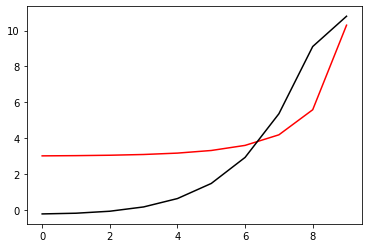

17400 96.00252763745121 -1.2673049710175777
[-0.22184874 -0.18311121 -0.07228416  0.16763515  0.63470766  1.47755954
  2.93078588  5.36737219  9.11890932 10.80987138]


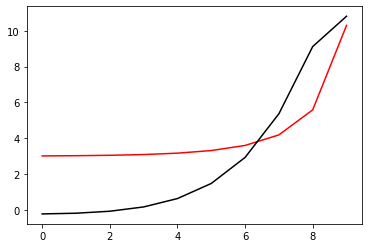

17600 96.0025114832238 -1.2673320430358541
[-0.22260309 -0.1839362  -0.07309396  0.1670079   0.63451592  1.47827699
  2.93323741  5.37273889  9.12843343 10.82236827]


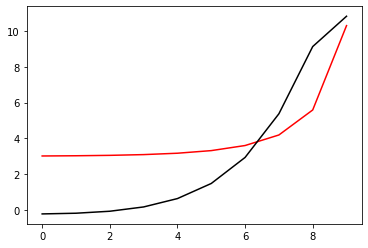

17800 96.002496144066 -1.267352907094213
[-0.2233987  -0.18480458 -0.07394685  0.16634316  0.63429707  1.4789888
  2.93572555  5.37821186  9.13818431 10.83505152]


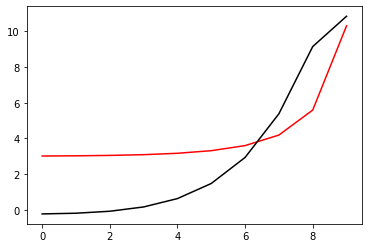

18000 96.00248170049292 -1.2673730807779675
[-0.22423015 -0.18571072 -0.0748373   0.16564592  0.63405426  1.47969435
  2.93824277  5.38377189  9.14813019 10.8478546 ]


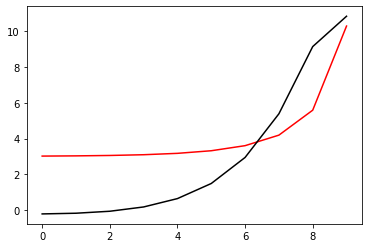

18200 96.00246822534072 -1.2673945368962436
[-0.22509533 -0.18665224 -0.07576307  0.16491771  0.63378693  1.48038866
  2.94077597  5.38939223  9.15822954 10.86069655]


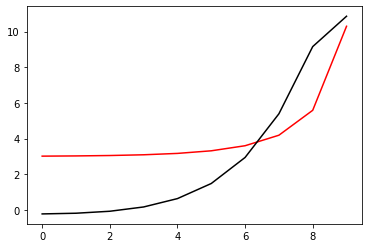

18400 96.00245577340766 -1.267418007022154
[-0.22599332 -0.18762795 -0.0767231   0.16415883  0.63349298  1.48106468
  2.94330906  5.39504164  9.16843467 10.87348589]


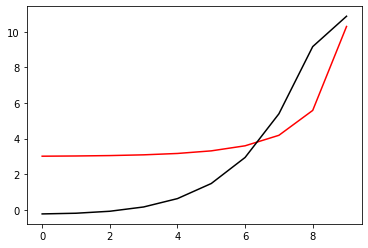

18600 96.00244437929244 -1.2674438504824674
[-0.22692361 -0.18863703 -0.07771673  0.16336908  0.63316962  1.48171422
  2.94582402  5.40068561  9.17869336 10.88612246]


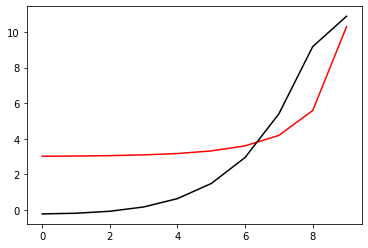

18800 96.00243405656107 -1.2674723391422282
[-0.22788587 -0.18967882 -0.0787435   0.16254799  0.6328136   1.48232827
  2.94830125  5.40628701  9.18894971 10.89849848]


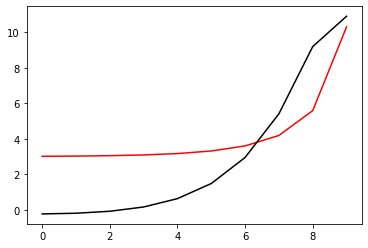

19000 96.00242479761613 -1.2675037402699938
[-0.22887997 -0.19075285 -0.0798031   0.16169484  0.63242127  1.48289704
  2.95071988  5.41180648  9.19914489 10.91049953]


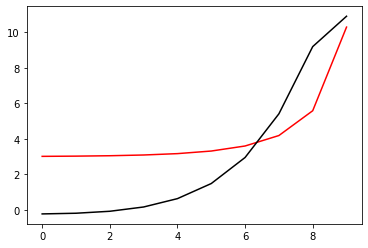

19200 96.0024165742299 -1.267538338591384
[-0.22990604 -0.19185886 -0.08089551  0.16080862  0.63198853  1.48341009
  2.95305788  5.41720293  9.20921791 10.92200576]


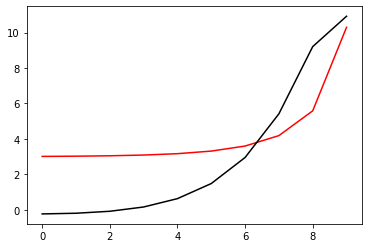

19400 96.00240933872996 -1.2675764424388856
[-0.23096451 -0.19299694 -0.08202103  0.15988793  0.63151086  1.48385637
  2.95529236  5.422434    9.21910652 10.93289337]


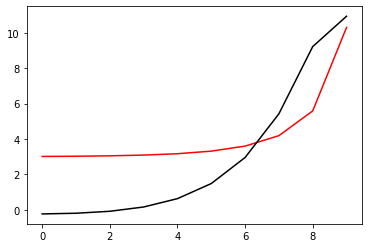

19600 96.0024030258102 -1.2676183864417145
[-0.23205628 -0.19416758 -0.0831804   0.15893092  0.63098323  1.48422427
  2.95739983  5.42745673  9.22874832 10.94303641]


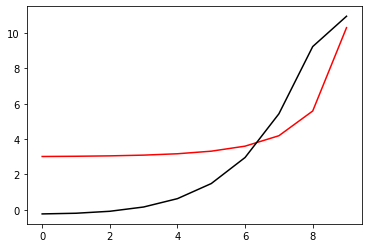

19800 96.00239755492244 -1.2676645337922696
[-0.23318277 -0.19537186 -0.08437492  0.15793519  0.63040012  1.48450177
  2.95935653  5.43222832  9.238082   10.95230904]


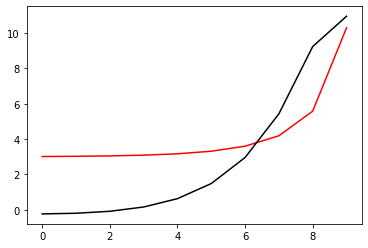

20000 96.00239283318416 -1.2677152787886585
[-0.2343461  -0.19661154 -0.08560658  0.15689765  0.62975545  1.4846765
  2.96113881  5.43670694  9.24704881 10.96058819]


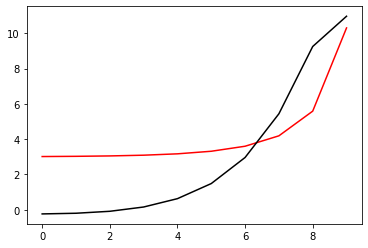

In [90]:
optimizer=tf.optimizers.Adam(learning_rate=0.001)
for i in range (1, 20001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2).numpy(), m2_2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 96.00227800971876 -1.2743019404206624
[-0.32688945 -0.2891033  -0.17828659  0.06346736  0.53220493  1.38405476
  2.87425756  5.38438589  9.25563269 10.86777546]


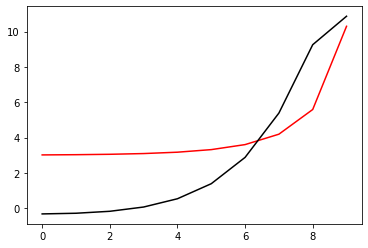

400 96.0022532177262 -1.2763908040998786
[-0.36105469 -0.32146359 -0.2071317   0.03944019  0.51160985  1.36072104
  2.83358651  5.32639925  9.23732153 10.80965127]


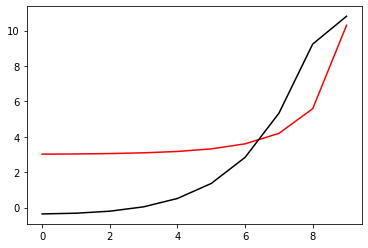

600 96.00225309369144 -1.276405286991904
[-0.36429072 -0.32358186 -0.2068171   0.04323744  0.51891694  1.36953147
  2.83862833  5.31893863  9.23950384 10.79619374]


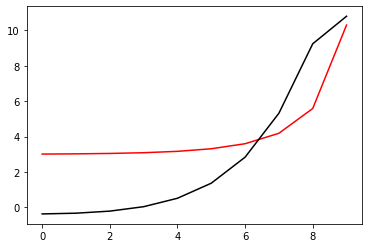

800 96.0022530852124 -1.2764094736309042
[-0.36518705 -0.32419154 -0.20679697  0.04418459  0.52088085  1.37217203
  2.8408326   5.31817577  9.23795289 10.79207844]


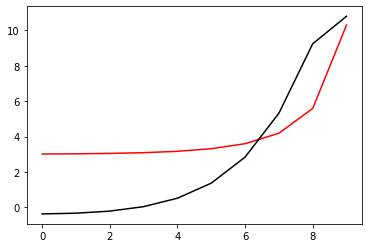

1000 96.00225308463237 -1.2764105252197178
[-0.36539916 -0.32434454 -0.20681577  0.04437624  0.5213342   1.37287207
  2.84161463  5.31842471  9.23660059 10.79122867]


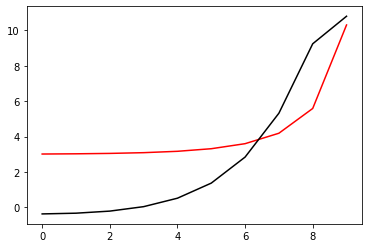

1200 96.00225308458073 -1.2764107984707385
[-0.3654516  -0.32438419 -0.20682522  0.0444174   0.52144527  1.3730628
  2.84186179  5.31856066  9.23600158 10.79111429]


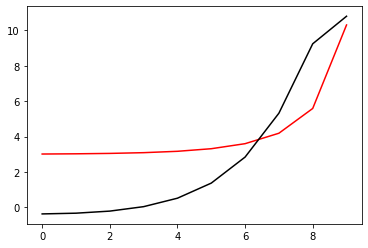

1400 96.00225308457681 -1.2764108699657157
[-0.36546504 -0.32439454 -0.2068281   0.04442743  0.5214739   1.37311385
  2.84193043  5.31860005  9.23581189 10.79110632]


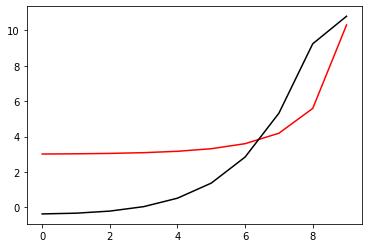

1600 96.00225308457661 -1.276410886467621
[-0.36546813 -0.32439693 -0.20682878  0.04442972  0.52148051  1.37312571
  2.84194643  5.31860899  9.23576569 10.79110669]


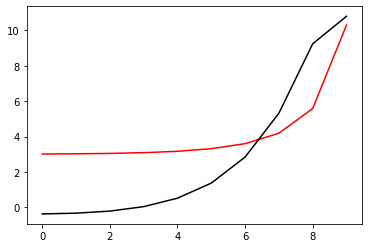

1800 96.0022530845766 -1.2764108895520854
[-0.36546871 -0.32439737 -0.20682891  0.04443015  0.52148175  1.37312793
  2.84194942  5.31861064  9.23575694 10.79110689]


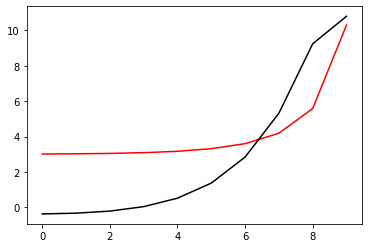

2000 96.00225308457657 -1.2764108899991262
[-0.36546879 -0.32439744 -0.20682892  0.04443021  0.52148193  1.37312826
  2.84194985  5.31861088  9.23575566 10.79110692]


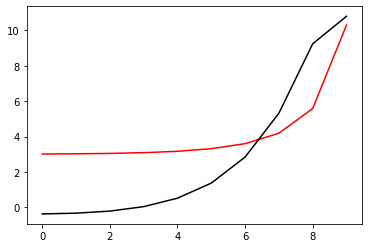

2200 96.00225308457658 -1.276410890047753
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


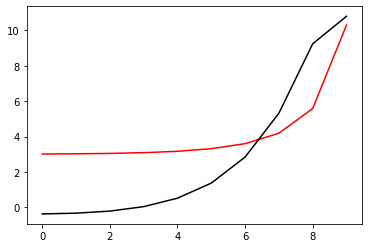

2400 96.0022530845766 -1.2764108900515947
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


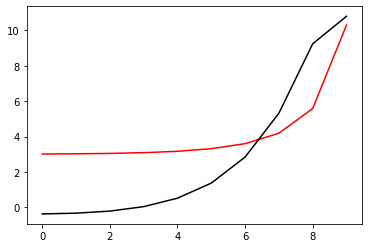

2600 96.0022530845766 -1.2764108900518096
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


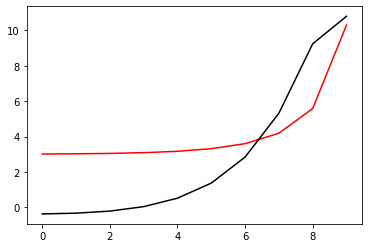

2800 96.0022530845766 -1.2764108900518296
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


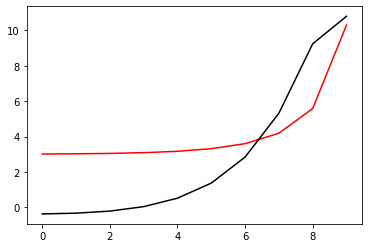

3000 96.0022530845766 -1.2764108900518054
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


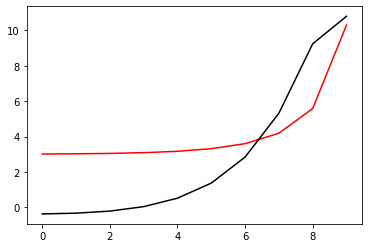

3200 96.0022530845766 -1.2764108900518156
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


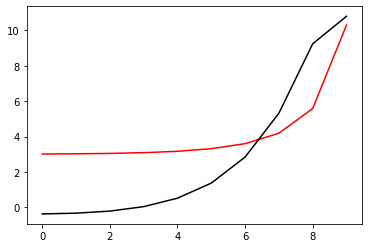

3400 96.0022530845766 -1.276410890051756
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


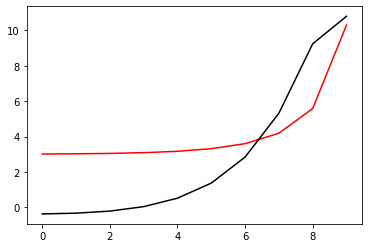

3600 96.00225308457658 -1.2764108900510456
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


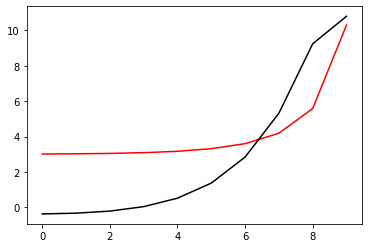

3800 96.00225308457658 -1.276410879670002
[-0.36546872 -0.32439739 -0.20682895  0.04443006  0.52148158  1.37312766
  2.84194915  5.31861071  9.23575735 10.79110682]


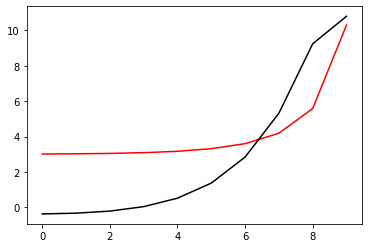

4000 96.00225308457658 -1.2764108900565216
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


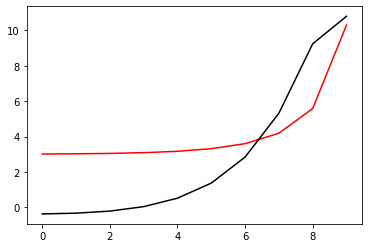

4200 96.0022530845766 -1.2764108900519118
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


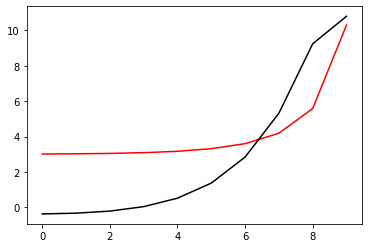

4400 96.0022530845772 -1.2764110274859446
[-0.36546775 -0.32439636 -0.2068279   0.04443121  0.52148273  1.37312874
  2.84194944  5.31860998  9.23575936 10.7911062 ]


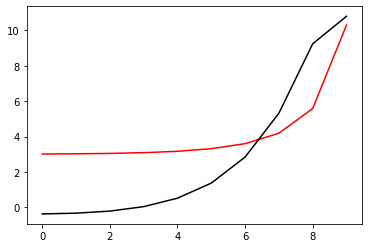

4600 96.0022530845766 -1.2764108900277278
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


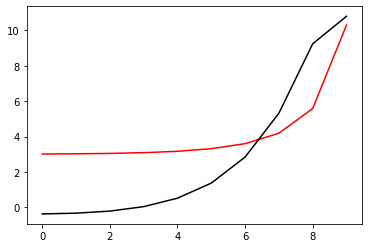

4800 96.0022530845766 -1.2764108900518045
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


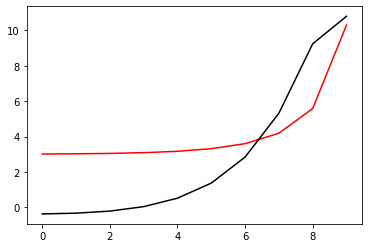

5000 96.00225310138676 -1.2763819853504186
[-0.36549419 -0.32442512 -0.20686242  0.04438747  0.52142554  1.37306027
  2.84189247  5.31860549  9.23580912 10.79111223]


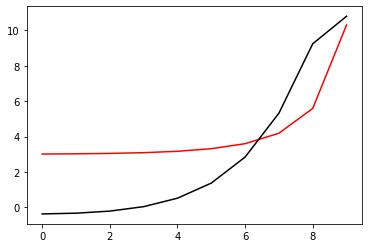

5200 96.0022530845766 -1.276410890528127
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.31861091  9.23575551 10.79110693]


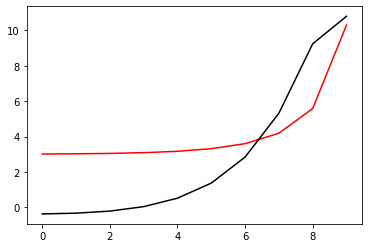

5400 96.0022530845766 -1.2764108900517852
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


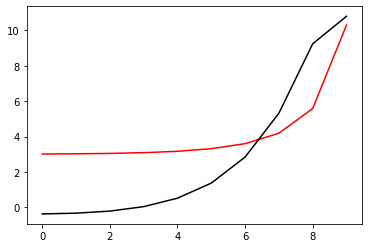

5600 96.00225308457658 -1.276410890053326
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


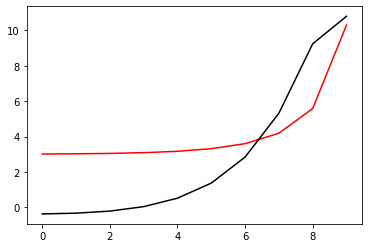

5800 96.0022530845766 -1.2764109153359477
[-0.36546877 -0.32439745 -0.20682898  0.04443011  0.5214818   1.37312814
  2.84194982  5.31861095  9.2357557  10.79110695]


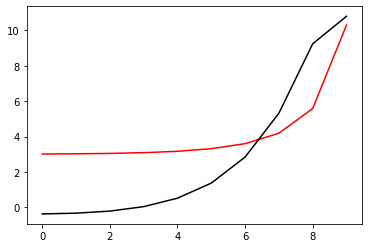

6000 96.00225308457658 -1.2764108900527165
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


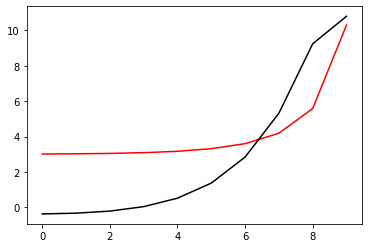

6200 96.0022530845766 -1.2764108900518503
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


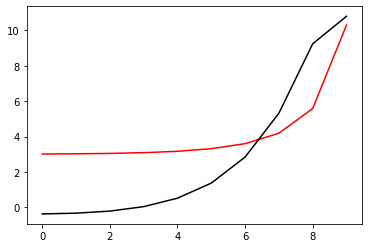

6400 96.00225340098196 -1.2762843080327309
[-0.36556778 -0.3245182  -0.20697102  0.04426617  0.52130684  1.37296203
  2.84183701  5.3185565   9.23573246 10.79109089]


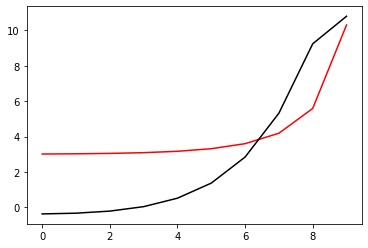

6600 96.00225308457658 -1.2764108932373195
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


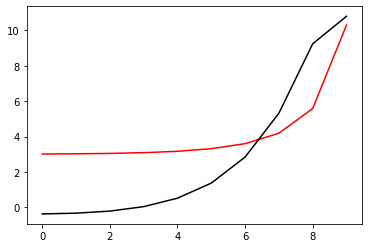

6800 96.0022530845766 -1.276410890051635
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


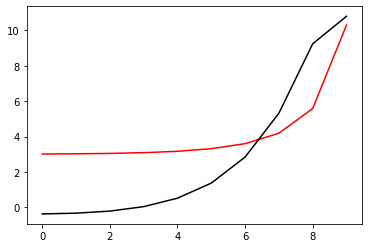

7000 96.0022530845766 -1.276410890059007
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


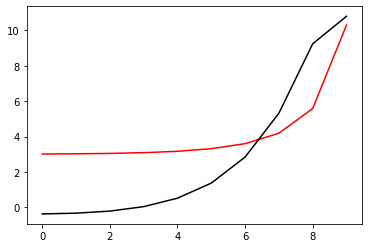

7200 96.00225308457676 -1.2764107891082113
[-0.36546885 -0.32439747 -0.20682891  0.04443029  0.52148207  1.37312842
  2.84194999  5.31861089  9.23575538 10.79110689]


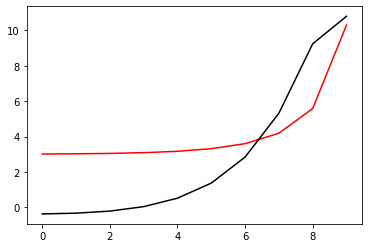

7400 96.00225308457658 -1.2764108900497024
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


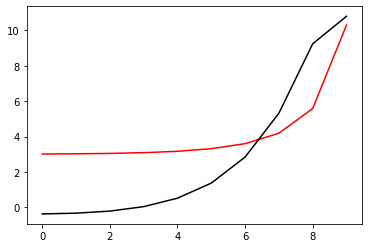

7600 96.0022530845766 -1.2764108900517803
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


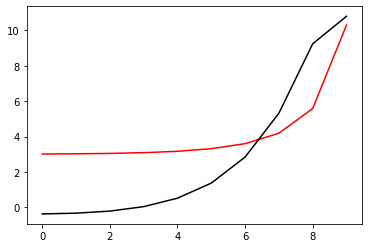

7800 96.00225405764775 -1.2761845427734073
[-0.36558746 -0.32451025 -0.2069362   0.04432684  0.52138137  1.37302943
  2.84185598  5.31852673  9.23568166 10.79104859]


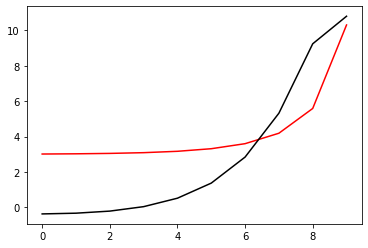

8000 96.0022530845766 -1.2764108819440523
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.31861091  9.23575549 10.79110693]


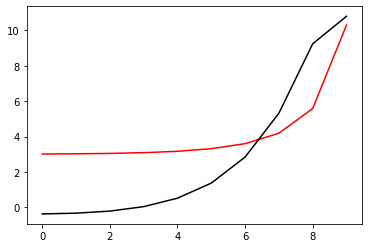

8200 96.0022530845766 -1.2764108900516622
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


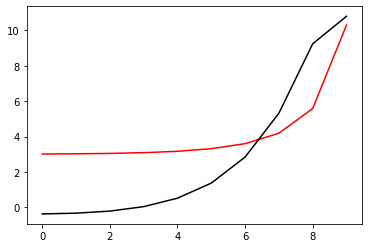

8400 96.0022530845766 -1.2764108900517486
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


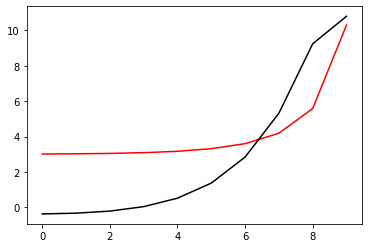

8600 96.00225308468605 -1.2764086009166824
[-0.36547201 -0.32440081 -0.20683248  0.04442629  0.52147746  1.37312308
  2.84194326  5.3186046   9.23575872 10.79110458]


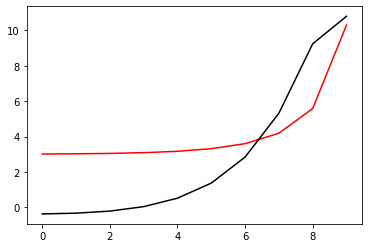

8800 96.0022530845766 -1.2764108900842117
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


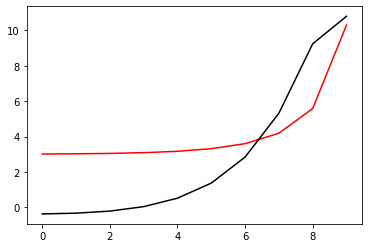

9000 96.0022530845766 -1.2764108900518467
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


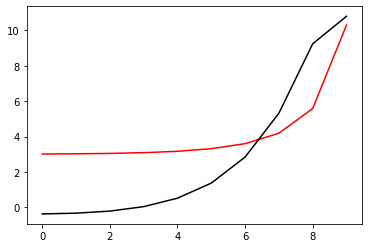

9200 96.00225346904718 -1.2762698339054341
[-0.36557253 -0.32449873 -0.20692772  0.04433362  0.52138743  1.37303599
  2.84186168  5.3185304   9.23568552 10.79104896]


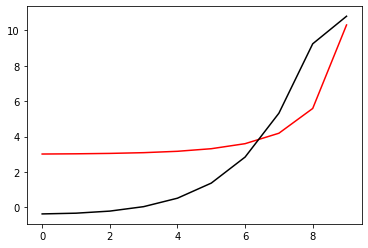

9400 96.00225308457658 -1.2764108828487362
[-0.36546881 -0.32439746 -0.20682894  0.04443021  0.52148194  1.37312829
  2.8419499   5.3186109   9.2357555  10.79110692]


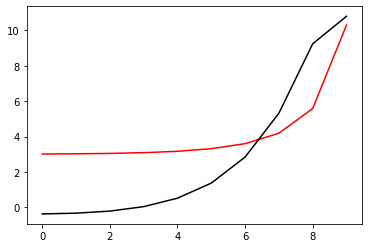

9600 96.0022530845766 -1.2764108900516473
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


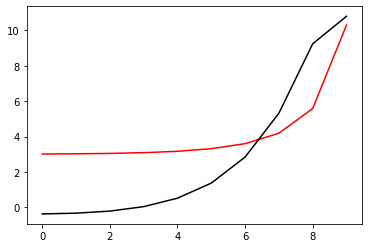

9800 96.0022530845766 -1.276410890051974
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


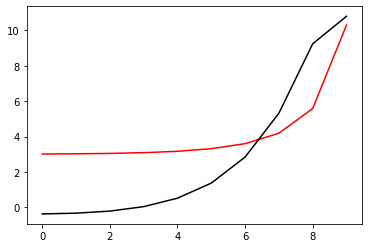

10000 96.00225308457796 -1.276411147458014
[-0.36546844 -0.32439707 -0.20682857  0.04443064  0.52148252  1.37312903
  2.84195069  5.31861138  9.235755   10.79110729]


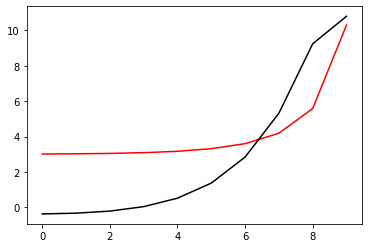

10200 96.0022530845766 -1.276410890033369
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


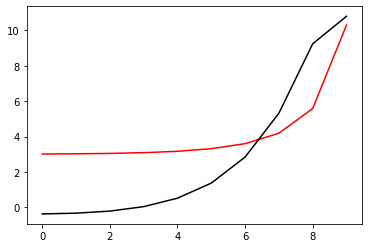

10400 96.0022530845766 -1.2764108900518527
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


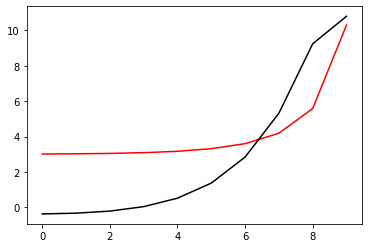

10600 96.0022530885611 -1.276423029244272
[-0.36539203 -0.32432525 -0.20676932  0.04446491  0.52148307  1.37310787
  2.84193913  5.31865656  9.23589714 10.7911103 ]


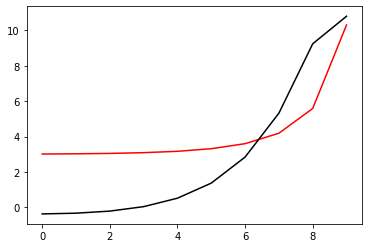

10800 96.00225308457661 -1.2764108908607281
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.31861091  9.23575552 10.79110693]


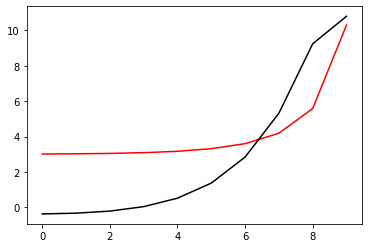

11000 96.0022530845766 -1.2764108900517244
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


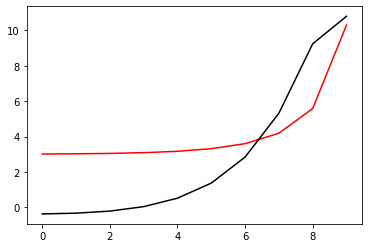

11200 96.00225308457658 -1.2764108900498845
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


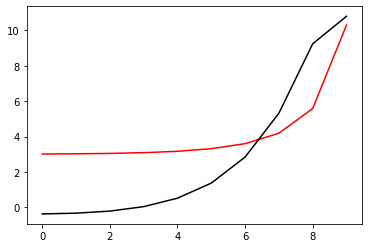

11400 96.00225308457658 -1.276410915032529
[-0.36546892 -0.32439755 -0.20682902  0.04443014  0.52148187  1.37312819
  2.84194976  5.31861067  9.23575515 10.79110654]


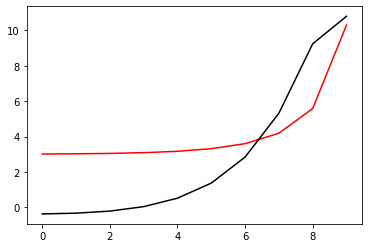

11600 96.0022530845766 -1.2764108900583875
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


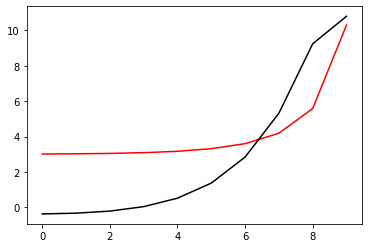

11800 96.0022530845766 -1.2764108900517872
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


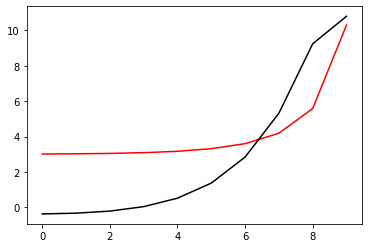

12000 96.00225308605056 -1.2764195248633783
[-0.36546273 -0.32439105 -0.20682176  0.04443875  0.52149241  1.37314118
  2.84196331  5.31861958  9.23572284 10.79109507]


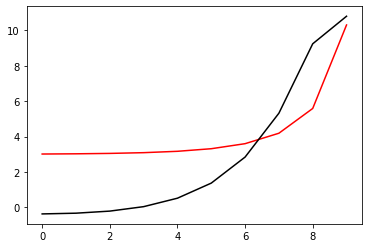

12200 96.00225308457658 -1.2764108903206424
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


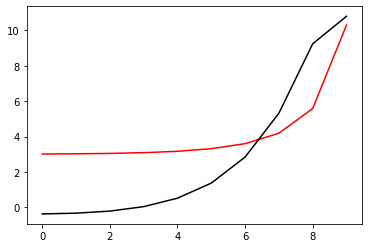

12400 96.0022530845766 -1.2764108900518236
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


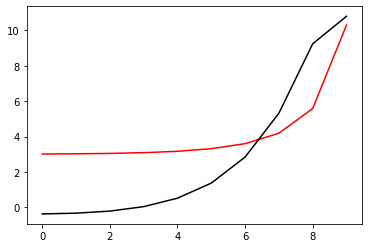

12600 96.0022533091556 -1.2765177439034712
[-0.36538006 -0.32434262 -0.2068086   0.04442146  0.52145579  1.37310388
  2.84195069  5.31865209  9.2358225  10.79117311]


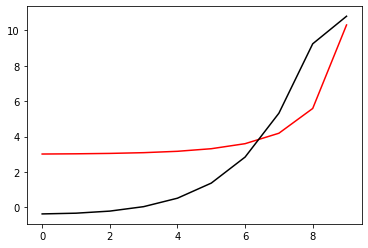

12800 96.0022530845766 -1.2764108858219803
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148194  1.37312828
  2.84194989  5.31861089  9.23575551 10.79110692]


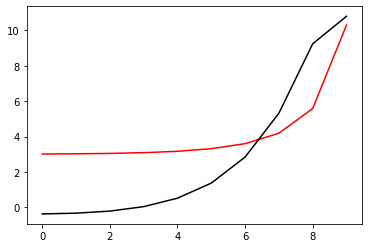

13000 96.0022530845766 -1.2764108900519666
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


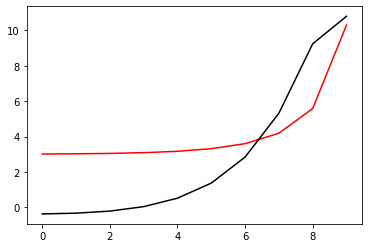

13200 96.0022530845766 -1.2764108900518563
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


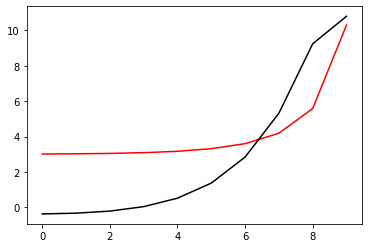

13400 96.00225308458289 -1.2764103208656623
[-0.36546926 -0.32439785 -0.2068292   0.0444301   0.52148197  1.37312835
  2.84194985  5.31861052  9.23575473 10.79110654]


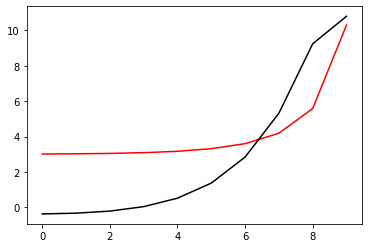

13600 96.00225308457658 -1.2764108900625917
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


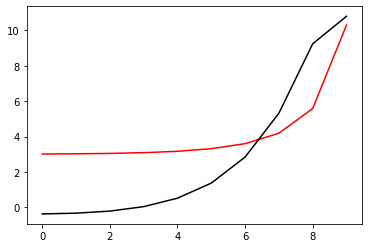

13800 96.0022530845766 -1.2764108900518416
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


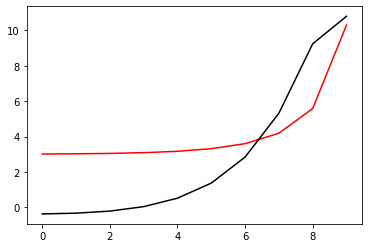

14000 96.0022530846828 -1.2764131987421024
[-0.36546659 -0.32439525 -0.20682675  0.04443236  0.52148405  1.37313033
  2.84195184  5.31861267  9.23575703 10.7911083 ]


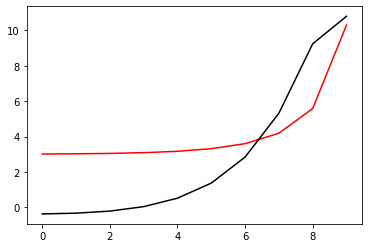

14200 96.0022530845766 -1.276410892974096
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575548 10.79110692]


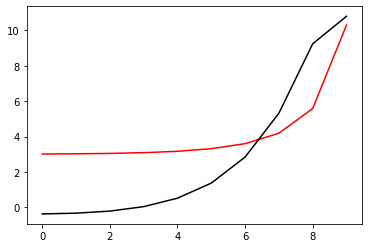

14400 96.0022530845766 -1.2764108900521565
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


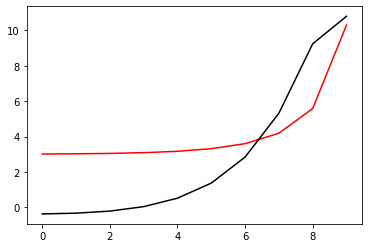

14600 96.00225308457658 -1.2764108900433397
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


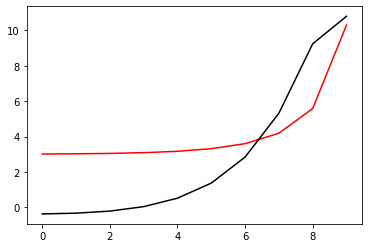

14800 96.00225308457684 -1.276411006119223
[-0.36546873 -0.3243974  -0.20682892  0.04443019  0.52148188  1.3731282
  2.8419498   5.3186108   9.23575542 10.79110672]


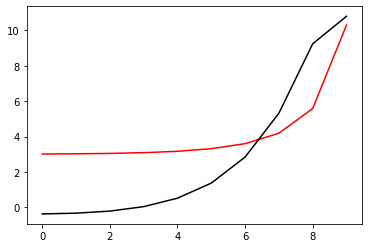

15000 96.00225308457658 -1.2764108900481053
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


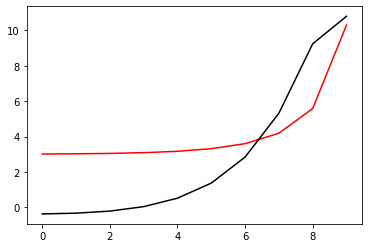

15200 96.0022530845766 -1.2764108900518056
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


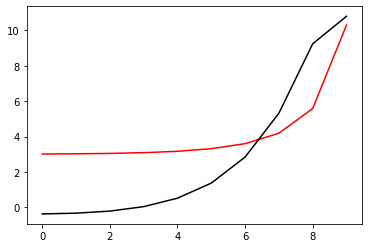

15400 96.00225308496104 -1.2764153457101888
[-0.36546628 -0.32439514 -0.20682677  0.04443225  0.521484    1.37313012
  2.84195227  5.31861197  9.23576207 10.79111259]


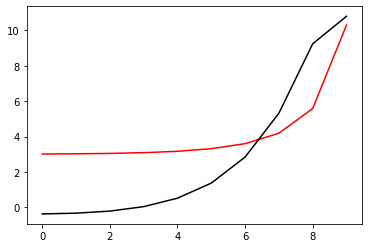

15600 96.0022530845766 -1.2764108900828515
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


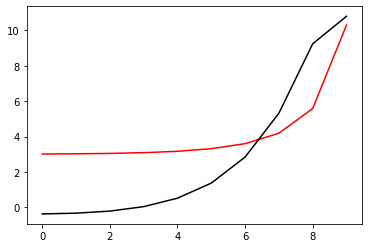

15800 96.0022530845766 -1.2764108900517535
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


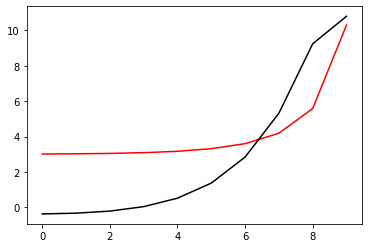

16000 96.00225308457973 -1.276410491548843
[-0.36546918 -0.32439782 -0.2068293   0.04442985  0.52148159  1.37312794
  2.84194957  5.3186106   9.23575525 10.79110669]


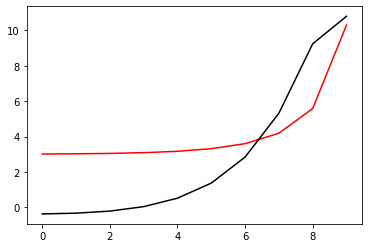

16200 96.0022530845766 -1.2764108780814138
[-0.36546882 -0.32439746 -0.20682894  0.04443021  0.52148195  1.37312829
  2.84194991  5.31861089  9.23575546 10.79110691]


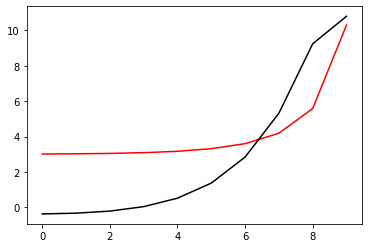

16400 96.00225308457658 -1.276410890051341
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


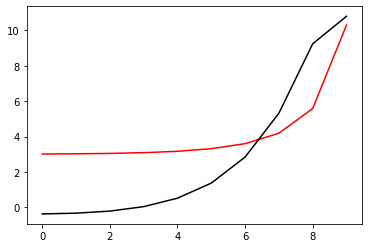

16600 96.00225308457658 -1.2764108900513047
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


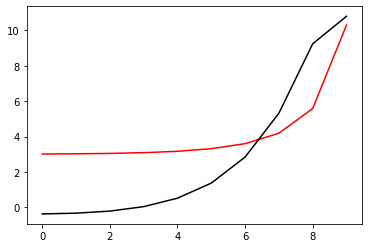

16800 96.00225308458005 -1.276410464860229
[-0.36546911 -0.3243977  -0.20682905  0.04443027  0.52148217  1.37312861
  2.84195016  5.31861081  9.23575484 10.79110694]


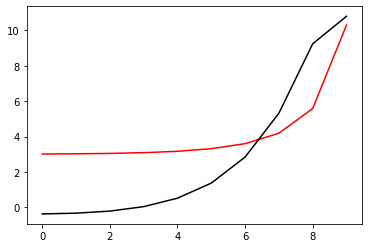

17000 96.0022530845766 -1.2764108900628168
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


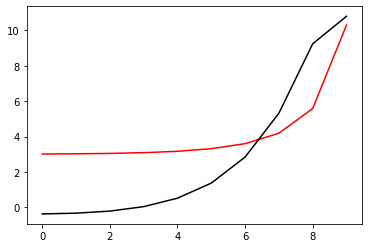

17200 96.0022530845766 -1.2764108900518663
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


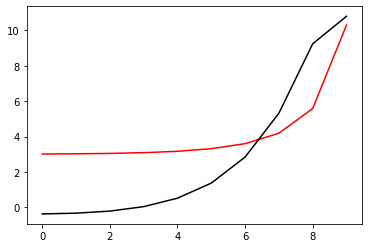

17400 96.0022530886358 -1.2763962343842445
[-0.36547638 -0.32440326 -0.20683156  0.04443203  0.52148896  1.37314158
  2.84195696  5.31860243  9.23576304 10.79113013]


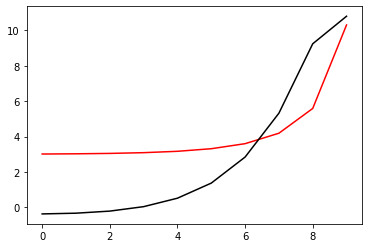

17600 96.00225308457658 -1.2764108893250208
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


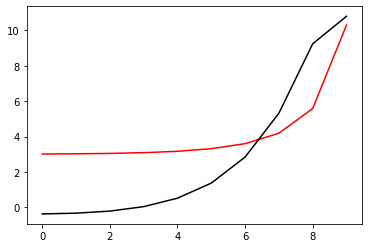

17800 96.0022530845766 -1.276410890051797
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


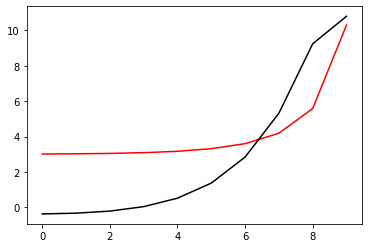

18000 96.0022530845766 -1.2764108900519682
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


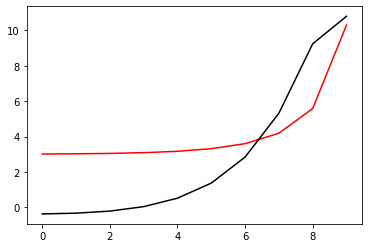

18200 96.00225308457718 -1.27641106244974
[-0.36546876 -0.32439738 -0.20682877  0.04443055  0.52148251  1.37312902
  2.84195061  5.31861125  9.23575523 10.79110768]


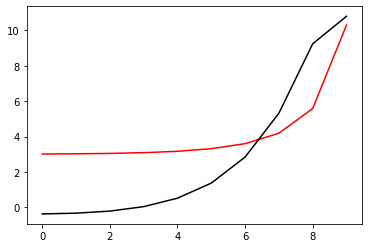

18400 96.00225308457657 -1.276410890041991
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


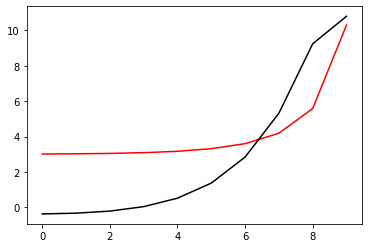

18600 96.0022530845766 -1.2764108900518771
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


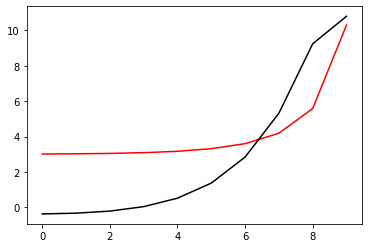

18800 96.00225309885938 -1.2763844113561174
[-0.36550324 -0.3244321  -0.20686252  0.04439751  0.52145092  1.37309283
  2.84190085  5.31856331  9.23576479 10.79108756]


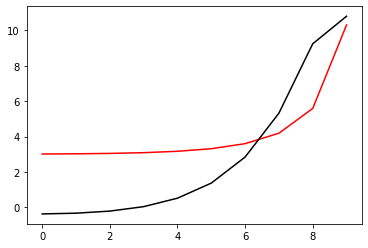

19000 96.0022530845766 -1.276410890452426
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


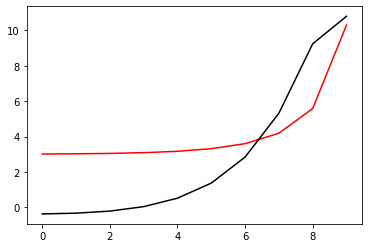

19200 96.0022530845766 -1.2764108900518099
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


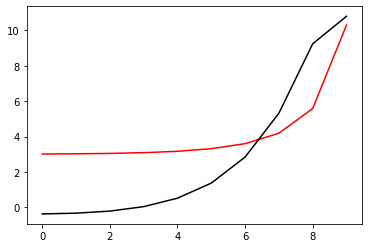

19400 96.00225308457658 -1.2764108899505457
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


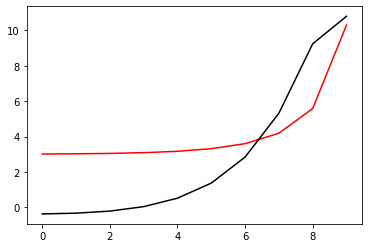

19600 96.00225308457661 -1.2764108681371893
[-0.36546883 -0.32439747 -0.20682897  0.04443015  0.52148185  1.37312818
  2.84194979  5.31861083  9.23575552 10.79110682]


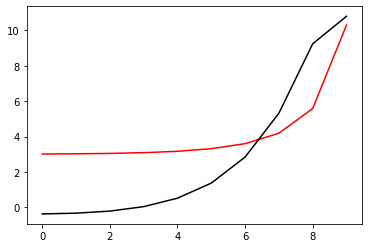

19800 96.00225308457658 -1.2764108900489197
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


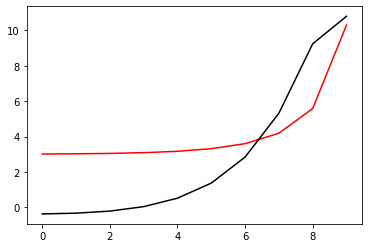

20000 96.0022530845766 -1.2764108900518187
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


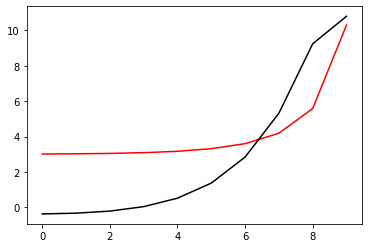

In [91]:
optimizer=tf.optimizers.Adam(learning_rate=0.00075)
for i in range (1, 20001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2).numpy(), m2_2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 96.00225308457657 -1.2764108880520157
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.31861091  9.23575553 10.79110693]


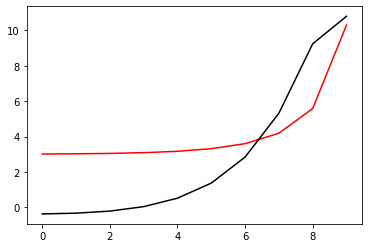

400 96.00225308457658 -1.2764108900515032
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


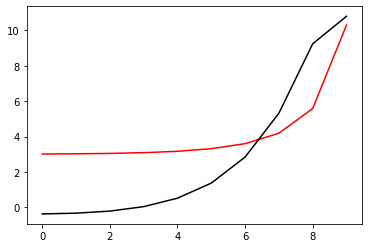

600 96.0022530845766 -1.27641089005182
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


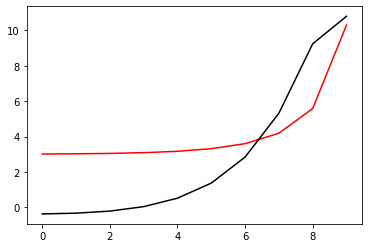

800 96.0022530845766 -1.2764108900518178
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


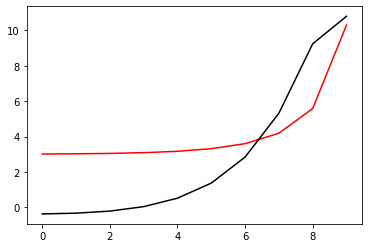

1000 96.00225308457658 -1.276410890049209
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


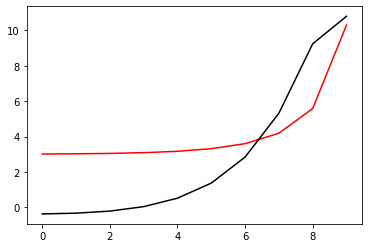

1200 96.00225308457658 -1.2764108988419882
[-0.36546876 -0.32439741 -0.20682889  0.04443025  0.52148198  1.37312832
  2.84194994  5.31861095  9.23575556 10.79110696]


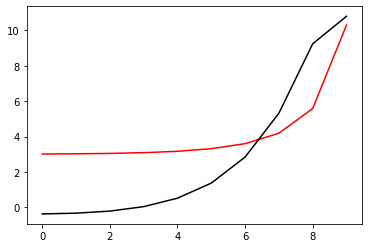

1400 96.00225308457658 -1.2764108900500843
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


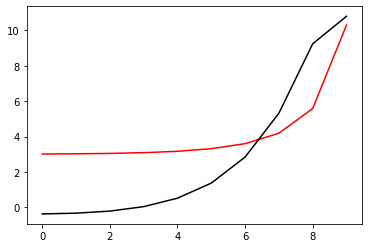

1600 96.00225308584854 -1.276402770884248
[-0.36547407 -0.32440214 -0.20683283  0.04442737  0.52148062  1.37312818
  2.84195112  5.31860786  9.23574338 10.79110413]


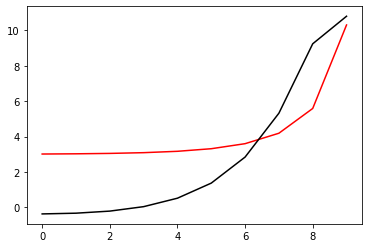

1800 96.0022530845766 -1.2764108903081832
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


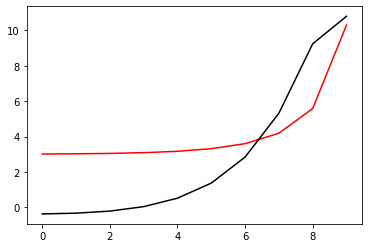

2000 96.00225308457658 -1.2764108900515232
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


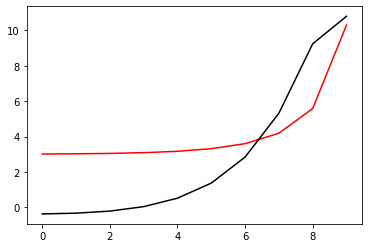

2200 96.00225308457681 -1.2764107838450724
[-0.36546891 -0.32439754 -0.20682901  0.04443015  0.5214819   1.37312824
  2.84194985  5.31861084  9.23575544 10.79110688]


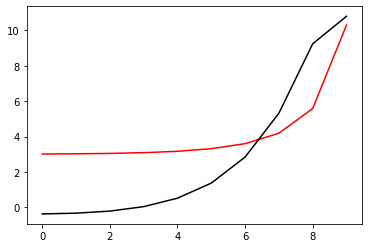

2400 96.00225308457658 -1.276410890055971
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


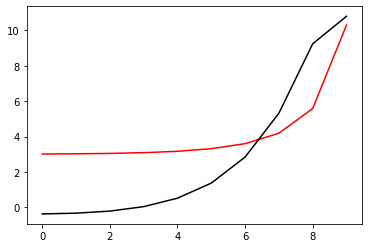

2600 96.0022530845766 -1.276410893680962
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


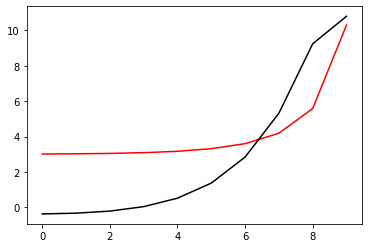

2800 96.0022530845766 -1.2764108757929478
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148195  1.37312829
  2.8419499   5.31861089  9.23575551 10.79110692]


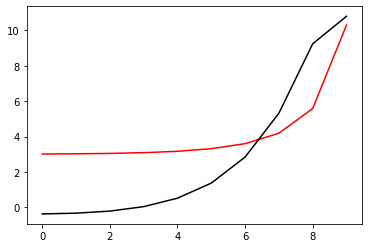

3000 96.0022530845766 -1.276410890052303
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


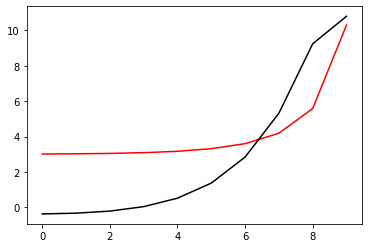

3200 96.00225342097849 -1.2765369253967802
[-0.36528753 -0.32421497 -0.20664599  0.04461193  0.52165959  1.37329708
  2.84210221  5.31873701  9.23584971 10.79118044]


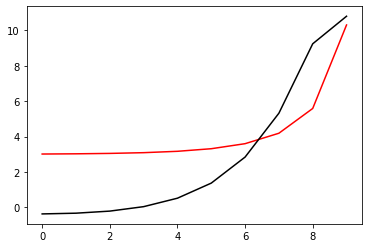

3400 96.00225308457658 -1.2764108924460729
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


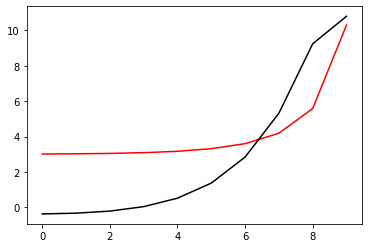

3600 96.0022530845766 -1.2764108900519666
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


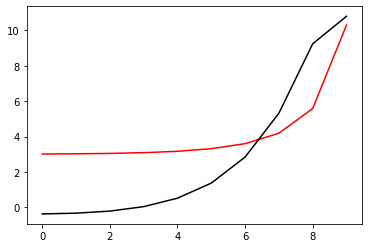

3800 96.00225308564136 -1.2764176492802009
[-0.36544809 -0.3243762  -0.20680828  0.04444979  0.52149802  1.37313776
  2.84195706  5.31863061  9.23580981 10.79112801]


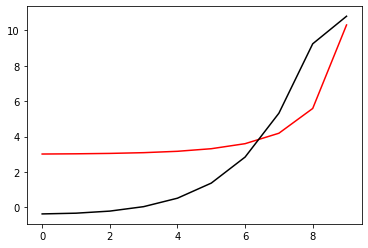

4000 96.00225308457658 -1.2764108895059032
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


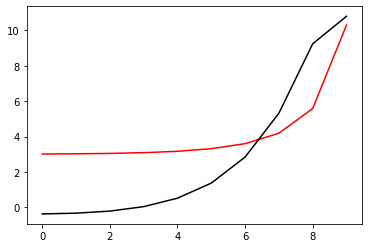

4200 96.0022530845766 -1.2764108900518407
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


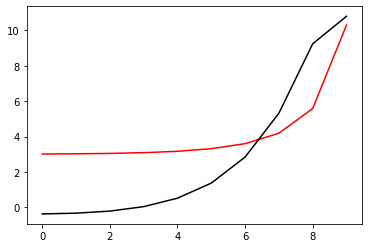

4400 96.00225308459876 -1.2764098695215502
[-0.36547046 -0.32439921 -0.20683079  0.04442817  0.5214797   1.37312578
  2.84194693  5.3186083   9.2357566  10.79110584]


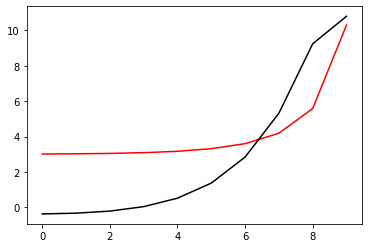

4600 96.00225308457658 -1.2764108901063533
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


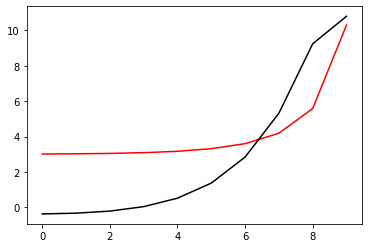

4800 96.00225308457658 -1.2764108900745381
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


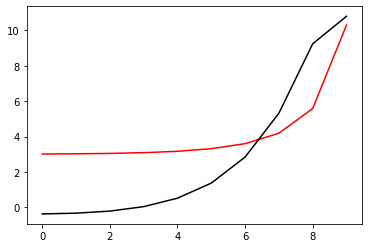

5000 96.0022530845766 -1.2764108776993288
[-0.36546881 -0.32439745 -0.20682894  0.04443019  0.52148191  1.37312825
  2.84194988  5.3186109   9.23575555 10.79110694]


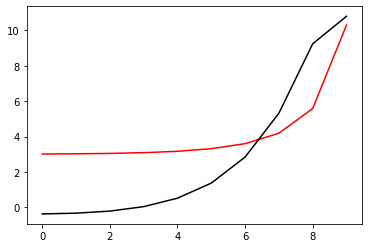

5200 96.00225308457658 -1.2764108900533895
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


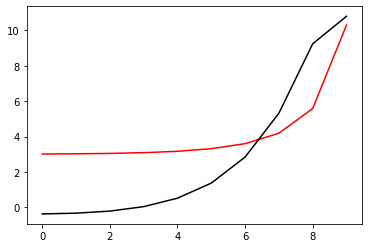

5400 96.00225310297104 -1.2764411397718944
[-0.36543793 -0.32436677 -0.20679856  0.04446008  0.52151099  1.37315597
  2.84197532  5.31863284  9.23577313 10.79112205]


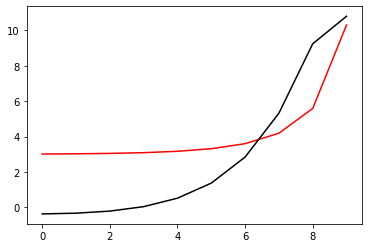

5600 96.00225308457657 -1.2764108852832188
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


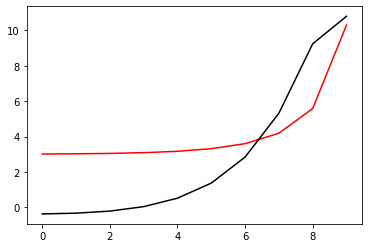

5800 96.0022530845766 -1.2764108900519286
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


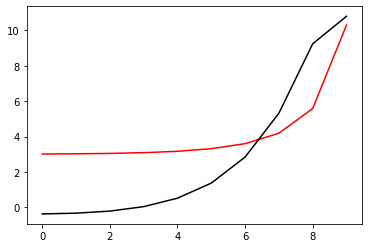

6000 96.00225312162654 -1.2763664705531999
[-0.36546679 -0.32439886 -0.20684173  0.0444051   0.52144886  1.3730949
  2.84192629  5.3186058   9.23576563 10.79109535]


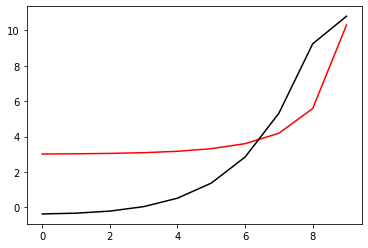

6200 96.00225308457658 -1.2764108902106632
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


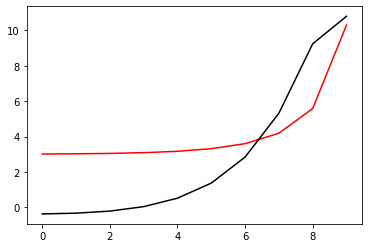

6400 96.0022530845766 -1.2764108900518152
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


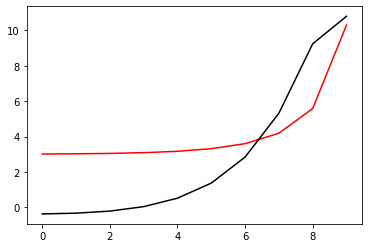

6600 96.0022530846727 -1.2764130747414713
[-0.36546656 -0.32439518 -0.20682657  0.04443267  0.52148466  1.37313128
  2.84195331  5.31861434  9.23575404 10.79110797]


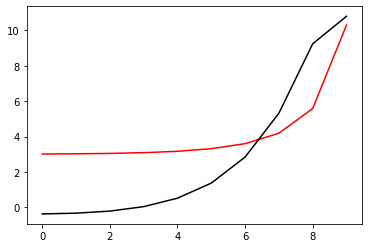

6800 96.00225308457657 -1.2764108899363944
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


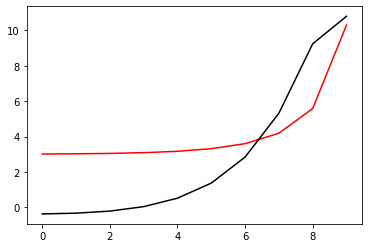

7000 96.00225308457658 -1.2764108900524755
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


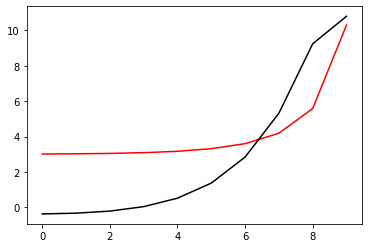

7200 96.00225308457665 -1.2764109516615842
[-0.36546883 -0.32439747 -0.20682894  0.04443022  0.52148196  1.37312831
  2.84194992  5.3186109   9.2357555  10.79110694]


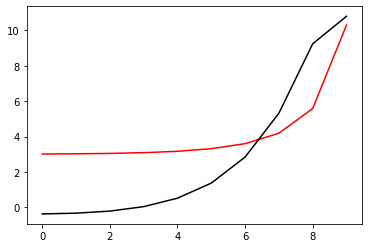

7400 96.0022530845766 -1.2764108900508555
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


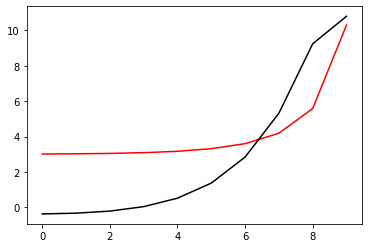

7600 96.00225308457667 -1.2764109515551323
[-0.36546874 -0.32439739 -0.20682887  0.04443028  0.52148201  1.37312835
  2.84194995  5.31861095  9.23575555 10.79110696]


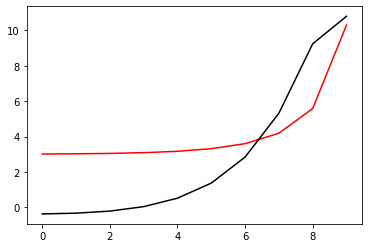

7800 96.0022530845766 -1.2764108998565442
[-0.36546879 -0.32439743 -0.20682891  0.04443023  0.52148197  1.37312831
  2.84194992  5.31861091  9.23575551 10.79110693]


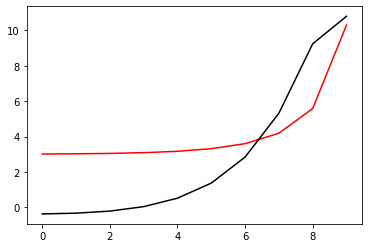

8000 96.0022530845766 -1.2764108900517643
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


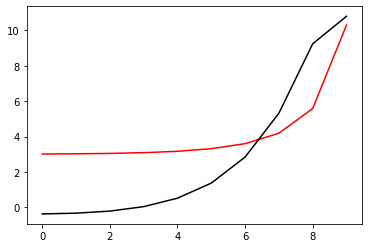

8200 96.00225342539584 -1.2765382251695703
[-0.36529917 -0.32422699 -0.20665834  0.04459945  0.52164731  1.37328555
  2.84209232  5.31872983  9.23584578 10.79117899]


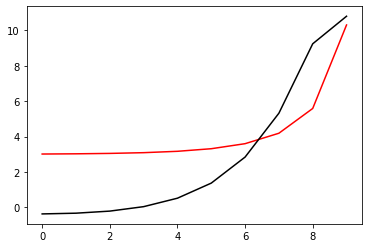

8400 96.00225308457658 -1.2764108929219404
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.3186109   9.23575552 10.79110693]


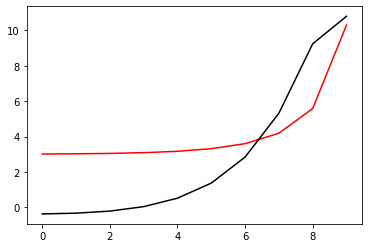

8600 96.0022530845766 -1.2764108900516733
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


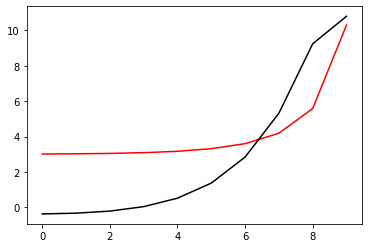

8800 96.0022530955805 -1.2764347668423954
[-0.36544342 -0.32437899 -0.20682425  0.04441808  0.52145752  1.37310105
  2.84193291  5.31861697  9.23578377 10.79110533]


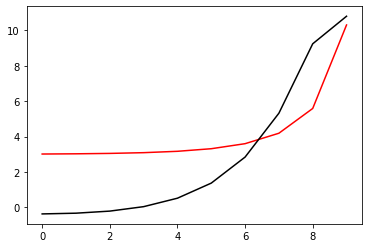

9000 96.0022530845766 -1.2764108913424068
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575552 10.79110693]


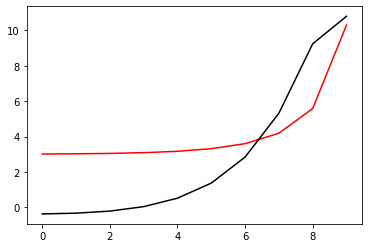

9200 96.0022530845766 -1.2764108900518594
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


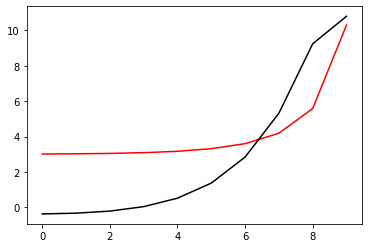

9400 96.00225308463274 -1.2764092620336984
[-0.36547189 -0.32440059 -0.20683202  0.0444274   0.52147959  1.37312699
  2.84194954  5.31861194  9.23574711 10.79110505]


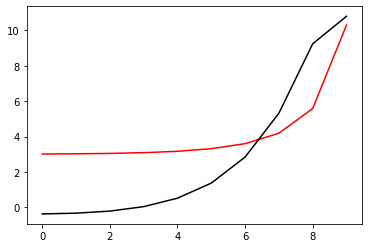

9600 96.00225308457657 -1.276410889904793
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


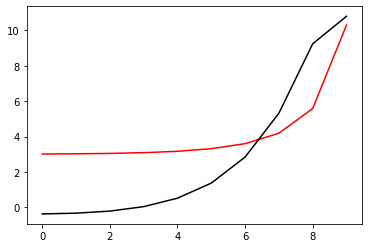

9800 96.0022530845766 -1.2764108900517428
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


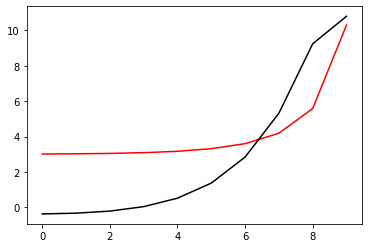

10000 96.00225308458072 -1.2764104318599274
[-0.36546917 -0.32439781 -0.20682931  0.04442986  0.52148166  1.37312812
  2.84194986  5.31861086  9.23575506 10.79110692]


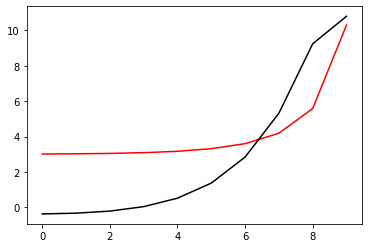

10200 96.00225308457658 -1.2764108900672093
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


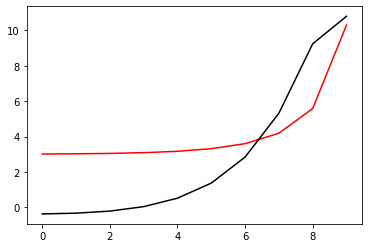

10400 96.00225308457661 -1.276410890085736
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


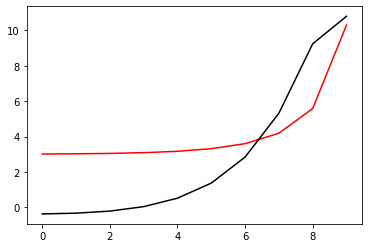

10600 96.00225308457662 -1.2764109327635638
[-0.36546873 -0.32439738 -0.20682886  0.04443027  0.52148199  1.37312833
  2.84194995  5.31861097  9.23575561 10.791107  ]


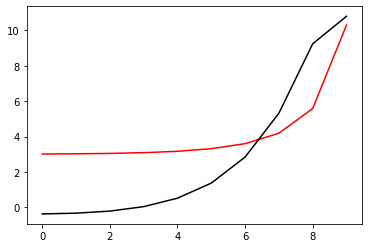

10800 96.00225308457658 -1.2764108900530822
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


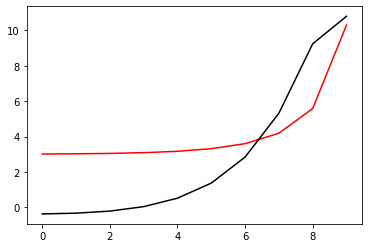

11000 96.00225309869653 -1.2764374074974372
[-0.36544189 -0.32437071 -0.20680247  0.04445622  0.52150724  1.3731524
  2.84197206  5.31863005  9.23577092 10.79112017]


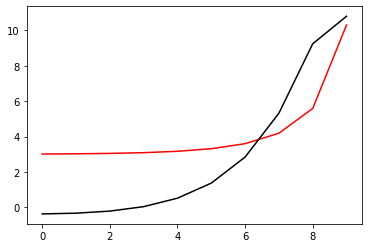

11200 96.00225308457658 -1.276410890490624
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.31861091  9.23575551 10.79110693]


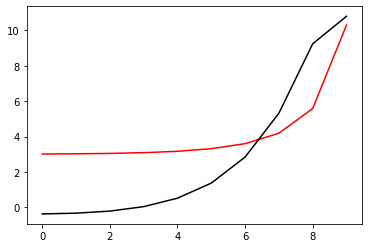

11400 96.0022530845766 -1.2764108900515958
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


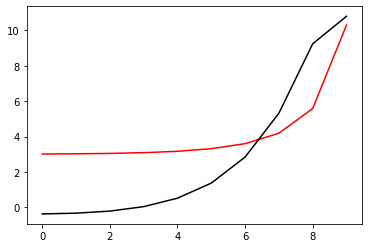

11600 96.0022531002367 -1.2764395153250532
[-0.36544391 -0.32438623 -0.20683374  0.04441253  0.52145798  1.37310873
  2.84194774  5.31863436  9.23579638 10.79114828]


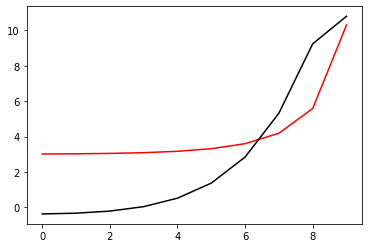

11800 96.00225308457658 -1.276410889864788
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


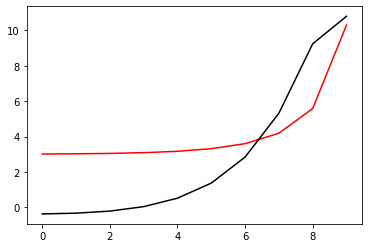

12000 96.0022530845766 -1.2764108900518896
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


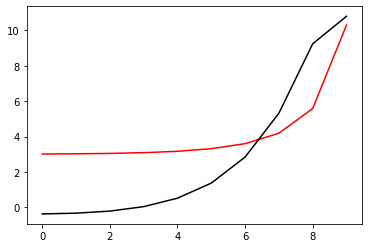

12200 96.00225310660639 -1.2763775023072612
[-0.36549957 -0.32442786 -0.20685889  0.04440087  0.52145345  1.37310106
  2.84192467  5.31858871  9.23573719 10.79109074]


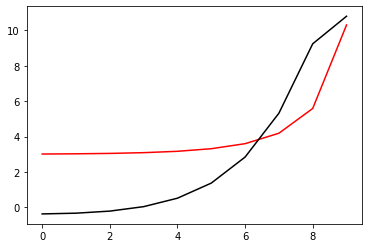

12400 96.00225308457658 -1.2764108934924385
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


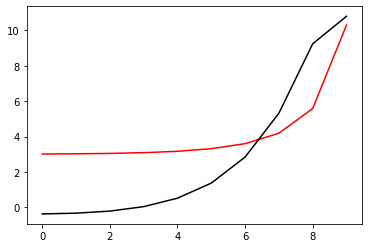

12600 96.0022530845766 -1.276410890051927
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


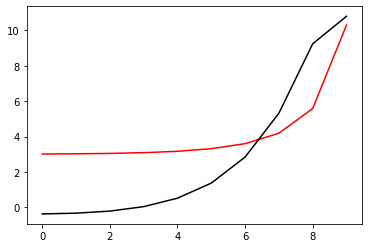

12800 96.00225313044656 -1.2764586334528518
[-0.3654085  -0.32434713 -0.20679251  0.04445515  0.52150093  1.37315025
  2.84198551  5.31866627  9.23582198 10.79116939]


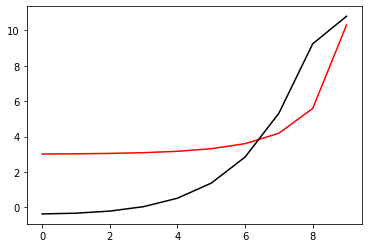

13000 96.0022530845766 -1.2764108885738765
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


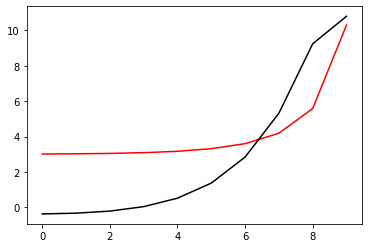

13200 96.0022530845766 -1.2764108900517595
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


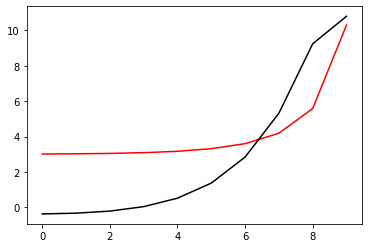

13400 96.00225308541846 -1.2764043832559075
[-0.36547551 -0.32440395 -0.20683503  0.04442479  0.52147758  1.37312543
  2.84194838  5.31860938  9.23573823 10.79110112]


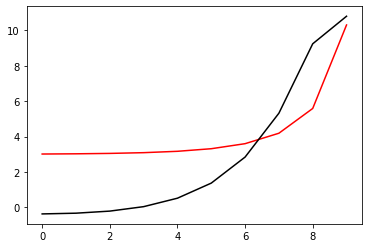

13600 96.00225308457658 -1.2764108898492825
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


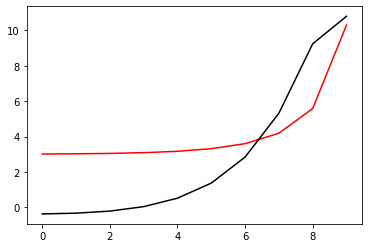

13800 96.0022530845766 -1.2764108900518407
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


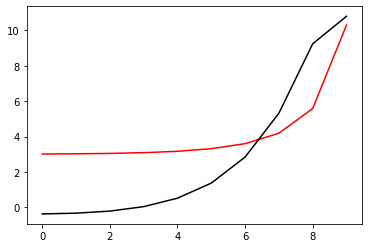

14000 96.00225308510007 -1.2764159195851694
[-0.36546211 -0.32439043 -0.20682154  0.0444382   0.52149059  1.37313793
  2.84195981  5.31862007  9.23574854 10.79110907]


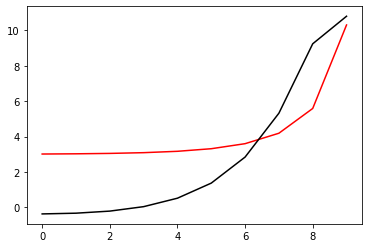

14200 96.00225308457658 -1.276410890245383
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


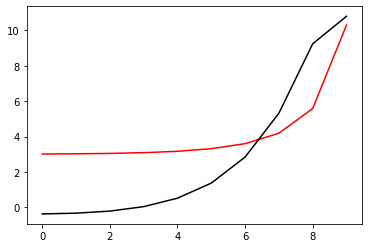

14400 96.0022530845766 -1.2764108900517752
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


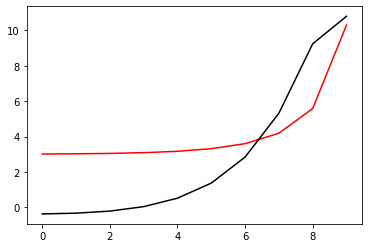

14600 96.0022530845801 -1.2764112961674245
[-0.36546795 -0.32439659 -0.20682813  0.04443091  0.52148246  1.37312845
  2.84194981  5.31861133  9.23575771 10.79110757]


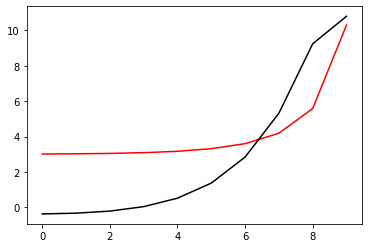

14800 96.0022530845766 -1.2764108900488311
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


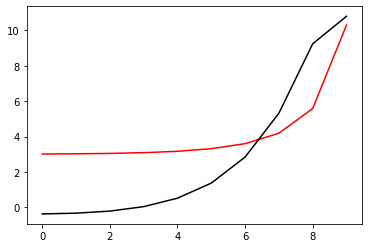

15000 96.00225308457658 -1.2764108900383495
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


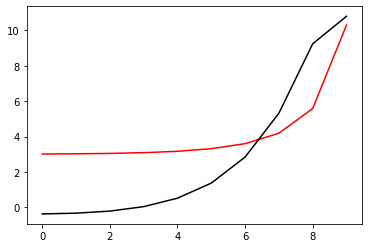

15200 96.0022530845766 -1.276410871601991
[-0.36546883 -0.32439748 -0.20682897  0.04443016  0.52148187  1.37312822
  2.84194984  5.31861087  9.23575551 10.7911069 ]


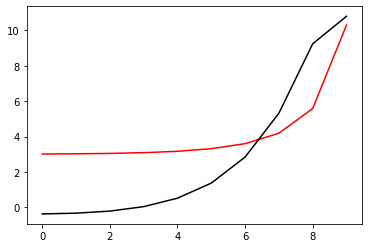

15400 96.00225308457658 -1.2764108900527429
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


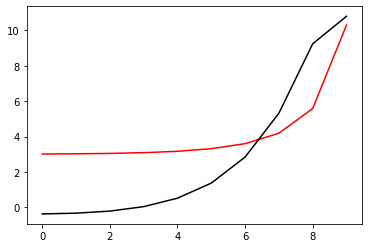

15600 96.0022530845842 -1.2764115076244882
[-0.3654682  -0.32439685 -0.20682834  0.0444308   0.52148251  1.37312883
  2.8419504   5.31861133  9.23575586 10.79110723]


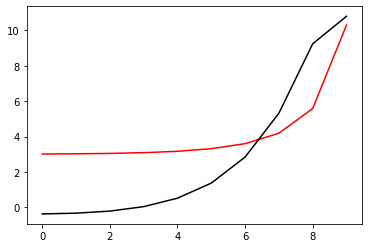

15800 96.0022530845766 -1.2764108936360605
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.2357555  10.79110693]


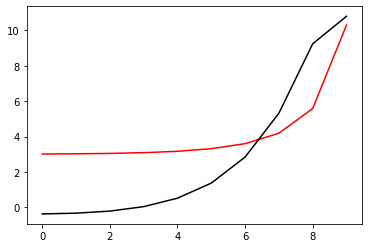

16000 96.0022530845766 -1.27641089005188
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


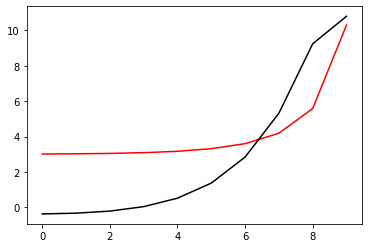

16200 96.00225308752844 -1.2764225940715392
[-0.36544435 -0.3243728  -0.20680534  0.04445217  0.5214994   1.37313856
  2.84195839  5.31863335  9.23581363 10.79112958]


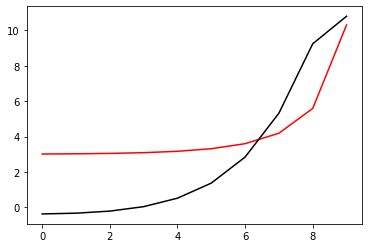

16400 96.0022530845766 -1.276410890077245
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


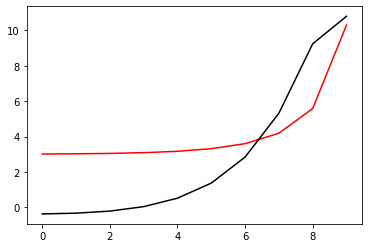

16600 96.0022530845766 -1.276410890051817
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


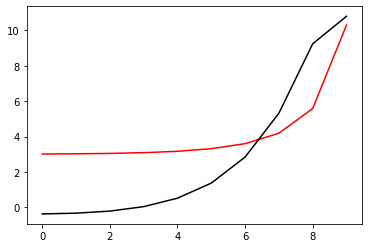

16800 96.00225308464591 -1.2764090625751234
[-0.36547171 -0.3244004  -0.20683182  0.04442748  0.52147964  1.37312665
  2.84194919  5.31861107  9.23574949 10.79110522]


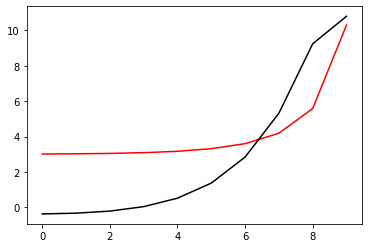

17000 96.0022530845766 -1.2764108899953412
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


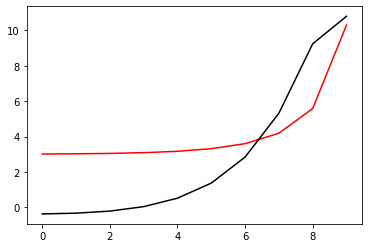

17200 96.0022530845766 -1.2764108900517994
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


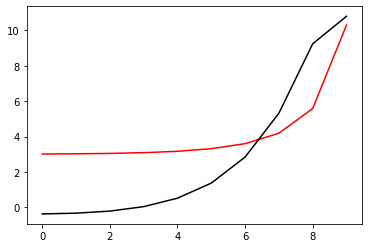

17400 96.0022530847296 -1.2764081979484057
[-0.3654736  -0.32440237 -0.20683385  0.04442552  0.5214777   1.37312512
  2.84194785  5.31861053  9.23574671 10.79110442]


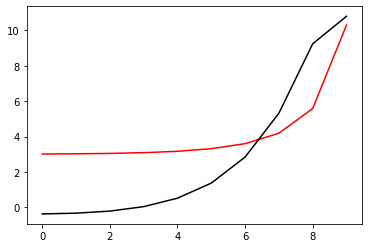

17600 96.00225308457658 -1.2764108899025806
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


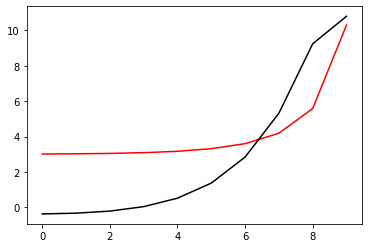

17800 96.0022530845766 -1.2764108900518045
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


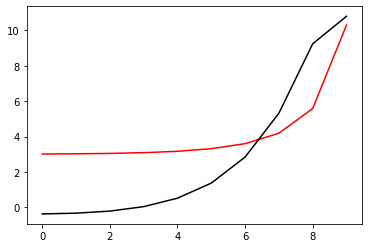

18000 96.00225308457877 -1.2764105570456394
[-0.36546909 -0.32439773 -0.20682918  0.04443002  0.52148181  1.37312821
  2.8419498   5.31861064  9.2357549  10.79110666]


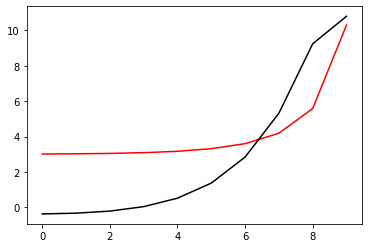

18200 96.0022530845766 -1.276410890063227
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


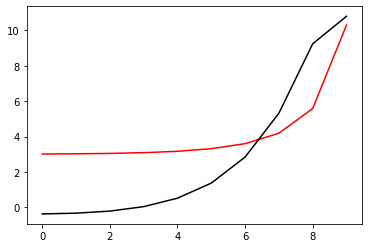

18400 96.00225308457661 -1.2764108827669784
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148194  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110692]


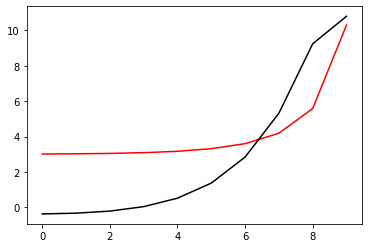

18600 96.00225308457658 -1.2764109069865843
[-0.36546878 -0.32439742 -0.2068289   0.04443024  0.52148198  1.37312832
  2.84194993  5.31861092  9.23575553 10.79110694]


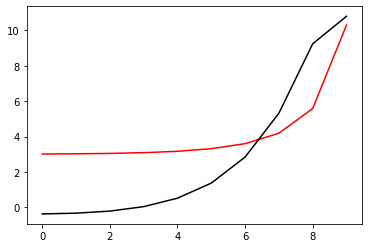

18800 96.00225308457658 -1.2764108900513083
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


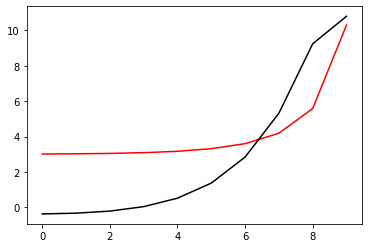

19000 96.0022531643145 -1.2763469148465127
[-0.36550437 -0.32443781 -0.20688188  0.04436317  0.52140583  1.37305238
  2.84188686  5.31857292  9.23574154 10.79107054]


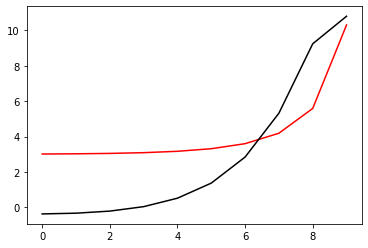

19200 96.0022530845766 -1.2764108911871754
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


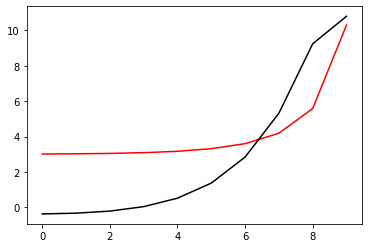

19400 96.0022530845766 -1.2764108900517974
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


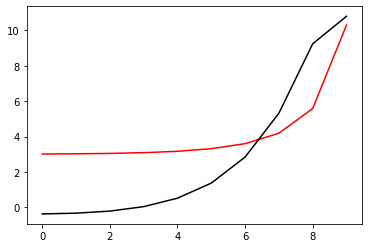

19600 96.00225308458948 -1.276411701161897
[-0.36546899 -0.32439753 -0.20682856  0.04443131  0.52148453  1.37313235
  2.84195612  5.31861453  9.23574597 10.7911096 ]


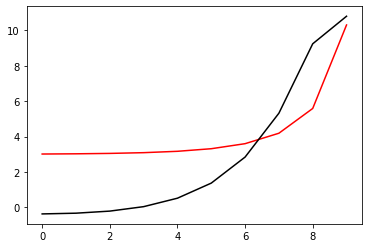

19800 96.00225308457657 -1.2764108898945719
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


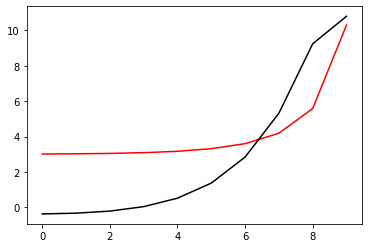

20000 96.0022530845766 -1.276410890052022
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


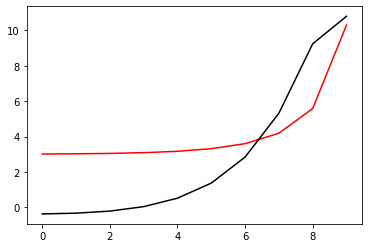

20200 96.0022530845786 -1.2764112031447885
[-0.3654684  -0.32439703 -0.20682848  0.04443072  0.52148251  1.37312887
  2.84195042  5.3186112   9.23575543 10.79110713]


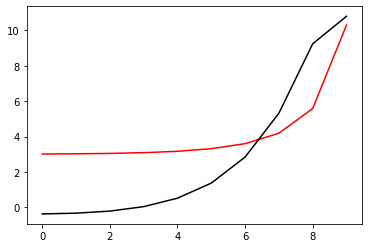

20400 96.00225308457658 -1.276410890054902
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


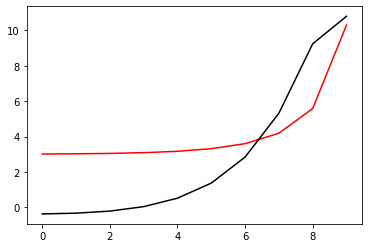

20600 96.00225308457733 -1.2764106957460726
[-0.36546899 -0.32439763 -0.20682911  0.04443004  0.52148177  1.37312812
  2.84194975  5.31861077  9.2357554  10.79110683]


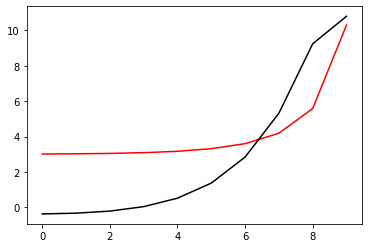

20800 96.00225308457658 -1.2764108876351192
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.2357555  10.79110693]


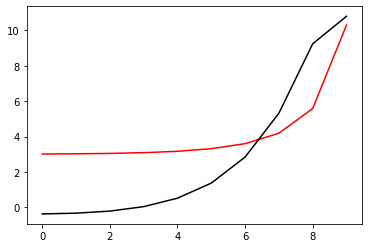

21000 96.0022530845766 -1.2764108900515958
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


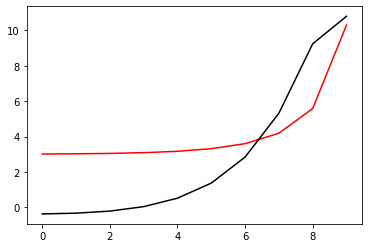

21200 96.00225308649556 -1.276400834140059
[-0.36547329 -0.32440104 -0.20683126  0.04442955  0.52148296  1.37313121
  2.84195059  5.31860724  9.23576299 10.7911132 ]


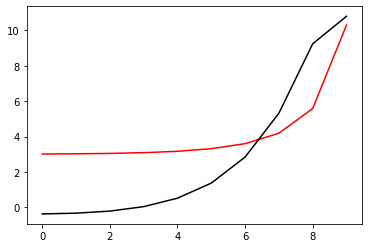

21400 96.00225308457658 -1.2764108896362287
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


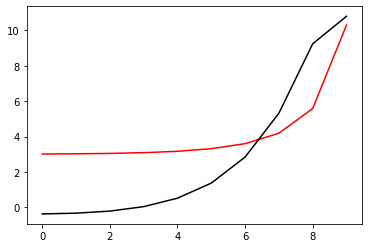

21600 96.0022530845766 -1.2764108900519013
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


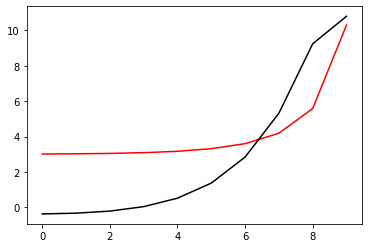

21800 96.00225308457998 -1.2764104772587548
[-0.36546909 -0.32439776 -0.2068293   0.04442971  0.5214813   1.37312735
  2.84194858  5.31861011  9.23575788 10.79110733]


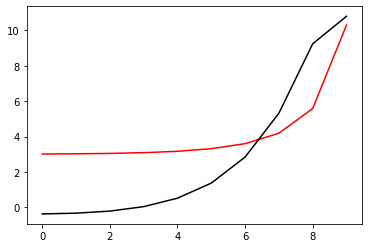

22000 96.0022530845766 -1.2764108900155935
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


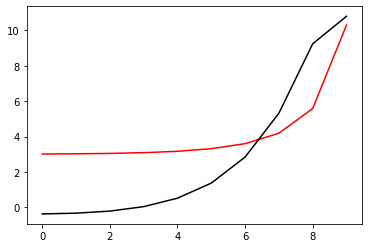

22200 96.00225308457658 -1.2764108900512319
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


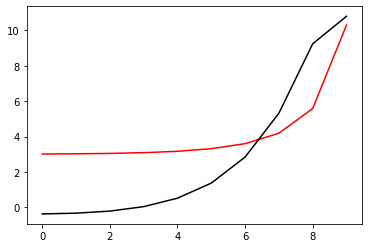

22400 96.0022530845766 -1.2764108880842704
[-0.36546876 -0.3243974  -0.20682887  0.04443029  0.52148203  1.37312837
  2.84194997  5.31861095  9.23575553 10.79110693]


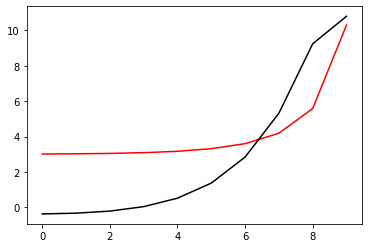

22600 96.00225308457658 -1.2764108900537747
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


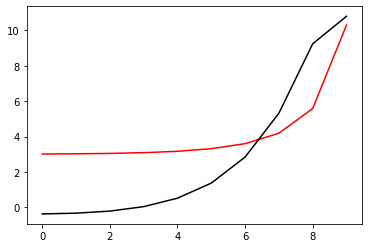

22800 96.00225308457657 -1.2764108903635083
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


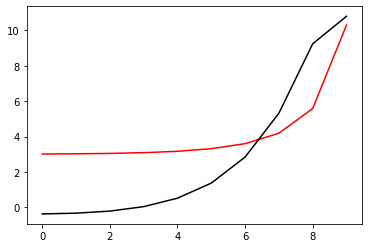

23000 96.00225308457661 -1.2764109191436748
[-0.36546876 -0.32439741 -0.20682889  0.04443026  0.52148199  1.37312832
  2.84194993  5.31861093  9.23575557 10.79110695]


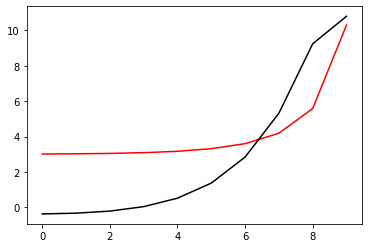

23200 96.00225308457658 -1.2764108900523885
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


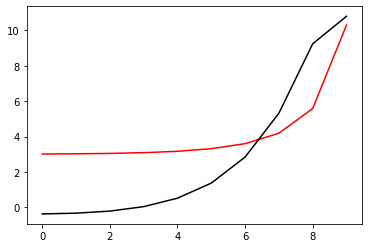

23400 96.0022532531963 -1.276502838241889
[-0.36538799 -0.32432949 -0.20677383  0.04447413  0.52151847  1.37316349
  2.84199045  5.31865924  9.2358044  10.79114796]


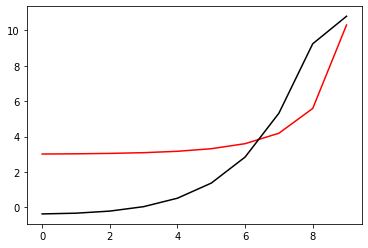

23600 96.00225308457657 -1.2764108882345064
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


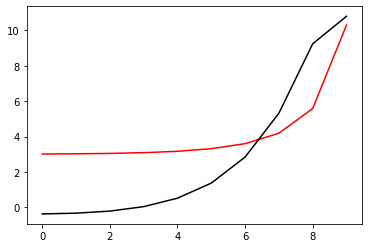

23800 96.0022530845766 -1.2764108900519868
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


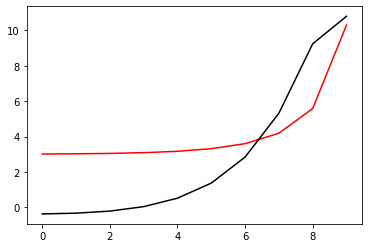

24000 96.00225308568275 -1.276418521152095
[-0.36546713 -0.32439604 -0.20682742  0.04443249  0.52148494  1.3731326
  2.84195296  5.31860688  9.23575296 10.79110761]


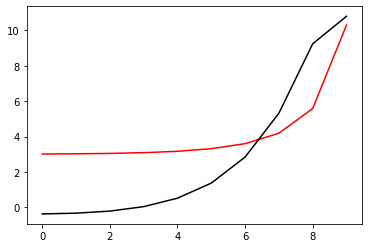

24200 96.00225308457658 -1.2764108901016393
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


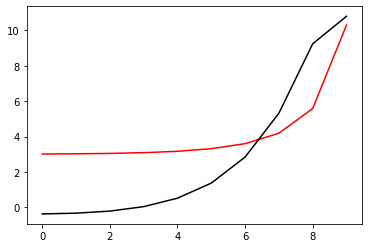

24400 96.0022530845766 -1.2764108900517241
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


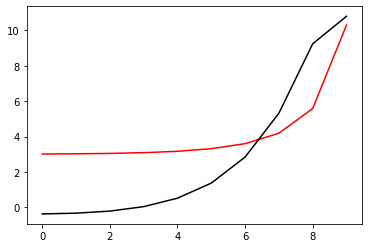

24600 96.00225308463557 -1.2764091393215675
[-0.36546961 -0.32439818 -0.20682963  0.04442951  0.52148108  1.37312726
  2.84194833  5.31860898  9.23575747 10.7911065 ]


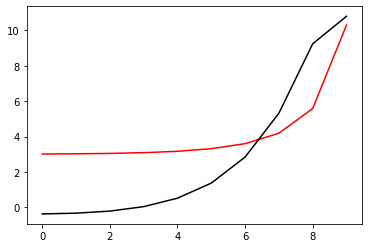

24800 96.00225308457658 -1.2764108900529774
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


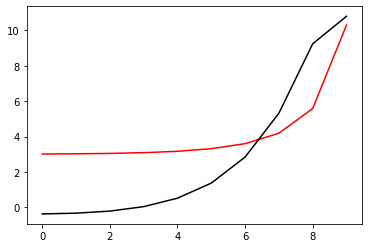

25000 96.0022530845766 -1.2764108900521134
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


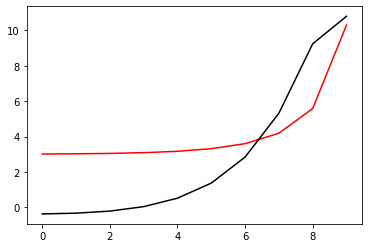

25200 96.00225308457733 -1.2764106925917984
[-0.36546895 -0.32439756 -0.206829    0.04443019  0.52148195  1.3731283
  2.84194987  5.31861077  9.23575527 10.79110679]


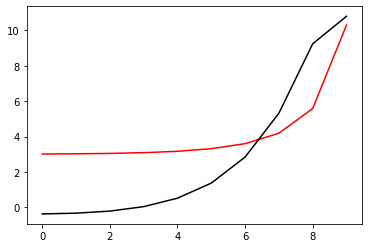

25400 96.0022530845766 -1.2764108900544657
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


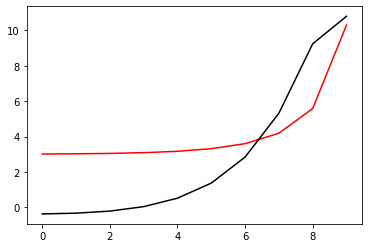

25600 96.00225308457658 -1.2764108678816029
[-0.36546882 -0.32439747 -0.20682895  0.0444302   0.52148193  1.37312827
  2.84194989  5.31861089  9.2357555  10.79110692]


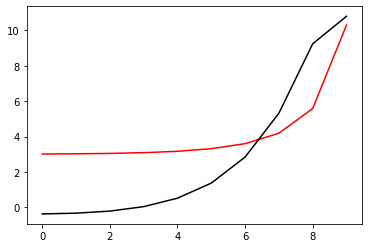

25800 96.00225308457658 -1.2764108791584756
[-0.36546882 -0.32439746 -0.20682894  0.0444302   0.52148194  1.37312828
  2.8419499   5.31861089  9.23575549 10.79110692]


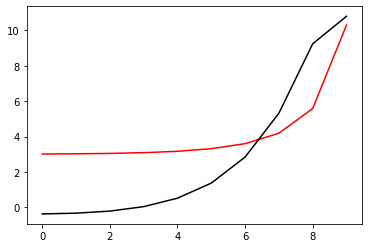

26000 96.00225308457658 -1.276410890052297
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


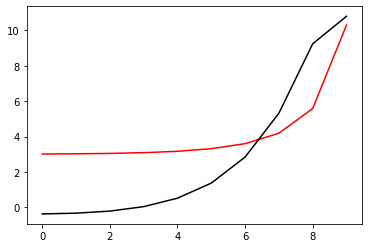

26200 96.00225320177722 -1.276486307525622
[-0.36536261 -0.32430015 -0.20674614  0.04450048  0.52154501  1.3731927
  2.84202559  5.31870273  9.23585305 10.79119409]


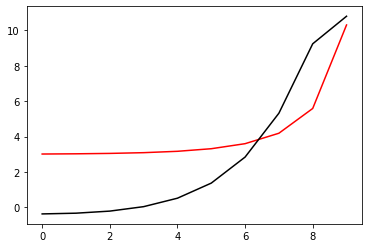

26400 96.0022530845766 -1.2764108902246079
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


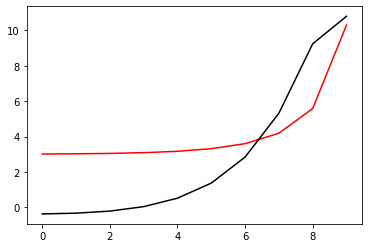

26600 96.0022530845766 -1.2764108900518079
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


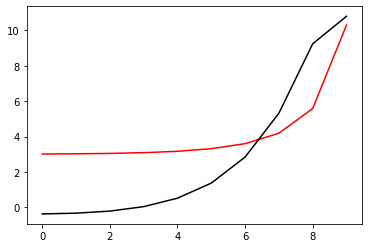

26800 96.00225310508326 -1.2764432911248123
[-0.36544227 -0.32437414 -0.20681041  0.04444123  0.52148152  1.37311835
  2.84194051  5.31861936  9.23579791 10.79110447]


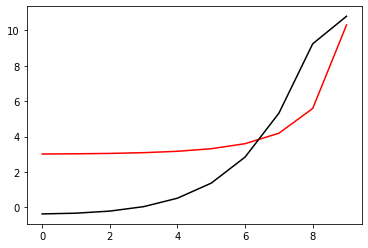

27000 96.0022530845766 -1.2764108909802119
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


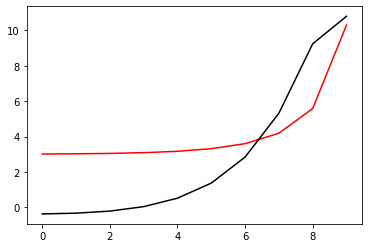

27200 96.0022530845766 -1.2764108900518163
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


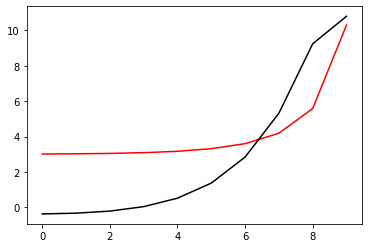

27400 96.00225308458393 -1.2764115051697433
[-0.36546828 -0.32439697 -0.20682853  0.04443046  0.52148192  1.37312794
  2.84194883  5.31860962  9.2357581  10.79110682]


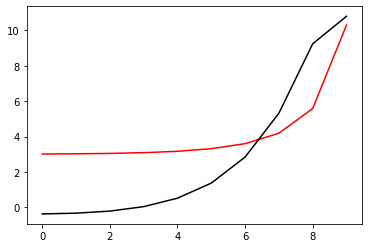

27600 96.00225308457658 -1.2764108899920366
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


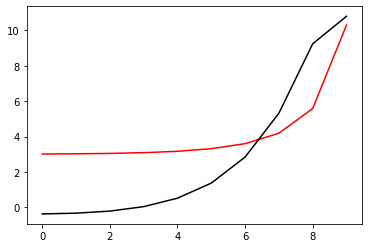

27800 96.0022530845766 -1.276410890051816
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


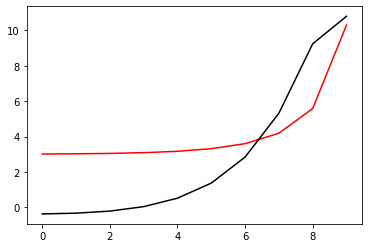

28000 96.00225308458607 -1.276411579674292
[-0.36546803 -0.32439671 -0.20682827  0.04443076  0.52148227  1.37312841
  2.84195008  5.31861156  9.23575673 10.7911073 ]


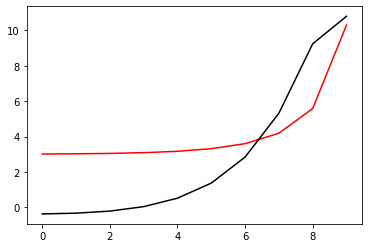

28200 96.00225308457658 -1.276410890034702
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


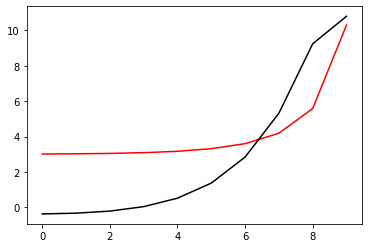

28400 96.00225308457658 -1.2764108900512285
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


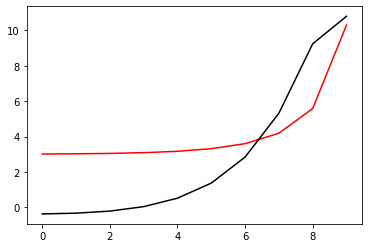

28600 96.00225308457712 -1.276410731734962
[-0.36546905 -0.32439768 -0.20682914  0.04443002  0.52148177  1.37312812
  2.84194973  5.31861072  9.23575532 10.79110679]


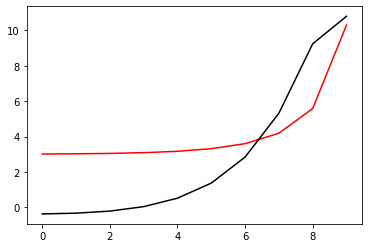

28800 96.0022530845766 -1.2764108900517848
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


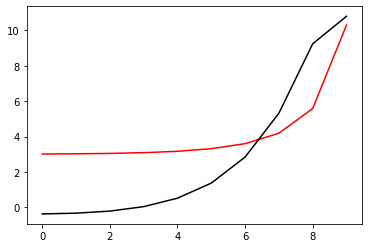

29000 96.00225308457713 -1.2764110587350486
[-0.36546864 -0.32439728 -0.20682877  0.04443038  0.5214821   1.37312844
  2.84195004  5.31861102  9.23575561 10.79110701]


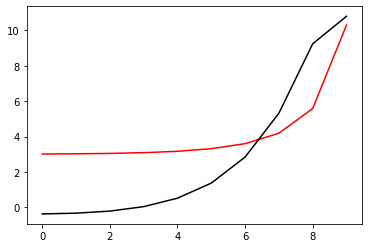

29200 96.0022530845766 -1.2764109002876358
[-0.3654688  -0.32439744 -0.20682892  0.04443023  0.52148196  1.3731283
  2.84194992  5.31861091  9.2357555  10.79110693]


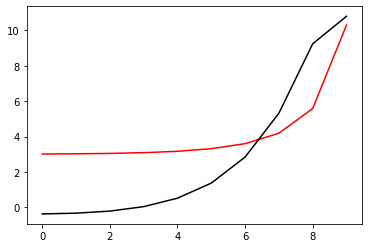

29400 96.00225308457658 -1.276410890051549
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


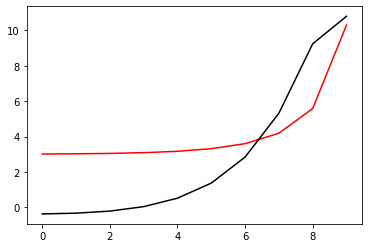

29600 96.00225308461857 -1.2764122755169078
[-0.36546665 -0.32439487 -0.20682572  0.04443445  0.52148737  1.37313462
  2.84195631  5.31860989  9.23574566 10.79110499]


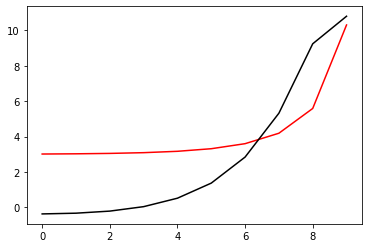

29800 96.0022530845766 -1.2764108901368856
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


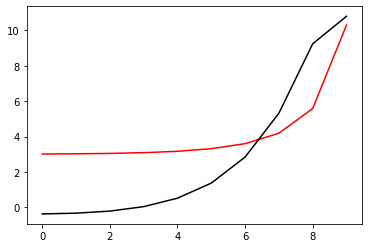

30000 96.0022530845766 -1.2764108900517797
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


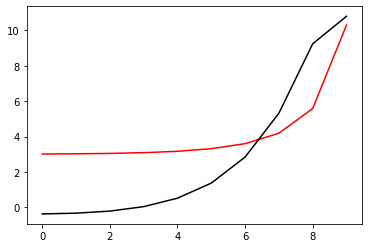

30200 96.00225308458441 -1.276411503463132
[-0.36546781 -0.32439646 -0.20682798  0.04443108  0.52148267  1.37312896
  2.84195073  5.31861208  9.23575671 10.79110776]


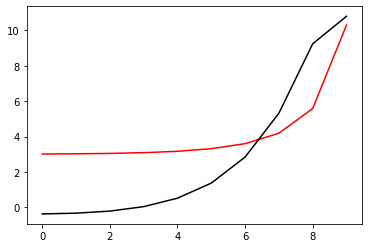

30400 96.00225308457658 -1.276410890027937
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


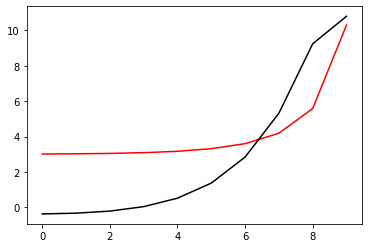

30600 96.0022530845766 -1.2764108900518942
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


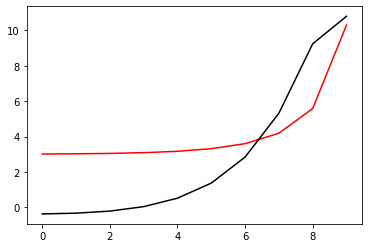

30800 96.00225308457685 -1.2764110081982243
[-0.36546879 -0.32439741 -0.20682886  0.04443033  0.5214821   1.37312845
  2.84195002  5.3186109   9.23575535 10.79110696]


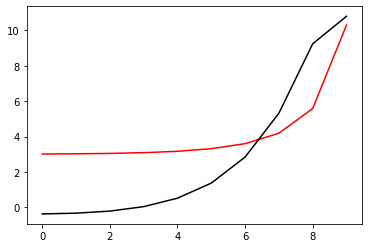

31000 96.00225308457657 -1.2764108900473319
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


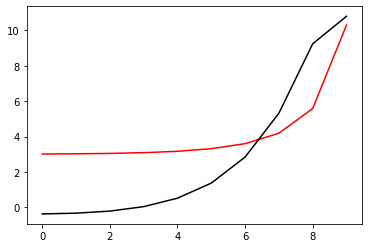

31200 96.00225308457657 -1.2764108900420459
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


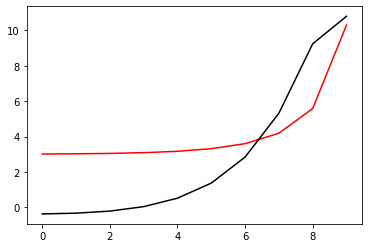

31400 96.00225308457665 -1.276410837050173
[-0.36546884 -0.32439748 -0.20682897  0.04443016  0.52148188  1.37312822
  2.84194985  5.31861087  9.23575551 10.7911069 ]


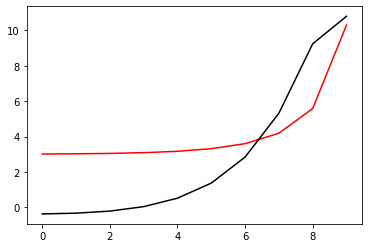

31600 96.00225308457658 -1.2764108900494882
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


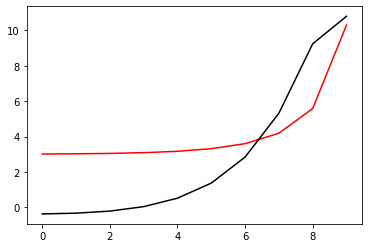

31800 96.00225334514953 -1.2762949750794768
[-0.36555794 -0.32448481 -0.20691427  0.04434707  0.52140127  1.37305061
  2.84187633  5.31854346  9.23569648 10.79105176]


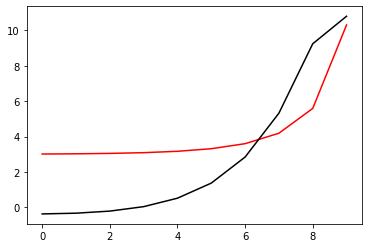

32000 96.00225308457658 -1.276410888312677
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110692]


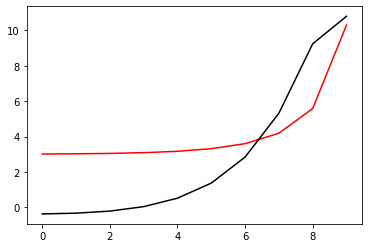

32200 96.0022530845766 -1.27641089005177
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


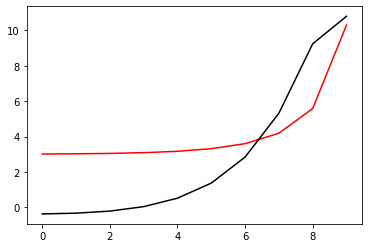

32400 96.00225308740826 -1.2764228710641876
[-0.36545894 -0.32438771 -0.20681902  0.04443989  0.52149132  1.3731352
  2.84194957  5.31860712  9.23577066 10.79110511]


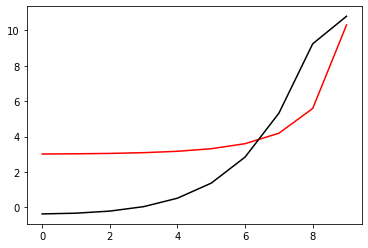

32600 96.0022530845766 -1.2764108896943624
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


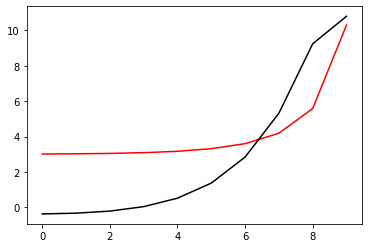

32800 96.0022530845766 -1.276410890051751
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


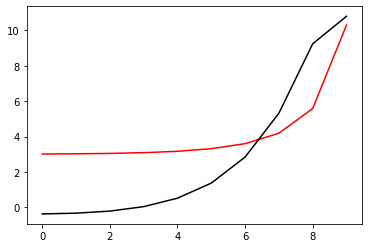

33000 96.0022530846482 -1.2764090261948726
[-0.36547137 -0.32440009 -0.20683165  0.04442747  0.52147915  1.37312554
  2.84194736  5.31860817  9.23575627 10.79110638]


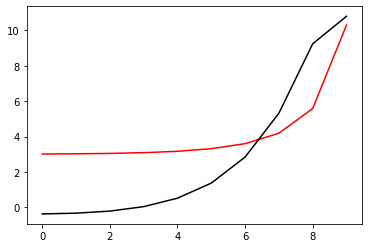

33200 96.00225308457658 -1.2764108900120996
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


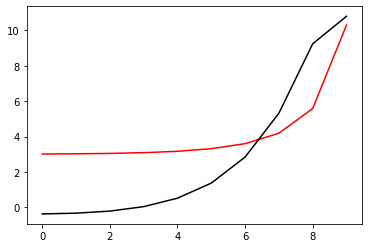

33400 96.0022530845766 -1.2764108900518325
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


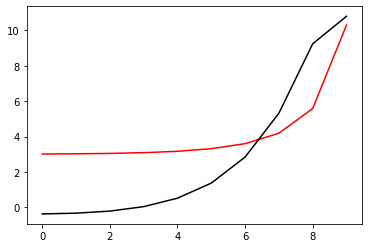

33600 96.00225308457915 -1.2764105392138276
[-0.36546934 -0.32439801 -0.20682951  0.04442965  0.52148145  1.37312789
  2.84194958  5.31861053  9.23575477 10.79110662]


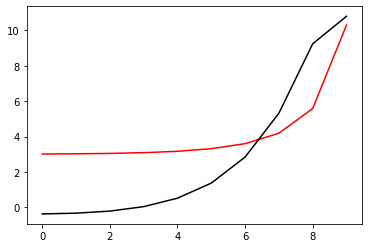

33800 96.00225308457658 -1.2764108900391569
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


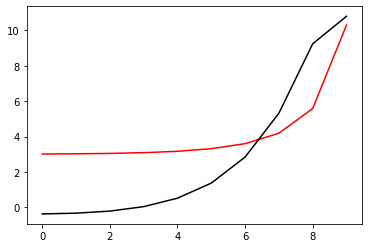

34000 96.0022530845766 -1.2764108900545565
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


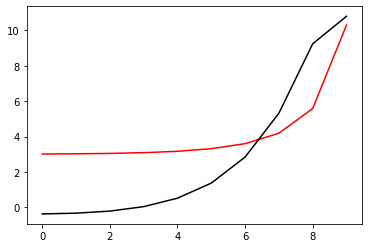

34200 96.00225308457674 -1.2764108009644066
[-0.36546891 -0.32439756 -0.20682905  0.04443008  0.52148181  1.37312816
  2.84194979  5.31861083  9.23575548 10.79110688]


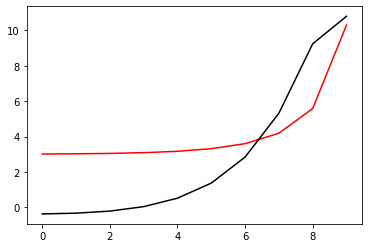

34400 96.00225308457658 -1.2764108900501991
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


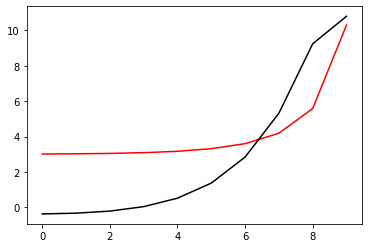

34600 96.00225308457732 -1.2764110814475003
[-0.36546862 -0.32439726 -0.20682874  0.0444304   0.52148212  1.37312846
  2.84195006  5.31861104  9.23575562 10.79110702]


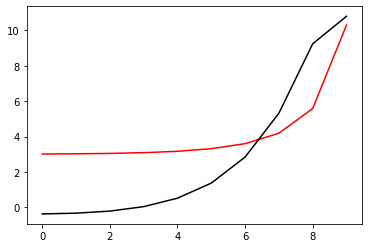

34800 96.00225308457658 -1.2764108864014505
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.3731283
  2.84194991  5.3186109   9.2357555  10.79110693]


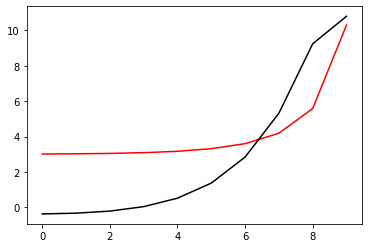

35000 96.0022530845766 -1.2764108900521718
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


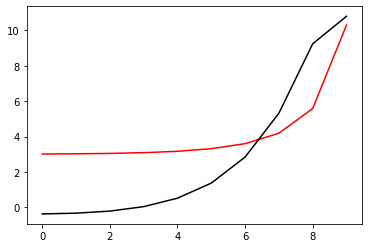

35200 96.00225330223186 -1.2763050625840948
[-0.3655523  -0.32447939 -0.20690909  0.04435205  0.52140609  1.37305534
  2.84188106  5.31854822  9.23570112 10.7910565 ]


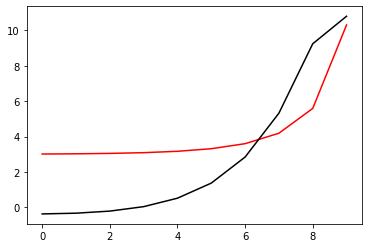

35400 96.0022530845766 -1.27641089384316
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575552 10.79110693]


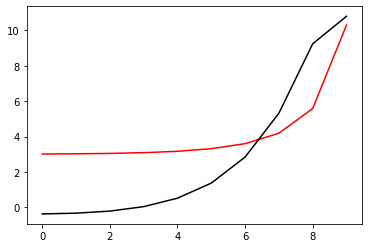

35600 96.0022530845766 -1.276410890051965
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


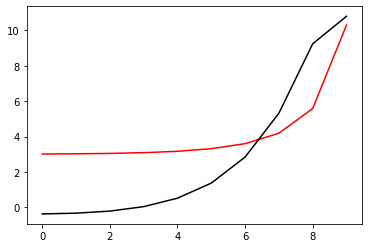

35800 96.00225308480545 -1.2764074350257568
[-0.36547083 -0.32439915 -0.20683023  0.04442956  0.52148207  1.37312959
  2.84195187  5.31861281  9.23574274 10.7911035 ]


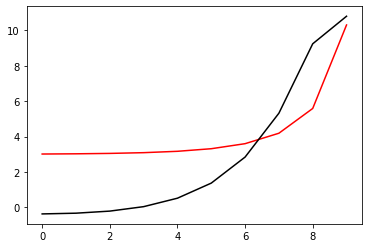

36000 96.0022530845766 -1.2764108902330285
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


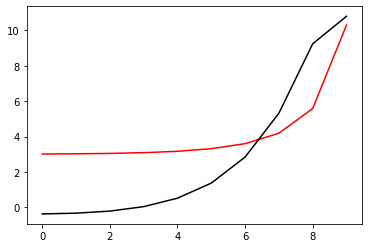

36200 96.0022530845766 -1.2764108900518307
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


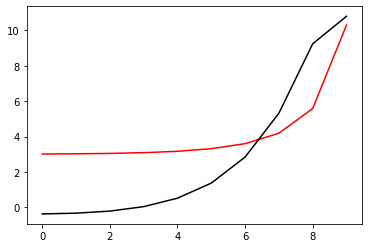

36400 96.00225308458138 -1.2764104004333576
[-0.36546925 -0.32439793 -0.20682945  0.04442959  0.52148122  1.37312758
  2.84194942  5.31861077  9.23575531 10.7911066 ]


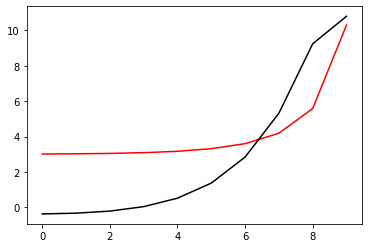

36600 96.0022530845766 -1.2764108900728277
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


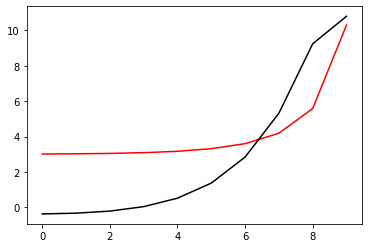

36800 96.0022530845766 -1.2764108900517763
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


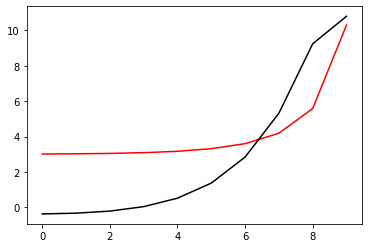

37000 96.0022530845816 -1.2764113833240731
[-0.36546809 -0.32439672 -0.20682823  0.04443089  0.52148263  1.37312904
  2.84195072  5.31861165  9.23575569 10.79110733]


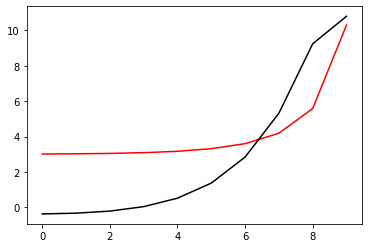

37200 96.00225308457658 -1.2764108900680686
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


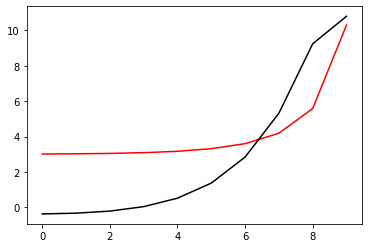

37400 96.00225308457658 -1.2764108901195608
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


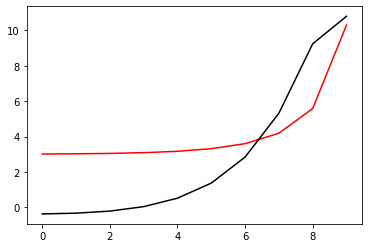

37600 96.00225308457661 -1.2764109253980294
[-0.36546877 -0.32439741 -0.2068289   0.04443024  0.52148196  1.37312829
  2.84194991  5.31861092  9.23575556 10.79110694]


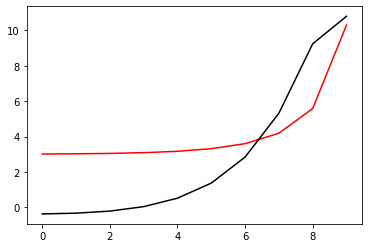

37800 96.00225308457658 -1.2764108900529056
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


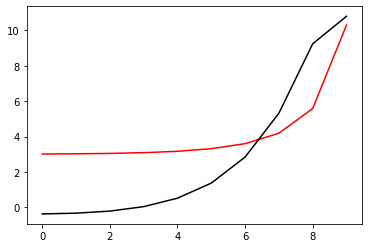

38000 96.00225308457699 -1.2764110304539023
[-0.36546867 -0.32439731 -0.20682879  0.04443035  0.52148208  1.37312841
  2.84195002  5.318611    9.23575559 10.791107  ]


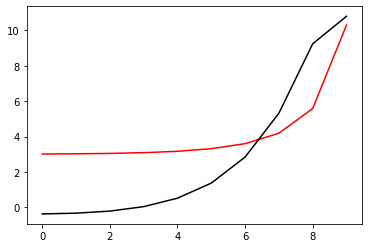

38200 96.0022530845766 -1.2764108962860152
[-0.3654688  -0.32439744 -0.20682892  0.04443023  0.52148196  1.37312831
  2.84194992  5.31861091  9.2357555  10.79110693]


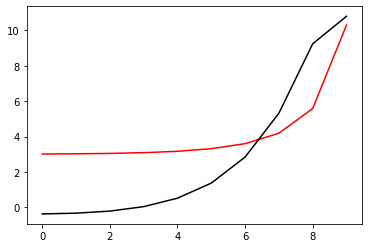

38400 96.0022530845766 -1.2764108900521471
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


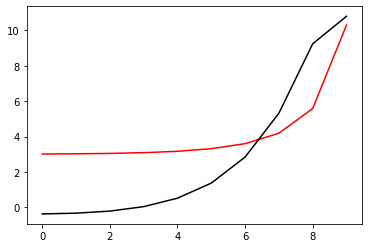

38600 96.00225309916314 -1.276383859761145
[-0.36548642 -0.32441962 -0.20685998  0.04438558  0.52142651  1.37307253
  2.84191007  5.31860553  9.23578902 10.79111279]


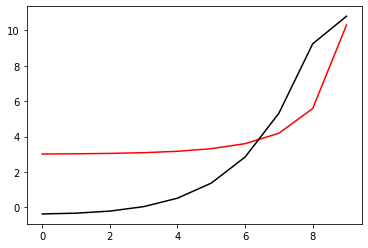

38800 96.0022530845766 -1.2764108900922329
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


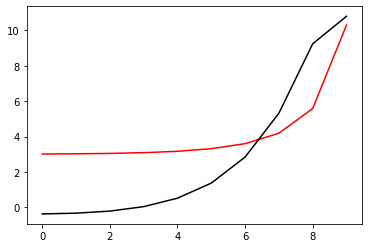

39000 96.0022530845766 -1.2764108900518647
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


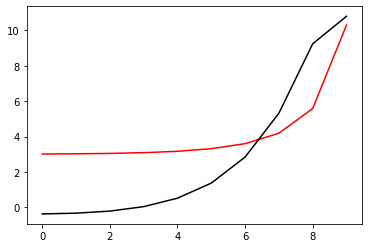

39200 96.00225308543534 -1.2764044777074213
[-0.36547936 -0.3244082  -0.20683953  0.04442009  0.52147302  1.37312103
  2.84194495  5.31860603  9.23573642 10.79110053]


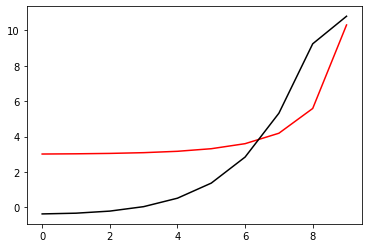

39400 96.00225308457657 -1.2764108898845332
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


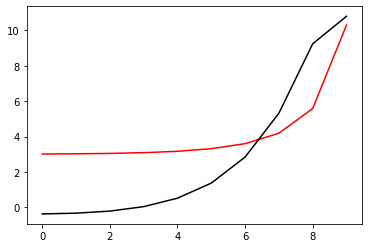

39600 96.0022530845766 -1.2764108900519116
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


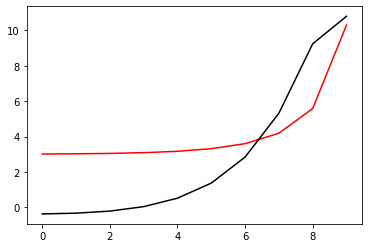

39800 96.00225308459001 -1.2764117150518755
[-0.365468   -0.3243967  -0.20682826  0.04443072  0.52148229  1.37312831
  2.8419495   5.31861098  9.23575867 10.79110807]


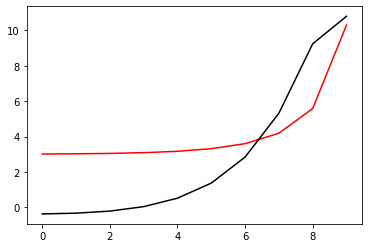

40000 96.00225308457658 -1.2764108901000129
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


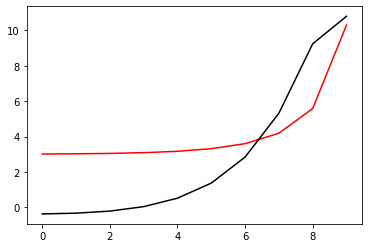

40200 96.00225308457658 -1.2764108900507545
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


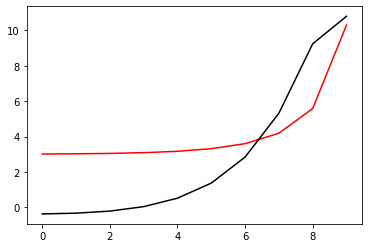

40400 96.00225308457674 -1.2764108049896574
[-0.36546884 -0.32439747 -0.20682895  0.04443021  0.52148195  1.37312829
  2.84194989  5.31861088  9.23575548 10.79110688]


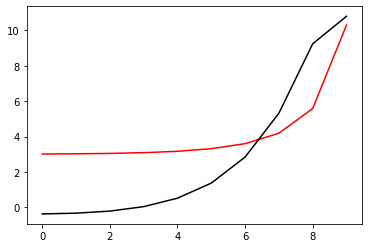

40600 96.00225308457657 -1.2764108900486124
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


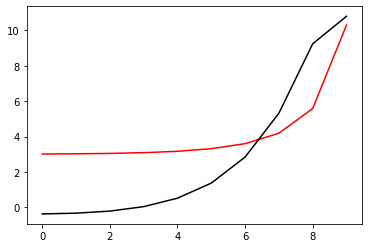

40800 96.00225308457671 -1.2764108102283456
[-0.36546888 -0.32439752 -0.206829    0.04443014  0.52148188  1.37312822
  2.84194984  5.31861085  9.23575547 10.79110689]


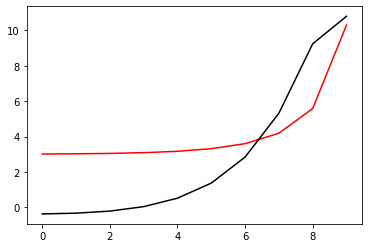

41000 96.00225308457661 -1.2764108888111325
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148196  1.3731283
  2.84194991  5.31861091  9.2357555  10.79110693]


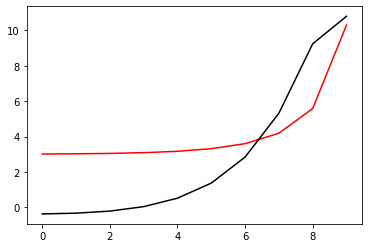

41200 96.00225308457658 -1.2764108900514923
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


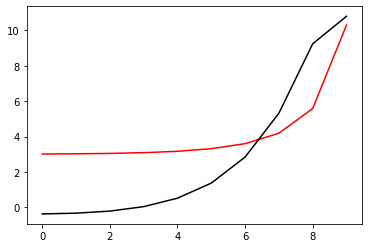

41400 96.00225308567134 -1.2764176919970485
[-0.36544723 -0.32437511 -0.20680684  0.04445165  0.52150066  1.37314083
  2.84195957  5.31863176  9.23580975 10.79112969]


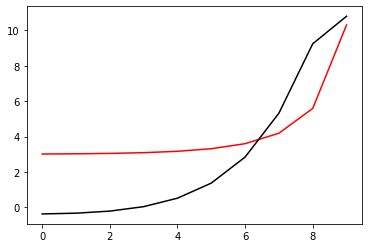

41600 96.00225308457658 -1.276410890674823
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


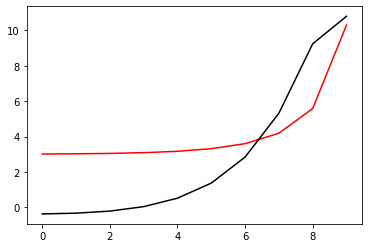

41800 96.0022530845766 -1.2764108900518327
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


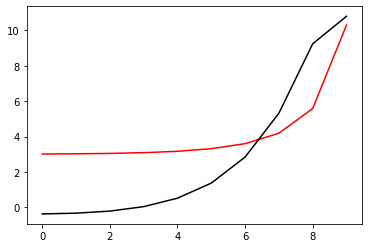

42000 96.00225308467941 -1.27640858249141
[-0.36547004 -0.32439859 -0.20683002  0.04442918  0.52148082  1.3731271
  2.84194843  5.31860896  9.23575756 10.79110687]


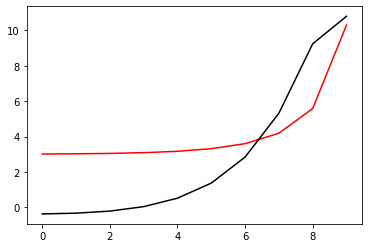

42200 96.00225308457658 -1.2764108900908435
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


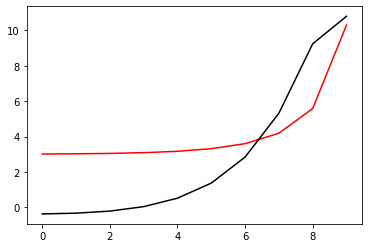

42400 96.0022530845766 -1.276410890051817
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


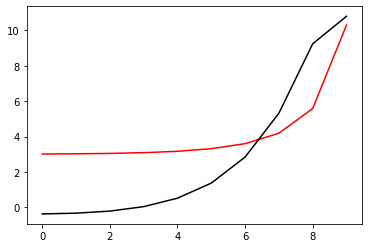

42600 96.00225308472189 -1.2764081658694677
[-0.36547086 -0.3243994  -0.20683078  0.04442846  0.52148036  1.37312668
  2.8419486   5.31860901  9.23575319 10.79110471]


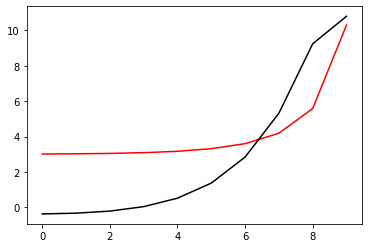

42800 96.00225308457658 -1.2764108901091535
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


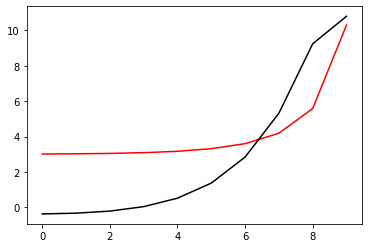

43000 96.0022530845766 -1.2764108900517337
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


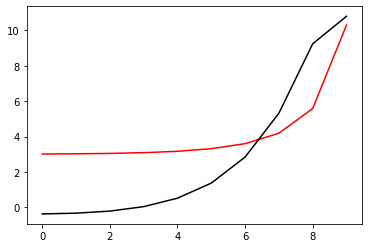

43200 96.0022530845872 -1.2764116191379231
[-0.36546802 -0.3243967  -0.20682823  0.0444308   0.52148241  1.37312874
  2.84195052  5.31861178  9.23575622 10.79110744]


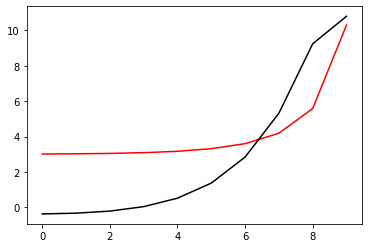

43400 96.0022530845766 -1.276410890067675
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


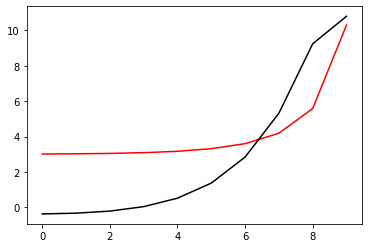

43600 96.00225308457658 -1.2764108900526177
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


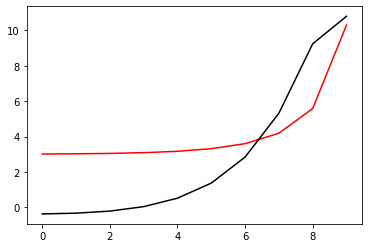

43800 96.00225308457689 -1.2764110095232188
[-0.36546863 -0.32439727 -0.20682874  0.04443041  0.52148215  1.37312848
  2.84195007  5.31861104  9.23575561 10.79110699]


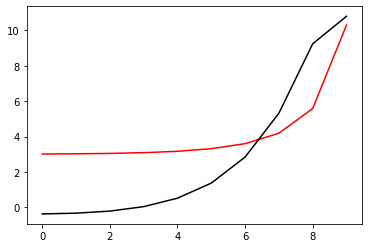

44000 96.00225308457658 -1.2764108900477964
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


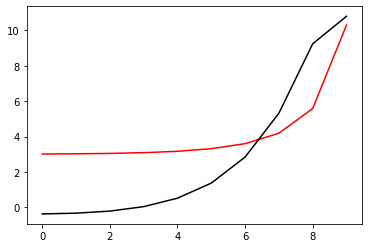

44200 96.0022530845766 -1.2764108811752042
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148194  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110692]


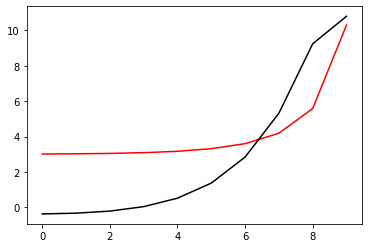

44400 96.0022530845766 -1.276410906536563
[-0.36546879 -0.32439743 -0.20682891  0.04443024  0.52148197  1.37312832
  2.84194993  5.31861091  9.23575552 10.79110694]


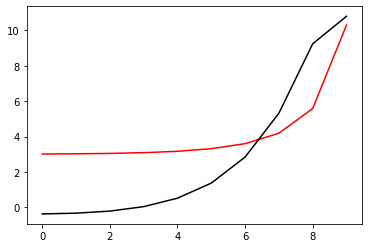

44600 96.0022530845766 -1.2764108900522393
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


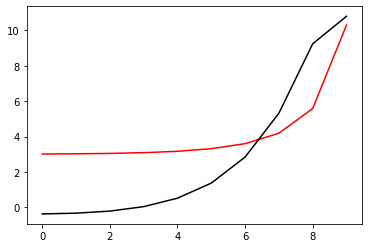

44800 96.0022531317216 -1.2763626702951656
[-0.365518   -0.32445247 -0.20689459  0.04434968  0.52139061  1.37303777
  2.84187767  5.31857645  9.23576305 10.79108977]


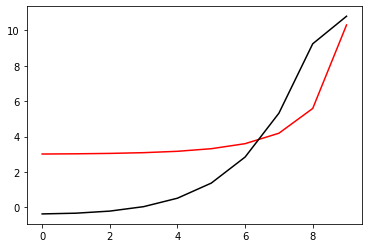

45000 96.00225308457658 -1.2764108900260884
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


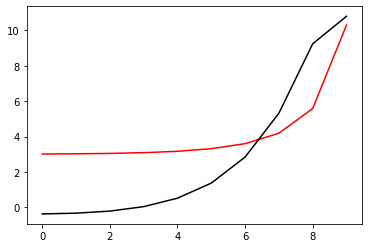

45200 96.0022530845766 -1.2764108900519089
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


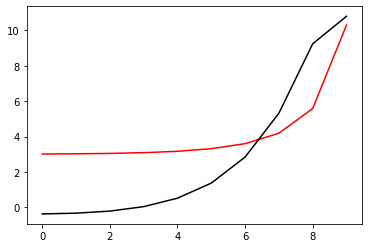

45400 96.00225308605556 -1.276402167301243
[-0.36547549 -0.32440361 -0.20683424  0.0444261   0.52147975  1.37312787
  2.84195176  5.31860896  9.2357412  10.79110551]


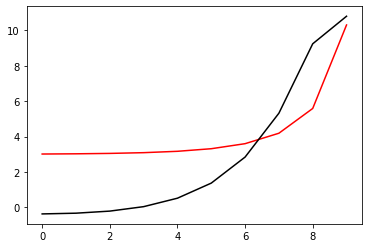

45600 96.00225308457661 -1.2764108901308813
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


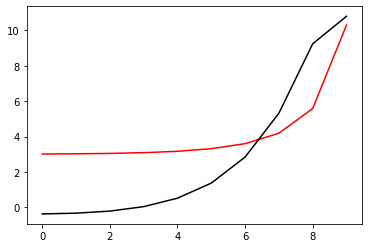

45800 96.0022530845766 -1.2764108900517133
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


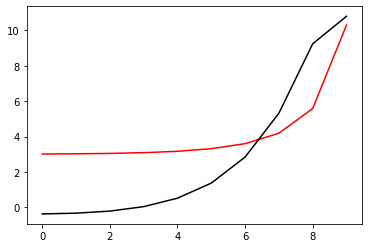

46000 96.00225308462414 -1.2764124121496627
[-0.36546728 -0.32439572 -0.20682686  0.04443289  0.52148544  1.37313292
  2.84195524  5.31861539  9.23574234 10.79110453]


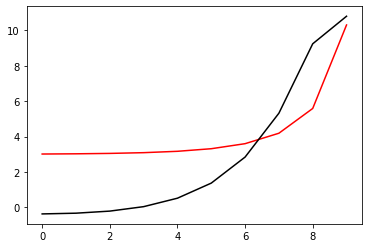

46200 96.00225308457658 -1.2764108900344497
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


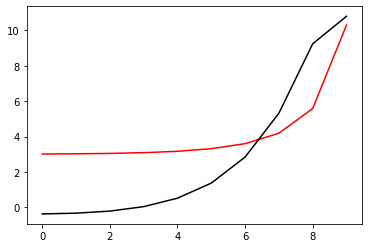

46400 96.0022530845766 -1.2764108900518376
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


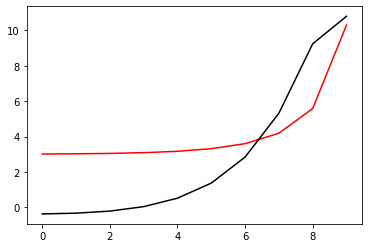

46600 96.00225308948885 -1.2764261330255633
[-0.36544212 -0.32437028 -0.20680215  0.04445612  0.52150528  1.37314512
  2.84196266  5.31863387  9.23581325 10.7911318 ]


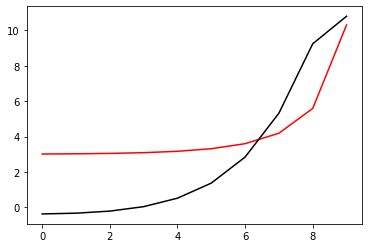

46800 96.00225308457658 -1.2764108897860473
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


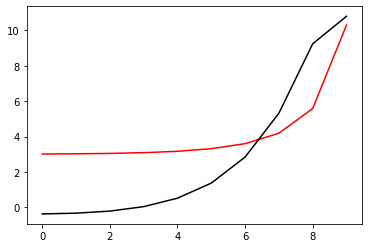

47000 96.0022530845766 -1.276410890051835
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


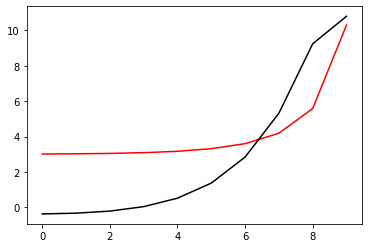

47200 96.00225308511975 -1.2764159813899116
[-0.36546187 -0.32439003 -0.20682066  0.04443987  0.52149292  1.373141
  2.8419603   5.31861526  9.23576768 10.79111914]


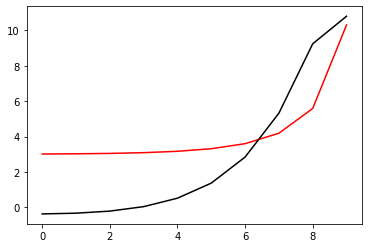

47400 96.0022530845766 -1.2764108899190192
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


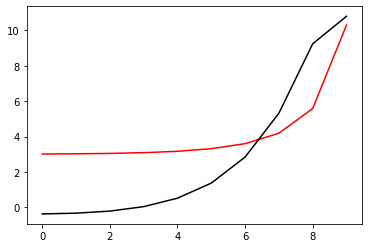

47600 96.0022530845766 -1.276410890051822
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


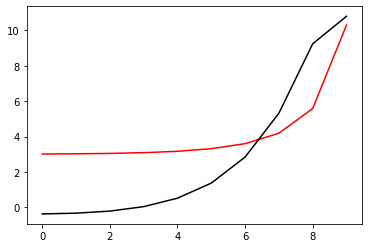

47800 96.00225308476048 -1.2764138191889143
[-0.36546385 -0.32439214 -0.20682322  0.04443654  0.52148894  1.3731363
  2.84195821  5.31861872  9.23574791 10.79110814]


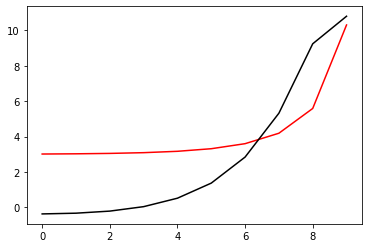

48000 96.00225308457658 -1.2764108898614752
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


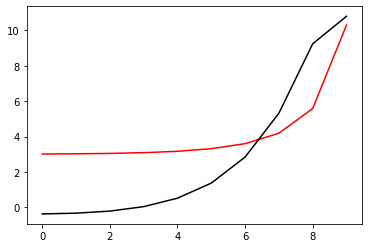

48200 96.0022530845766 -1.2764108900517548
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


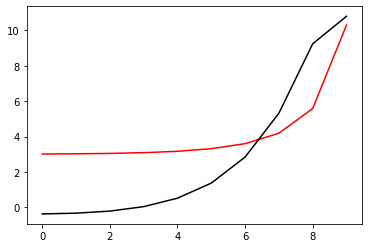

48400 96.00225308459565 -1.2764099231979906
[-0.36546989 -0.32439859 -0.20683016  0.04442887  0.52148039  1.37312653
  2.84194825  5.31860995  9.23575558 10.79110609]


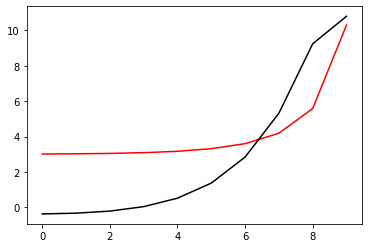

48600 96.00225308457658 -1.2764108900205775
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


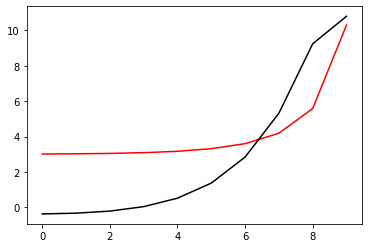

48800 96.0022530845766 -1.2764108900519104
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


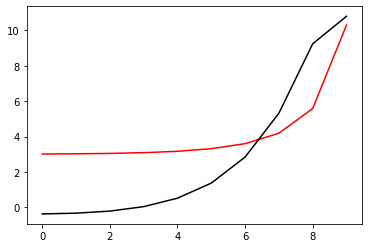

49000 96.00225308457703 -1.276410736547661
[-0.36546887 -0.3243975  -0.20682895  0.04443026  0.52148205  1.37312844
  2.84195001  5.31861083  9.23575507 10.79110683]


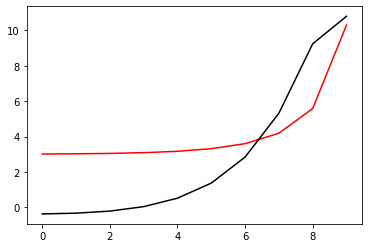

49200 96.00225308457658 -1.276410890043261
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


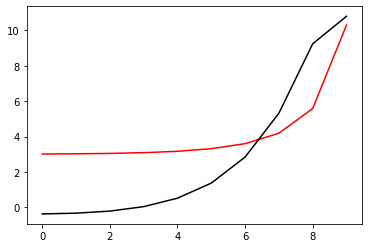

49400 96.00225308457658 -1.2764108896753554
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


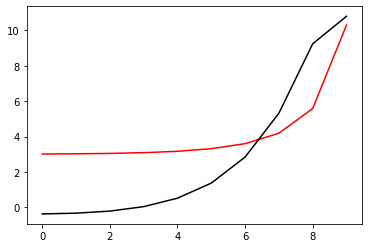

49600 96.00225308457661 -1.2764108602482798
[-0.36546882 -0.32439746 -0.20682894  0.04443021  0.52148194  1.37312828
  2.84194989  5.3186109   9.23575554 10.79110693]


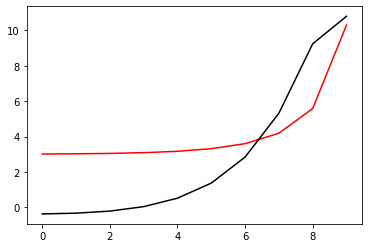

49800 96.00225308457658 -1.2764108900527082
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


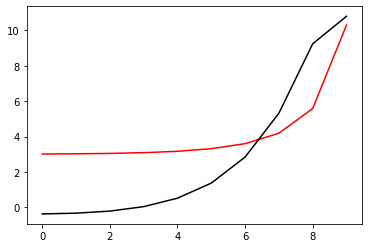

50000 96.00225309418586 -1.2764309850719715
[-0.36539412 -0.32432676 -0.20676992  0.04447776  0.52152225  1.37316838
  2.84199826  5.31867278  9.23582344 10.79115614]


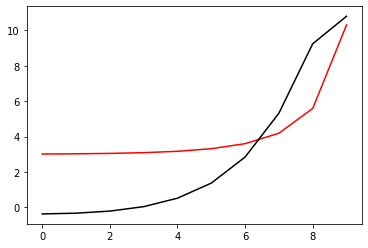

50200 96.00225308457658 -1.2764108898794726
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


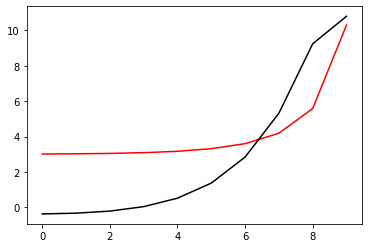

50400 96.0022530845766 -1.2764108900518396
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


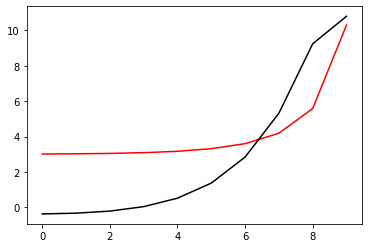

50600 96.00225308539062 -1.2764173074485368
[-0.36546382 -0.32439246 -0.20682377  0.04443576  0.52148819  1.37313552
  2.84195784  5.31861792  9.23574646 10.7911079 ]


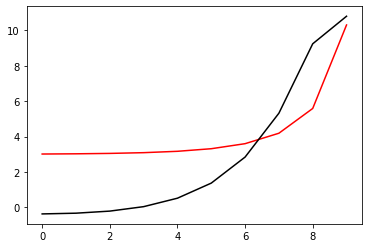

50800 96.00225308457657 -1.2764108899190412
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


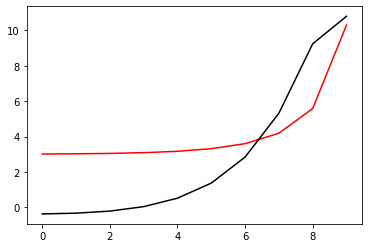

51000 96.0022530845766 -1.2764108900519513
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


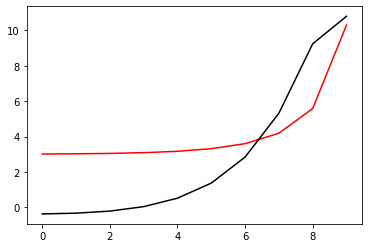

51200 96.00225308458275 -1.2764103373290467
[-0.36546936 -0.32439802 -0.20682954  0.04442954  0.52148126  1.37312767
  2.84194942  5.31861052  9.23575476 10.79110633]


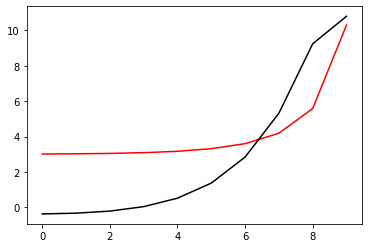

51400 96.00225308457658 -1.2764108900660844
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


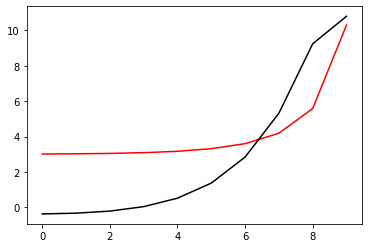

51600 96.00225308457657 -1.2764108910049436
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


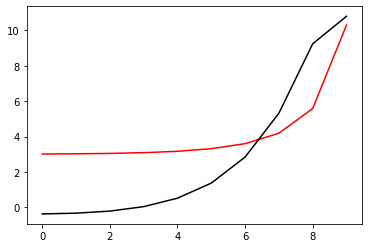

51800 96.0022530845766 -1.2764108866158335
[-0.36546882 -0.32439746 -0.20682894  0.04443021  0.52148194  1.37312828
  2.84194988  5.31861089  9.23575552 10.79110692]


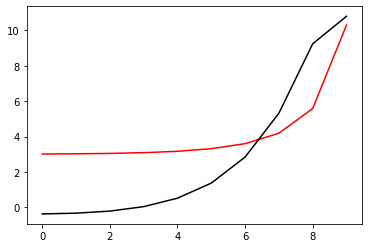

52000 96.0022530845766 -1.276410890052133
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


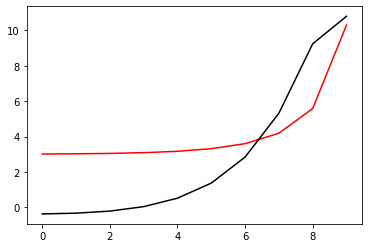

52200 96.00225308472338 -1.2764081750979686
[-0.36547143 -0.32440005 -0.2068315   0.0444277   0.5214795   1.37312595
  2.84194775  5.31860902  9.23575398 10.79110559]


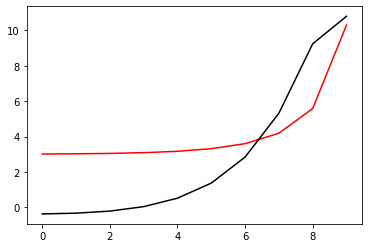

52400 96.00225308457657 -1.276410889895261
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.2357555  10.79110693]


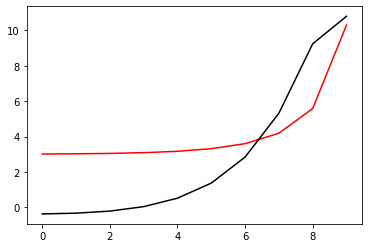

52600 96.0022530845766 -1.2764108900520674
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


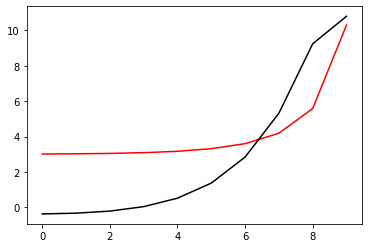

52800 96.00225313451013 -1.2764612756515317
[-0.36541961 -0.32436164 -0.20680955  0.0444363   0.52148138  1.37313181
  2.84197047  5.31865638  9.23581672 10.79116745]


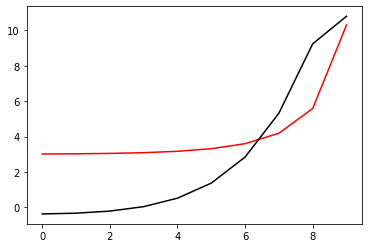

53000 96.0022530845766 -1.2764108903553801
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575552 10.79110693]


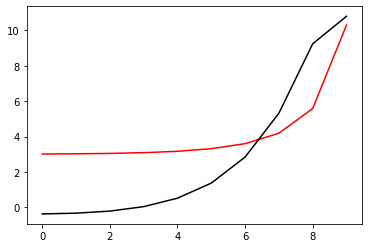

53200 96.0022530845766 -1.2764108900518518
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


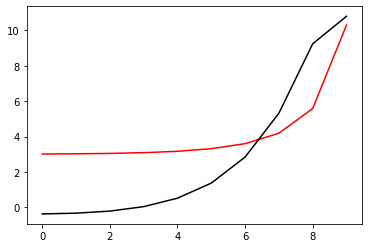

53400 96.00225326526277 -1.2763125122104113
[-0.36548989 -0.3244165  -0.20684596  0.04441447  0.5214663   1.37311086
  2.84192787  5.3185812   9.23571761 10.79106012]


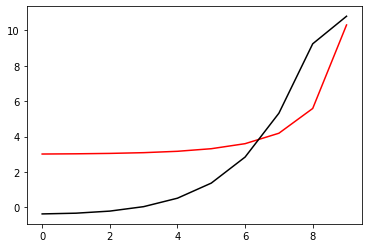

53600 96.0022530845766 -1.276410888913442
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


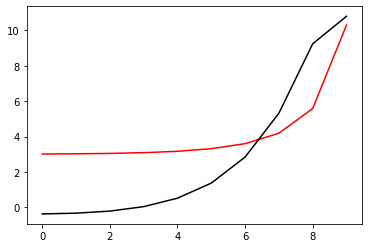

53800 96.0022530845766 -1.2764108900518982
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


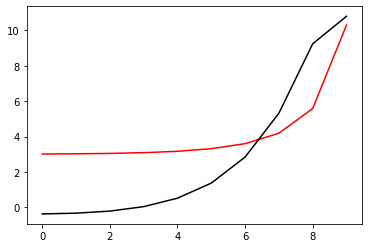

54000 96.00225308614684 -1.2764018502739036
[-0.36547426 -0.32440221 -0.20683274  0.0444277   0.52148121  1.37312905
  2.84195227  5.31860828  9.23574185 10.79110444]


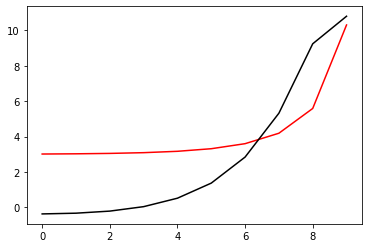

54200 96.00225308457658 -1.2764108900207196
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


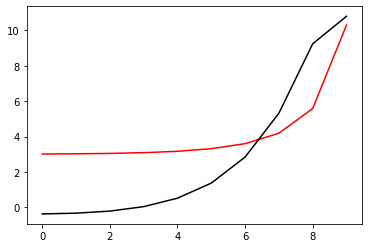

54400 96.0022530845766 -1.2764108900517535
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


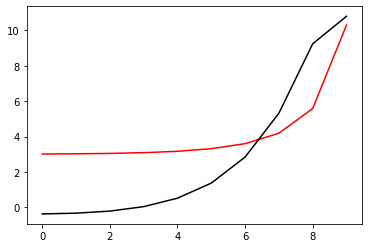

54600 96.00225308458458 -1.2764102643504294
[-0.36546954 -0.32439822 -0.20682975  0.0444293   0.52148095  1.37312734
  2.84194918  5.3186105   9.23575501 10.7911064 ]


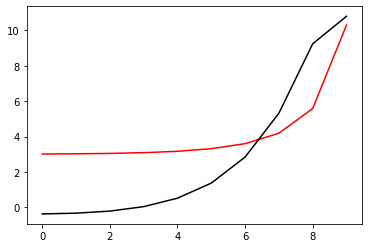

54800 96.0022530845766 -1.2764108900303455
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


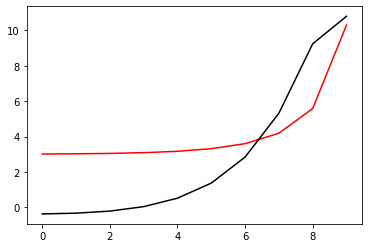

55000 96.00225308457658 -1.2764108886766528
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


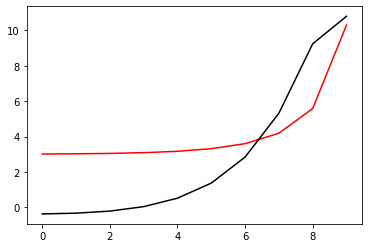

55200 96.0022530845766 -1.2764109094367506
[-0.36546879 -0.32439744 -0.20682892  0.04443023  0.52148196  1.3731283
  2.8419499   5.3186109   9.23575553 10.79110693]


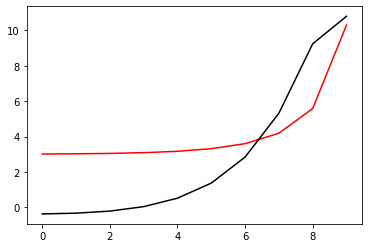

55400 96.00225308457658 -1.276410890051003
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


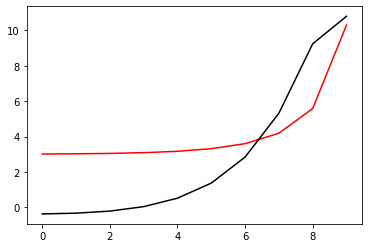

55600 96.0022531167725 -1.2763712607043667
[-0.36551135 -0.32444619 -0.2068891   0.04435479  0.52139553  1.37304171
  2.84187909  5.31857331  9.23575429 10.79108034]


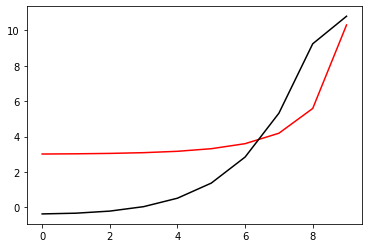

55800 96.00225308457658 -1.2764108915866128
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575552 10.79110693]


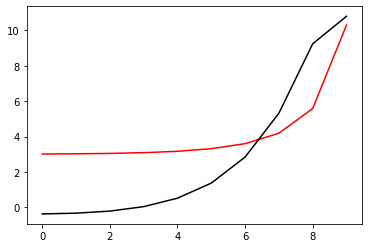

56000 96.0022530845766 -1.276410890051822
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


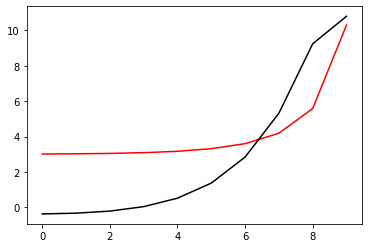

56200 96.0022530847344 -1.2764080993490234
[-0.36547208 -0.32440076 -0.20683225  0.04442689  0.52147868  1.373125
  2.84194696  5.31860756  9.23575342 10.79110435]


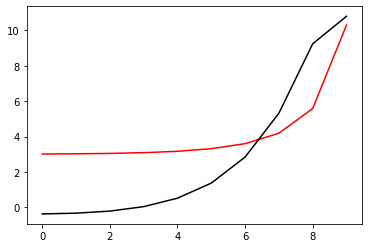

56400 96.0022530845766 -1.2764108901381561
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


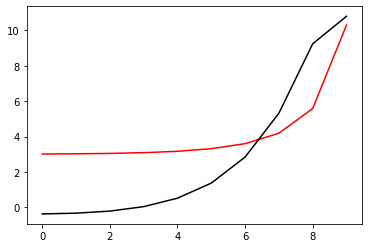

56600 96.0022530845766 -1.2764108900518372
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


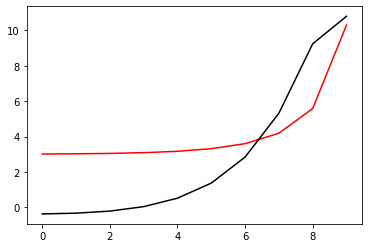

56800 96.0022530845779 -1.2764111515881063
[-0.36546869 -0.32439732 -0.20682877  0.04443042  0.5214822   1.37312857
  2.84195014  5.31861101  9.23575539 10.79110709]


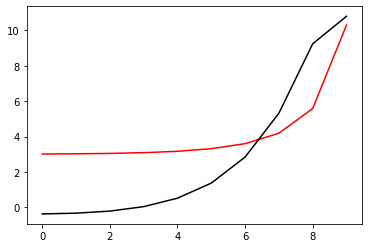

57000 96.00225308457658 -1.27641089005606
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


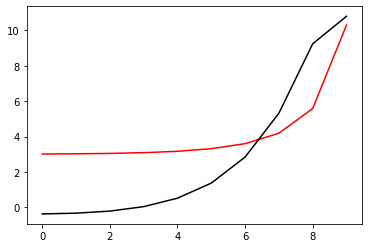

57200 96.0022530845766 -1.2764108900516462
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


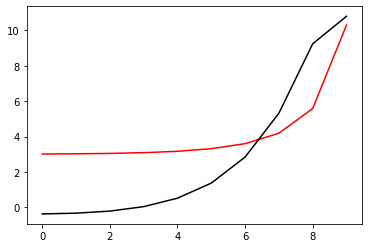

57400 96.00225308457685 -1.2764107794546566
[-0.36546905 -0.32439769 -0.20682914  0.04443006  0.52148185  1.37312823
  2.84194983  5.31861074  9.23575519 10.7911069 ]


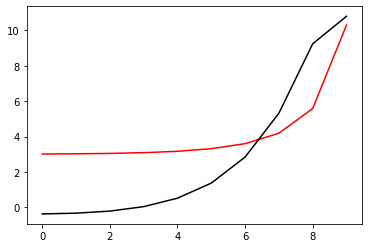

57600 96.00225308457658 -1.2764108900601823
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


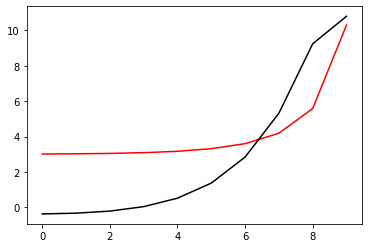

57800 96.0022530845766 -1.2764108938056884
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


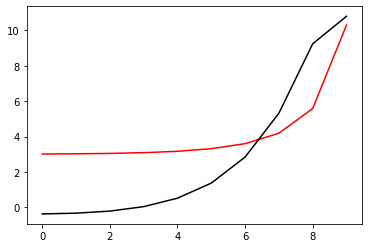

58000 96.0022530845766 -1.276410907399738
[-0.36546878 -0.32439742 -0.2068289   0.04443024  0.52148198  1.37312832
  2.84194992  5.31861091  9.23575553 10.79110693]


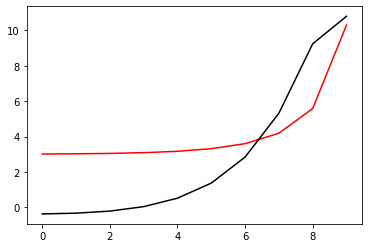

58200 96.00225308457658 -1.2764108900524078
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


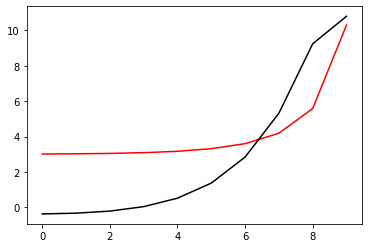

58400 96.00225308747726 -1.2764223017853573
[-0.36543555 -0.32436567 -0.20680113  0.04444975  0.52149032  1.37313013
  2.84195686  5.31863991  9.23581764 10.7911276 ]


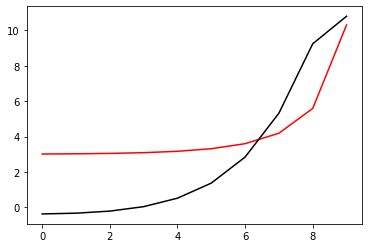

58600 96.0022530845766 -1.276410890760261
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


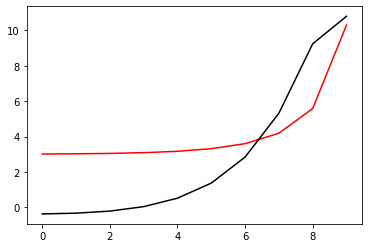

58800 96.0022530845766 -1.276410890051802
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


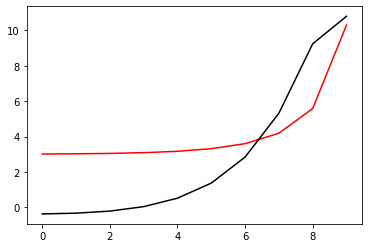

59000 96.00225308497568 -1.276415447121103
[-0.36546685 -0.32439572 -0.2068273   0.0444319   0.52148392  1.37313099
  2.84195339  5.31861533  9.23575195 10.79110841]


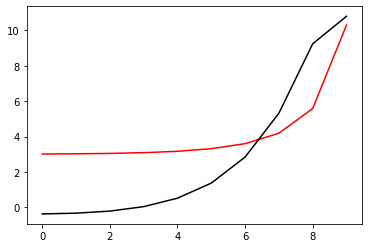

59200 96.00225308457657 -1.2764108899269277
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


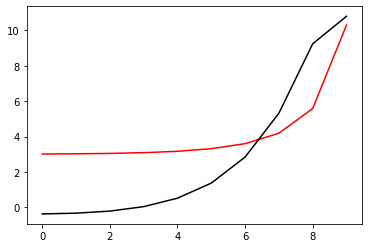

59400 96.0022530845766 -1.2764108900517577
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


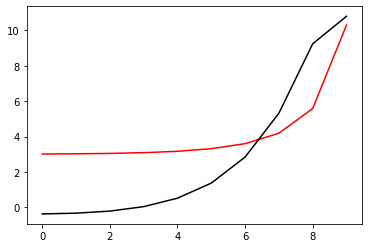

59600 96.0022530846583 -1.276412888815758
[-0.36546619 -0.3243948  -0.2068263   0.04443283  0.52148441  1.37313061
  2.84195185  5.31861218  9.23576004 10.79110937]


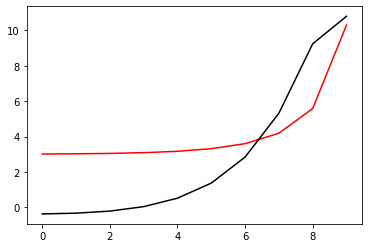

59800 96.00225308457658 -1.2764108900702564
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


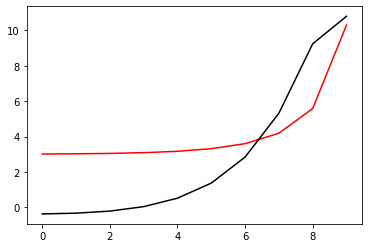

60000 96.00225308457658 -1.2764108900524216
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


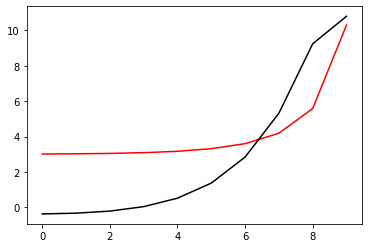

In [92]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 60001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2).numpy(), m2_2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 96.00225308457658 -1.27641089363723
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148196  1.3731283
  2.84194991  5.3186109   9.23575549 10.79110693]


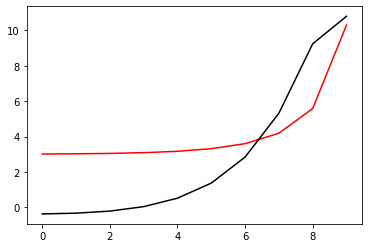

400 96.0022530845766 -1.2764108900521132
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


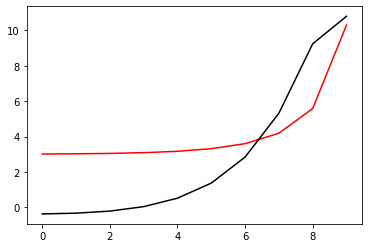

600 96.0022530845766 -1.2764108900518156
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


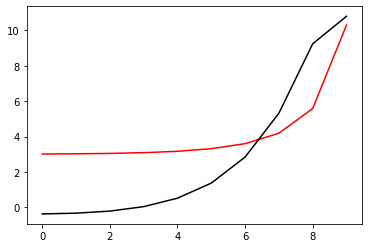

800 96.0022530845766 -1.27641089005181
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


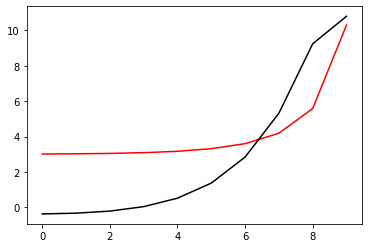

1000 96.0022530845766 -1.2764108900517945
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


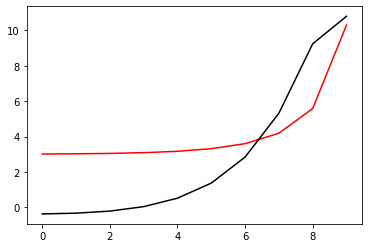

1200 96.0022530845766 -1.276410890051835
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


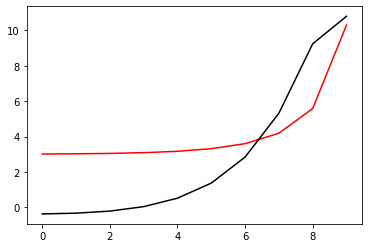

1400 96.00225327709187 -1.2765080537217506
[-0.36535822 -0.3242964  -0.20673701  0.04451356  0.52155835  1.37320024
  2.84201925  5.31867571  9.23580892 10.7911461 ]


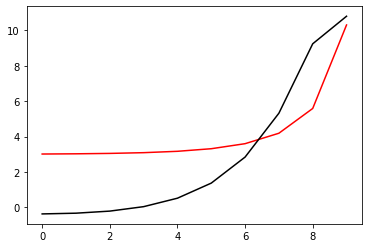

1600 96.00225308457661 -1.2764108919790063
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


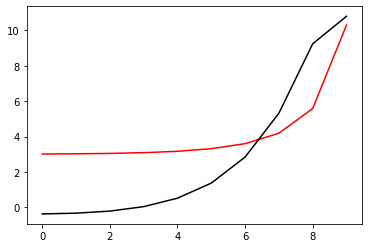

1800 96.0022530845766 -1.2764108900517315
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


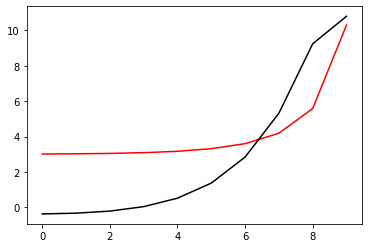

2000 96.00225308911592 -1.2763956600650512
[-0.3654772  -0.32440649 -0.20683987  0.04441666  0.52146269  1.37310217
  2.84192458  5.3186039   9.23578796 10.79110393]


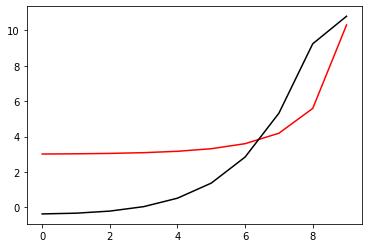

2200 96.00225308457658 -1.276410889184265
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


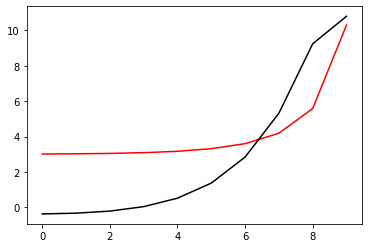

2400 96.0022530845766 -1.2764108900517512
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


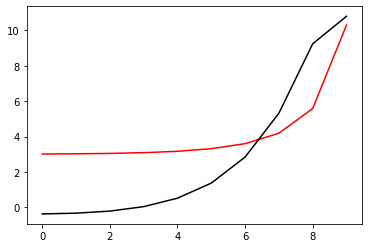

2600 96.00225308458593 -1.2764101513337043
[-0.36546789 -0.32439633 -0.2068276   0.0444317   0.52148368  1.37313004
  2.84195182  5.31861212  9.23575395 10.79110631]


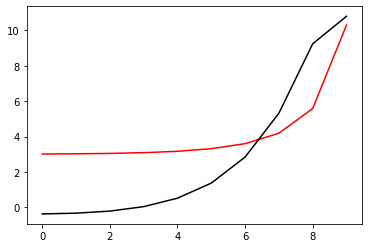

2800 96.0022530845766 -1.276410890135539
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


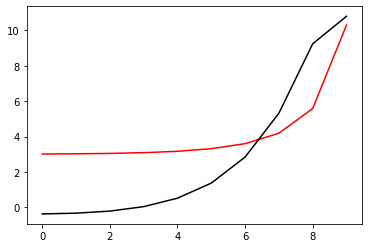

3000 96.0022530845766 -1.2764108900517095
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


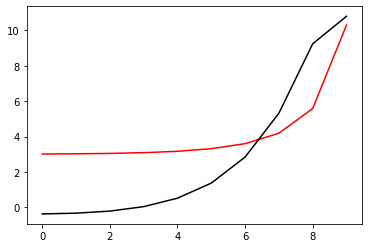

3200 96.00225308457729 -1.2764106960912398
[-0.36546883 -0.32439746 -0.20682895  0.04443019  0.52148198  1.37312842
  2.84195013  5.3186111   9.23575527 10.79110703]


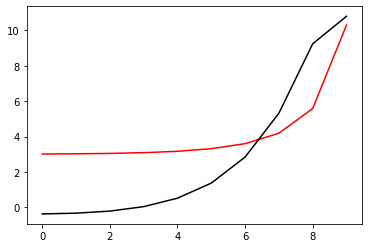

3400 96.00225308457658 -1.2764108900437452
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


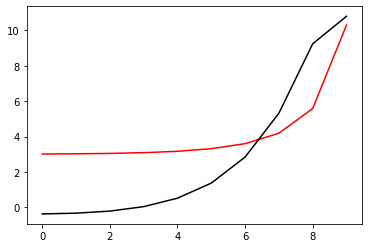

3600 96.0022530845766 -1.276410889824633
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


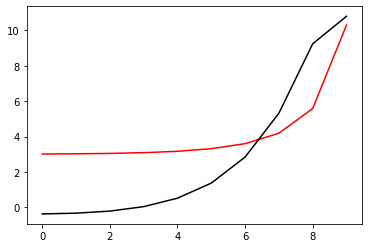

3800 96.00225308457657 -1.276410882670244
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.8419499   5.31861091  9.23575555 10.79110694]


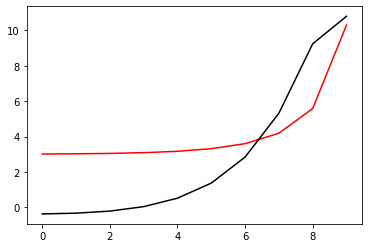

4000 96.00225308457658 -1.2764108900510458
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


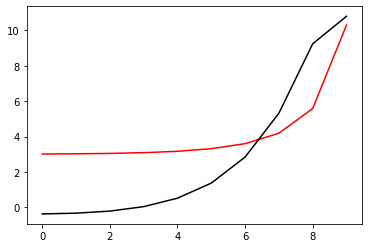

4200 96.0022530845766 -1.276410889225685
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


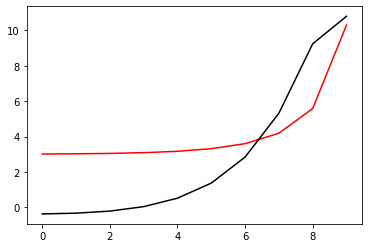

4400 96.0022530845766 -1.2764109033546907
[-0.36546879 -0.32439744 -0.20682892  0.04443023  0.52148196  1.3731283
  2.8419499   5.31861091  9.23575554 10.79110693]


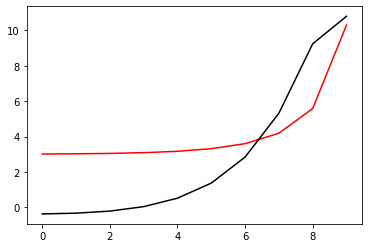

4600 96.00225308457658 -1.2764108900523532
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


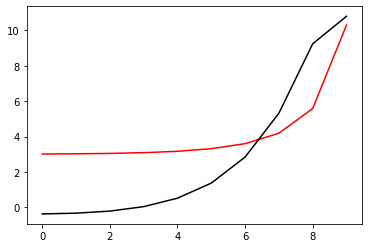

4800 96.00225319945804 -1.2763340625657609
[-0.36551567 -0.32445186 -0.20689575  0.04435362  0.52140187  1.373055
  2.84189651  5.31858737  9.23575627 10.79110933]


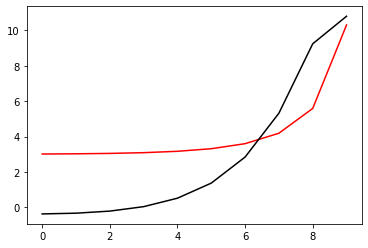

5000 96.00225308457658 -1.2764108909175909
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


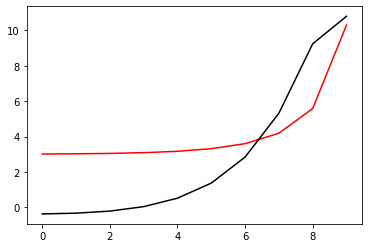

5200 96.0022530845766 -1.276410890051858
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


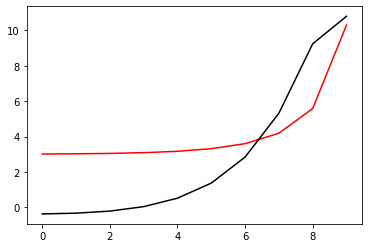

5400 96.00225308553 -1.2764179241799767
[-0.36546585 -0.32439476 -0.20682616  0.04443333  0.52148614  1.37313378
  2.84195732  5.31861695  9.23574737 10.79111057]


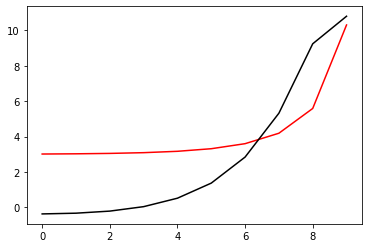

5600 96.00225308457661 -1.2764108901906417
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


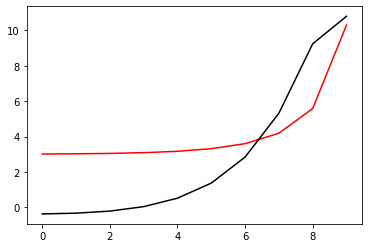

5800 96.0022530845766 -1.2764108900519033
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


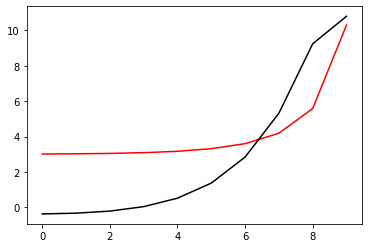

6000 96.00225308457658 -1.2764108878127138
[-0.36546884 -0.32439748 -0.20682892  0.04443028  0.52148207  1.37312845
  2.84195005  5.31861091  9.23575529 10.79110702]


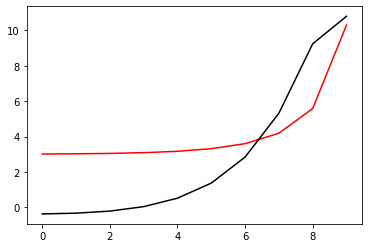

6200 96.00225308457658 -1.2764108900486177
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


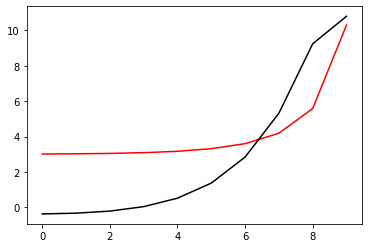

6400 96.0022530845766 -1.276410889198038
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


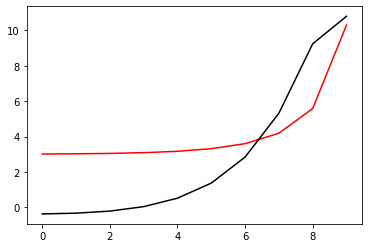

6600 96.0022530845766 -1.2764109156531256
[-0.36546878 -0.32439742 -0.20682891  0.04443024  0.52148197  1.37312831
  2.84194992  5.31861092  9.23575555 10.79110694]


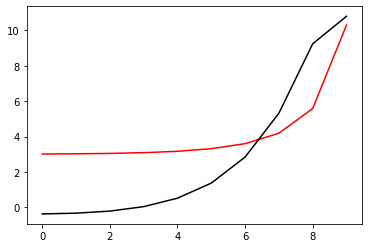

6800 96.00225308457658 -1.2764108900510795
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


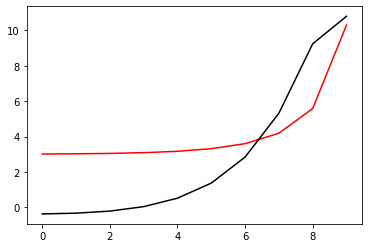

7000 96.00225308971618 -1.2764250495794773
[-0.36540042 -0.3243329  -0.20677592  0.04447174  0.52151617  1.37316219
  2.84199197  5.31866661  9.23581782 10.79115002]


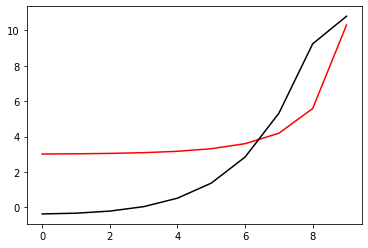

7200 96.00225308457658 -1.276410891017368
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


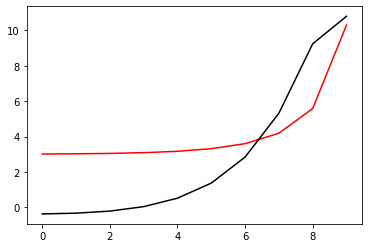

7400 96.0022530845766 -1.2764108900518414
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


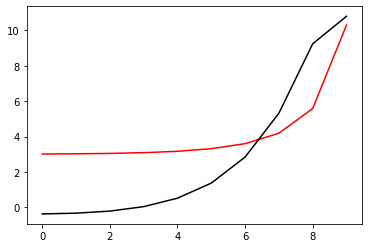

7600 96.00225308462109 -1.2764094109695594
[-0.36547109 -0.32439962 -0.20683081  0.04442889  0.52148151  1.3731291
  2.84195178  5.31861235  9.23574113 10.79110334]


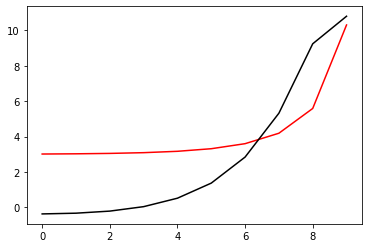

7800 96.00225308457658 -1.276410890262894
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


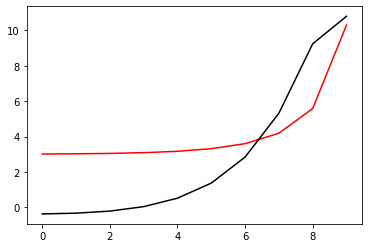

8000 96.0022530845766 -1.2764108900517905
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


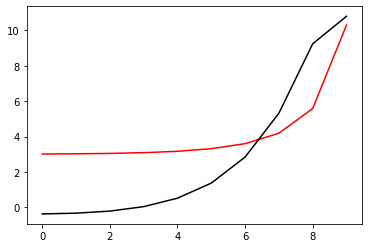

8200 96.00225308461981 -1.2764123877195428
[-0.36546788 -0.32439663 -0.20682823  0.0444307   0.5214822   1.3731282
  2.84194925  5.31861053  9.23575849 10.79110763]


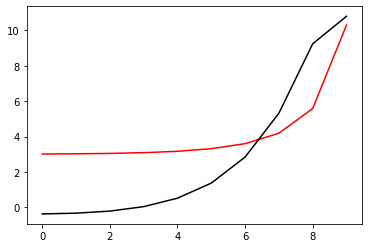

8400 96.0022530845766 -1.276410890093085
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


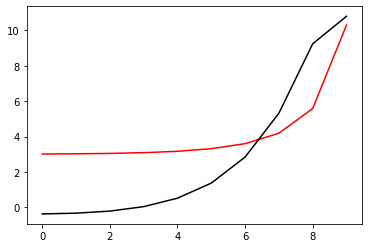

8600 96.00225308457658 -1.2764108900530102
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


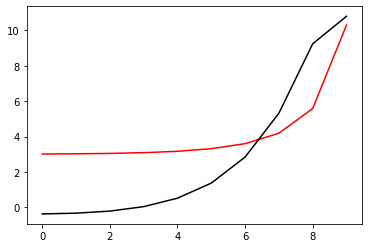

8800 96.00225308457674 -1.276410806310202
[-0.36546887 -0.32439752 -0.206829    0.04443015  0.52148188  1.37312822
  2.84194983  5.31861083  9.23575545 10.79110683]


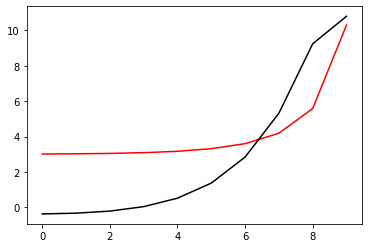

9000 96.00225308457658 -1.2764108900554791
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


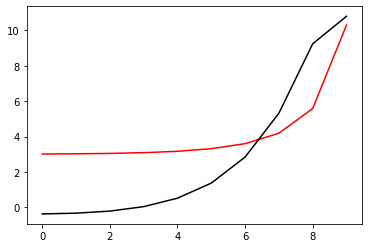

9200 96.0022530845766 -1.2764108895926083
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


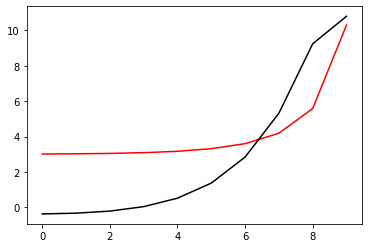

9400 96.0022530845766 -1.2764108887002528
[-0.3654688  -0.32439744 -0.20682892  0.04443023  0.52148196  1.3731283
  2.84194991  5.31861091  9.23575555 10.79110694]


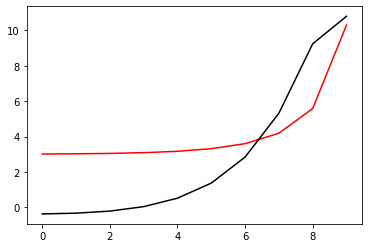

9600 96.00225308457658 -1.2764108900527622
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


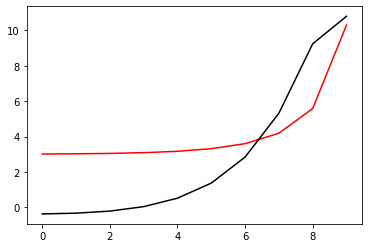

9800 96.0022530845766 -1.276410890096366
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


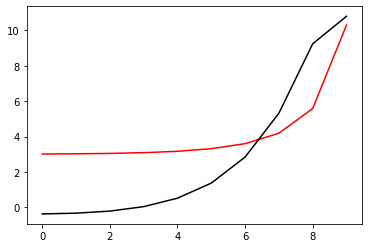

10000 96.00225308457658 -1.2764108797622187
[-0.36546881 -0.32439745 -0.20682894  0.0444302   0.52148192  1.37312826
  2.84194987  5.31861089  9.23575554 10.79110692]


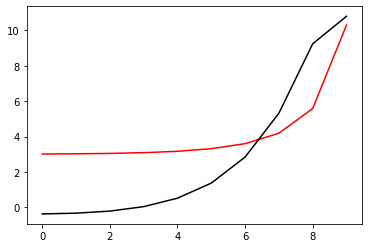

10200 96.0022530845766 -1.2764108900521627
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


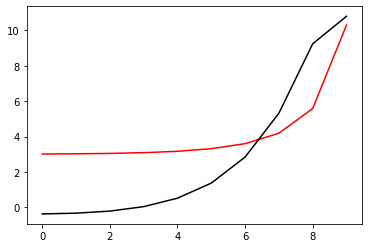

10400 96.00225308457658 -1.2764108900511992
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


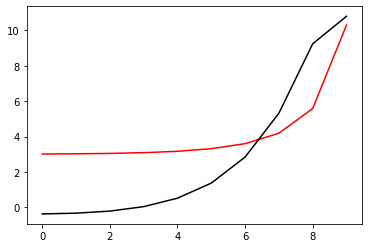

10600 96.00225308457661 -1.2764109010102485
[-0.36546876 -0.3243974  -0.20682888  0.04443027  0.521482    1.37312834
  2.84194994  5.31861093  9.23575552 10.7911069 ]


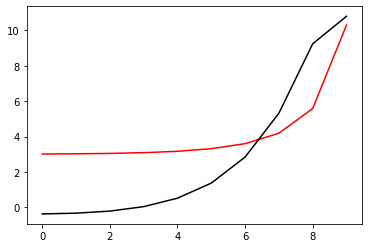

10800 96.00225308457657 -1.2764108900486997
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


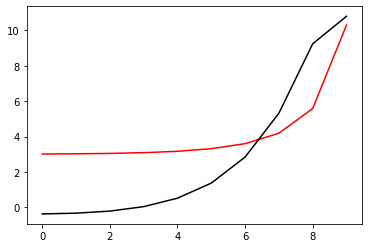

11000 96.00225308457658 -1.2764108901198288
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


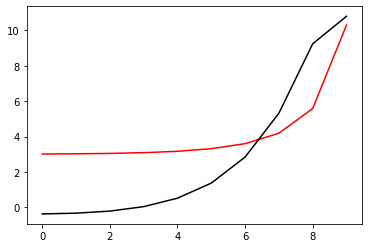

11200 96.00225308457658 -1.2764108858262402
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148194  1.37312827
  2.84194989  5.31861091  9.23575556 10.79110694]


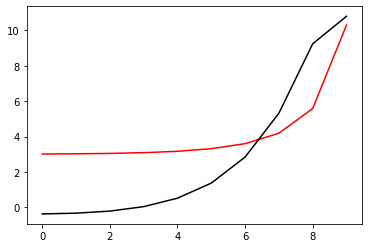

11400 96.00225308457658 -1.2764108900515048
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


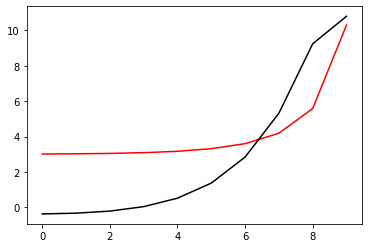

11600 96.00225320551148 -1.2763322717681211
[-0.3655358  -0.32446342 -0.20689367  0.04436696  0.52142056  1.37306947
  2.84189493  5.31856175  9.23571394 10.79106931]


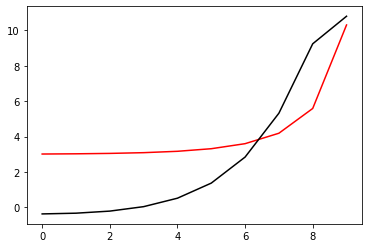

11800 96.00225308457658 -1.2764108911179342
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


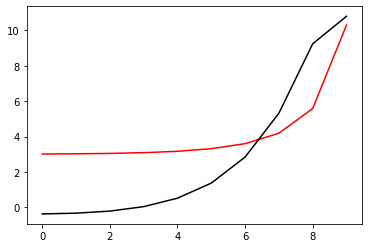

12000 96.0022530845766 -1.2764108900517044
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


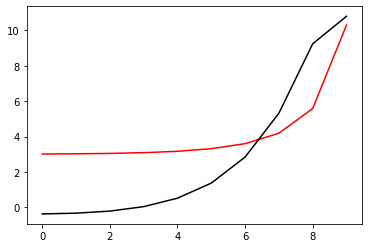

12200 96.00225308495301 -1.2764156374559874
[-0.36546663 -0.32440246 -0.20684769  0.04439448  0.52143395  1.37307817
  2.84191187  5.31859937  9.23577076 10.79109326]


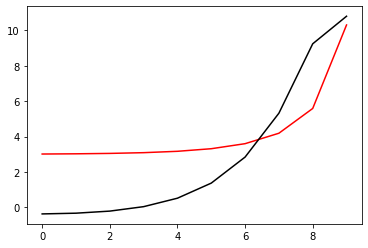

12400 96.0022530845766 -1.2764108895139619
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


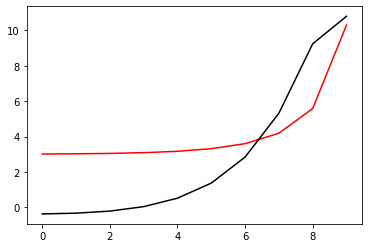

12600 96.0022530845766 -1.2764108900518596
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


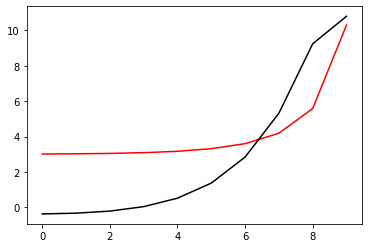

12800 96.00225308480857 -1.2764074501074065
[-0.36547186 -0.32440027 -0.20683139  0.04442836  0.52148093  1.37312848
  2.84195096  5.31861176  9.23574114 10.79110261]


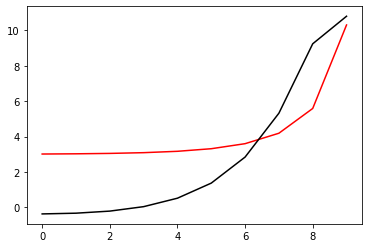

13000 96.0022530845766 -1.2764108899323867
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


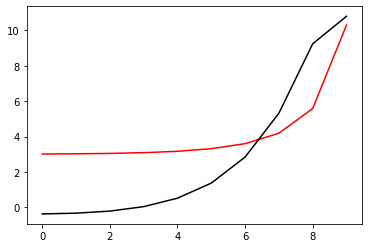

13200 96.0022530845766 -1.2764108900517679
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


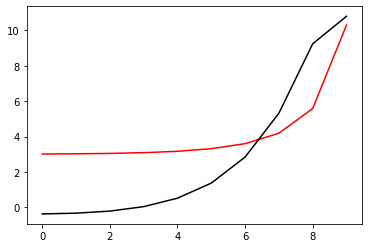

13400 96.00225308458529 -1.2764115648809649
[-0.36546838 -0.3243971  -0.20682871  0.04443028  0.52148174  1.37312772
  2.8419492   5.31861076  9.23575667 10.79110667]


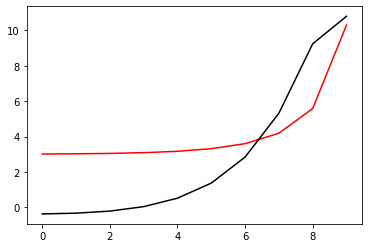

13600 96.0022530845766 -1.2764108900451838
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


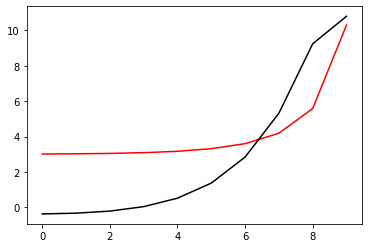

13800 96.0022530845766 -1.2764108900519697
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


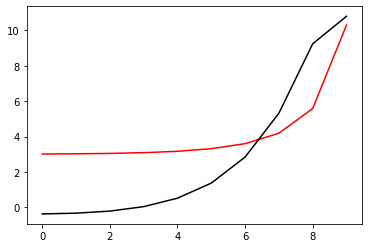

14000 96.0022530845786 -1.2764112198219884
[-0.36546874 -0.32439743 -0.20682899  0.04443004  0.52148167  1.37312803
  2.84194978  5.31861093  9.23575521 10.79110657]


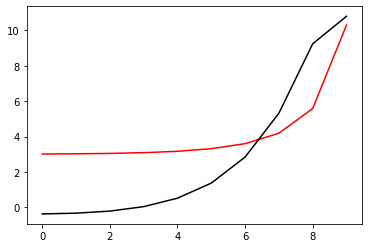

14200 96.00225308457658 -1.2764108900733824
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


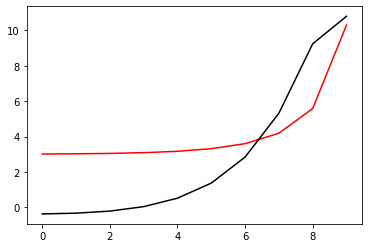

14400 96.00225308457658 -1.2764108900505426
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


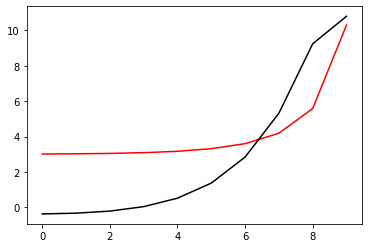

14600 96.00225308457676 -1.2764107949300716
[-0.36546885 -0.32439749 -0.20682897  0.04443018  0.52148192  1.37312826
  2.84194986  5.31861085  9.23575546 10.79110685]


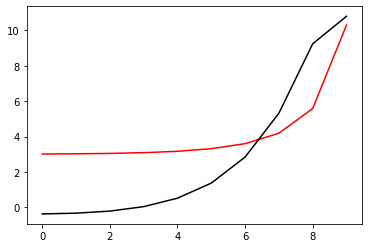

14800 96.00225308457657 -1.2764108900486288
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


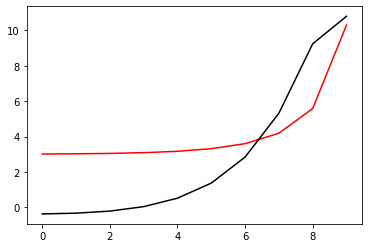

15000 96.00225308458126 -1.2764104058322385
[-0.36546927 -0.32439791 -0.20682939  0.04442977  0.52148151  1.37312787
  2.84194952  5.31861057  9.23575524 10.79110669]


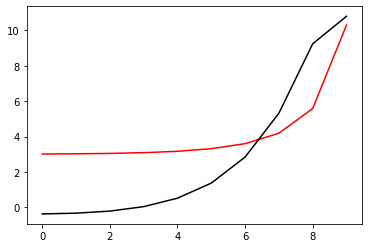

15200 96.0022530845766 -1.2764108937795702
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.2357555  10.79110693]


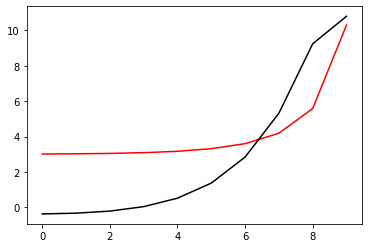

15400 96.0022530845766 -1.2764108900519466
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


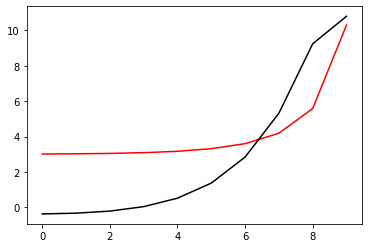

15600 96.00225308494015 -1.2764148488533704
[-0.3654589  -0.32438669 -0.20681701  0.04444352  0.5214965   1.37314385
  2.84196172  5.31861718  9.2357725  10.79111968]


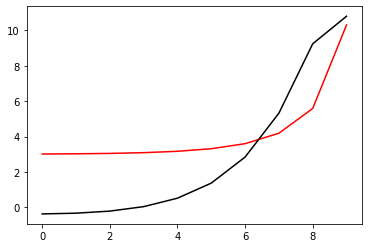

15800 96.0022530845766 -1.2764108905043694
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


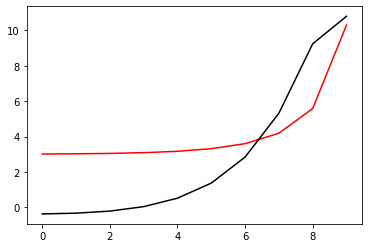

16000 96.0022530845766 -1.2764108900518212
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


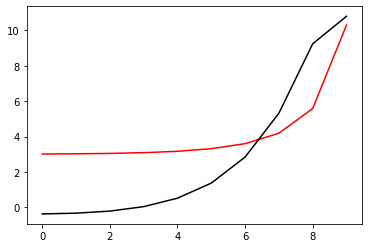

16200 96.00225308457667 -1.2764108216448908
[-0.36546829 -0.32439691 -0.20682842  0.04443062  0.52148223  1.37312828
  2.84194956  5.3186111   9.23575834 10.79110799]


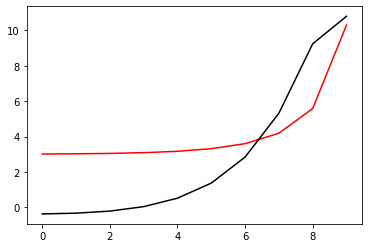

16400 96.00225308457661 -1.2764108900703248
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


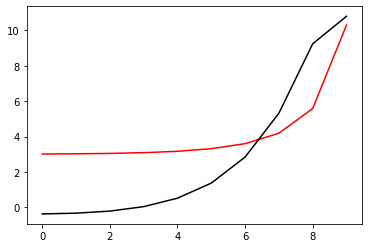

16600 96.0022530845766 -1.2764108900865356
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


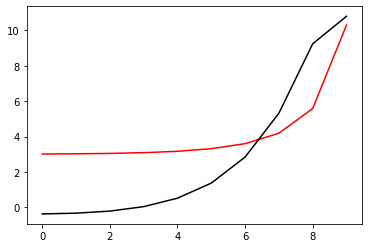

16800 96.00225308457664 -1.2764109371319368
[-0.36546873 -0.32439737 -0.20682886  0.04443028  0.521482    1.37312834
  2.84194996  5.31861098  9.23575561 10.791107  ]


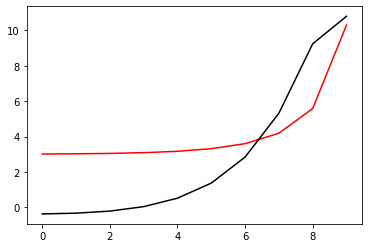

17000 96.0022530845766 -1.2764108900516988
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


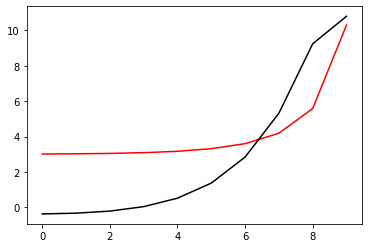

17200 96.00225322005647 -1.2764922336757358
[-0.36537689 -0.3243057  -0.20673771  0.04452024  0.52156966  1.37321179
  2.84202611  5.31867577  9.23580643 10.79114944]


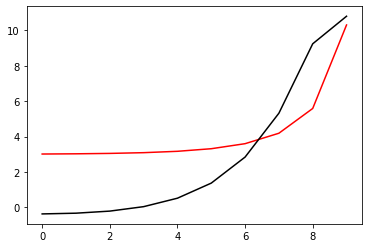

17400 96.0022530845766 -1.2764108861046342
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110692]


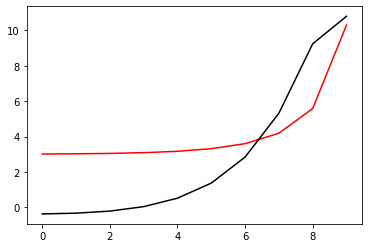

17600 96.0022530845766 -1.2764108900517754
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


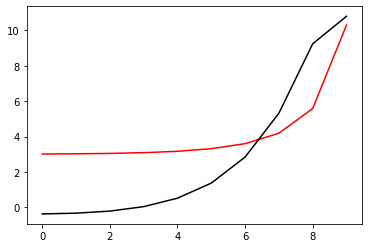

17800 96.00225308481772 -1.2764075533828583
[-0.36547598 -0.32440483 -0.20683618  0.0444234   0.52147625  1.37312416
  2.84194794  5.31860894  9.23573982 10.79110332]


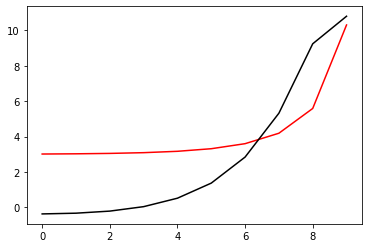

18000 96.0022530845766 -1.2764108902015074
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


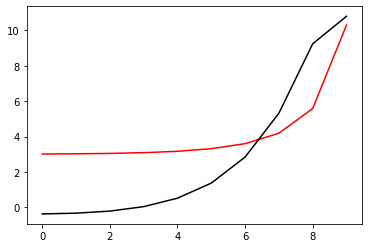

18200 96.0022530845766 -1.2764108900515998
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


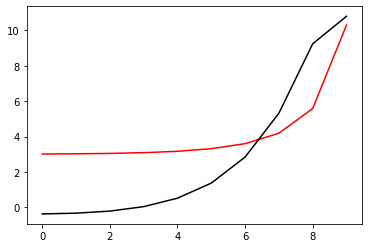

18400 96.00225308457664 -1.2764109456539123
[-0.36546891 -0.32439757 -0.20682908  0.04443008  0.52148187  1.37312829
  2.84194997  5.31861089  9.23575508 10.79110691]


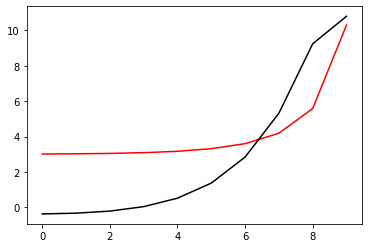

18600 96.00225308457658 -1.276410890039019
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


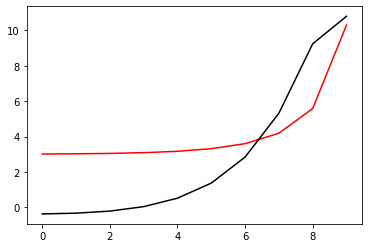

18800 96.0022530845766 -1.2764108901091344
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


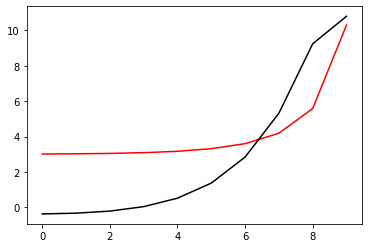

19000 96.00225308457661 -1.2764108672143344
[-0.36546881 -0.32439745 -0.20682894  0.0444302   0.52148193  1.37312826
  2.84194988  5.3186109   9.23575555 10.79110694]


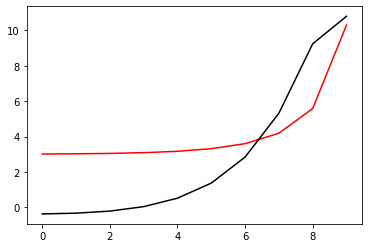

19200 96.00225308457658 -1.2764108900504547
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


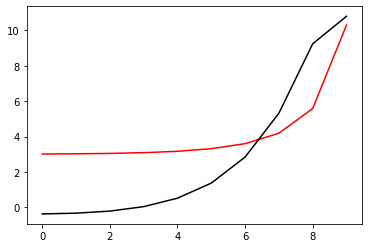

19400 96.0022533349363 -1.2762972669582697
[-0.36555588 -0.3244828  -0.20691232  0.04434896  0.5214031   1.37305235
  2.84187795  5.31854491  9.23569769 10.79105282]


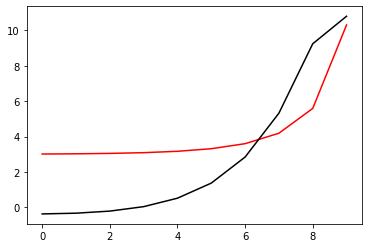

19600 96.00225308457658 -1.276410893660789
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575552 10.79110693]


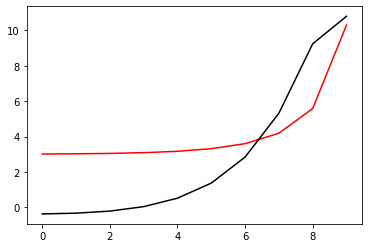

19800 96.0022530845766 -1.2764108900518234
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


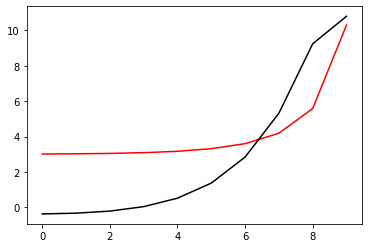

20000 96.00225308493069 -1.2764066940343712
[-0.36547387 -0.3244024  -0.20683357  0.04442616  0.52147886  1.37312657
  2.84194948  5.31861035  9.2357397  10.79110217]


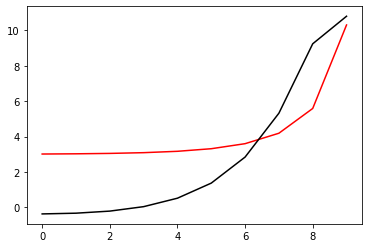

20200 96.0022530845766 -1.2764108900056788
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


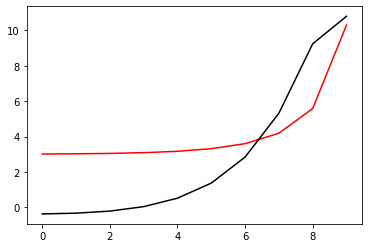

20400 96.0022530845766 -1.276410890051901
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


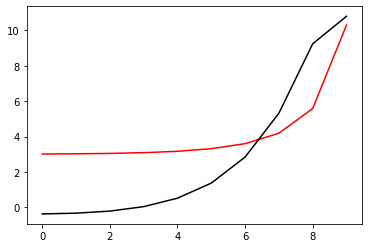

20600 96.00225308458474 -1.2764102495249483
[-0.36546927 -0.32439794 -0.20682949  0.04442954  0.52148109  1.37312712
  2.8419486   5.31861025  9.23575661 10.79110663]


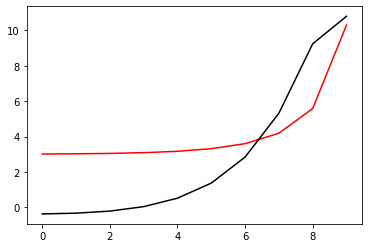

20800 96.00225308457658 -1.2764108900908784
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


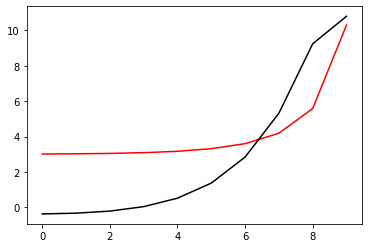

21000 96.0022530845766 -1.2764108900378333
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


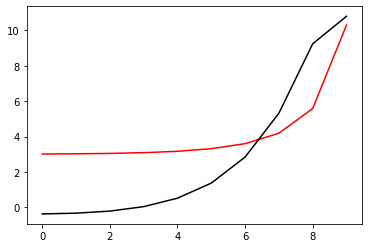

21200 96.00225308457667 -1.276410950721264
[-0.36546876 -0.3243974  -0.2068289   0.04443023  0.52148195  1.37312828
  2.8419499   5.31861092  9.23575555 10.79110694]


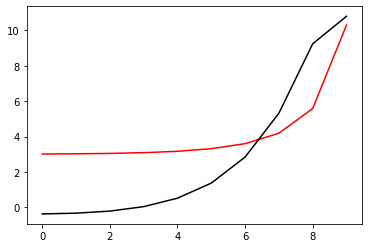

21400 96.00225308457658 -1.2764108900498536
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


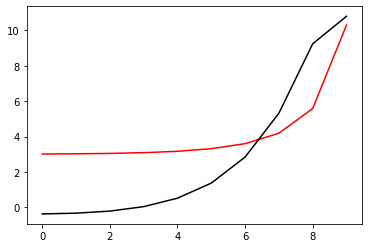

21600 96.00225309170413 -1.2764297503538784
[-0.36544987 -0.32437865 -0.20681034  0.04444849  0.52149972  1.37314523
  2.84196549  5.3186244   9.23576641 10.79111633]


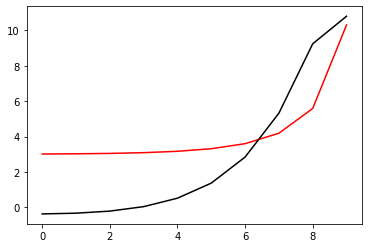

21800 96.0022530845766 -1.2764108880000493
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


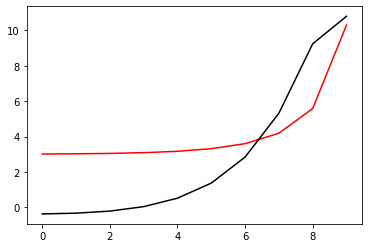

22000 96.0022530845766 -1.2764108900516686
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


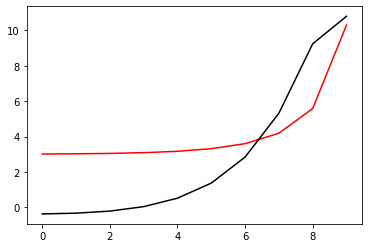

22200 96.00225308515594 -1.276416300763779
[-0.36546459 -0.3243932  -0.20682449  0.04443509  0.52148754  1.37313493
  2.8419573   5.31861748  9.23574602 10.7911076 ]


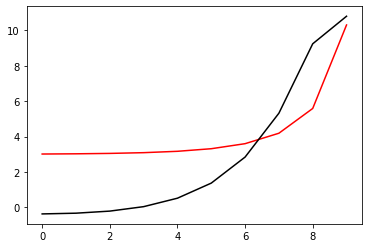

22400 96.00225308457658 -1.2764108902119913
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


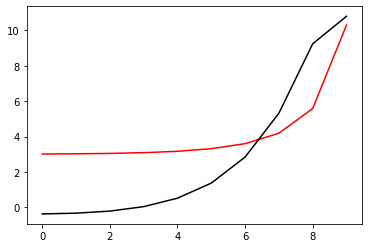

22600 96.0022530845766 -1.2764108900517832
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


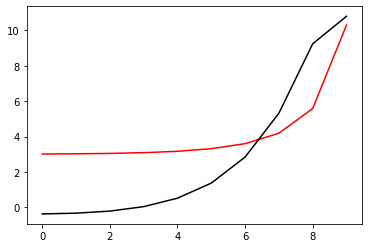

22800 96.00225308460416 -1.2764120632735665
[-0.36546746 -0.32439613 -0.20682771  0.04443129  0.52148278  1.3731287
  2.84195003  5.31861152  9.23575776 10.79110749]


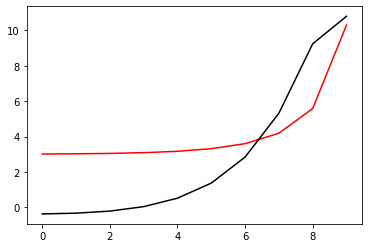

23000 96.0022530845766 -1.2764108900718683
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


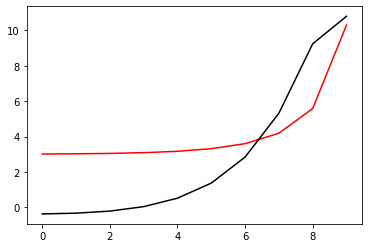

23200 96.0022530845766 -1.2764108900516877
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


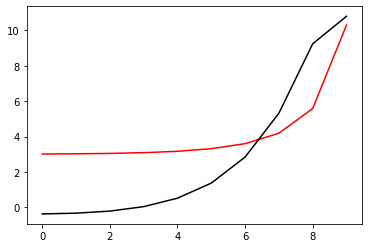

23400 96.00225308457715 -1.276411053246796
[-0.36546856 -0.3243972  -0.2068287   0.04443045  0.52148223  1.37312867
  2.84195037  5.31861131  9.23575542 10.79110722]


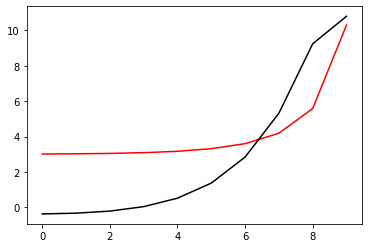

23600 96.00225308457658 -1.2764108900636337
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


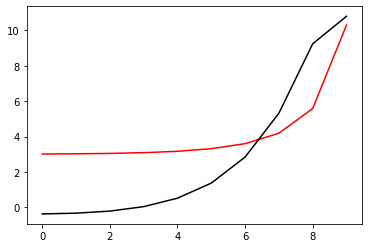

23800 96.00225308457658 -1.2764108900573945
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


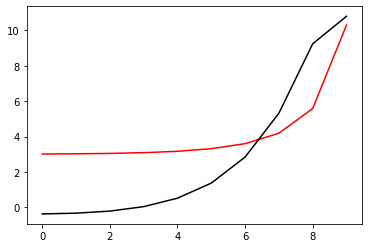

24000 96.00225308457665 -1.2764108288941733
[-0.36546882 -0.32439746 -0.20682895  0.04443018  0.52148191  1.37312826
  2.84194989  5.31861091  9.23575555 10.79110695]


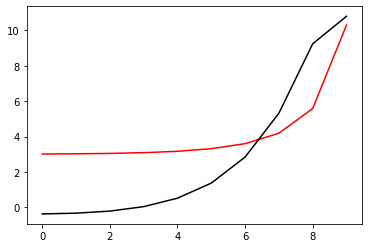

24200 96.0022530845766 -1.2764108900542948
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


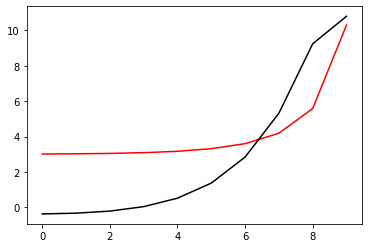

24400 96.00225311353842 -1.2763725847142013
[-0.36550378 -0.32443201 -0.20686296  0.04439688  0.52144957  1.37309735
  2.8419212   5.31858561  9.23573457 10.79108836]


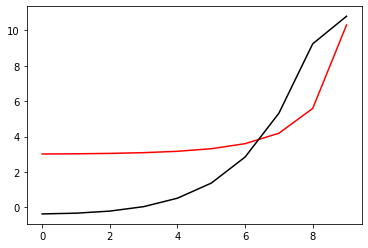

24600 96.0022530845766 -1.2764108938061391
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148196  1.3731283
  2.84194991  5.31861091  9.23575552 10.79110693]


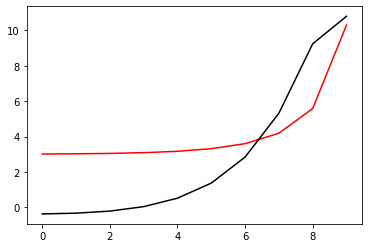

24800 96.0022530845766 -1.2764108900519373
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


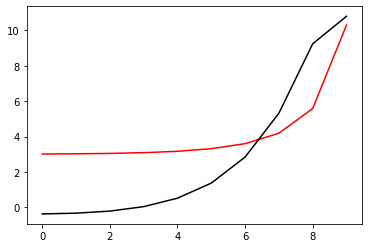

25000 96.0022530887281 -1.2763965217058229
[-0.36548457 -0.32441317 -0.20684422  0.04441503  0.52146707  1.37311179
  2.84192775  5.3185884   9.23575648 10.79109224]


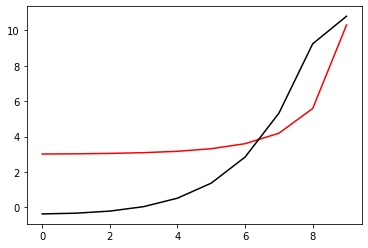

25200 96.00225308457658 -1.2764108900450177
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


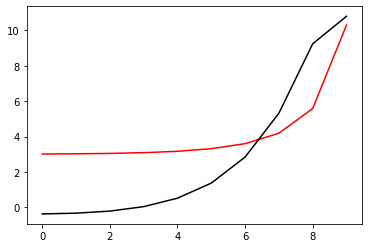

25400 96.0022530845766 -1.2764108900518962
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


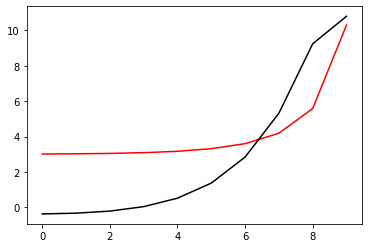

25600 96.00225308482678 -1.2764143692190084
[-0.36546397 -0.32439246 -0.2068238   0.04443543  0.52148732  1.37313356
  2.84195518  5.31861523  9.23575671 10.79110881]


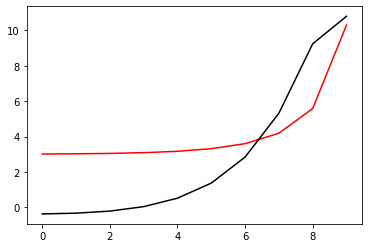

25800 96.00225308457658 -1.276410889946706
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


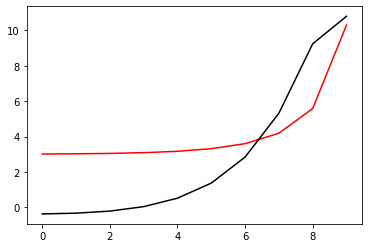

26000 96.0022530845766 -1.276410890052155
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


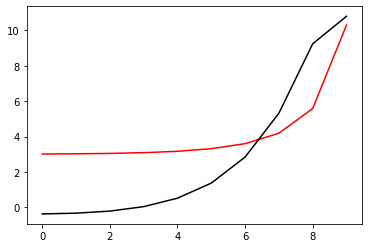

26200 96.00225308457667 -1.2764108306280317
[-0.36546886 -0.32439747 -0.20682892  0.04443026  0.52148201  1.37312835
  2.84194993  5.31861085  9.23575538 10.79110686]


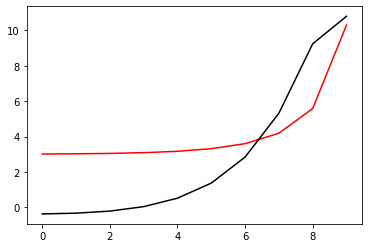

26400 96.0022530845766 -1.2764108900575746
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


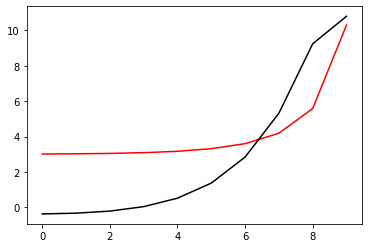

26600 96.00225308457667 -1.2764109522267069
[-0.36546874 -0.32439739 -0.20682887  0.04443028  0.52148201  1.37312835
  2.84194995  5.31861095  9.23575555 10.79110696]


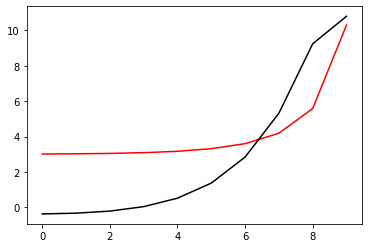

26800 96.00225308457658 -1.2764108858658445
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.3731283
  2.84194991  5.3186109   9.2357555  10.79110692]


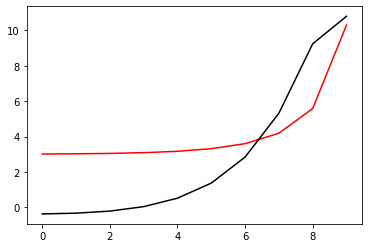

27000 96.0022530845766 -1.2764108900518283
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


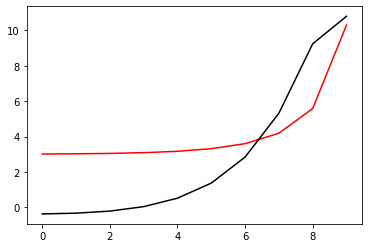

27200 96.00225311935286 -1.2764516267305064
[-0.36539897 -0.3243296  -0.2067666   0.04448166  0.52152153  1.37316308
  2.84199301  5.31867872  9.23585408 10.79116615]


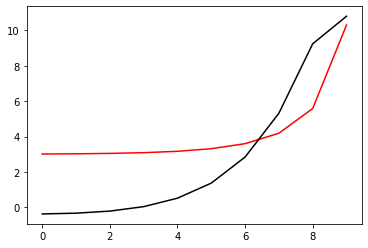

27400 96.00225308457661 -1.2764108887695005
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


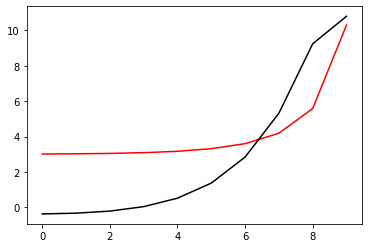

27600 96.0022530845766 -1.2764108900518751
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


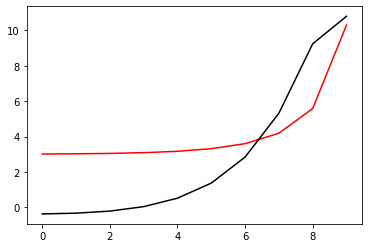

27800 96.00225308548141 -1.276417458550383
[-0.36545922 -0.32438728 -0.20681799  0.0444422   0.52149529  1.37314251
  2.84196457  5.31861879  9.23575144 10.7911121 ]


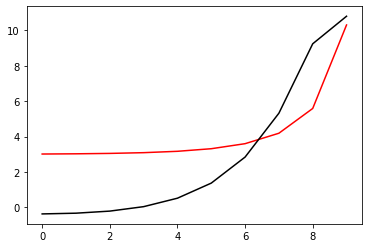

28000 96.0022530845766 -1.2764108901590707
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


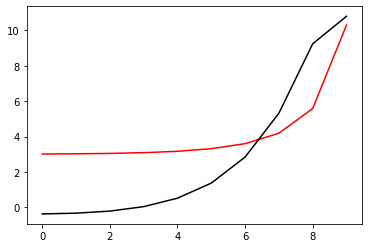

28200 96.0022530845766 -1.2764108900517683
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


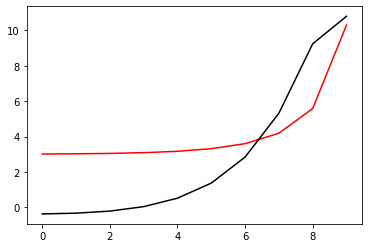

28400 96.00225308458847 -1.2764116493395838
[-0.36546768 -0.32439634 -0.20682785  0.04443119  0.52148278  1.37312907
  2.84195084  5.31861218  9.23575679 10.79110782]


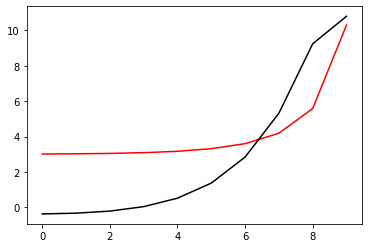

28600 96.00225308457658 -1.276410890066635
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


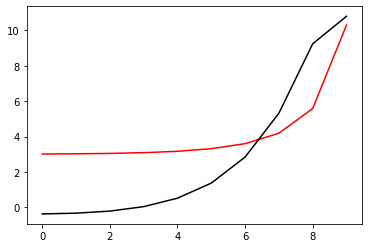

28800 96.0022530845766 -1.2764108900518099
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


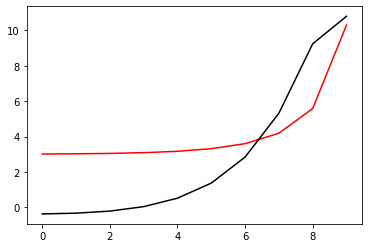

29000 96.00225308458049 -1.2764113014780183
[-0.36546759 -0.3243962  -0.20682771  0.04443133  0.52148292  1.3731289
  2.84195016  5.31861171  9.2357588  10.79110834]


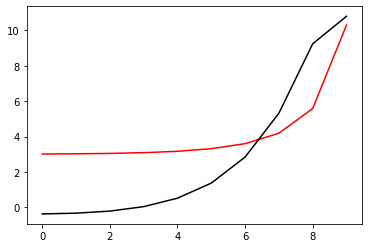

29200 96.00225308457658 -1.2764108900082887
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


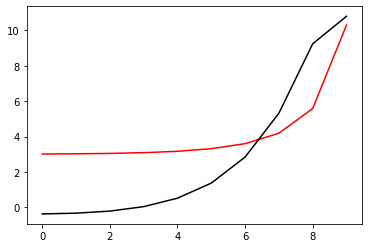

29400 96.0022530845766 -1.2764108900517561
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


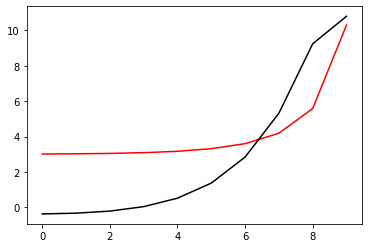

29600 96.00225308458499 -1.2764115381458923
[-0.36546806 -0.32439673 -0.20682825  0.04443079  0.5214824   1.37312873
  2.84195051  5.31861179  9.23575626 10.79110747]


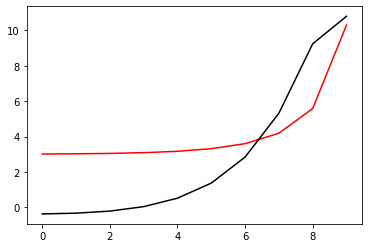

29800 96.00225308457658 -1.2764108900309357
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


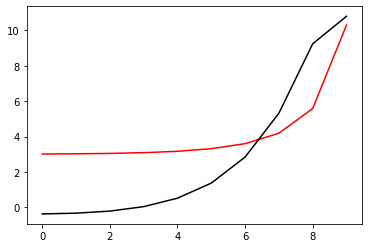

30000 96.0022530845766 -1.2764108899911486
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


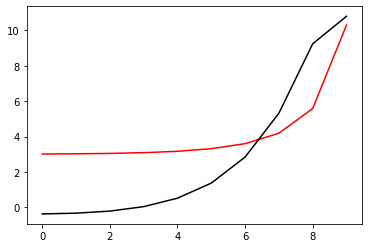

30200 96.00225308457661 -1.2764109221142526
[-0.36546876 -0.3243974  -0.20682889  0.04443025  0.52148197  1.37312831
  2.84194992  5.31861094  9.23575558 10.79110697]


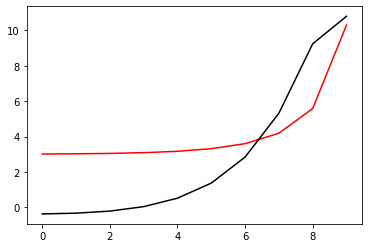

30400 96.00225308457658 -1.2764108900523985
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


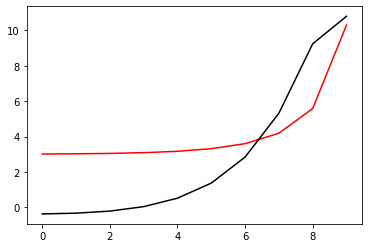

30600 96.0022530911229 -1.2763927233356849
[-0.36548596 -0.32441443 -0.20684567  0.0444138   0.521466    1.37311306
  2.84193582  5.31859858  9.2357454  10.79109805]


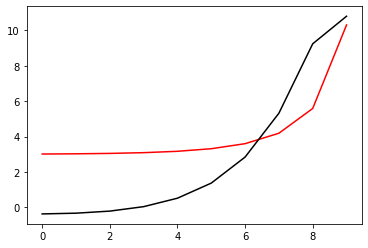

30800 96.0022530845766 -1.2764108870832442
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


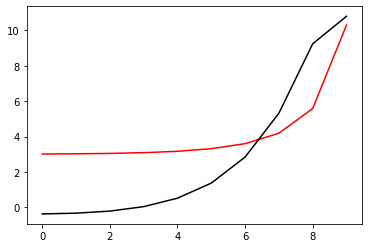

31000 96.0022530845766 -1.2764108900517621
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


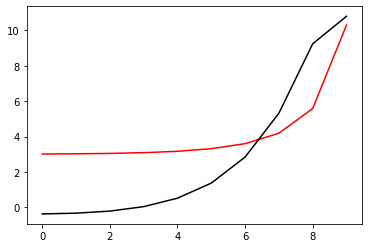

31200 96.00225310135433 -1.2763810580629413
[-0.36547007 -0.32439991 -0.20683544  0.04441498  0.52145633  1.3730989
  2.84193047  5.31862008  9.23580353 10.79111823]


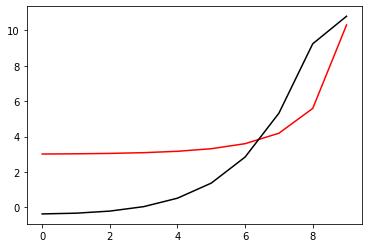

31400 96.0022530845766 -1.2764108907438203
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


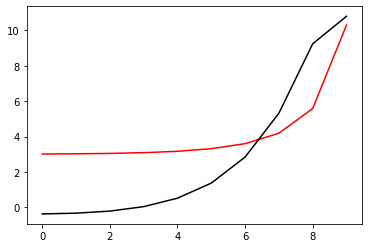

31600 96.0022530845766 -1.2764108900518407
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


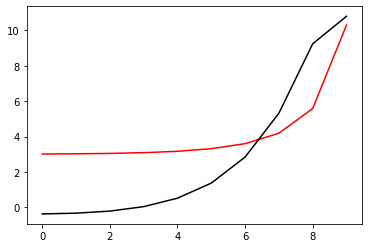

31800 96.00225308458879 -1.276411506810229
[-0.36546594 -0.32439398 -0.20682464  0.04443576  0.52148903  1.37313654
  2.84195863  5.31861205  9.23574617 10.79110722]


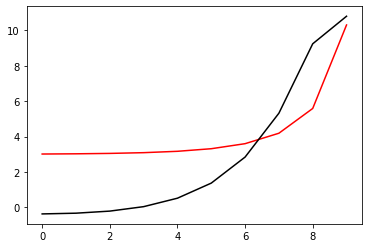

32000 96.00225308457658 -1.276410889874408
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


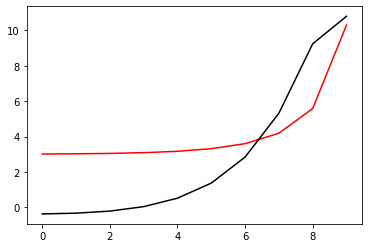

32200 96.0022530845766 -1.2764108900518494
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


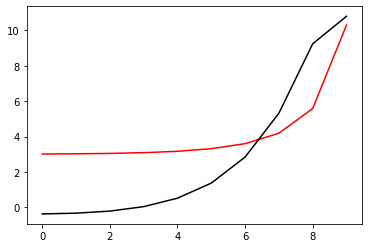

32400 96.00225308482308 -1.2764073981565949
[-0.36547363 -0.32440218 -0.20683321  0.04442671  0.52148003  1.37312808
  2.84195225  5.31861142  9.23574321 10.79110749]


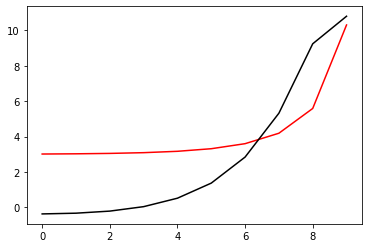

32600 96.00225308457658 -1.2764108898686641
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


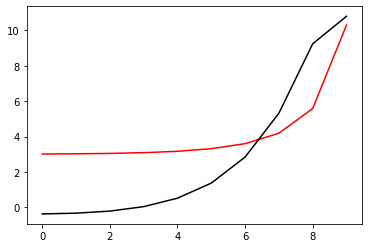

32800 96.0022530845766 -1.2764108900518618
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


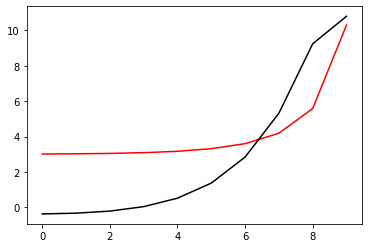

33000 96.00225308457749 -1.2764106707739293
[-0.36546887 -0.32439751 -0.206829    0.04443015  0.52148194  1.37312839
  2.84195011  5.31861108  9.23575524 10.79110705]


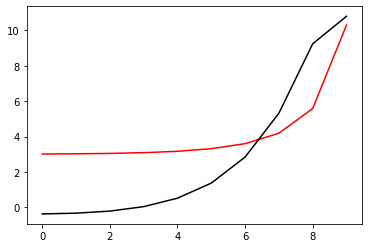

33200 96.00225308457658 -1.2764108900392395
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


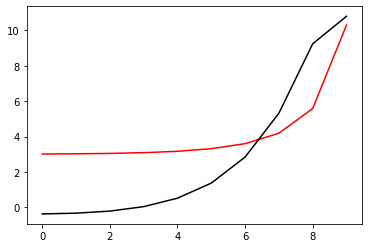

33400 96.00225308457658 -1.2764108900670665
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


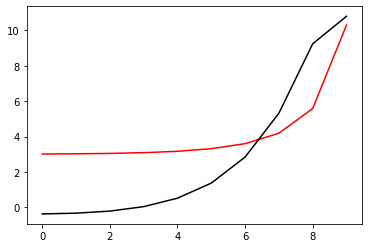

33600 96.0022530845766 -1.2764108853682514
[-0.3654688  -0.32439745 -0.20682894  0.0444302   0.52148191  1.37312825
  2.84194988  5.3186109   9.23575555 10.79110694]


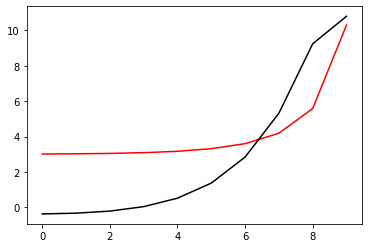

33800 96.00225308457658 -1.2764108900505864
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


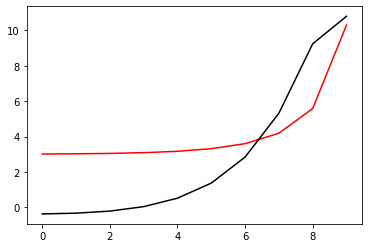

34000 96.0022530845766 -1.2764108895311443
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


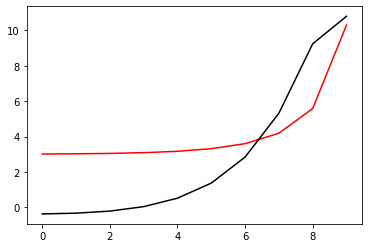

34200 96.00225308457658 -1.2764109147318514
[-0.36546877 -0.32439741 -0.20682889  0.04443025  0.52148199  1.37312832
  2.84194993  5.31861093  9.23575557 10.79110696]


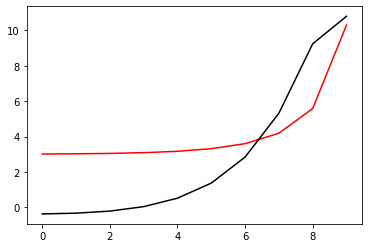

34400 96.00225308457658 -1.276410890052615
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


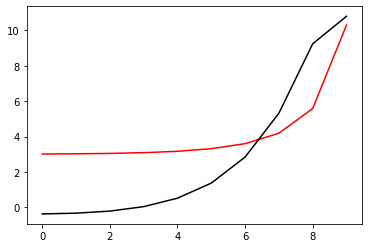

34600 96.00225310255604 -1.2764407993323197
[-0.36543832 -0.32436716 -0.20679896  0.04445969  0.52151061  1.37315561
  2.84197499  5.31863257  9.23577292 10.79112188]


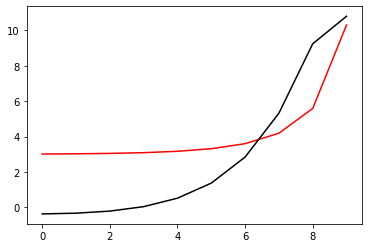

34800 96.0022530845766 -1.2764108938573149
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


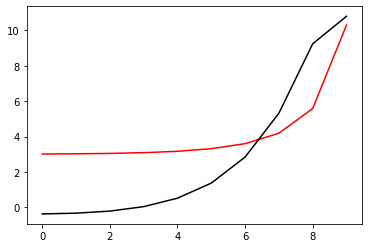

35000 96.0022530845766 -1.2764108900519688
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


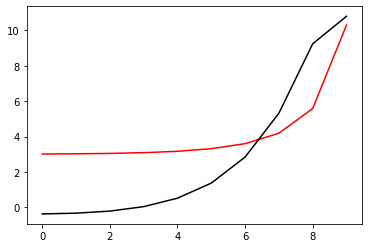

35200 96.00225314863503 -1.2764670996689726
[-0.3654087  -0.3243376  -0.20676957  0.04448868  0.52153885  1.3731825
  2.84199954  5.31865347  9.23578934 10.7911356 ]


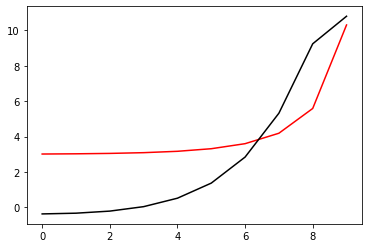

35400 96.00225308457658 -1.2764108935798013
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148196  1.3731283
  2.84194991  5.31861091  9.23575552 10.79110693]


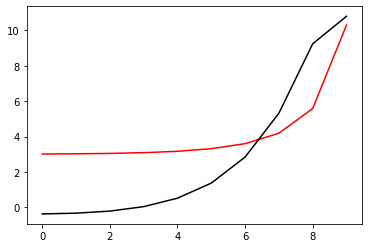

35600 96.0022530845766 -1.2764108900519693
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


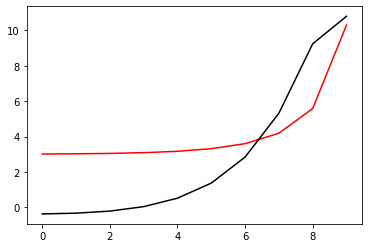

35800 96.00225308458974 -1.2764099749182727
[-0.36546308 -0.32439148 -0.20682322  0.04443524  0.52148531  1.37312622
  2.84194372  5.3186141   9.23579347 10.7911156 ]


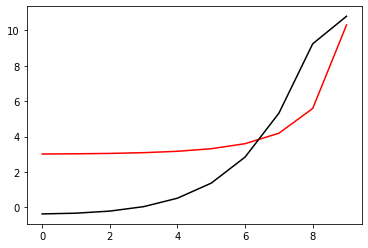

36000 96.00225308457658 -1.2764108907637104
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


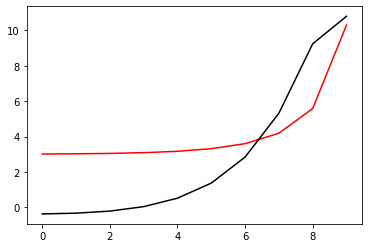

36200 96.0022530845766 -1.276410890051838
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


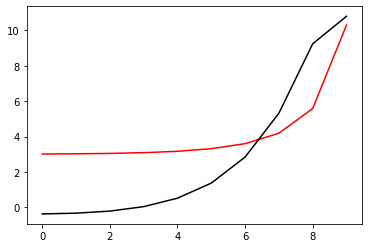

36400 96.00225308461276 -1.2764123435092891
[-0.36547127 -0.32440013 -0.2068315   0.04442804  0.52148086  1.37312861
  2.84195217  5.3186124   9.23574246 10.79110591]


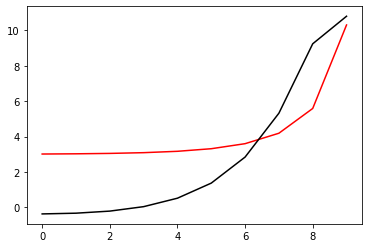

36600 96.00225308457658 -1.2764108901857778
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


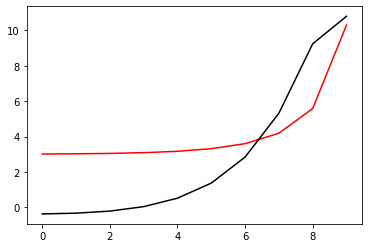

36800 96.0022530845766 -1.276410890051713
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


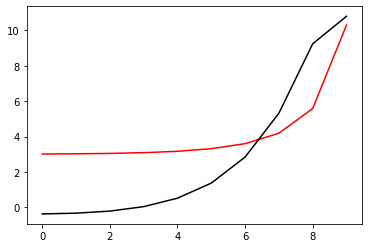

37000 96.00225308457671 -1.2764108034523753
[-0.36546857 -0.32439722 -0.20682873  0.04443034  0.52148196  1.3731283
  2.84195013  5.31861153  9.23575617 10.79110736]


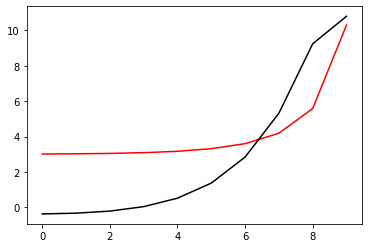

37200 96.00225308457658 -1.276410890044395
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


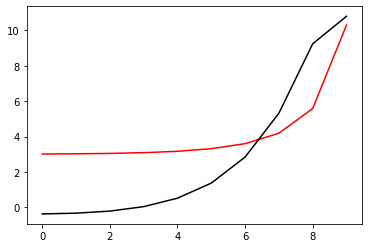

37400 96.00225308457658 -1.276410890054254
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


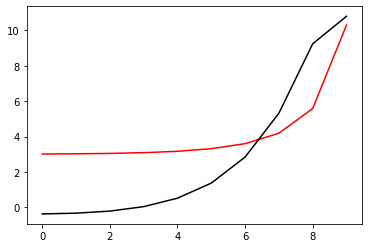

37600 96.00225308457667 -1.2764108258647544
[-0.3654689  -0.32439755 -0.20682904  0.0444301   0.52148183  1.37312817
  2.8419498   5.31861082  9.23575546 10.79110685]


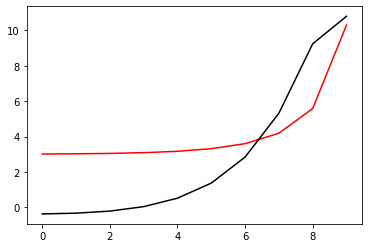

37800 96.00225308457658 -1.2764108900510196
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


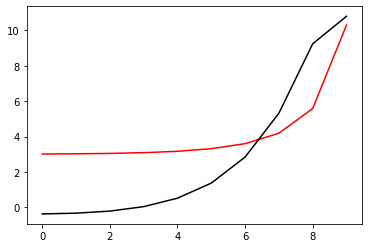

38000 96.0022530845989 -1.2764098316953707
[-0.36546983 -0.32439846 -0.20682993  0.04442923  0.52148099  1.37312738
  2.84194906  5.31861017  9.23575491 10.79110641]


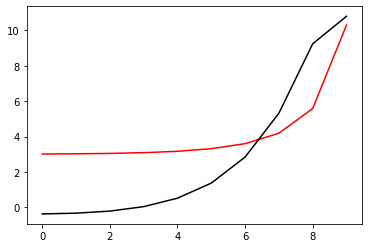

38200 96.00225308457661 -1.2764108851437939
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.31861091  9.2357555  10.79110693]


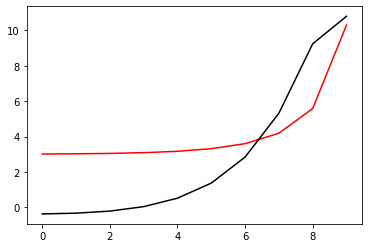

38400 96.0022530845766 -1.2764108900520221
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


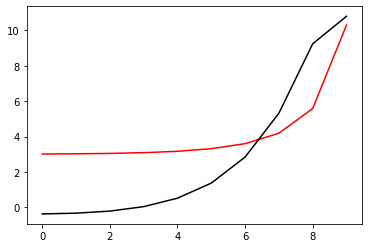

38600 96.00225308467985 -1.2764085008707147
[-0.36546865 -0.3243967  -0.20682738  0.04443294  0.52148609  1.37313355
  2.84195572  5.31861001  9.23574525 10.79110552]


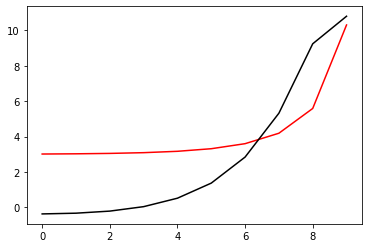

38800 96.0022530845766 -1.2764108903008036
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


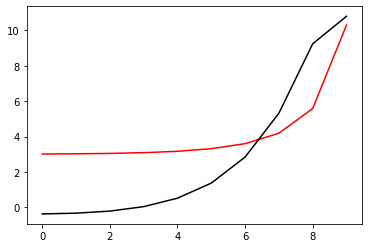

39000 96.00225308457658 -1.2764108900515332
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


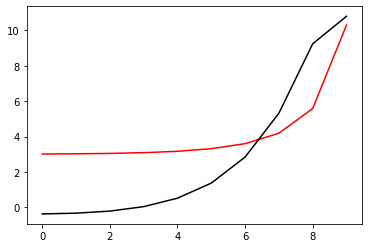

39200 96.00225308457676 -1.276410795451888
[-0.36546885 -0.32439748 -0.20682893  0.04443026  0.52148206  1.37312844
  2.84195001  5.31861083  9.23575506 10.79110681]


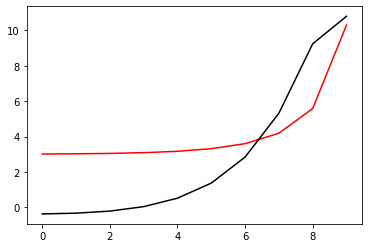

39400 96.00225308457657 -1.2764108900403726
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


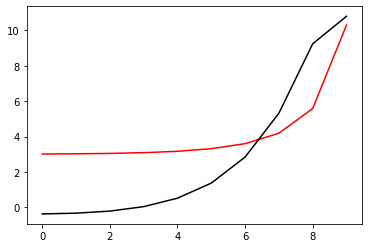

39600 96.00225308457729 -1.2764107032558427
[-0.36546898 -0.32439763 -0.2068291   0.04443004  0.52148178  1.37312813
  2.84194976  5.31861077  9.23575541 10.79110684]


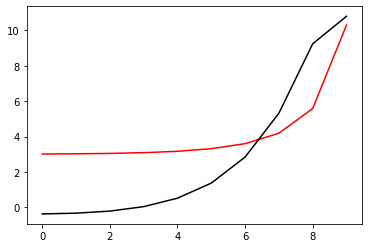

39800 96.0022530845766 -1.2764108943290635
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148196  1.3731283
  2.84194991  5.31861091  9.2357555  10.79110693]


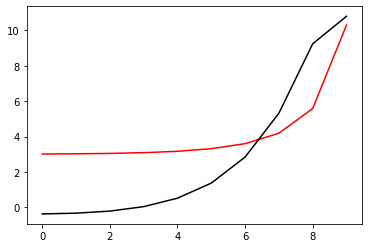

40000 96.0022530845766 -1.2764108900522204
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


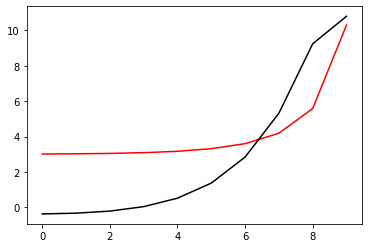

40200 96.00225308993203 -1.276394344967938
[-0.36548175 -0.32440975 -0.20684023  0.0444198   0.5214725   1.37311864
  2.84193549  5.31859407  9.23575713 10.79109821]


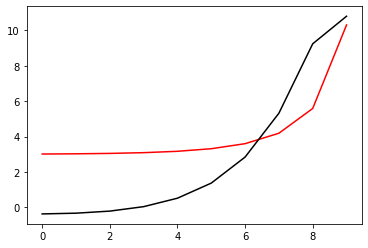

40400 96.00225308457658 -1.2764108896722803
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


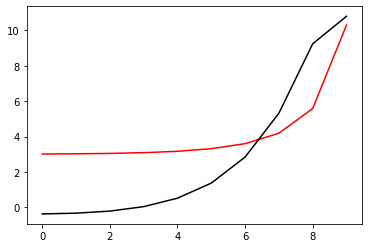

40600 96.0022530845766 -1.2764108900517381
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


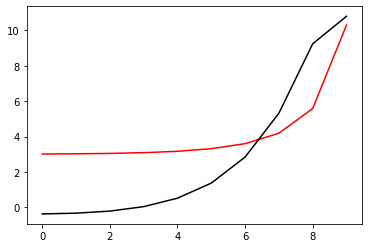

40800 96.00225308457664 -1.2764109333926745
[-0.36546894 -0.32439764 -0.20682921  0.04442978  0.52148125  1.37312729
  2.84194823  5.31860912  9.23575764 10.79110643]


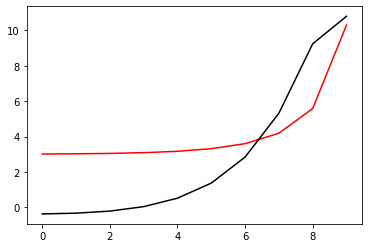

41000 96.00225308457658 -1.2764108900394247
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


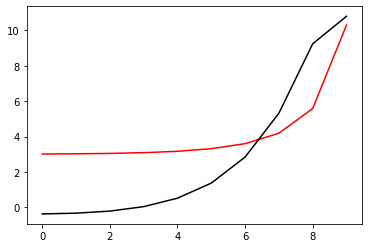

41200 96.0022530845766 -1.2764108900517668
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


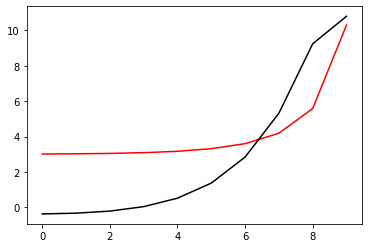

41400 96.00225308458789 -1.2764101322248615
[-0.36546934 -0.324398   -0.20682951  0.04442955  0.52148118  1.37312754
  2.8419494   5.31861082  9.2357555  10.79110674]


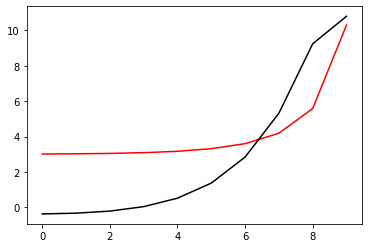

41600 96.00225308457658 -1.2764108900762499
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


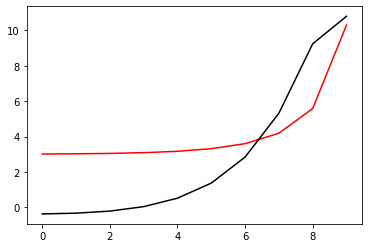

41800 96.0022530845766 -1.2764108900517432
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


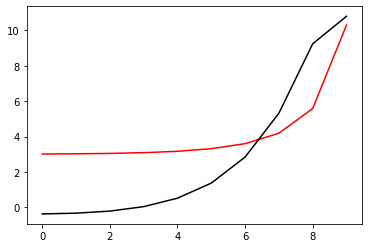

42000 96.00225308457763 -1.2764106670014774
[-0.36546919 -0.32439782 -0.20682927  0.04442993  0.52148172  1.3731281
  2.84194971  5.31861063  9.23575509 10.79110682]


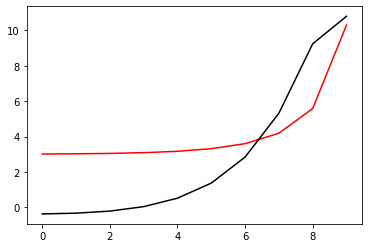

42200 96.0022530845766 -1.2764108900589166
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


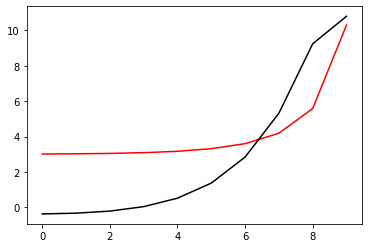

42400 96.00225308457658 -1.2764108900512998
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


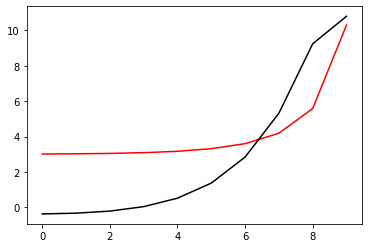

42600 96.002253084577 -1.2764110301073242
[-0.36546862 -0.32439723 -0.20682867  0.04443051  0.52148227  1.3731286
  2.84195016  5.31861103  9.2357555  10.791107  ]


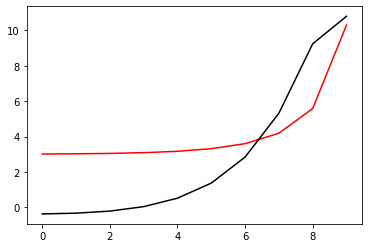

42800 96.0022530845766 -1.2764108900584605
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


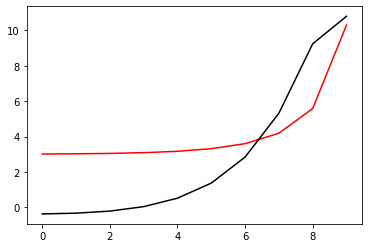

43000 96.00225308457678 -1.2764109926572822
[-0.3654687  -0.32439735 -0.20682883  0.04443031  0.52148204  1.37312838
  2.84194999  5.31861098  9.23575557 10.79110698]


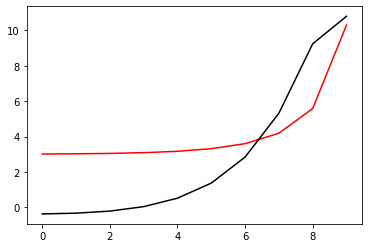

43200 96.0022530845766 -1.2764108855283691
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148196  1.3731283
  2.84194991  5.3186109   9.2357555  10.79110693]


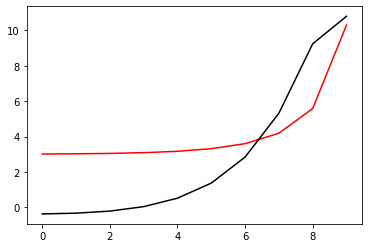

43400 96.0022530845766 -1.2764108900519908
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


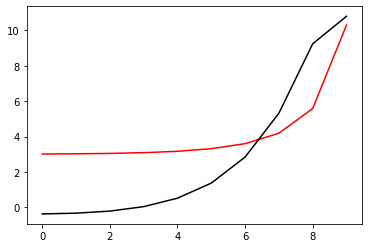

43600 96.00225316032119 -1.2764709639171654
[-0.36536387 -0.32429765 -0.20674324  0.04450061  0.5215414   1.37318441
  2.84201203  5.3186855   9.23583556 10.79115711]


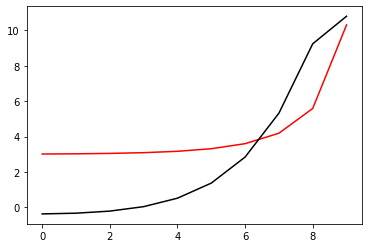

43800 96.00225308457658 -1.276410888074147
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


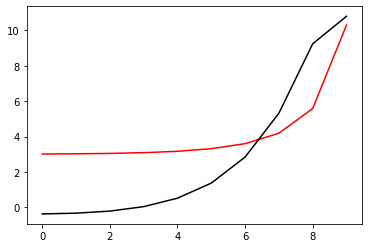

44000 96.0022530845766 -1.2764108900518771
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


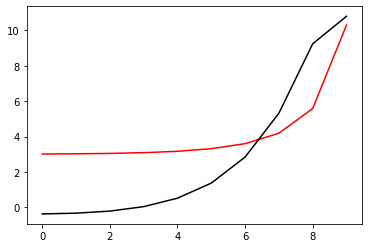

44200 96.0022531777612 -1.2763422045017259
[-0.36551993 -0.32445885 -0.20690438  0.04434389  0.52139162  1.37304514
  2.84188816  5.31858117  9.23575187 10.7911072 ]


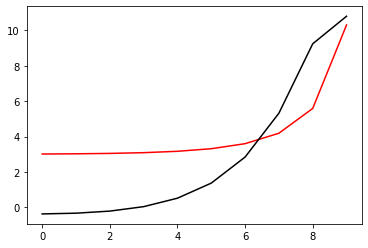

44400 96.0022530845766 -1.2764108919302846
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575552 10.79110693]


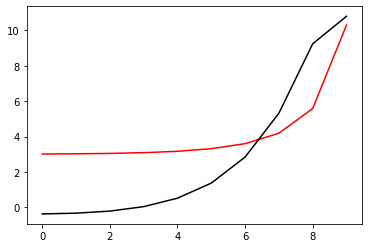

44600 96.0022530845766 -1.2764108900518603
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


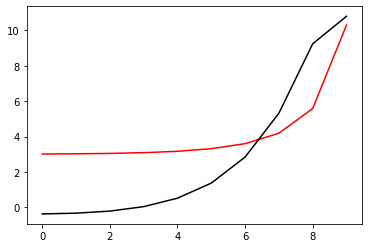

44800 96.00225313981566 -1.2764630530263255
[-0.36539763 -0.32433219 -0.20677745  0.04446538  0.52150485  1.37314688
  2.8419746   5.31865087  9.23580735 10.79112621]


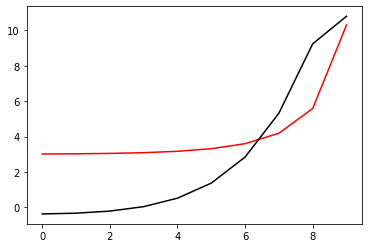

45000 96.0022530845766 -1.2764108896647028
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


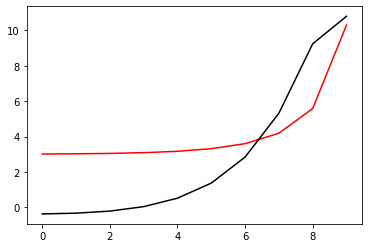

45200 96.0022530845766 -1.2764108900517575
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


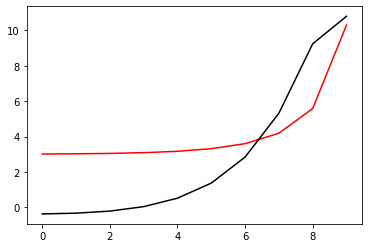

45400 96.00225308460462 -1.276409856386856
[-0.36547362 -0.32440247 -0.20683383  0.04442573  0.52147855  1.3731264
  2.84195005  5.31861083  9.2357413  10.79110472]


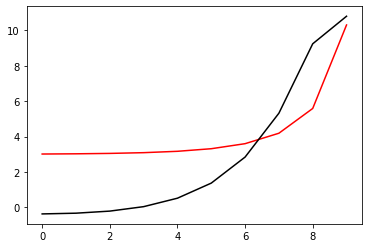

45600 96.00225308457658 -1.276410890229669
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


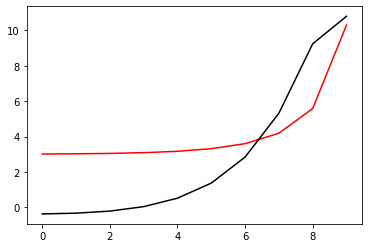

45800 96.0022530845766 -1.2764108900518405
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


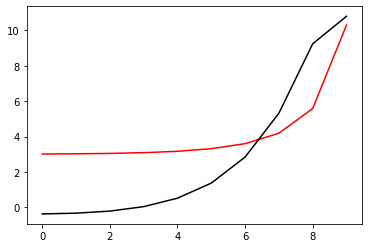

46000 96.002253084583 -1.276410328417699
[-0.36546944 -0.32439811 -0.20682964  0.04442943  0.52148113  1.37312754
  2.8419493   5.31861042  9.23575468 10.79110622]


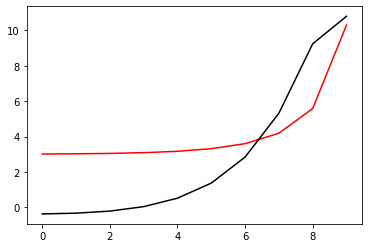

46200 96.00225308457658 -1.2764108900390458
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


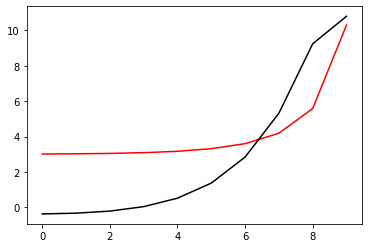

46400 96.0022530845766 -1.2764108900509605
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


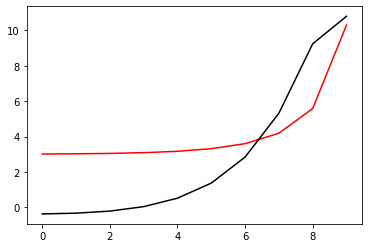

46600 96.0022530845766 -1.27641086314403
[-0.36546878 -0.32439742 -0.2068289   0.04443026  0.52148199  1.37312833
  2.84194993  5.31861091  9.23575551 10.79110689]


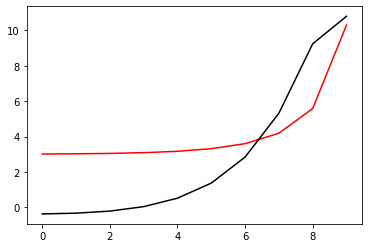

46800 96.00225308457658 -1.2764108900499243
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


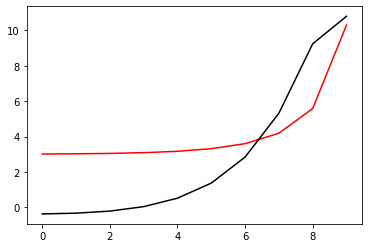

47000 96.00225308457658 -1.276410892952118
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


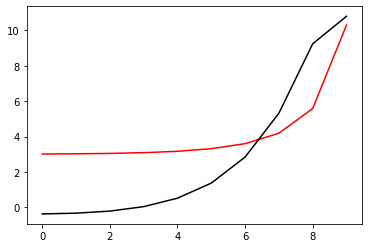

47200 96.00225308457658 -1.2764108719263976
[-0.36546882 -0.32439746 -0.20682894  0.04443021  0.52148194  1.37312828
  2.84194989  5.31861088  9.2357555  10.79110691]


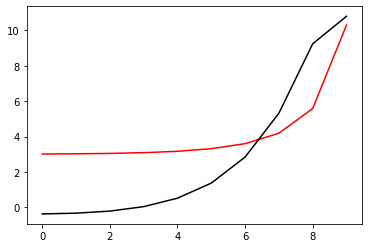

47400 96.00225308457658 -1.2764108900512845
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


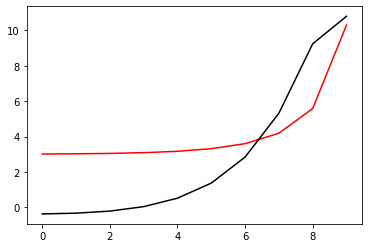

47600 96.00225308821877 -1.2763957287148675
[-0.36541151 -0.32434144 -0.2067742   0.04448296  0.52153177  1.37317363
  2.84198776  5.3186364   9.23576481 10.79110079]


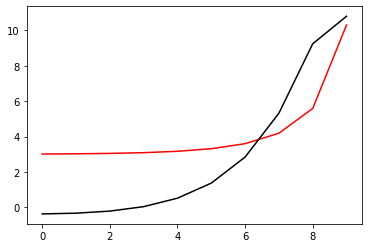

47800 96.00225308457658 -1.2764108903596956
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


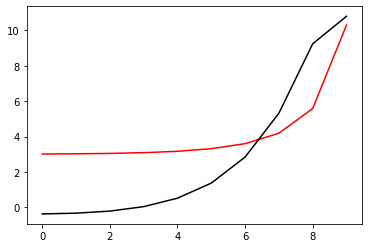

48000 96.0022530845766 -1.2764108900518893
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


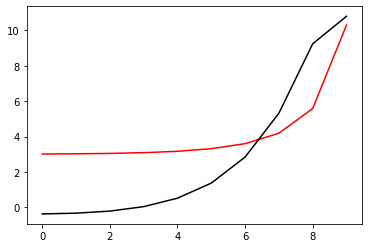

48200 96.00225308569651 -1.2764035240673546
[-0.36547987 -0.32440867 -0.20683992  0.04441977  0.52147287  1.37312096
  2.8419452   5.31860589  9.2357376  10.79110184]


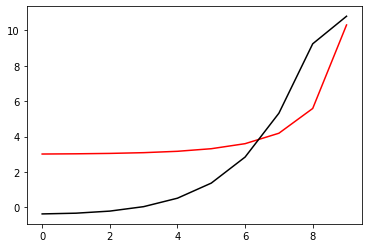

48400 96.00225308457658 -1.2764108901431388
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


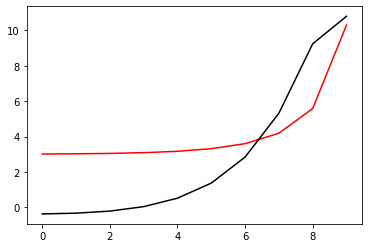

48600 96.0022530845766 -1.276410890051823
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


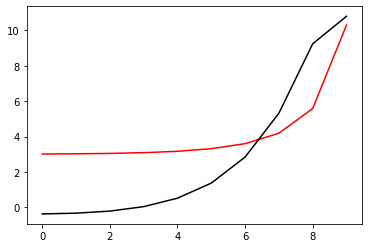

48800 96.002253084578 -1.2764111655692394
[-0.36546867 -0.32439734 -0.20682889  0.04443016  0.52148183  1.3731282
  2.84194994  5.31861101  9.2357552  10.79110665]


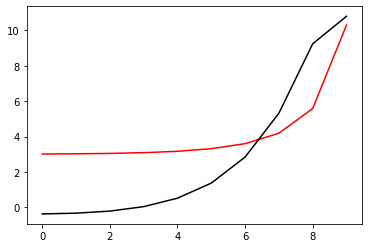

49000 96.00225308457658 -1.2764108900357076
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


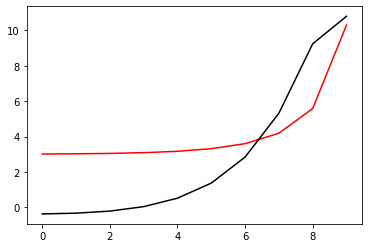

49200 96.0022530845766 -1.2764108900517772
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


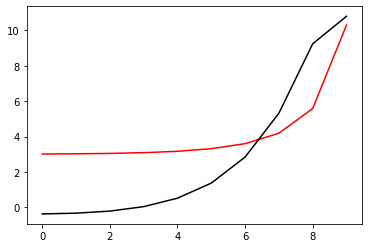

49400 96.00225308457854 -1.276410571531972
[-0.36546901 -0.32439763 -0.20682906  0.04443015  0.52148196  1.37312835
  2.84194994  5.31861078  9.23575507 10.79110685]


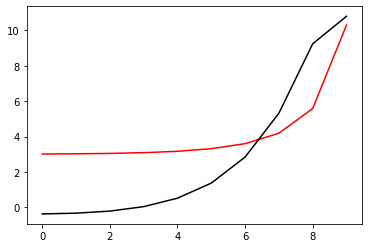

49600 96.0022530845766 -1.2764108900440496
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


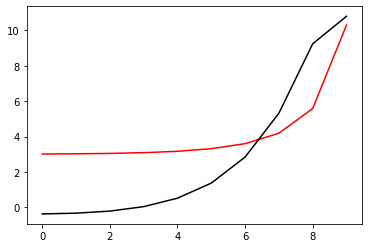

49800 96.00225308457658 -1.2764108900535325
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


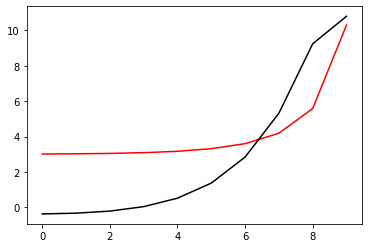

50000 96.00225308457668 -1.2764109520668425
[-0.36546874 -0.32439739 -0.20682888  0.04443026  0.52148199  1.37312833
  2.84194993  5.31861093  9.23575553 10.79110691]


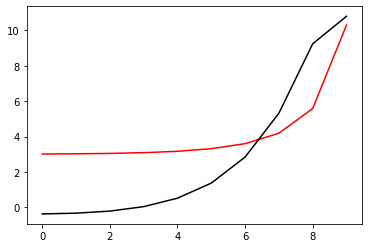

50200 96.00225308457658 -1.2764108900530367
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


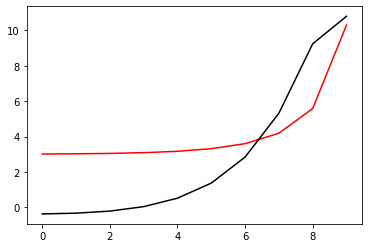

50400 96.00225308457661 -1.276410868406537
[-0.36546882 -0.32439747 -0.20682895  0.0444302   0.52148193  1.37312827
  2.84194989  5.31861089  9.2357555  10.79110692]


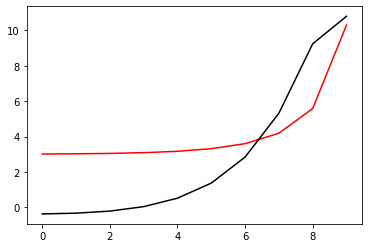

50600 96.0022530845766 -1.2764108817343258
[-0.36546882 -0.32439746 -0.20682894  0.0444302   0.52148194  1.37312828
  2.8419499   5.31861089  9.23575549 10.79110692]


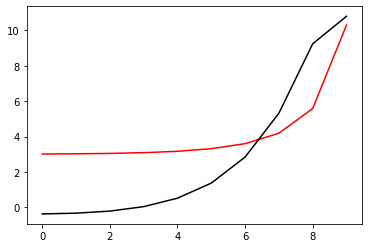

50800 96.00225308457658 -1.2764108900513438
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


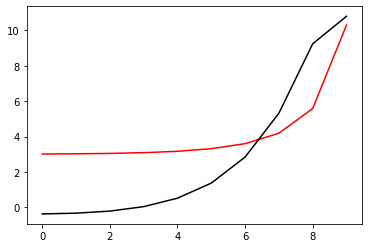

51000 96.00225308457937 -1.27641051570977
[-0.36546917 -0.32439781 -0.20682928  0.04442987  0.52148161  1.37312797
  2.84194961  5.31861064  9.2357553  10.79110674]


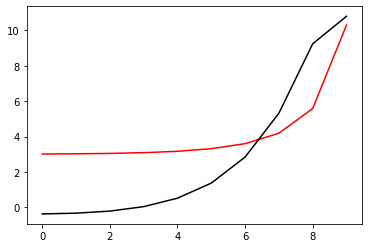

51200 96.0022530845766 -1.2764108844764117
[-0.36546881 -0.32439746 -0.20682894  0.04443021  0.52148194  1.37312829
  2.8419499   5.3186109   9.23575549 10.79110693]


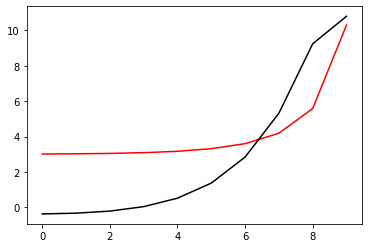

51400 96.00225308457658 -1.2764108900514766
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


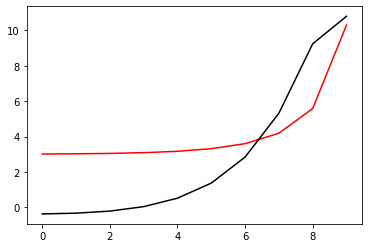

51600 96.00225310621562 -1.2764441138873388
[-0.36543995 -0.32437183 -0.20680821  0.04444309  0.52148302  1.37311977
  2.84194221  5.31862163  9.23580057 10.79110617]


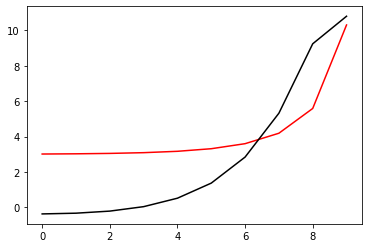

51800 96.0022530845766 -1.2764108890914017
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


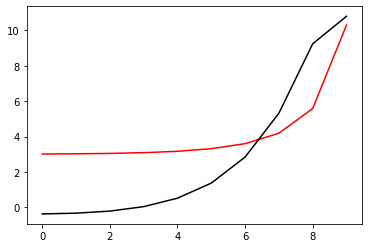

52000 96.0022530845766 -1.2764108900518296
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


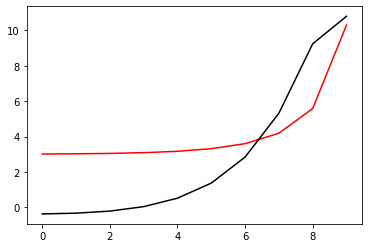

52200 96.00225308457834 -1.276410563610024
[-0.36546809 -0.32439665 -0.20682809  0.04443108  0.52148268  1.37312891
  2.84195013  5.31861056  9.23575873 10.79110799]


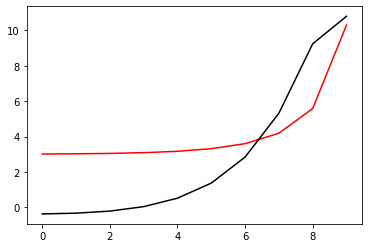

52400 96.00225308457658 -1.2764108900401818
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


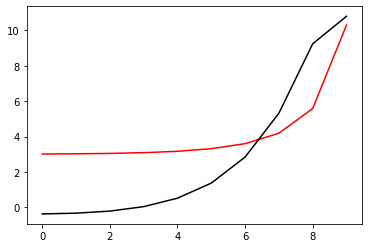

52600 96.0022530845766 -1.276410890051674
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


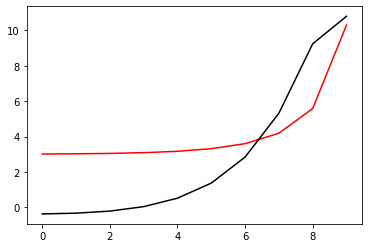

52800 96.00225308457703 -1.2764107370230136
[-0.36546892 -0.32439753 -0.20682897  0.04443022  0.52148198  1.37312833
  2.8419499   5.3186108   9.23575531 10.79110682]


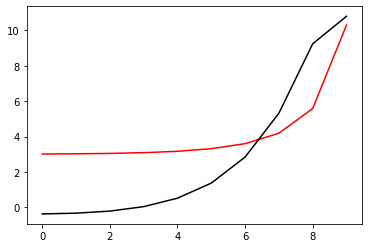

53000 96.00225308457658 -1.276410890057785
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


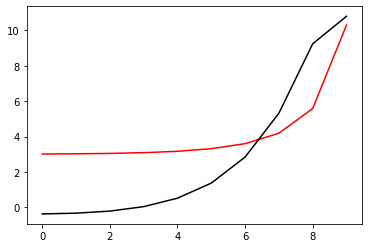

53200 96.0022530845766 -1.2764108901213749
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


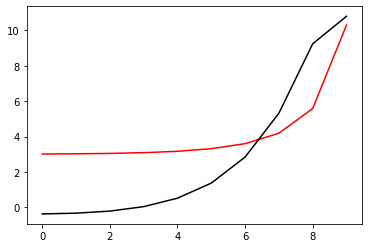

53400 96.0022530845766 -1.2764108641029999
[-0.36546882 -0.32439746 -0.20682895  0.04443019  0.52148192  1.37312825
  2.84194987  5.31861089  9.23575554 10.79110693]


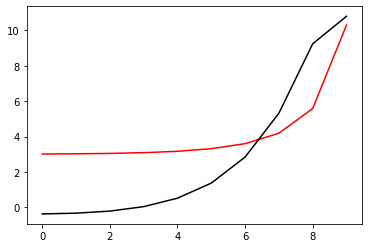

53600 96.00225308457658 -1.2764108900503341
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


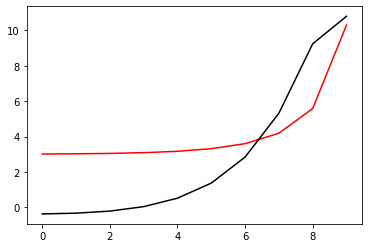

53800 96.00225338966987 -1.2762842069747655
[-0.3655328  -0.32445897 -0.20688789  0.04437343  0.52142668  1.37307355
  2.84189445  5.31855393  9.23569813 10.79104645]


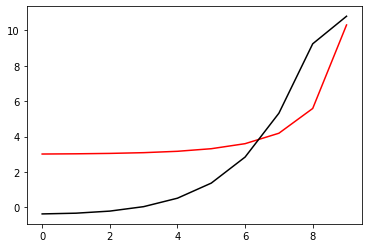

54000 96.0022530845766 -1.2764108922698163
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


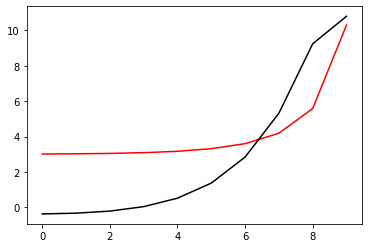

54200 96.0022530845766 -1.2764108900519948
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


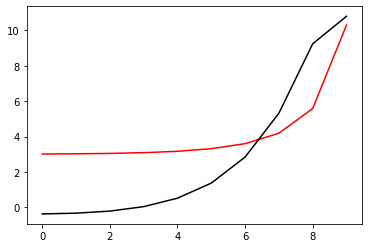

54400 96.00225308493074 -1.276406563137574
[-0.36547103 -0.32439914 -0.20682974  0.04443064  0.52148438  1.37313248
  2.84195624  5.31861273  9.23574348 10.79110843]


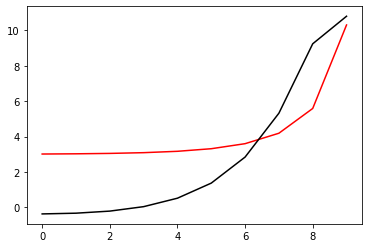

54600 96.00225308457658 -1.2764108897744444
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


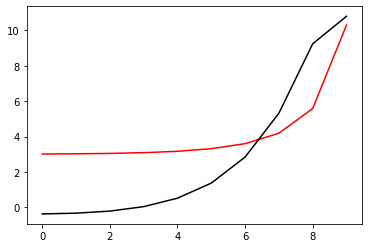

54800 96.0022530845766 -1.2764108900518885
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


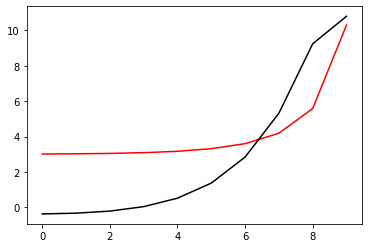

55000 96.00225309315674 -1.2763893975455933
[-0.36546228 -0.32439242 -0.20682831  0.04442152  0.5214616   1.37310282
  2.84193372  5.31862409  9.23581012 10.79111942]


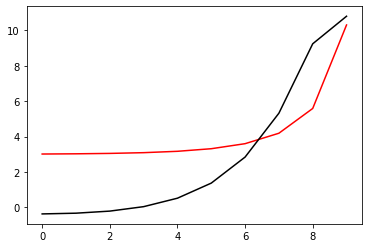

55200 96.0022530845766 -1.2764108910430287
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


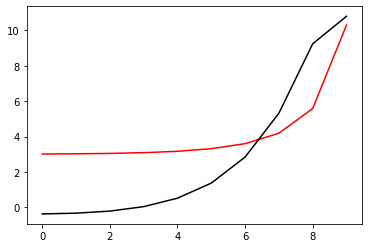

55400 96.0022530845766 -1.2764108900518298
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


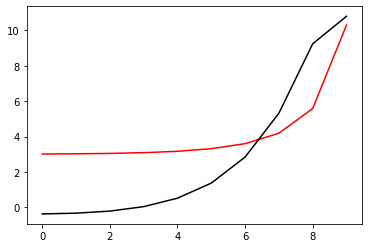

55600 96.00225308611348 -1.2764201230293781
[-0.36545963 -0.32439546 -0.20684102  0.04440092  0.52144024  1.37308426
  2.84191753  5.31860419  9.23577422 10.79109605]


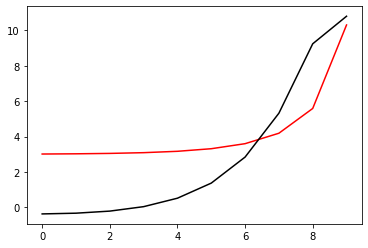

55800 96.00225308457658 -1.2764108884950314
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


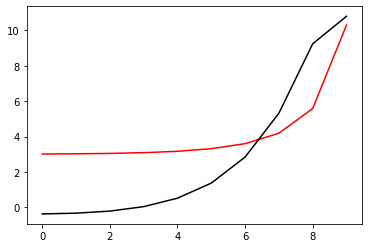

56000 96.0022530845766 -1.2764108900519462
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


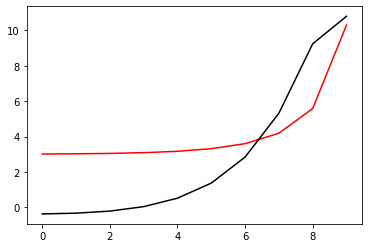

56200 96.00225308465258 -1.2764129887726643
[-0.36547195 -0.32440074 -0.20683202  0.04442798  0.52148062  1.37312825
  2.84194934  5.31860282  9.23574513 10.79110225]


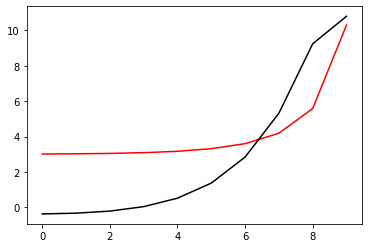

56400 96.00225308457658 -1.2764108899128268
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


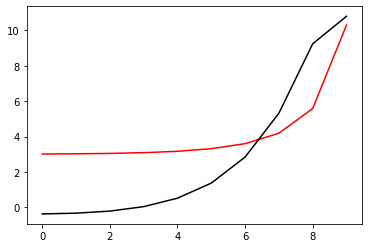

56600 96.0022530845766 -1.2764108900517845
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


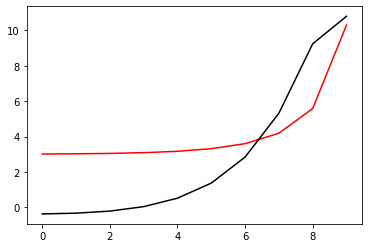

56800 96.00225308459538 -1.2764117795176648
[-0.36546717 -0.32439549 -0.20682628  0.04443389  0.52148744  1.37313554
  2.84195955  5.31861705  9.23574719 10.7911123 ]


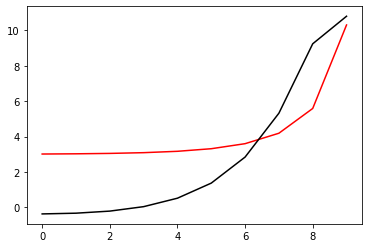

57000 96.0022530845766 -1.2764108900793991
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


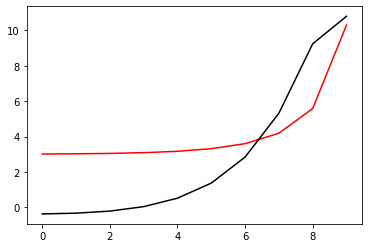

57200 96.0022530845766 -1.276410890051805
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


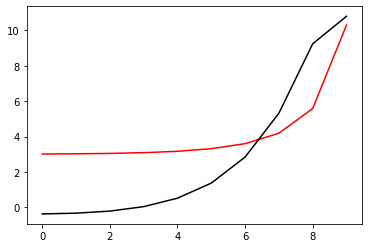

57400 96.00225308535867 -1.2764045136593578
[-0.36547297 -0.3244011  -0.20683178  0.04442848  0.52148199  1.37312995
  2.84195365  5.31861092  9.23574363 10.79110709]


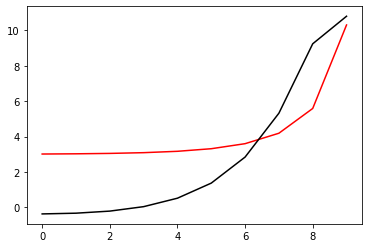

57600 96.00225308457658 -1.2764108903122857
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


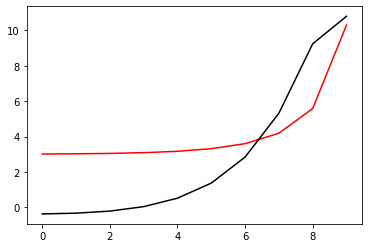

57800 96.0022530845766 -1.2764108900517357
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


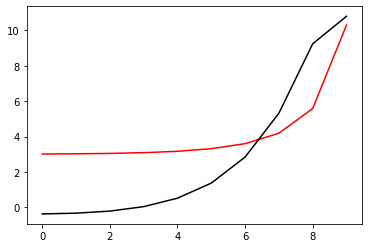

58000 96.00225308457803 -1.2764111705049301
[-0.36546877 -0.32439746 -0.20682902  0.04443001  0.52148164  1.37312799
  2.84194975  5.31861094  9.23575526 10.7911066 ]


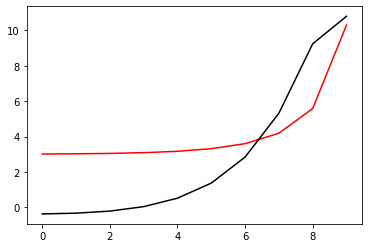

58200 96.0022530845766 -1.2764108900707092
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


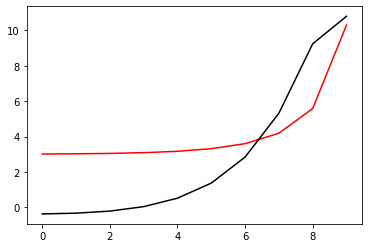

58400 96.00225308457658 -1.2764108900536455
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


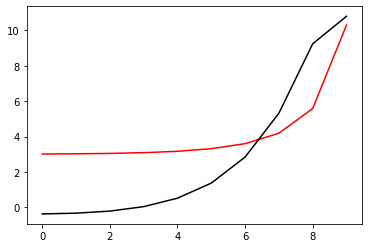

58600 96.00225308457672 -1.2764108053704892
[-0.36546885 -0.32439749 -0.20682897  0.04443018  0.52148191  1.37312826
  2.84194986  5.31861086  9.23575547 10.79110685]


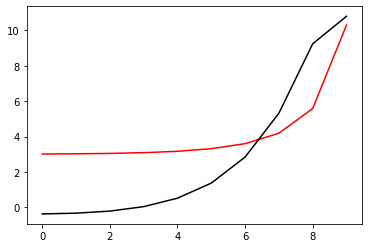

58800 96.00225308457658 -1.2764108900548403
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


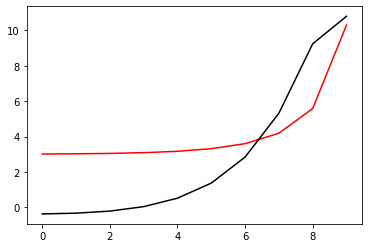

59000 96.00225309189182 -1.2764299966415522
[-0.36544962 -0.3243784  -0.20681009  0.04444873  0.52149995  1.37314545
  2.84196569  5.31862458  9.23576655 10.79111645]


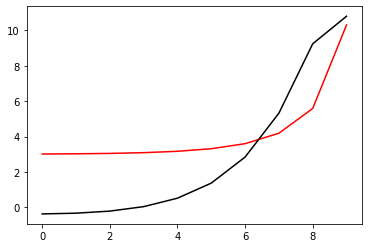

59200 96.0022530845766 -1.2764108934763794
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148196  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


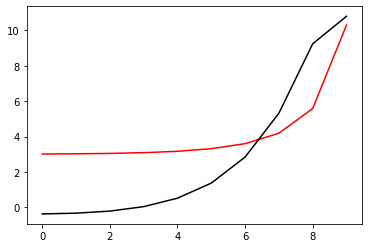

59400 96.0022530845766 -1.2764108900519178
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


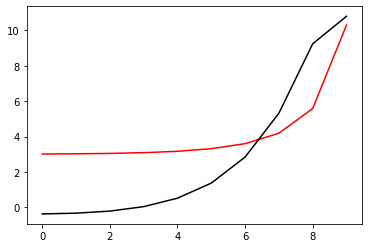

59600 96.00225308518355 -1.276416523333926
[-0.36546705 -0.32439593 -0.20682734  0.04443214  0.52148485  1.37313246
  2.84195578  5.31861578  9.23574568 10.79110865]


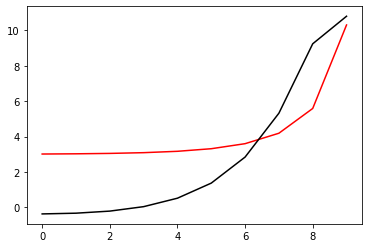

59800 96.00225308457658 -1.2764108900130404
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


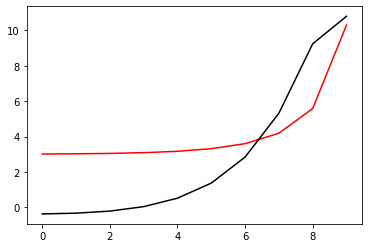

60000 96.0022530845766 -1.276410890051958
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


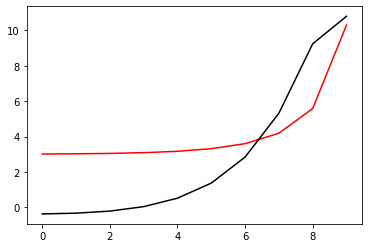

In [93]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 60001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2).numpy(), m2_2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

200 96.00225308457661 -1.2764108969257617
[-0.36546881 -0.32439745 -0.20682892  0.04443023  0.52148197  1.37312833
  2.84194993  5.3186109   9.23575545 10.79110692]


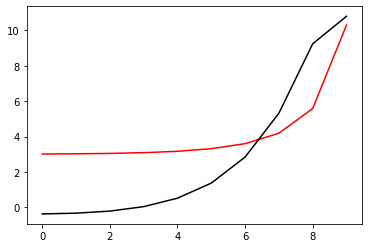

400 96.0022530845766 -1.2764108900519846
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


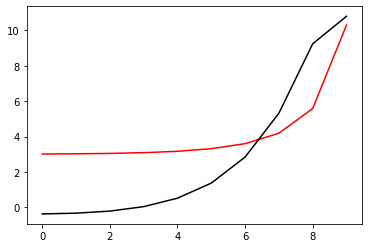

600 96.0022530845766 -1.2764108900518167
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


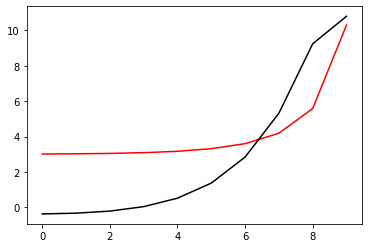

800 96.0022530845766 -1.2764108900518398
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


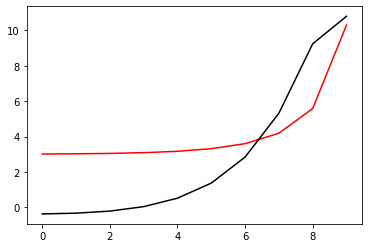

1000 96.0022530845766 -1.2764108900518314
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


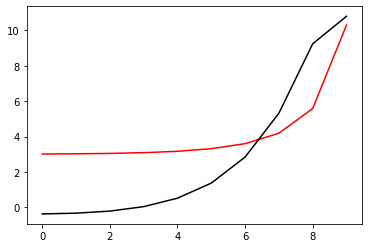

1200 96.0022530845766 -1.2764108900518274
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


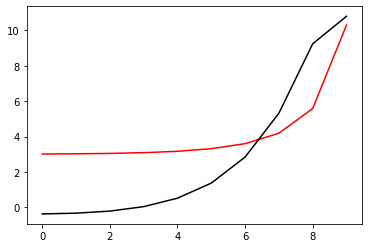

1400 96.00225308457658 -1.2764109069392646
[-0.36546879 -0.32439743 -0.20682891  0.04443023  0.52148197  1.37312831
  2.84194992  5.31861091  9.23575552 10.79110694]


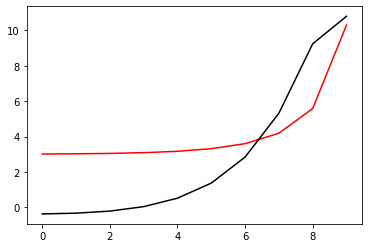

1600 96.00225308457658 -1.2764109012209905
[-0.36546879 -0.32439744 -0.20682892  0.04443023  0.52148196  1.37312831
  2.84194992  5.31861091  9.23575552 10.79110693]


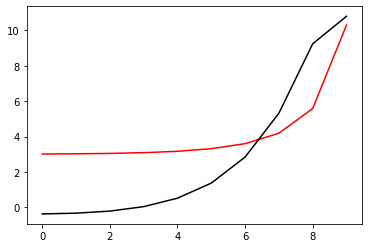

1800 96.00225308457658 -1.2764108900514088
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


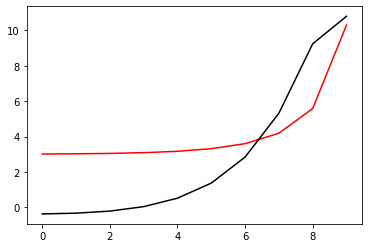

2000 96.00225309150237 -1.2763923435068734
[-0.3654895  -0.32441817 -0.2068493   0.04440993  0.52146193  1.3731063
  2.84192205  5.31858341  9.23575352 10.79108776]


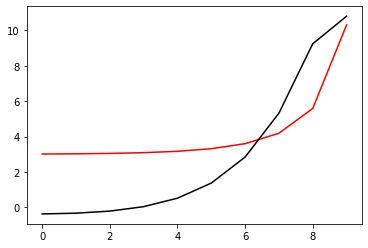

2200 96.0022530845766 -1.2764108903663933
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


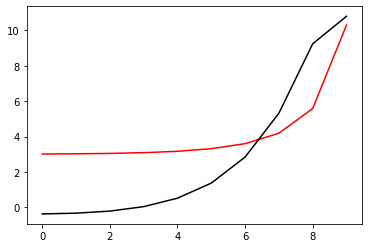

2400 96.0022530845766 -1.2764108900518234
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


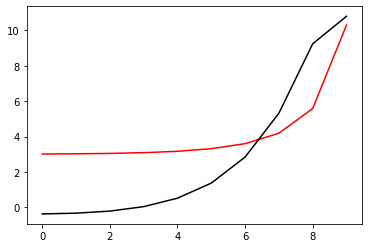

2600 96.00225308909785 -1.2764259930994375
[-0.36545558 -0.32438437 -0.2068157   0.04444313  0.52149448  1.37313825
  2.84195275  5.31861079  9.23577472 10.79110866]


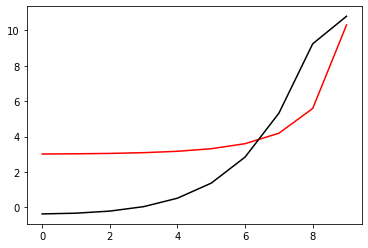

2800 96.0022530845766 -1.2764108895161503
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


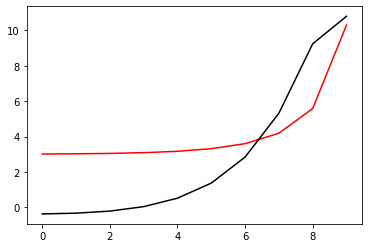

3000 96.0022530845766 -1.2764108900519127
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


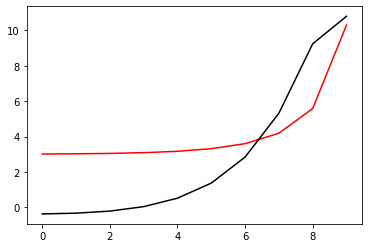

3200 96.0022530846743 -1.2764131296525634
[-0.36546728 -0.32439602 -0.20682761  0.04443146  0.52148306  1.37312929
  2.84195086  5.31861124  9.2357585  10.79110839]


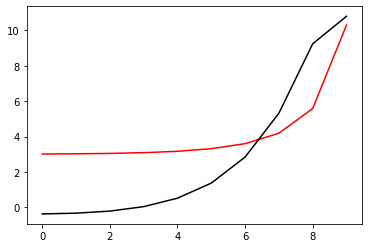

3400 96.00225308457658 -1.2764108900941675
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


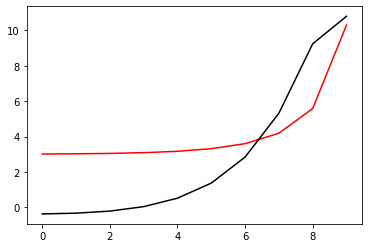

3600 96.0022530845766 -1.2764108900516997
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


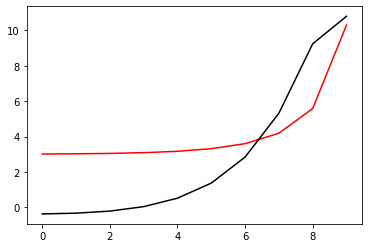

3800 96.00225308457692 -1.2764110189103672
[-0.3654687  -0.32439733 -0.20682878  0.04443039  0.52148214  1.37312848
  2.84195005  5.31861097  9.23575549 10.79110696]


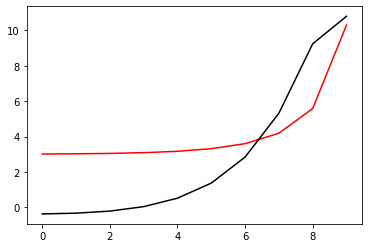

4000 96.00225308457658 -1.27641089004989
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


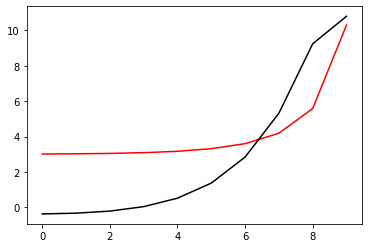

4200 96.0022530845766 -1.2764108901501814
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


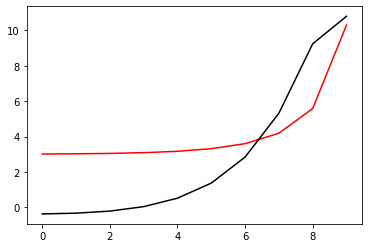

4400 96.00225308457661 -1.2764108852814569
[-0.36546882 -0.32439746 -0.20682894  0.0444302   0.52148192  1.37312825
  2.84194987  5.31861088  9.23575553 10.79110692]


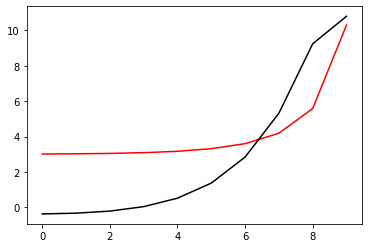

4600 96.00225308457658 -1.27641089005275
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


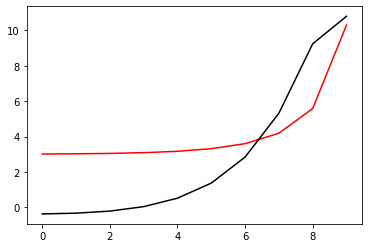

4800 96.00225313049363 -1.2764575824230024
[-0.36538173 -0.32431489 -0.20675906  0.04448614  0.52152788  1.37317125
  2.8419986   5.31867167  9.23582241 10.79114641]


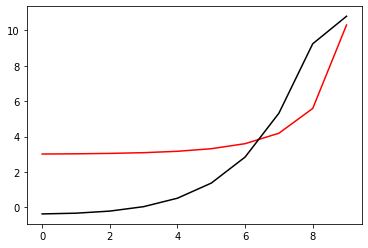

5000 96.00225308457658 -1.2764108919498638
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575552 10.79110693]


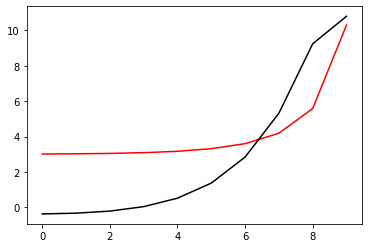

5200 96.0022530845766 -1.2764108900518933
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


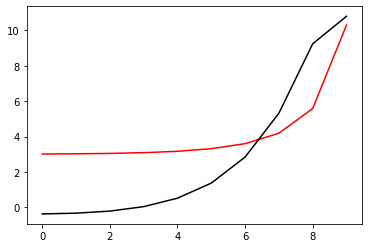

5400 96.00225308461634 -1.2764121704423612
[-0.36546508 -0.32439334 -0.20682442  0.04443534  0.52148768  1.37313501
  2.84195687  5.31861772  9.23574811 10.79110754]


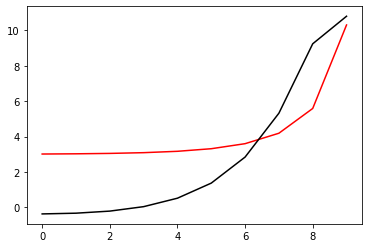

5600 96.00225308457658 -1.2764108901184308
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


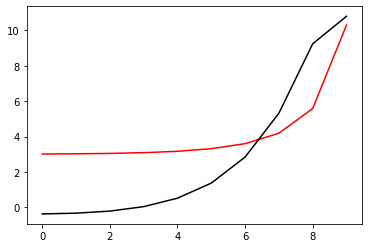

5800 96.0022530845766 -1.2764108900516553
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


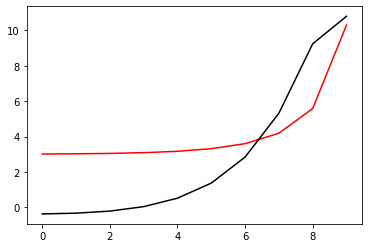

6000 96.00225308457838 -1.2764111876365896
[-0.36546843 -0.32439705 -0.2068285   0.0444307   0.52148249  1.37312886
  2.84195041  5.3186112   9.23575543 10.79110714]


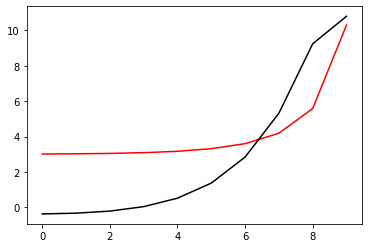

6200 96.0022530845766 -1.276410890061391
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


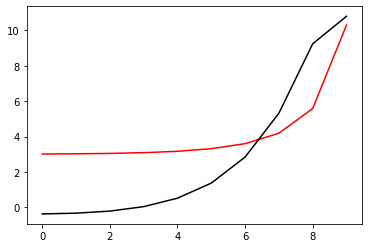

6400 96.00225308457658 -1.2764108907501068
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


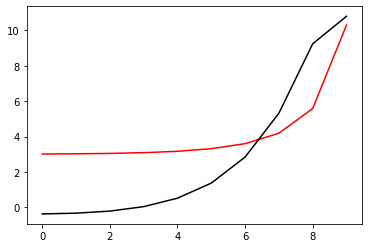

6600 96.0022530845766 -1.276410871695225
[-0.36546882 -0.32439746 -0.20682894  0.0444302   0.52148194  1.37312828
  2.84194988  5.31861089  9.23575553 10.79110692]


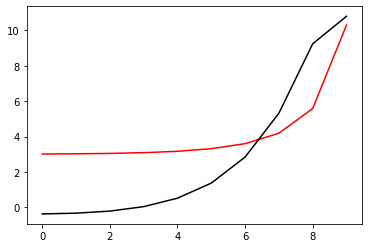

6800 96.00225308457658 -1.2764108900526114
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


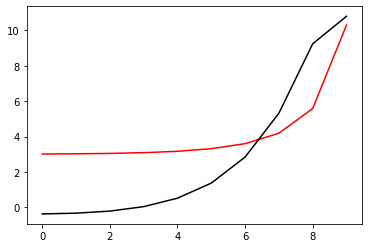

7000 96.00225313758312 -1.2763577191324853
[-0.36546911 -0.32440228 -0.20684521  0.04440372  0.52145034  1.3731
  2.84193554  5.3186182   9.23577849 10.79112024]


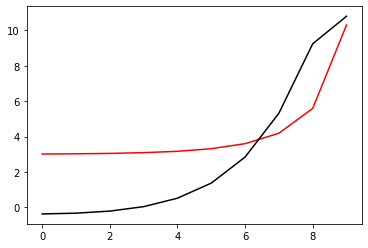

7200 96.00225308457658 -1.2764108922146733
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


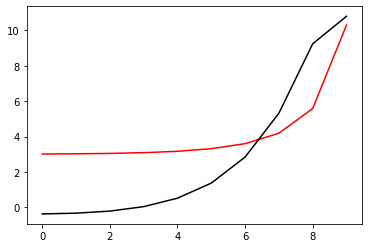

7400 96.0022530845766 -1.2764108900517184
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


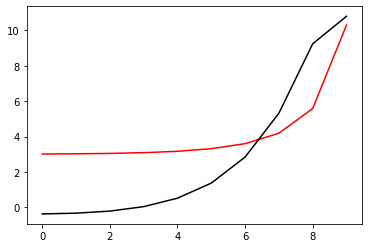

7600 96.002253086293 -1.276401440983507
[-0.36547454 -0.32440246 -0.20683298  0.04442747  0.52148099  1.37312883
  2.84195204  5.31860803  9.23574174 10.79110427]


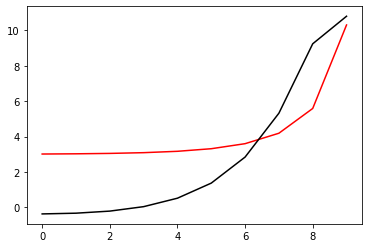

7800 96.0022530845766 -1.27641089024154
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


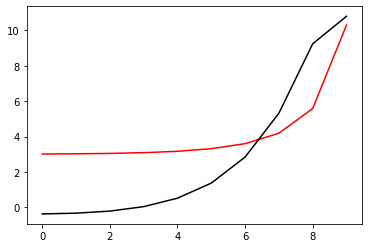

8000 96.0022530845766 -1.2764108900517417
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


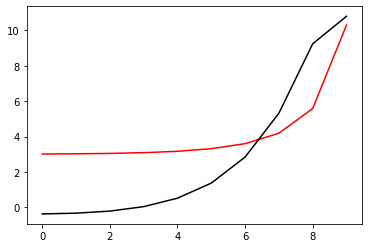

8200 96.00225308458033 -1.276410465122283
[-0.36546938 -0.32439806 -0.2068296   0.04442945  0.5214811   1.37312748
  2.8419493   5.31861058  9.23575503 10.79110642]


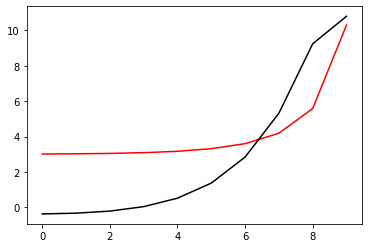

8400 96.00225308457657 -1.2764108900556168
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


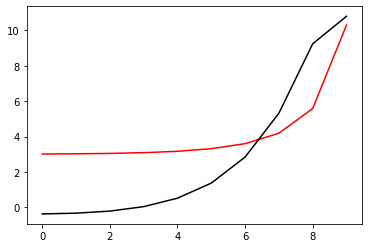

8600 96.00225308457658 -1.2764108900059343
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


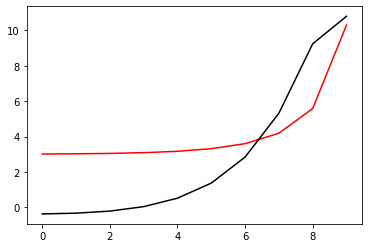

8800 96.00225308457662 -1.2764108482266385
[-0.36546882 -0.32439746 -0.20682894  0.0444302   0.52148192  1.37312826
  2.84194988  5.3186109   9.23575555 10.79110695]


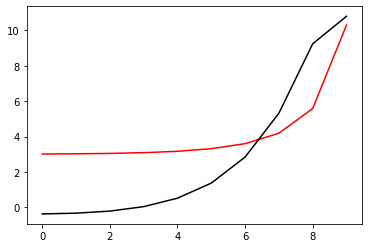

9000 96.0022530845766 -1.2764108900509532
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


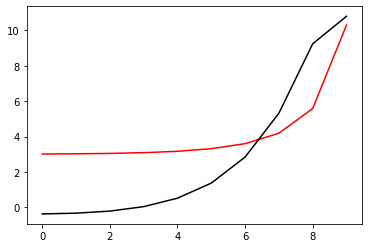

9200 96.00225342188807 -1.27627792555829
[-0.36554327 -0.32446937 -0.20689817  0.04436336  0.52141697  1.37306444
  2.84188636  5.31854745  9.23569367 10.79104349]


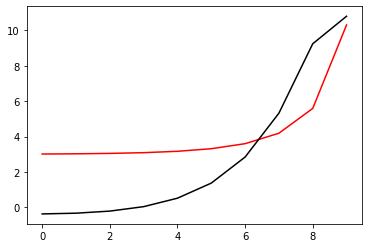

9400 96.00225308457658 -1.2764108869509472
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110692]


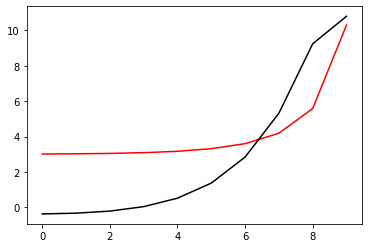

9600 96.0022530845766 -1.2764108900517699
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


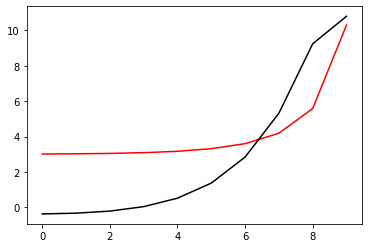

9800 96.00225308534537 -1.2764048305632172
[-0.36547899 -0.32440785 -0.20683919  0.04442041  0.52147333  1.37312133
  2.84194532  5.31860645  9.23573784 10.79110159]


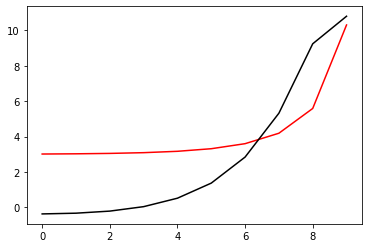

10000 96.0022530845766 -1.2764108898852429
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


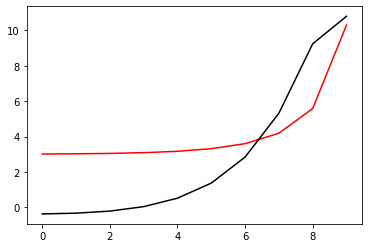

10200 96.0022530845766 -1.2764108900518059
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


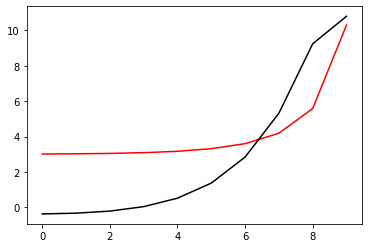

10400 96.00225308458316 -1.2764103202475092
[-0.36546942 -0.32439808 -0.20682961  0.04442947  0.52148117  1.37312758
  2.84194934  5.31861044  9.23575466 10.79110622]


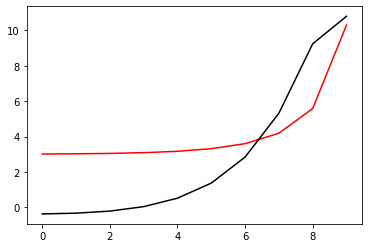

10600 96.00225308457658 -1.2764108900475803
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


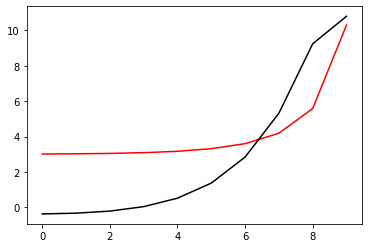

10800 96.0022530845766 -1.2764108900518194
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


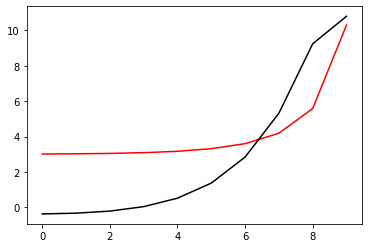

11000 96.00225308460365 -1.2764120423423182
[-0.36546724 -0.32439589 -0.20682745  0.04443157  0.5214831   1.37312904
  2.84195035  5.31861185  9.23575836 10.79110803]


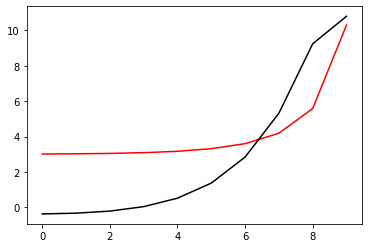

11200 96.00225308457658 -1.2764108900273978
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


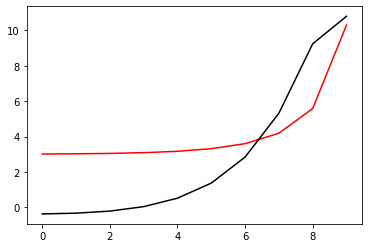

11400 96.0022530845766 -1.2764108900517692
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


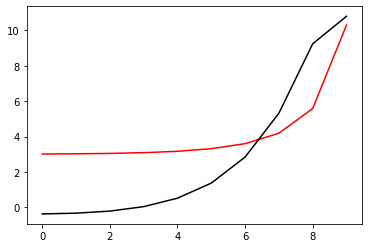

11600 96.00225308457813 -1.276410599301266
[-0.36546874 -0.32439739 -0.20682889  0.04443017  0.5214818   1.37312814
  2.84194999  5.31861142  9.2357561  10.79110729]


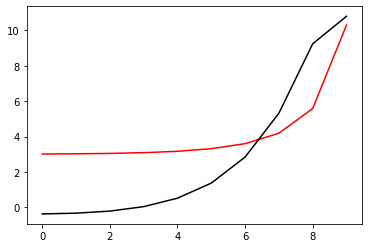

11800 96.0022530845766 -1.276410890026708
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


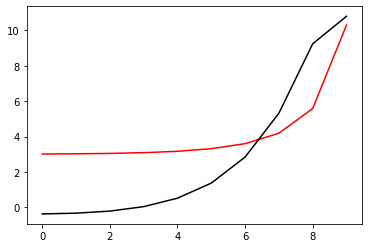

12000 96.0022530845766 -1.2764108900518896
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


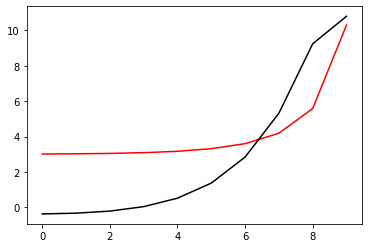

12200 96.00225308457665 -1.2764108352806343
[-0.36546903 -0.3243977  -0.20682919  0.04442998  0.52148177  1.37312818
  2.84194983  5.31861072  9.23575494 10.79110675]


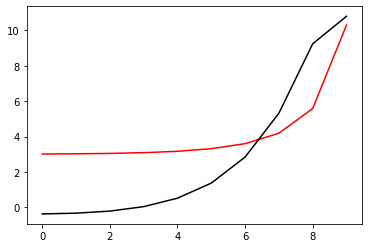

12400 96.00225308457658 -1.2764108900419546
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


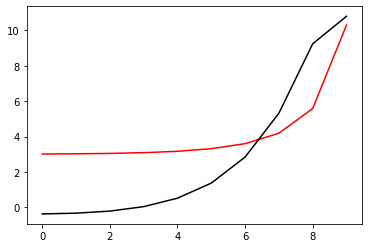

12600 96.0022530845766 -1.2764108911369028
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


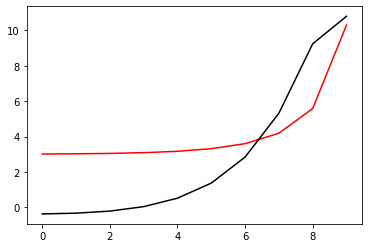

12800 96.0022530845766 -1.2764108691898957
[-0.36546883 -0.32439747 -0.20682895  0.04443019  0.52148192  1.37312827
  2.84194987  5.31861088  9.23575551 10.79110691]


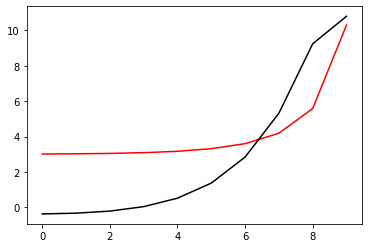

13000 96.00225308457658 -1.2764108900524531
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


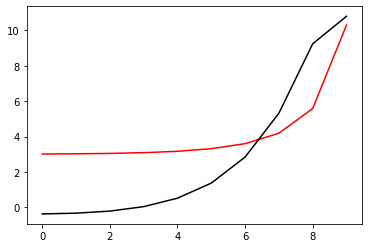

13200 96.00225316535466 -1.2764727613916664
[-0.36535926 -0.32429377 -0.20673792  0.04450968  0.52155439  1.37320099
  2.84203127  5.31870492  9.23585243 10.79118888]


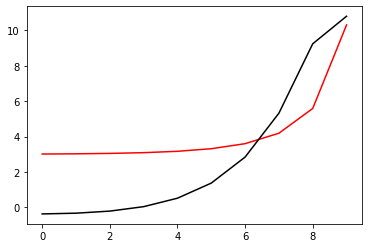

13400 96.00225308457658 -1.2764108883487797
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


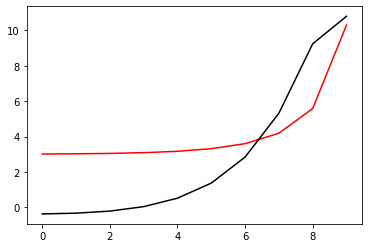

13600 96.0022530845766 -1.2764108900518674
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


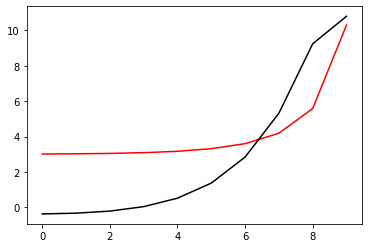

13800 96.00225308910208 -1.2763956663572553
[-0.36548033 -0.32440833 -0.20683874  0.04442134  0.52147403  1.37311986
  2.84193579  5.31859408  9.23575976 10.79109882]


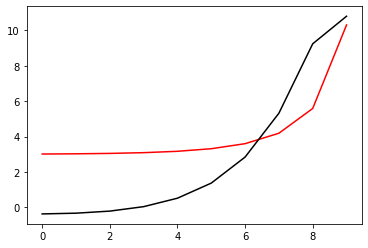

14000 96.00225308457658 -1.2764108905085714
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


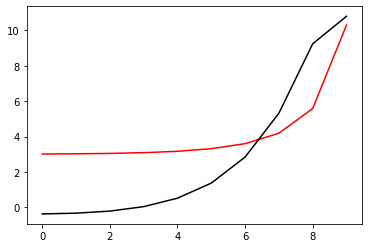

14200 96.0022530845766 -1.2764108900517885
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


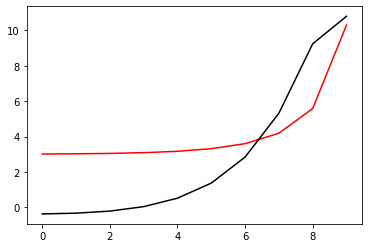

14400 96.00225310254876 -1.2764400168622931
[-0.36541214 -0.32434285 -0.20677999  0.04446837  0.52150919  1.37315223
  2.84198382  5.31867085  9.23584637 10.79116312]


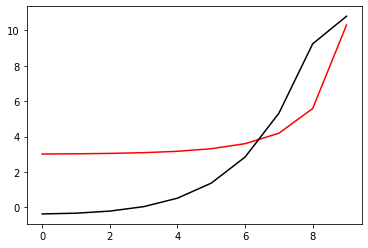

14600 96.0022530845766 -1.2764108892440476
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


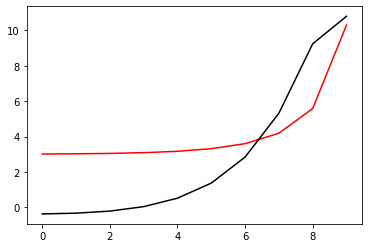

14800 96.0022530845766 -1.2764108900518443
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


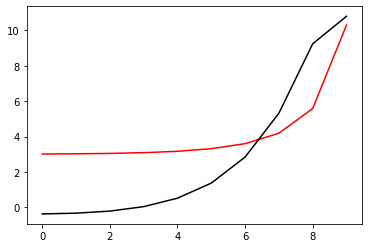

15000 96.00225308475278 -1.2764079363923064
[-0.36547234 -0.32440099 -0.20683238  0.04442692  0.52147905  1.37312597
  2.84194842  5.3186102   9.2357497  10.79110472]


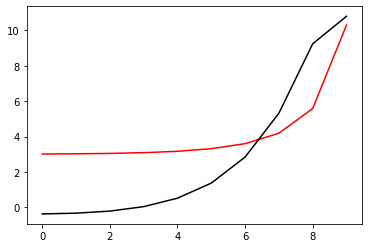

15200 96.0022530845766 -1.2764108900941002
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


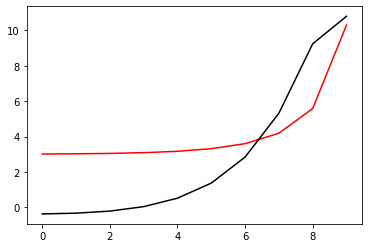

15400 96.0022530845766 -1.2764108900518778
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


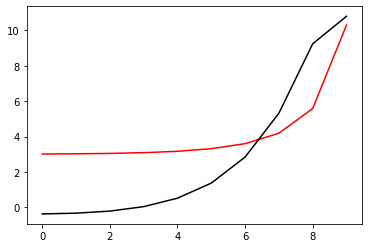

15600 96.00225308458315 -1.276411469422492
[-0.36546837 -0.32439704 -0.20682859  0.04443046  0.52148212  1.37312849
  2.84195021  5.31861126  9.23575542 10.79110686]


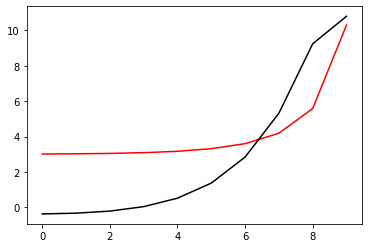

15800 96.00225308457657 -1.2764108900706714
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


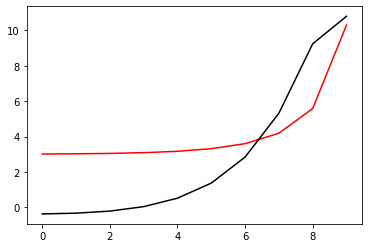

16000 96.00225308457658 -1.2764108900491662
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


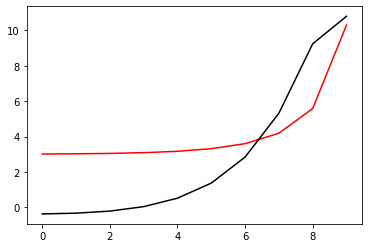

16200 96.00225308457671 -1.2764109676497526
[-0.36546876 -0.32439741 -0.20682891  0.04443023  0.52148195  1.3731283
  2.84194992  5.31861094  9.23575556 10.79110695]


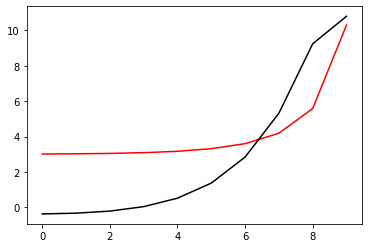

16400 96.0022530845766 -1.2764108900508537
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


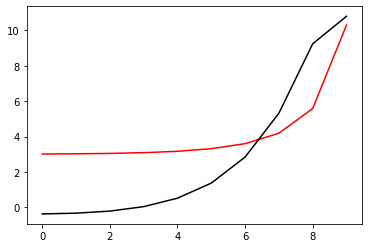

16600 96.00225308461538 -1.276409494667255
[-0.36547016 -0.32439879 -0.20683025  0.04442892  0.52148069  1.37312709
  2.84194879  5.31860993  9.23575472 10.79110624]


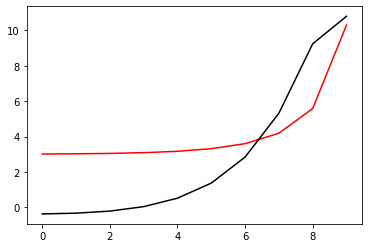

16800 96.0022530845766 -1.2764108948579709
[-0.3654688  -0.32439744 -0.20682892  0.04443023  0.52148196  1.3731283
  2.84194991  5.31861091  9.23575551 10.79110693]


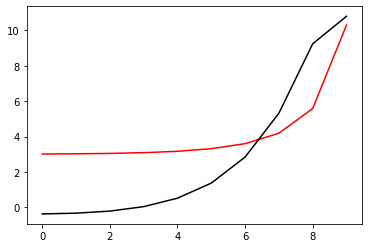

17000 96.0022530845766 -1.2764108900518647
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


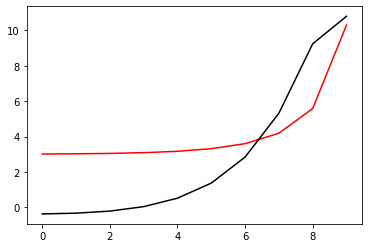

17200 96.00225308471339 -1.2764083006123617
[-0.36547203 -0.32440058 -0.20683163  0.04442764  0.52147957  1.37312437
  2.84194007  5.31859866  9.23576209 10.79109944]


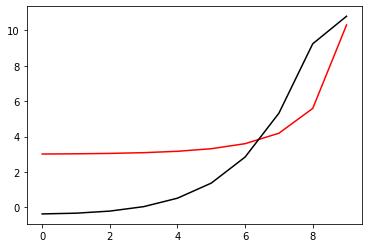

17400 96.00225308457658 -1.2764108901643494
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


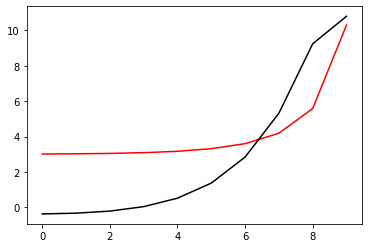

17600 96.0022530845766 -1.276410890051765
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


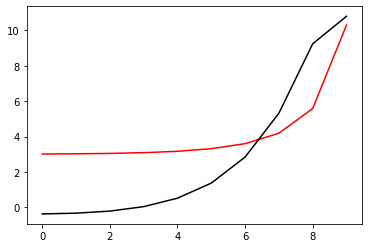

17800 96.002253084583 -1.2764114528981538
[-0.36546806 -0.32439673 -0.20682825  0.04443079  0.52148241  1.37312873
  2.84195053  5.31861184  9.23575634 10.79110753]


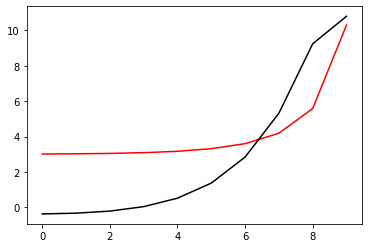

18000 96.00225308457657 -1.2764108900422855
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


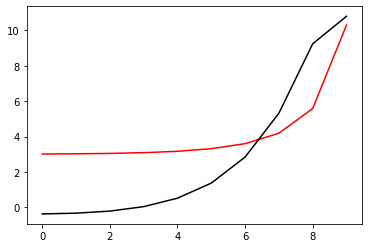

18200 96.00225308457658 -1.2764108900513165
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


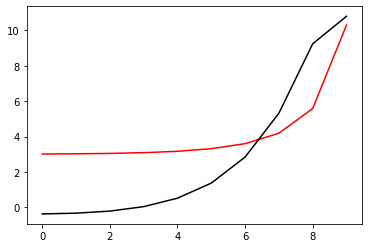

18400 96.0022530845768 -1.2764109898233307
[-0.36546873 -0.32439735 -0.20682881  0.04443036  0.52148211  1.37312845
  2.84195003  5.31861095  9.23575548 10.79110695]


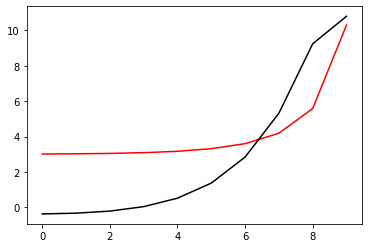

18600 96.00225308457658 -1.2764108900531903
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


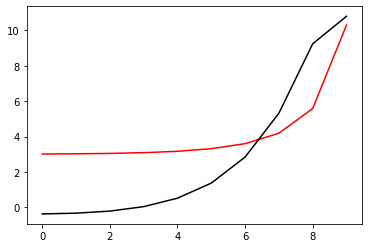

18800 96.00225308457877 -1.2764105589383172
[-0.36546912 -0.32439776 -0.20682924  0.04442991  0.52148165  1.37312801
  2.84194964  5.31861067  9.23575532 10.79110676]


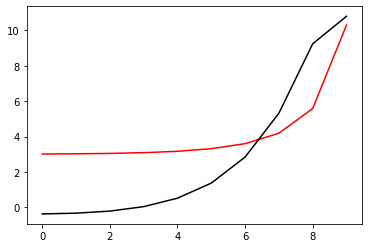

19000 96.00225308457661 -1.276410895520126
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.2357555  10.79110693]


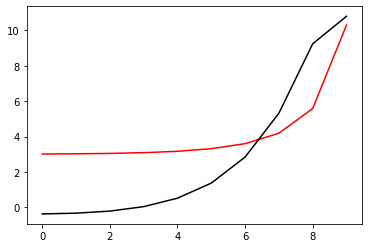

19200 96.00225308457658 -1.2764108900515283
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


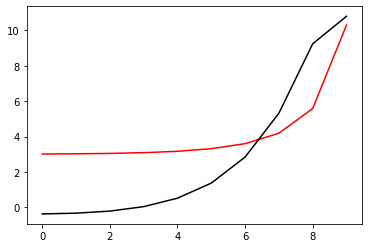

19400 96.0022530858325 -1.2764029764164573
[-0.36547315 -0.32440316 -0.20683736  0.04441807  0.52146242  1.37310065
  2.84192358  5.31860615  9.23579592 10.79110566]


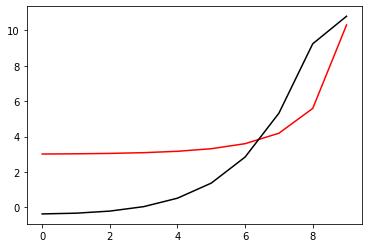

19600 96.00225308457658 -1.2764108906983471
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


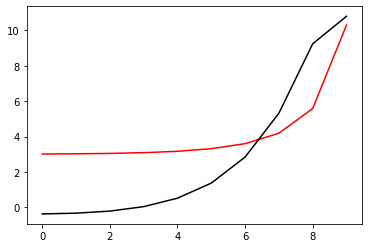

19800 96.0022530845766 -1.2764108900518205
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


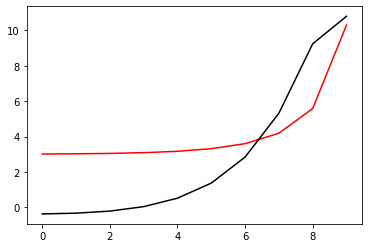

20000 96.00225309868118 -1.2763836739494023
[-0.36547125 -0.3244025  -0.20684042  0.04440718  0.52144842  1.37309354
  2.8419294   5.31862322  9.23580665 10.79112694]


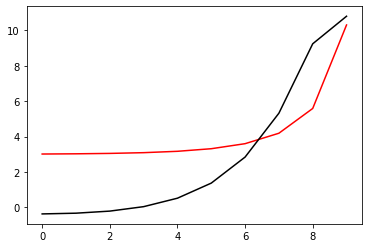

20200 96.0022530845766 -1.2764108902921325
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


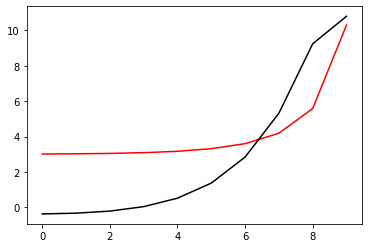

20400 96.0022530845766 -1.276410890051839
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


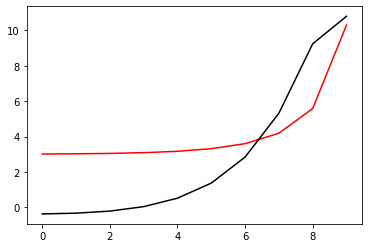

20600 96.00225308608888 -1.276419412836665
[-0.36545699 -0.32438507 -0.20681576  0.04444444  0.52149768  1.37314509
  2.84196771  5.31862286  9.23575416 10.79111615]


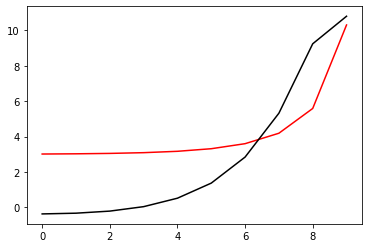

20800 96.00225308457661 -1.2764108897606812
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


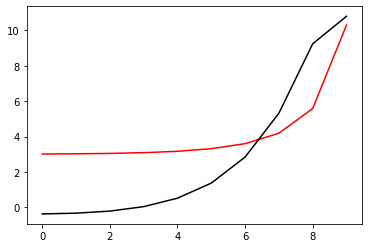

21000 96.0022530845766 -1.2764108900516327
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


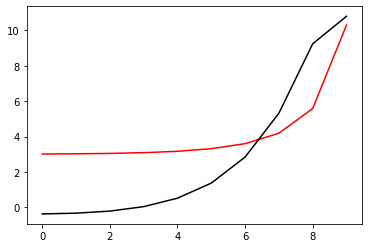

21200 96.00225308458013 -1.2764104618981895
[-0.36546902 -0.32439765 -0.20682914  0.04443001  0.5214818   1.37312825
  2.84194998  5.31861097  9.23575513 10.79110692]


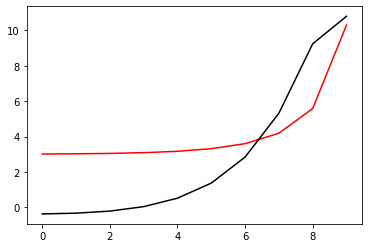

21400 96.0022530845766 -1.2764108900686326
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


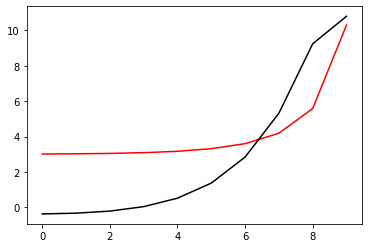

21600 96.00225308457657 -1.276410894330811
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575552 10.79110693]


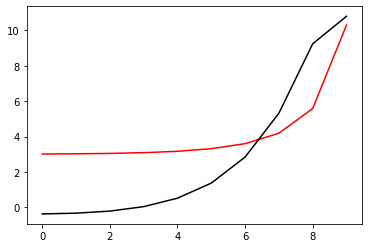

21800 96.00225308457658 -1.2764108791119007
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.3731283
  2.8419499   5.3186109   9.23575551 10.79110692]


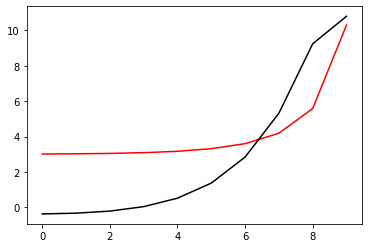

22000 96.0022530845766 -1.27641089005219
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


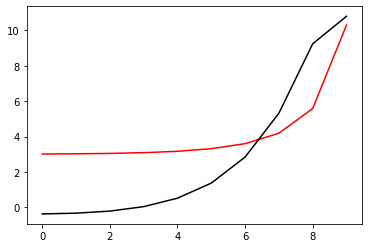

22200 96.00225308479345 -1.2764088282969586
[-0.36541206 -0.32434408 -0.20678692  0.04446079  0.52150524  1.37315129
  2.8419812   5.31865631  9.23580846 10.79113995]


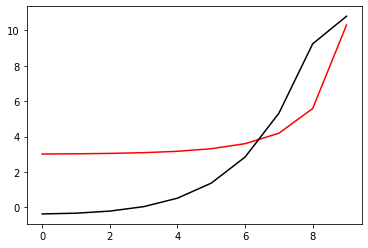

22400 96.00225308457658 -1.2764108918122963
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


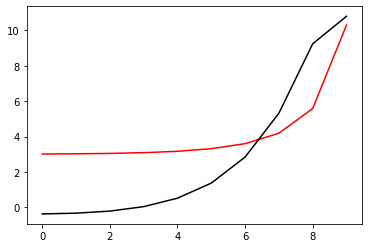

22600 96.0022530845766 -1.2764108900519446
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


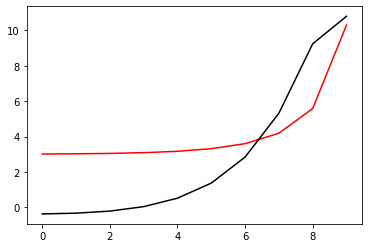

22800 96.00225308486003 -1.2764072797760773
[-0.36547674 -0.32440563 -0.20683697  0.04442262  0.52147559  1.37312356
  2.84194759  5.31860831  9.23573922 10.79110329]


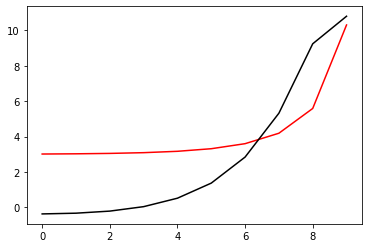

23000 96.00225308457658 -1.2764108901067803
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


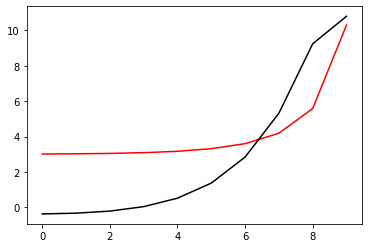

23200 96.0022530845766 -1.2764108900518545
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


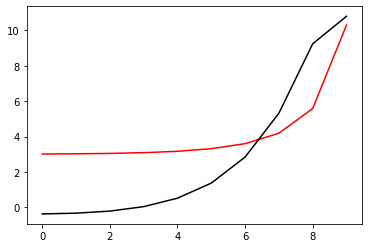

23400 96.00225308458354 -1.2764102840010438
[-0.36546891 -0.32439755 -0.20682905  0.04443004  0.52148164  1.37312794
  2.84194977  5.31861128  9.2357562  10.79110721]


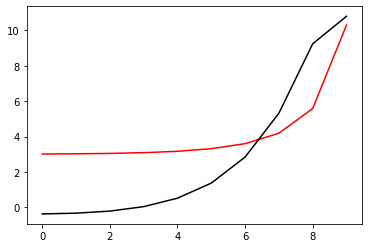

23600 96.00225308457658 -1.2764108900614701
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


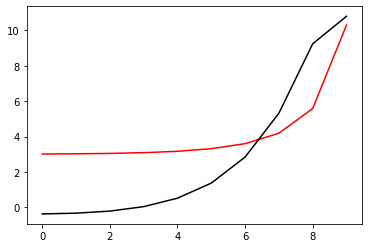

23800 96.0022530845766 -1.2764108900517859
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


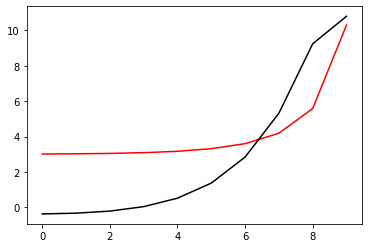

24000 96.00225308457773 -1.2764106465648035
[-0.36546898 -0.3243976  -0.20682904  0.04443018  0.52148198  1.37312837
  2.84194995  5.31861081  9.23575515 10.7911069 ]


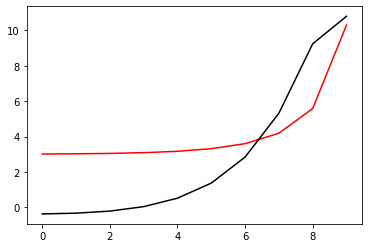

24200 96.0022530845766 -1.2764108900611424
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


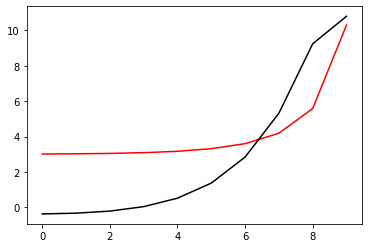

24400 96.00225308457658 -1.2764108900910298
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


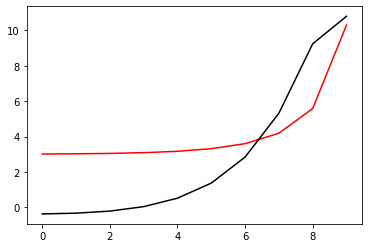

24600 96.0022530845766 -1.2764108701960235
[-0.3654688  -0.32439744 -0.20682893  0.04443021  0.52148193  1.37312827
  2.84194989  5.31861092  9.23575557 10.79110696]


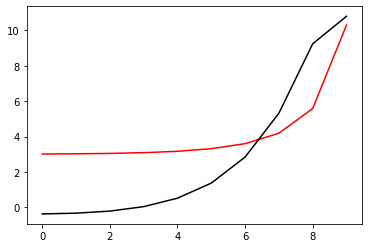

24800 96.00225308457658 -1.2764108900500617
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


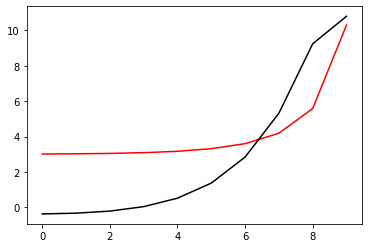

25000 96.00225311415014 -1.2764474812368907
[-0.36537929 -0.32431265 -0.20674871  0.04450562  0.52155259  1.37319418
  2.84200981  5.31866073  9.23578966 10.79112506]


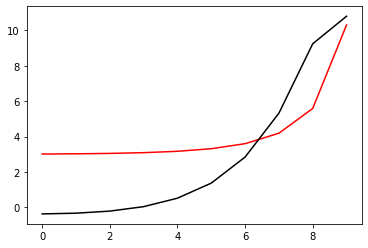

25200 96.00225308457658 -1.2764108870288589
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


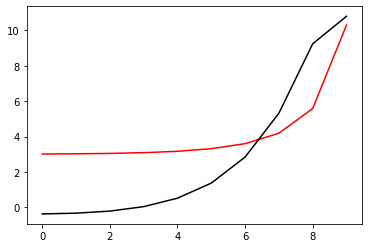

25400 96.0022530845766 -1.276410890051848
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


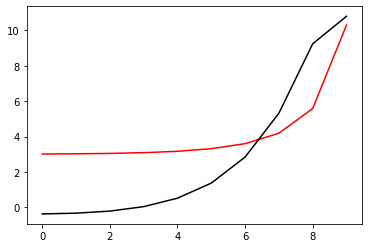

25600 96.00225308521665 -1.276416634647933
[-0.36546517 -0.32439394 -0.20682524  0.04443368  0.52148521  1.37312924
  2.84194424  5.31860291  9.23576713 10.79110204]


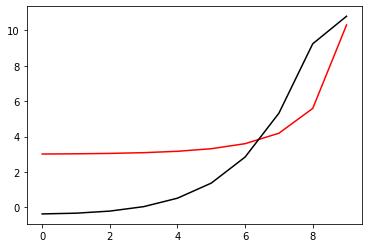

25800 96.00225308457661 -1.276410890605695
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


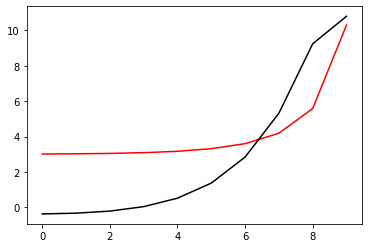

26000 96.0022530845766 -1.276410890051832
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


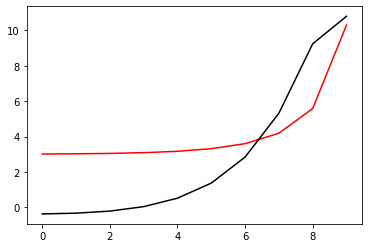

26200 96.00225308457877 -1.2764112197026252
[-0.36546838 -0.32439706 -0.20682861  0.04443043  0.52148196  1.37312813
  2.84194983  5.31861135  9.23575654 10.79110718]


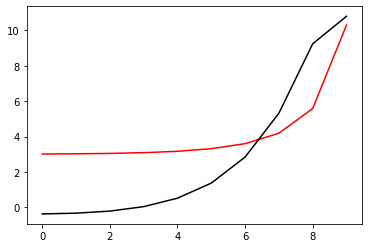

26400 96.00225308457658 -1.2764108900625033
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


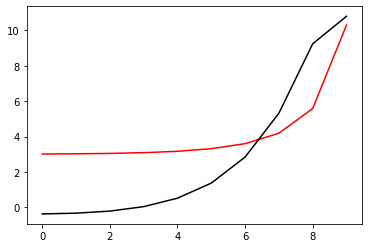

26600 96.00225308457658 -1.2764108900506046
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


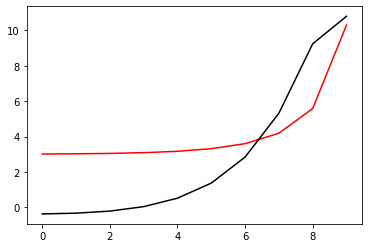

26800 96.0022530845768 -1.276410989041698
[-0.36546871 -0.32439736 -0.20682885  0.0444303   0.52148202  1.37312836
  2.84194996  5.31861095  9.23575555 10.79110693]


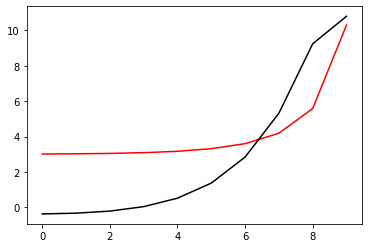

27000 96.00225308457658 -1.2764108900484386
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


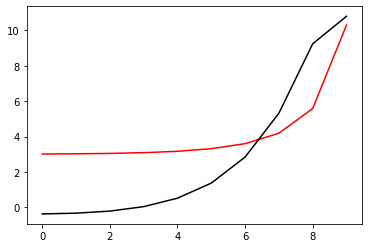

27200 96.00225308457658 -1.2764108775159104
[-0.36546882 -0.32439746 -0.20682894  0.04443021  0.52148194  1.37312828
  2.84194989  5.31861089  9.23575551 10.79110692]


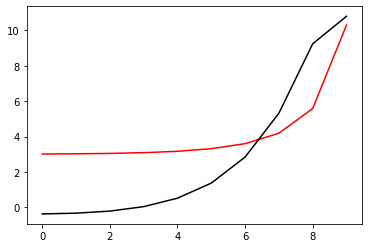

27400 96.0022530845766 -1.276410905588021
[-0.36546879 -0.32439743 -0.20682892  0.04443023  0.52148197  1.37312831
  2.84194992  5.31861091  9.23575552 10.79110694]


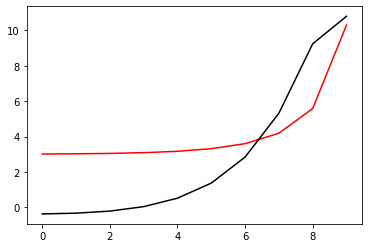

27600 96.0022530845766 -1.2764108900519782
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


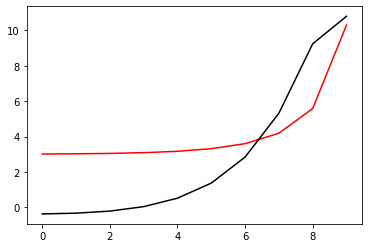

27800 96.00225312101618 -1.2764526478340295
[-0.36539857 -0.32432954 -0.20676707  0.04448052  0.52152016  1.37316215
  2.84199322  5.31868056  9.2358571  10.79116952]


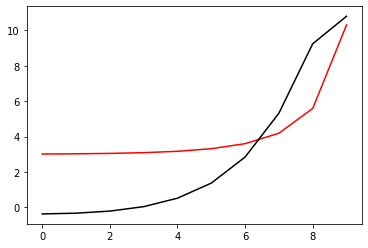

28000 96.00225308457661 -1.276410891212317
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


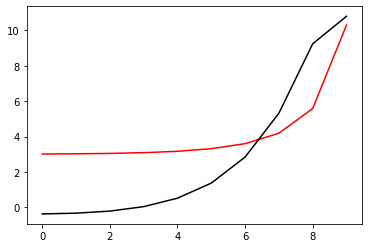

28200 96.0022530845766 -1.2764108900518367
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


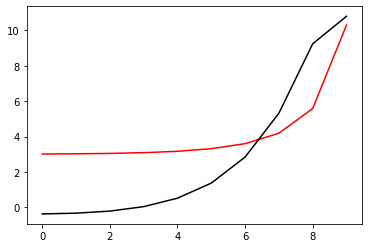

28400 96.00225308671457 -1.2764210768296906
[-0.36545525 -0.32438342 -0.20681415  0.04444551  0.52149764  1.37314287
  2.84195836  5.3186148   9.23577447 10.79111372]


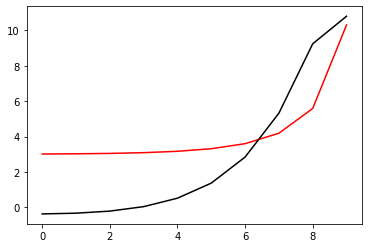

28600 96.00225308457658 -1.276410889533055
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


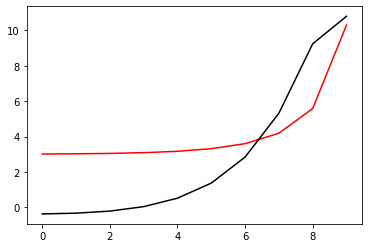

28800 96.0022530845766 -1.2764108900517064
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


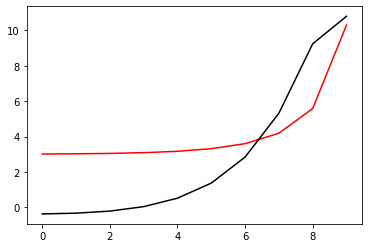

29000 96.00225308458495 -1.2764102316663466
[-0.36546908 -0.32439773 -0.20682924  0.04442983  0.5214814   1.37312765
  2.84194945  5.31861101  9.23575611 10.79110697]


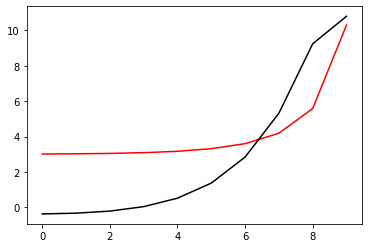

29200 96.00225308457658 -1.276410890053082
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


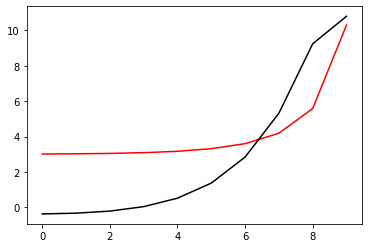

29400 96.00225308457658 -1.2764108900507192
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


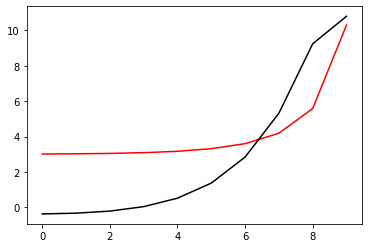

29600 96.0022530845771 -1.276411051028016
[-0.36546872 -0.32439736 -0.20682882  0.04443034  0.52148209  1.37312843
  2.84195001  5.31861096  9.23575552 10.79110697]


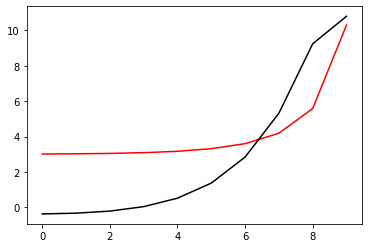

29800 96.00225308457658 -1.2764108900460662
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


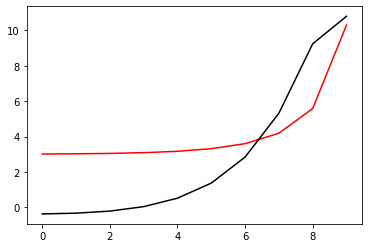

30000 96.00225309152741 -1.276392169052516
[-0.36548646 -0.32441492 -0.20684616  0.04441332  0.52146553  1.37311261
  2.8419354   5.31859821  9.23574509 10.79109778]


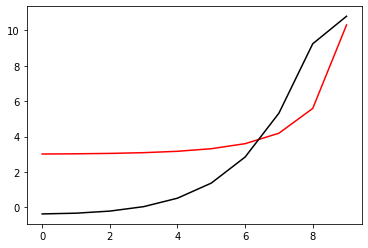

30200 96.0022530845766 -1.2764108884220922
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


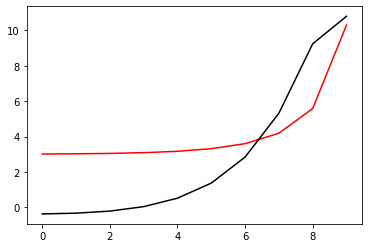

30400 96.0022530845766 -1.276410890051636
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


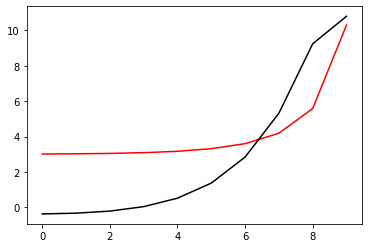

30600 96.0022530853923 -1.2764174655157687
[-0.36546804 -0.32439696 -0.20682833  0.04443156  0.521484    1.37313169
  2.84195205  5.31860634  9.23575309 10.7911074 ]


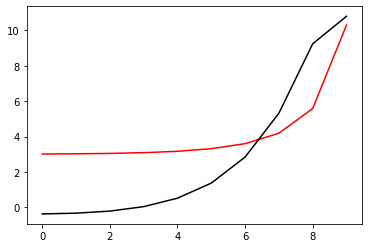

30800 96.00225308457658 -1.276410890233674
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


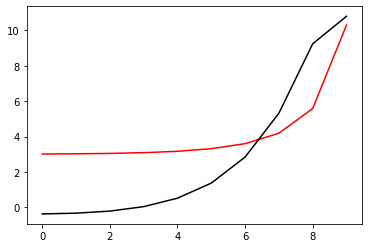

31000 96.0022530845766 -1.2764108900519118
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


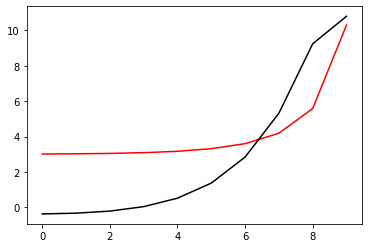

31200 96.00225308458197 -1.2764113971221442
[-0.36546797 -0.32439662 -0.20682813  0.04443093  0.52148255  1.37312886
  2.84195066  5.318612    9.23575657 10.79110772]


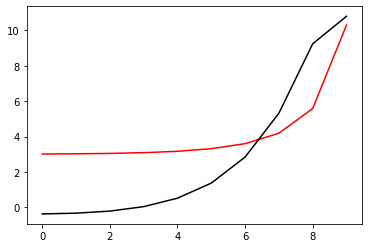

31400 96.00225308457658 -1.2764108900707702
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


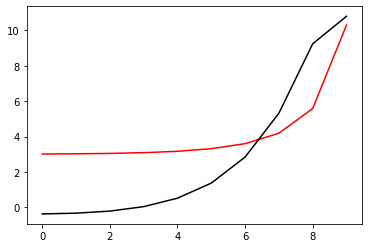

31600 96.00225308457658 -1.2764108900507773
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


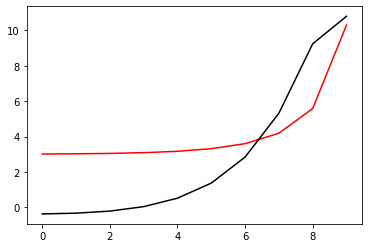

31800 96.00225308457661 -1.2764109278174136
[-0.3654688  -0.32439745 -0.20682894  0.0444302   0.52148193  1.37312827
  2.84194988  5.3186109   9.23575552 10.79110691]


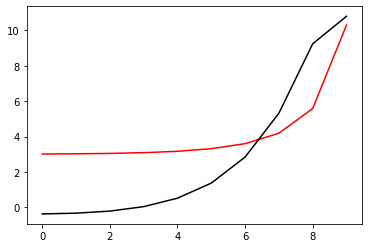

32000 96.00225308457658 -1.2764108900498348
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


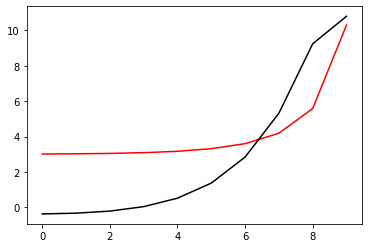

32200 96.00225308457658 -1.2764108900983187
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


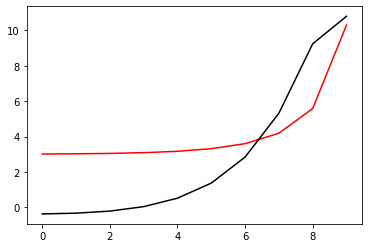

32400 96.00225308457662 -1.276410852279539
[-0.36546881 -0.32439745 -0.20682894  0.0444302   0.52148192  1.37312826
  2.84194989  5.31861091  9.23575556 10.79110695]


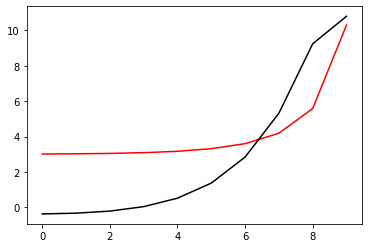

32600 96.00225308457658 -1.2764108900530509
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


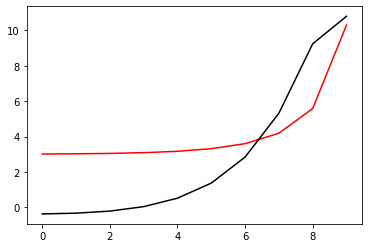

32800 96.00225311115884 -1.2763727341841211
[-0.36544982 -0.32438239 -0.20682516  0.04442349  0.52146945  1.37311784
  2.84195126  5.31863098  9.23578809 10.79112619]


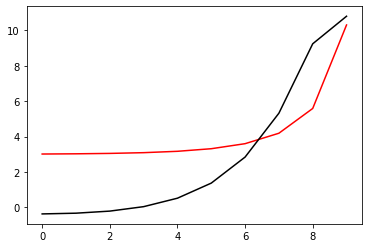

33000 96.00225308457658 -1.2764108920429573
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


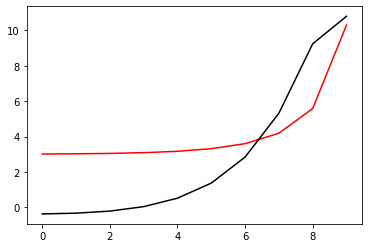

33200 96.0022530845766 -1.2764108900517903
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


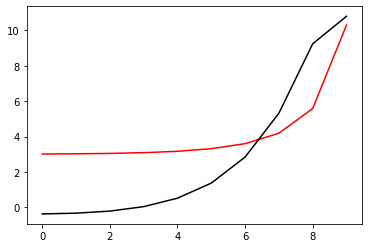

33400 96.00225308532471 -1.2764045697168684
[-0.36547088 -0.32439875 -0.20682906  0.04443181  0.52148527  1.37313371
  2.84195309  5.31860898  9.23576448 10.79111563]


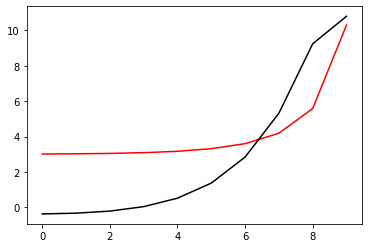

33600 96.00225308457658 -1.2764108897294653
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


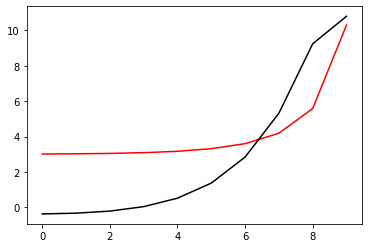

33800 96.0022530845766 -1.2764108900518618
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


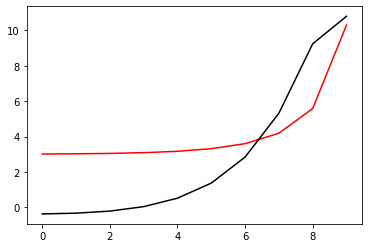

34000 96.00225308583865 -1.2764188072040674
[-0.36545927 -0.32438804 -0.20681997  0.04443828  0.52148845  1.37312945
  2.84194561  5.31861254  9.23578733 10.79111139]


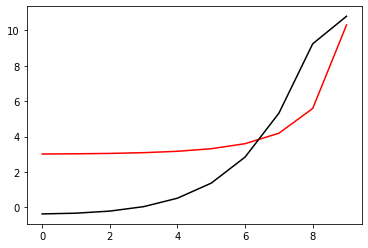

34200 96.0022530845766 -1.2764108894337038
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


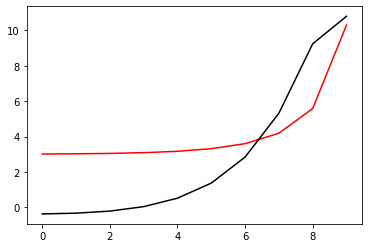

34400 96.0022530845766 -1.2764108900517552
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


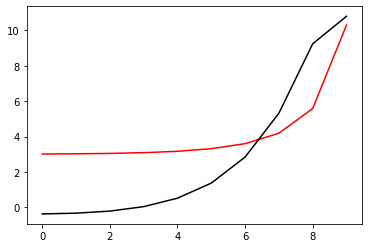

34600 96.00225308463494 -1.2764126225664476
[-0.36546753 -0.32439627 -0.20682787  0.04443106  0.5214825   1.37312845
  2.84194931  5.31861015  9.23575833 10.79110706]


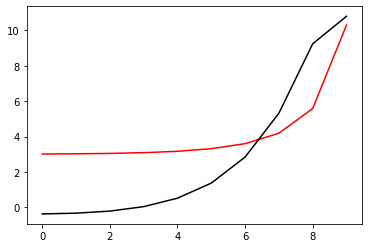

34800 96.00225308457658 -1.2764108900553315
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


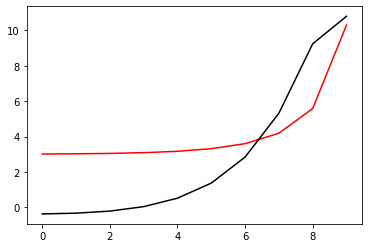

35000 96.0022530845766 -1.2764108900520406
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


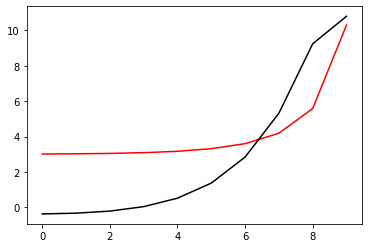

35200 96.00225308457661 -1.2764109233180068
[-0.36546888 -0.32439751 -0.20682896  0.04443023  0.521482    1.37312836
  2.84194993  5.31861082  9.23575528 10.79110689]


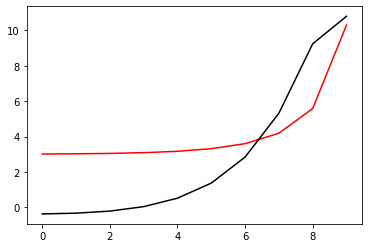

35400 96.00225308457658 -1.2764108900594102
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


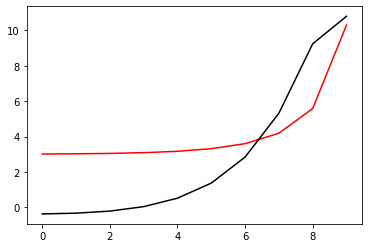

35600 96.00225308457658 -1.2764108899479676
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


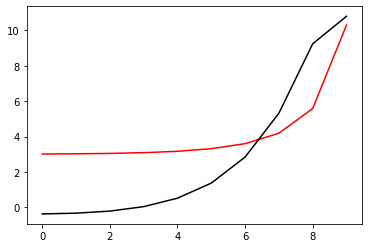

35800 96.00225308457658 -1.276410905062001
[-0.3654688  -0.32439744 -0.20682893  0.04443021  0.52148194  1.37312827
  2.84194988  5.31861089  9.23575554 10.79110692]


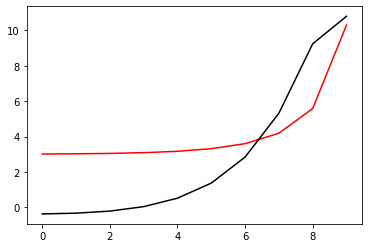

36000 96.00225308457658 -1.2764108900524098
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


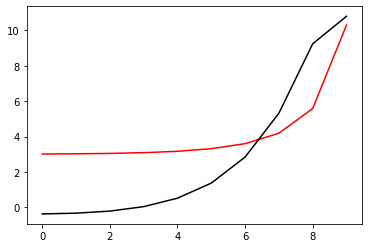

36200 96.00225308457658 -1.276410890055598
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


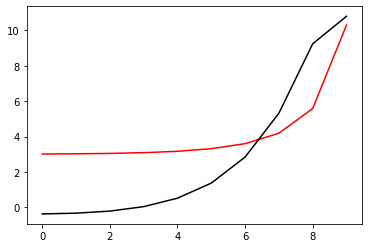

36400 96.00225308457664 -1.2764108404865084
[-0.36546883 -0.32439747 -0.20682896  0.04443017  0.52148189  1.37312823
  2.84194986  5.31861088  9.23575552 10.79110691]


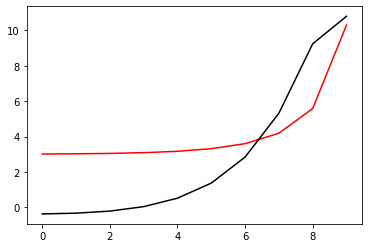

36600 96.00225308457658 -1.2764108900495839
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


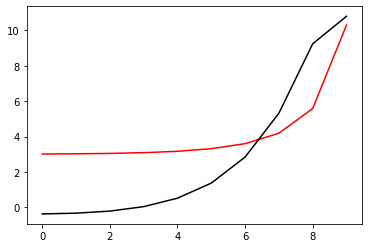

36800 96.00225308457658 -1.2764108900466948
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


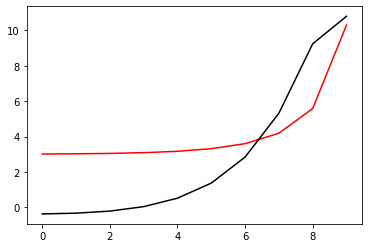

37000 96.0022530845766 -1.2764108681453568
[-0.36546878 -0.32439742 -0.20682891  0.04443022  0.52148195  1.37312829
  2.84194992  5.31861094  9.23575557 10.79110696]


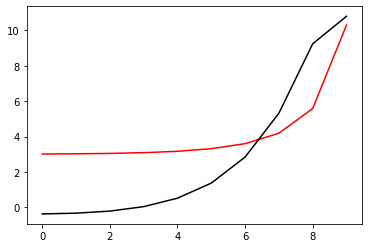

37200 96.00225308457658 -1.276410890053873
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


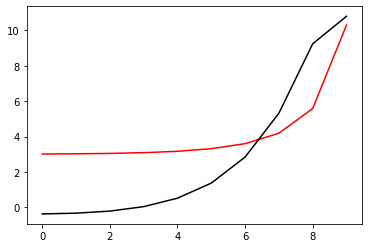

37400 96.00225308569617 -1.2764033872048919
[-0.365476   -0.32440458 -0.20683597  0.04442331  0.52147524  1.37312189
  2.84194399  5.31860574  9.23575129 10.79110324]


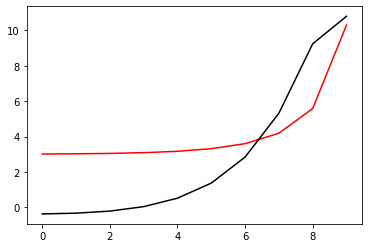

37600 96.0022530845766 -1.276410891972553
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.31861091  9.23575551 10.79110693]


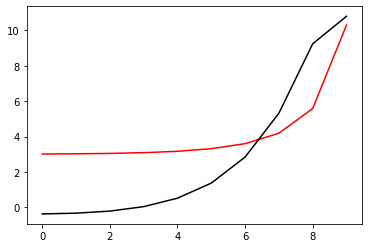

37800 96.0022530845766 -1.2764108900520537
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


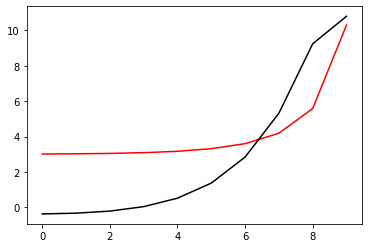

38000 96.00225308462684 -1.2764091822213062
[-0.3654675  -0.32439551 -0.20682616  0.04443418  0.52148739  1.37313488
  2.84195721  5.31861177  9.23574635 10.79110704]


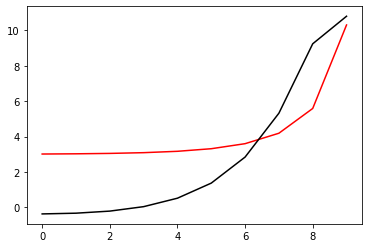

38200 96.00225308457658 -1.276410889741029
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


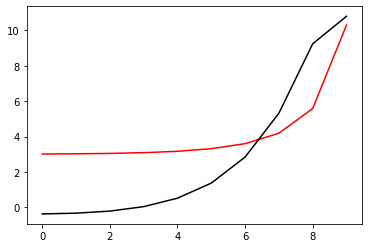

38400 96.0022530845766 -1.2764108900519986
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


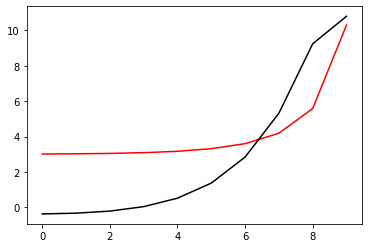

38600 96.0022530845784 -1.276410590812047
[-0.36546916 -0.3243978  -0.20682927  0.04442991  0.52148171  1.37312811
  2.84194972  5.31861057  9.23575483 10.79110661]


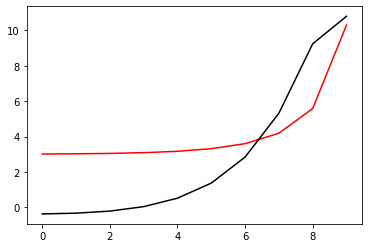

38800 96.00225308457657 -1.2764108900484563
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


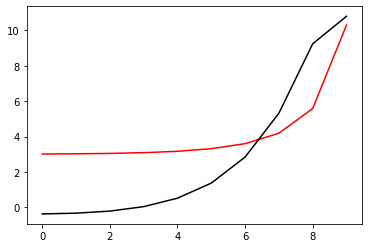

39000 96.00225308457692 -1.276410760237557
[-0.36546893 -0.32439757 -0.20682905  0.0444301   0.52148183  1.37312818
  2.8419498   5.31861081  9.23575544 10.79110686]


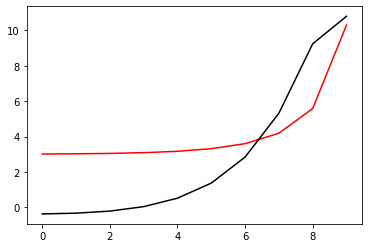

39200 96.0022530845766 -1.2764109000229813
[-0.36546879 -0.32439743 -0.20682891  0.04443023  0.52148197  1.37312831
  2.84194992  5.31861092  9.23575551 10.79110694]


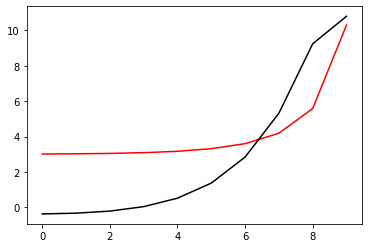

39400 96.0022530845766 -1.2764108900518565
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


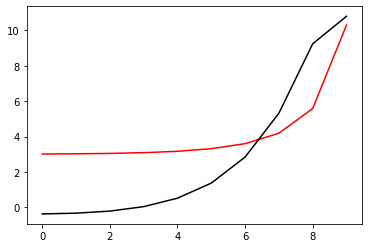

39600 96.00225308467365 -1.276409504539004
[-0.3654779  -0.32440945 -0.2068452   0.04440778  0.52144942  1.37308665
  2.84190941  5.31859072  9.23577565 10.79108313]


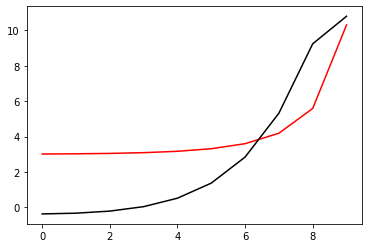

39800 96.0022530845766 -1.2764108891634522
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


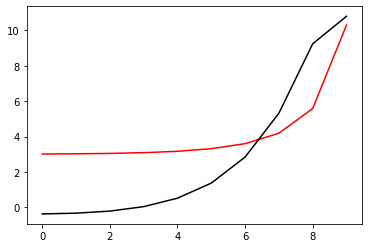

40000 96.0022530845766 -1.2764108900517404
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


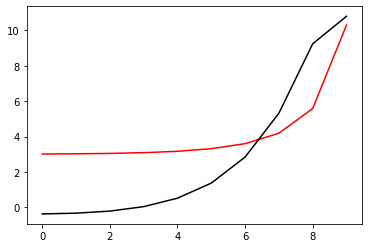

40200 96.00225308471612 -1.2764136200923442
[-0.36546871 -0.32439757 -0.20682914  0.0444301   0.52148215  1.37312934
  2.84195185  5.31861408  9.23575051 10.7911074 ]


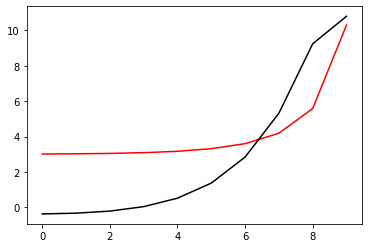

40400 96.00225308457658 -1.2764108901656752
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


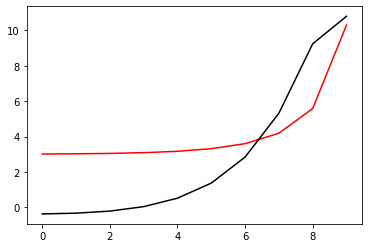

40600 96.0022530845766 -1.2764108900517745
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


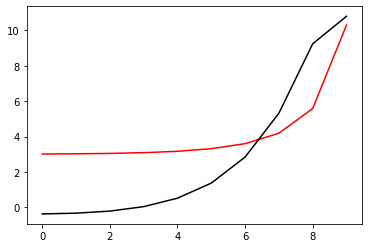

40800 96.00225308458343 -1.2764102884046018
[-0.36546891 -0.32439754 -0.20682903  0.04443005  0.52148168  1.373128
  2.84194984  5.31861132  9.23575615 10.79110726]


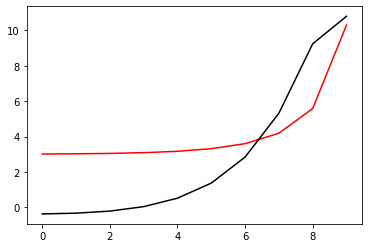

41000 96.0022530845766 -1.276410890076735
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


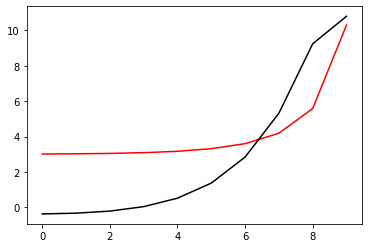

41200 96.00225308457661 -1.2764108900067501
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


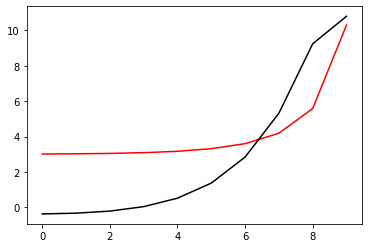

41400 96.00225308457662 -1.2764109251740017
[-0.36546874 -0.32439738 -0.20682887  0.04443027  0.52148199  1.37312833
  2.84194995  5.31861097  9.2357556  10.791107  ]


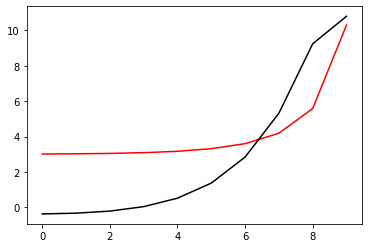

41600 96.00225308457658 -1.276410890051355
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


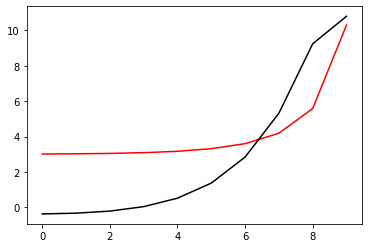

41800 96.00225311470648 -1.276447932262722
[-0.36537811 -0.32431112 -0.20675441  0.0444934   0.52153803  1.37318421
  2.84201388  5.31868751  9.23583639 10.79117016]


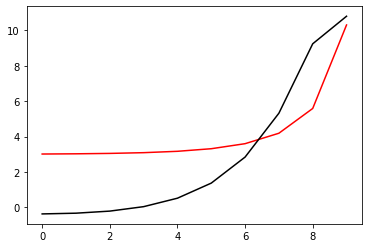

42000 96.00225308457657 -1.276410891235179
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


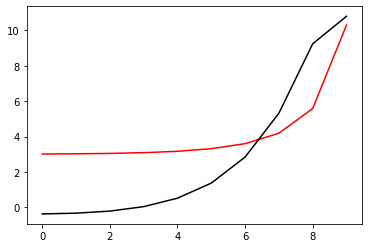

42200 96.0022530845766 -1.2764108900519178
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


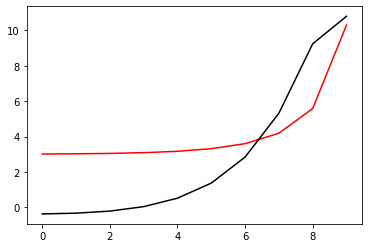

42400 96.00225308508831 -1.2764058584923201
[-0.36547512 -0.32440369 -0.20683487  0.04442486  0.5214776   1.37312541
  2.84194851  5.31860951  9.23573908 10.79110188]


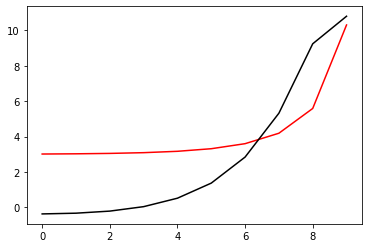

42600 96.00225308457658 -1.2764108900087225
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


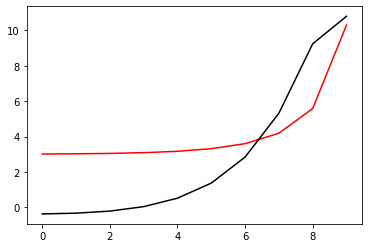

42800 96.0022530845766 -1.2764108900518625
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


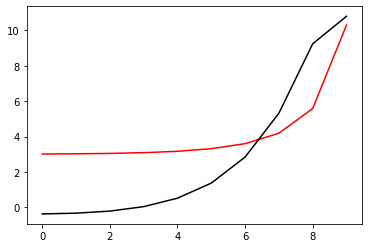

43000 96.00225308466334 -1.2764087841927745
[-0.3654703  -0.32439889 -0.20683036  0.04442883  0.52148047  1.37312679
  2.84194825  5.31860884  9.23575735 10.79110686]


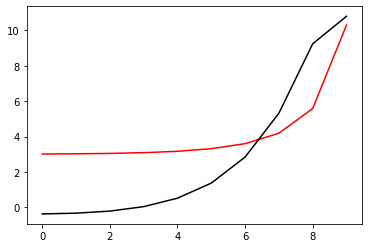

43200 96.00225308457658 -1.2764108899993318
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


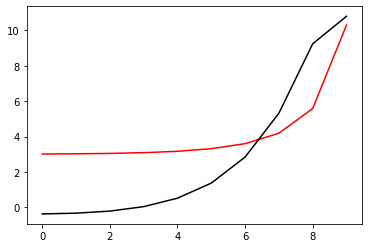

43400 96.0022530845766 -1.2764108900517628
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


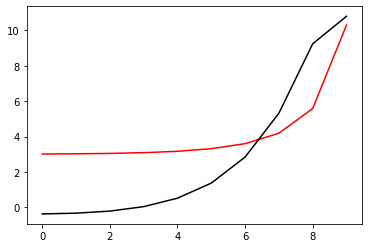

43600 96.00225308467769 -1.27640877180996
[-0.36547457 -0.32440338 -0.2068347   0.04442494  0.52147782  1.37312578
  2.84194945  5.3186102   9.23573943 10.79110358]


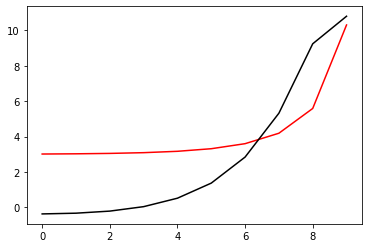

43800 96.00225308457658 -1.2764108899736275
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


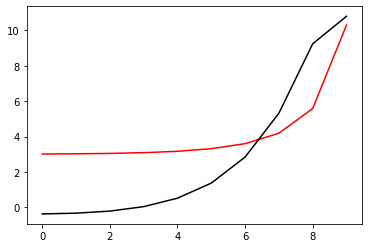

44000 96.0022530845766 -1.2764108900517577
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


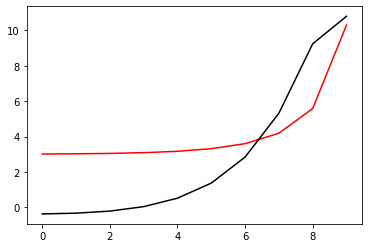

44200 96.00225308459687 -1.2764098280377043
[-0.36546867 -0.32439705 -0.20682824  0.04443144  0.52148376  1.37313119
  2.84195332  5.31861492  9.23574679 10.79110587]


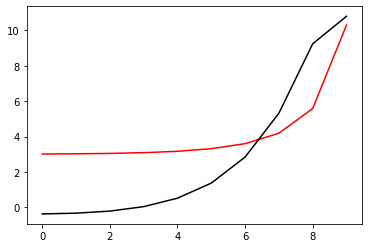

44400 96.00225308457658 -1.2764108898920024
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


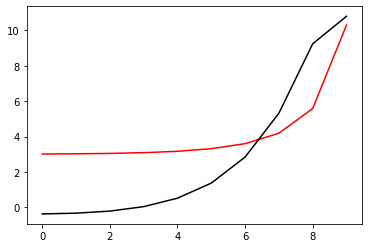

44600 96.0022530845766 -1.2764108900518294
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


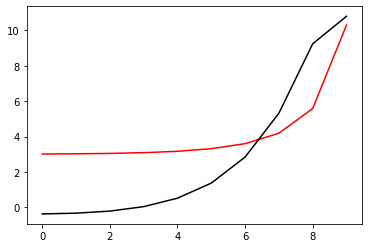

44800 96.00225308458161 -1.2764103694512228
[-0.36546869 -0.3243973  -0.20682883  0.04443022  0.5214818   1.37312779
  2.84194915  5.31861077  9.23575759 10.79110731]


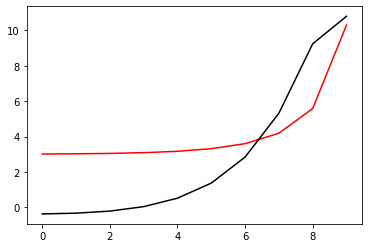

45000 96.00225308457658 -1.276410890020815
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


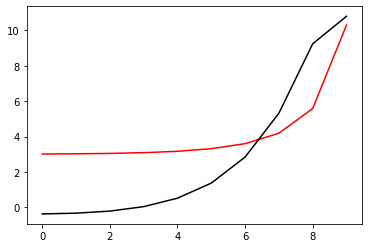

45200 96.0022530845766 -1.2764108900516824
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


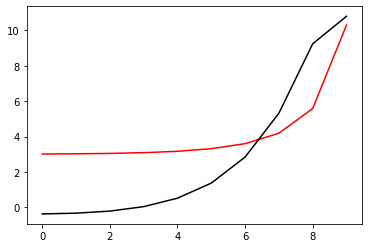

45400 96.00225308457665 -1.2764108401562253
[-0.36546889 -0.32439756 -0.20682909  0.04442999  0.52148168  1.37312808
  2.8419498   5.31861084  9.23575501 10.79110654]


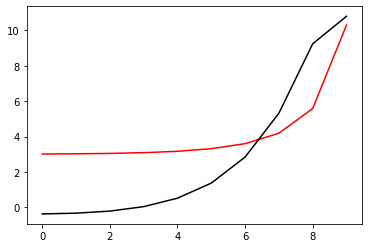

45600 96.00225308457658 -1.2764108900393971
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


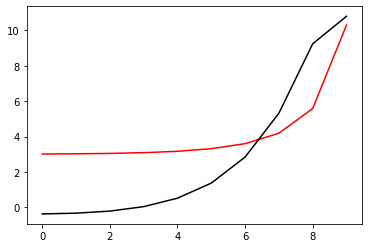

45800 96.00225308457658 -1.2764108900511233
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


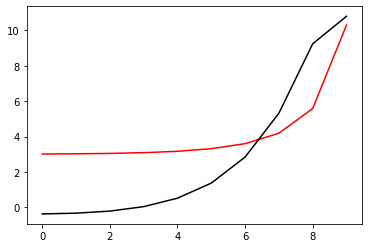

46000 96.0022530845766 -1.2764109106104233
[-0.36546884 -0.32439748 -0.20682895  0.04443021  0.52148195  1.3731283
  2.84194991  5.31861089  9.23575549 10.79110693]


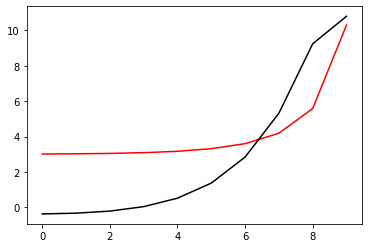

46200 96.0022530845766 -1.276410890054677
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


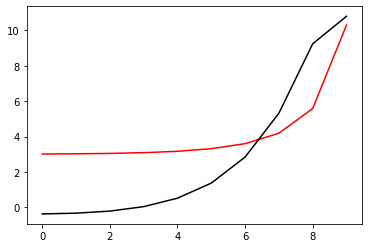

46400 96.00225308457695 -1.2764107564520948
[-0.36546893 -0.32439757 -0.20682905  0.04443009  0.52148183  1.37312818
  2.8419498   5.31861081  9.23575544 10.79110686]


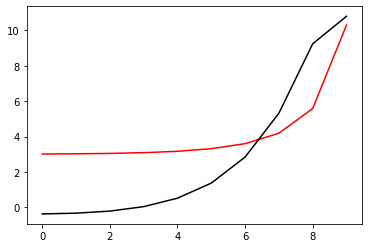

46600 96.00225308457657 -1.276410893207114
[-0.3654688  -0.32439744 -0.20682892  0.04443023  0.52148196  1.3731283
  2.84194992  5.31861091  9.2357555  10.79110693]


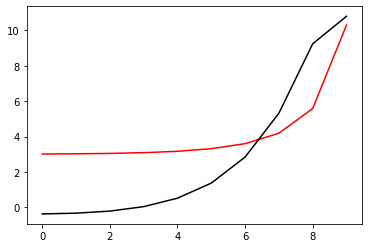

46800 96.0022530845766 -1.276410890052015
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


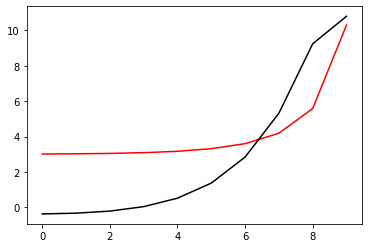

47000 96.00225309462614 -1.2763877254596079
[-0.3654658  -0.32439571 -0.20683114  0.04441948  0.52146059  1.37310225
  2.84193228  5.31862     9.2358022  10.79111524]


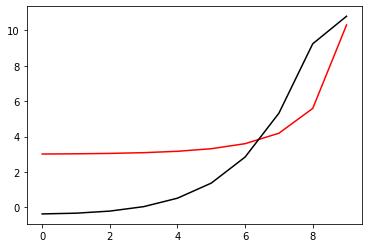

47200 96.0022530845766 -1.2764108896512831
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


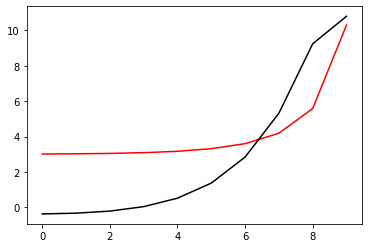

47400 96.0022530845766 -1.276410890051745
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


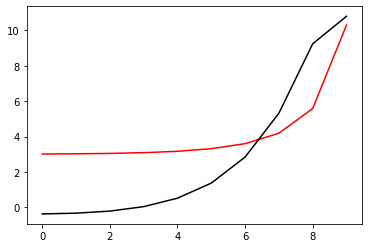

47600 96.0022530846889 -1.276413320336416
[-0.36546846 -0.32439714 -0.20682845  0.04443115  0.52148373  1.37313129
  2.84195406  5.31861448  9.23574306 10.79110549]


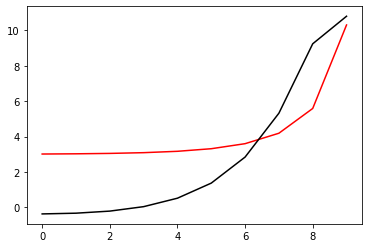

47800 96.00225308457657 -1.2764108898579896
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


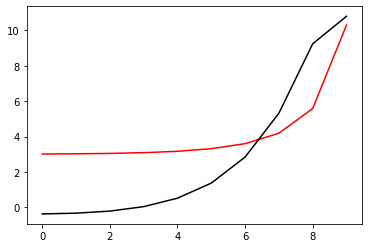

48000 96.0022530845766 -1.2764108900518443
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


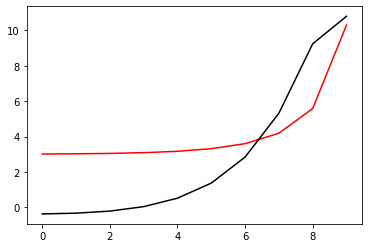

48200 96.00225308465778 -1.2764128615012162
[-0.36546569 -0.32439425 -0.20682571  0.04443342  0.52148494  1.37313104
  2.84195198  5.31861218  9.23576018 10.79110905]


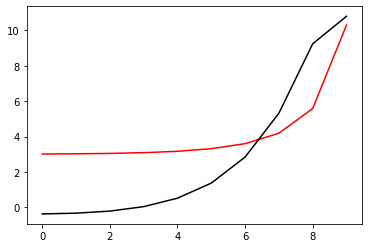

48400 96.00225308457658 -1.2764108901204196
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


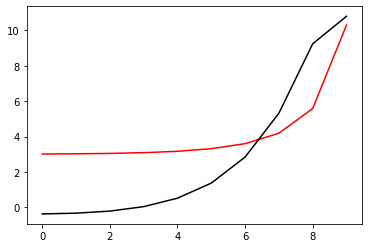

48600 96.0022530845766 -1.2764108900519464
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


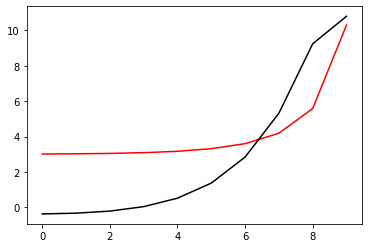

48800 96.00225308457851 -1.2764105723373909
[-0.365469   -0.32439762 -0.20682905  0.04443016  0.52148196  1.37312835
  2.84194994  5.31861078  9.23575507 10.79110684]


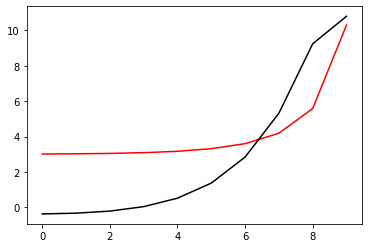

49000 96.00225308457658 -1.2764108900504616
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


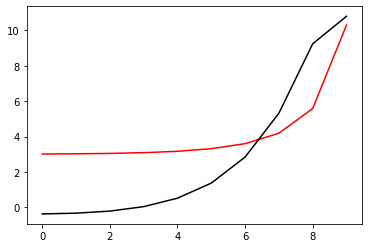

49200 96.00225308457658 -1.276410890215703
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


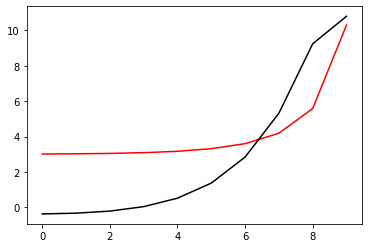

49400 96.00225308457662 -1.276410865745685
[-0.36546884 -0.32439748 -0.20682896  0.04443018  0.52148191  1.37312824
  2.84194985  5.31861087  9.23575551 10.7911069 ]


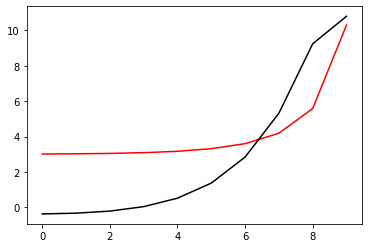

49600 96.00225308457658 -1.2764108900511806
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


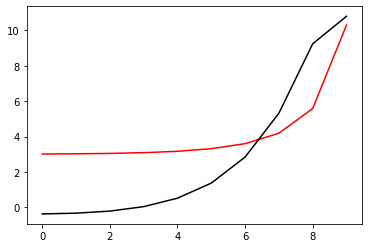

49800 96.00225317755798 -1.2763435453381922
[-0.3655501  -0.32449169 -0.2069364   0.04431258  0.52136033  1.37301285
  2.84185359  5.31854376  9.2357141  10.79107212]


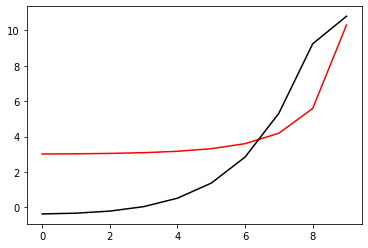

50000 96.00225308457662 -1.2764108924768989
[-0.3654688  -0.32439744 -0.20682892  0.04443022  0.52148195  1.3731283
  2.84194991  5.31861091  9.23575552 10.79110693]


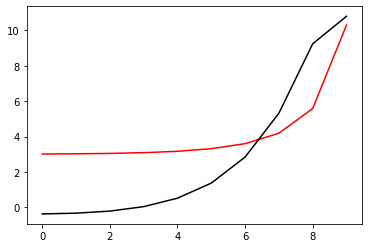

50200 96.0022530845766 -1.2764108900518631
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


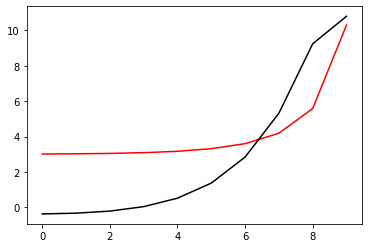

50400 96.00225308475814 -1.2764080039471346
[-0.36547558 -0.32440427 -0.20683537  0.04442482  0.52147767  1.3731259
  2.84194677  5.31860216  9.23575129 10.79110609]


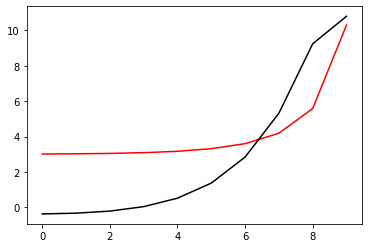

50600 96.00225308457657 -1.2764108902760025
[-0.3654688  -0.32439744 -0.20682893  0.04443022  0.52148195  1.37312829
  2.84194991  5.3186109   9.23575551 10.79110693]


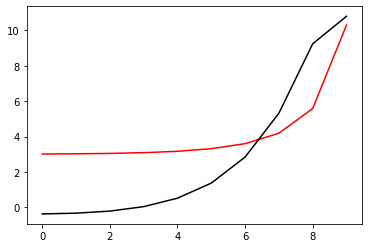

50800 96.0022530845766 -1.276410890051834
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


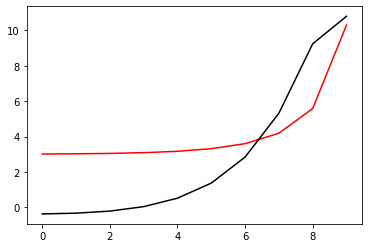

51000 96.00225308461515 -1.2764122553480666
[-0.36546676 -0.32439539 -0.20682691  0.04443213  0.52148371  1.3731297
  2.84195092  5.31861236  9.23575939 10.79110895]


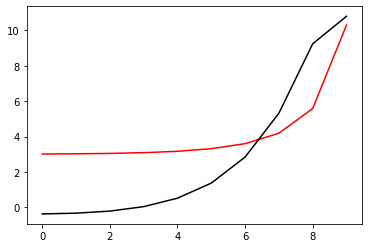

51200 96.0022530845766 -1.2764108900955946
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


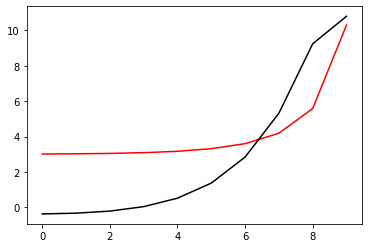

51400 96.00225308457658 -1.2764108900500823
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


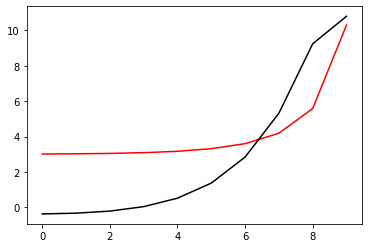

51600 96.00225308457678 -1.2764109876690173
[-0.36546874 -0.32439739 -0.20682889  0.04443025  0.52148197  1.37312831
  2.84194993  5.31861094  9.23575556 10.79110694]


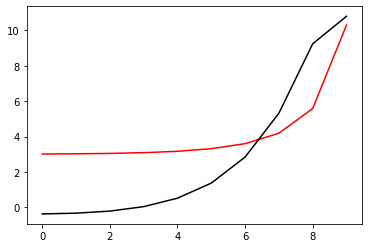

51800 96.00225308457658 -1.2764108900504167
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


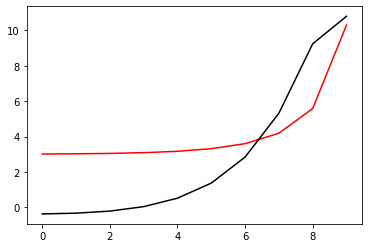

52000 96.0022530845768 -1.2764109942787158
[-0.3654687  -0.32439734 -0.20682883  0.04443032  0.52148205  1.37312838
  2.84194999  5.31861098  9.23575557 10.79110698]


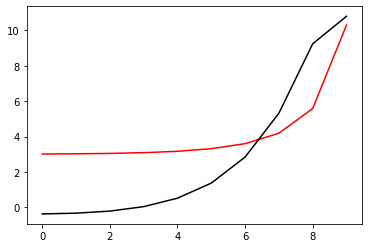

52200 96.00225308457658 -1.2764108967105448
[-0.36546879 -0.32439744 -0.20682892  0.04443023  0.52148196  1.37312831
  2.84194992  5.31861091  9.2357555  10.79110693]


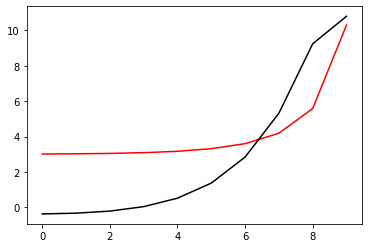

52400 96.0022530845766 -1.276410890051596
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


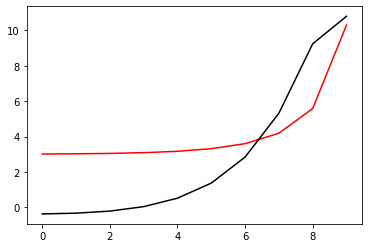

52600 96.00225308499147 -1.2764150748994365
[-0.36545722 -0.32438489 -0.20681509  0.04444535  0.52149831  1.37314504
  2.84196178  5.31861779  9.23577653 10.79112021]


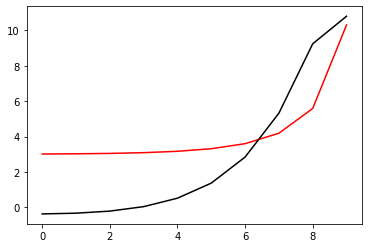

52800 96.0022530845766 -1.2764108903576254
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


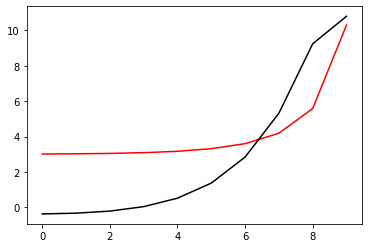

53000 96.0022530845766 -1.2764108900517663
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


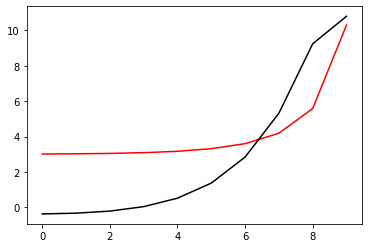

53200 96.00225308466229 -1.2764088159049516
[-0.36547131 -0.32439981 -0.20683096  0.04442879  0.52148144  1.37312914
  2.8419519   5.31861267  9.23574156 10.79110391]


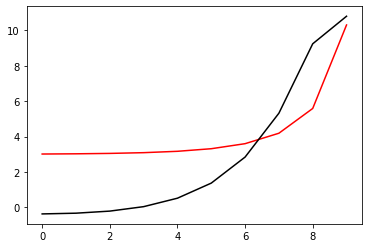

53400 96.00225308457658 -1.2764108900845115
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


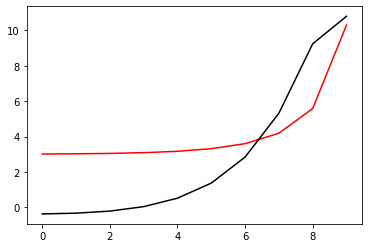

53600 96.0022530845766 -1.2764108900517848
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


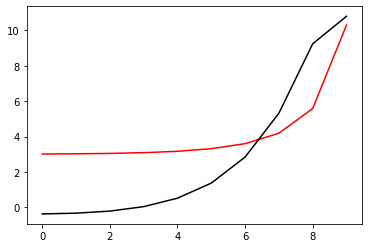

53800 96.0022530846046 -1.2764096646701362
[-0.36546885 -0.3243974  -0.20682883  0.04443035  0.52148195  1.37312818
  2.84194935  5.31860988  9.23575821 10.79110741]


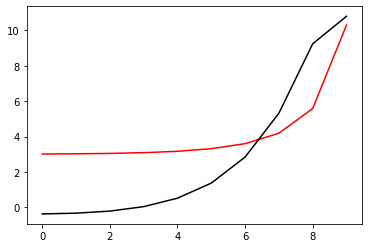

54000 96.0022530845766 -1.2764108900276387
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


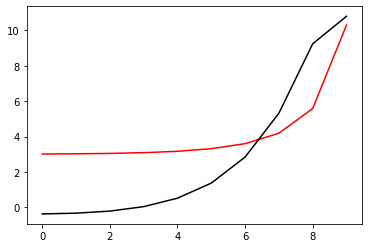

54200 96.0022530845766 -1.2764108900517412
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


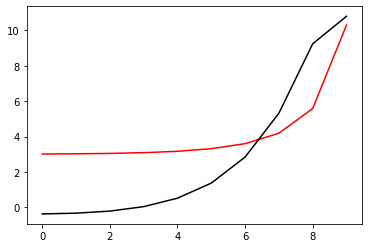

54400 96.002253084577 -1.2764110397015467
[-0.36546882 -0.32439745 -0.2068289   0.04443029  0.52148206  1.37312842
  2.84195     5.31861087  9.2357553  10.79110695]


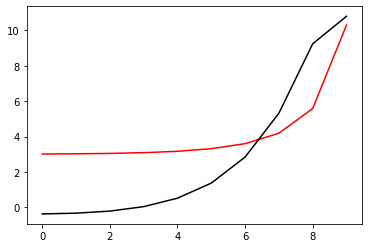

54600 96.00225308457658 -1.2764108900596818
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


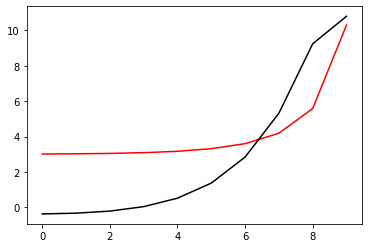

54800 96.0022530845766 -1.27641089005172
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


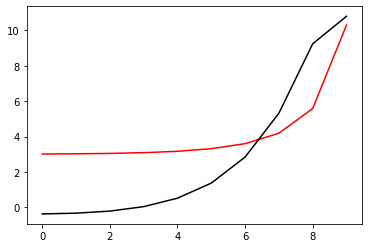

55000 96.00225308457661 -1.2764108627276405
[-0.36546876 -0.3243974  -0.2068289   0.04443025  0.52148204  1.37312849
  2.8419502   5.31861116  9.2357553  10.79110713]


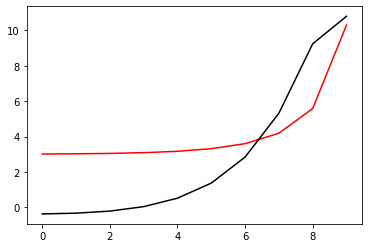

55200 96.0022530845766 -1.2764108900520679
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


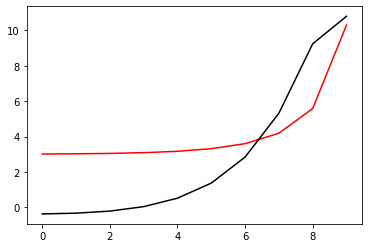

55400 96.00225308457658 -1.2764108900604287
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


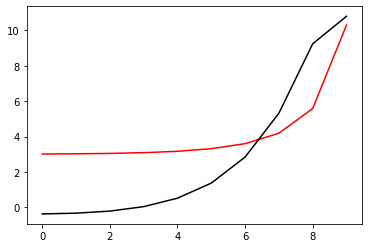

55600 96.00225308457667 -1.2764108298400116
[-0.36546882 -0.32439746 -0.20682895  0.04443019  0.52148191  1.37312826
  2.84194989  5.31861091  9.23575555 10.79110694]


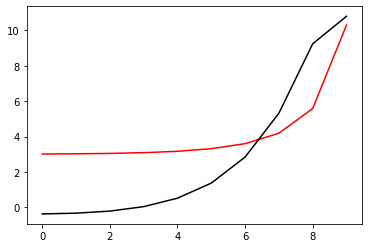

55800 96.00225308457658 -1.2764108900536133
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


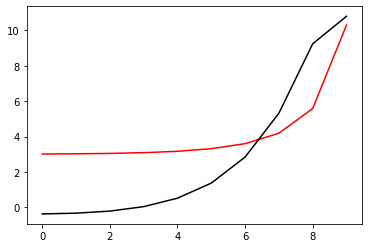

56000 96.00225318961488 -1.2764840540611095
[-0.36541331 -0.32435576 -0.20680165  0.04444547  0.52149026  1.37313783
  2.84197024  5.31864717  9.23580025 10.79114822]


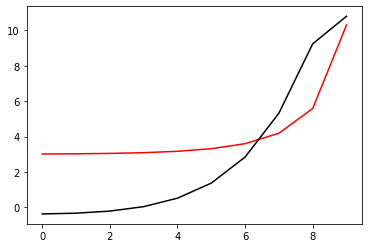

56200 96.00225308457658 -1.2764108873880404
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575552 10.79110693]


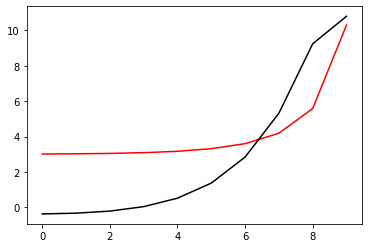

56400 96.0022530845766 -1.2764108900518996
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


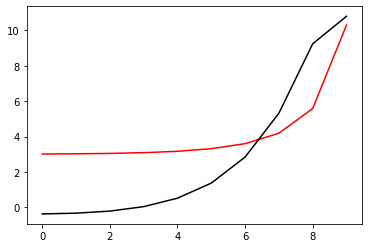

56600 96.00225308726021 -1.2764221361987784
[-0.3654504  -0.32437812 -0.20680839  0.044452    0.52150485  1.37315145
  2.84196785  5.31862305  9.23578081 10.79112438]


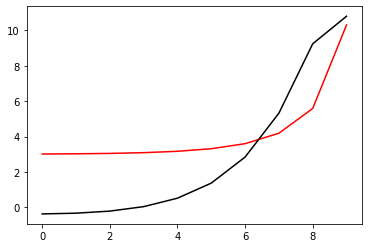

56800 96.00225308457658 -1.276410890076727
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


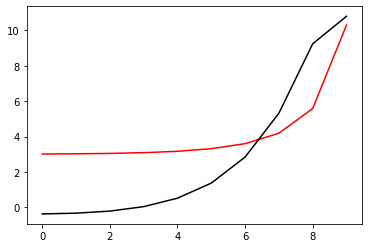

57000 96.0022530845766 -1.2764108900518907
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


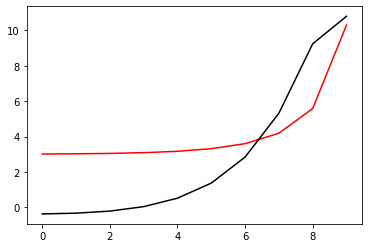

57200 96.00225308476156 -1.2764137212730813
[-0.36546216 -0.32439014 -0.20682072  0.04443963  0.52149305  1.37314067
  2.84196355  5.31861875  9.2357504  10.79111298]


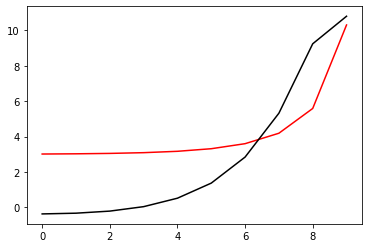

57400 96.0022530845766 -1.2764108898313622
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


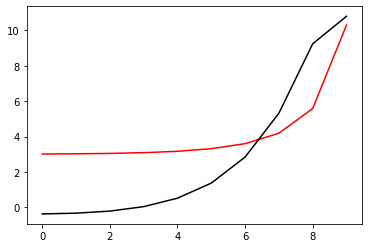

57600 96.0022530845766 -1.2764108900517883
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


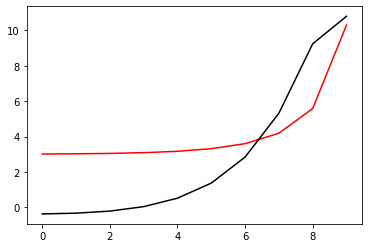

57800 96.00225308457786 -1.2764111623366154
[-0.36546901 -0.32439774 -0.20682933  0.04442962  0.52148109  1.3731271
  2.84194806  5.31860912  9.2357575  10.79110637]


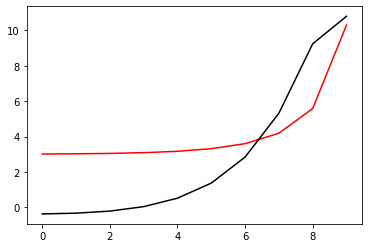

58000 96.0022530845766 -1.2764108900384121
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


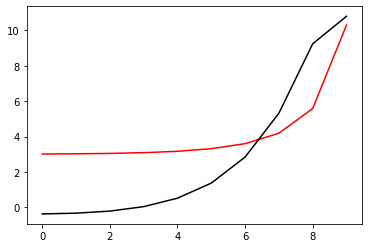

58200 96.0022530845766 -1.2764108900515885
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


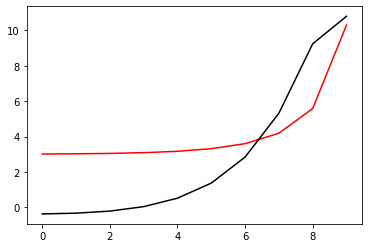

58400 96.00225308457772 -1.2764106468627618
[-0.36546893 -0.32439755 -0.20682899  0.04443022  0.52148202  1.37312841
  2.84194999  5.31861081  9.23575508 10.79110684]


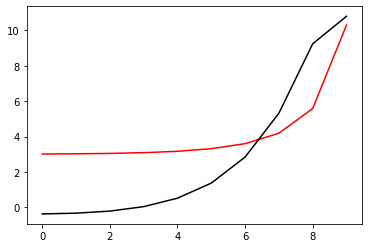

58600 96.0022530845766 -1.276410890058214
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


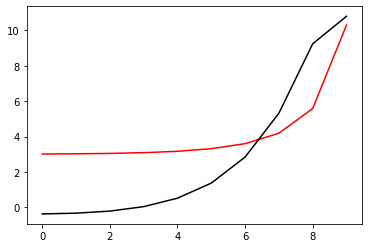

58800 96.0022530845766 -1.2764108875529987
[-0.36546881 -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


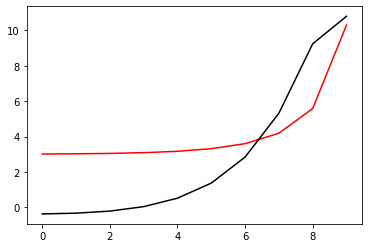

59000 96.00225308457658 -1.276410899422994
[-0.3654688  -0.32439744 -0.20682892  0.04443023  0.52148196  1.3731283
  2.84194991  5.3186109   9.23575552 10.79110692]


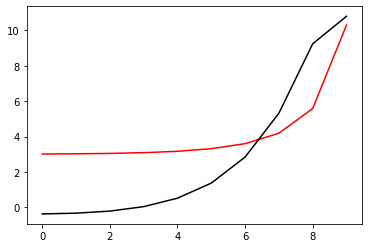

59200 96.00225308457658 -1.276410890051183
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


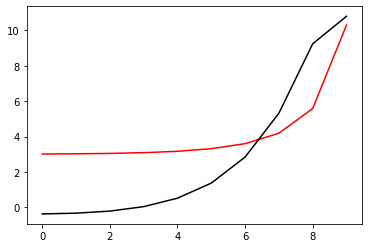

59400 96.00225308622296 -1.276419967869382
[-0.36545985 -0.32438856 -0.20682015  0.04443884  0.52149033  1.37313628
  2.84195727  5.3186173   9.2357607  10.79111142]


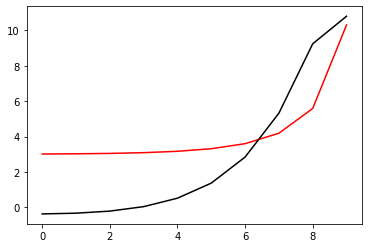

59600 96.00225308457658 -1.2764108854981173
[-0.36546881 -0.32439745 -0.20682893  0.04443021  0.52148194  1.37312829
  2.8419499   5.3186109   9.2357555  10.79110692]


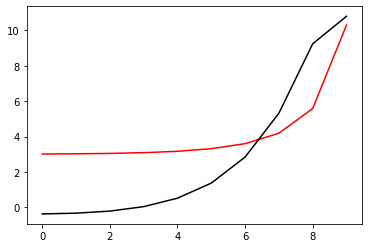

59800 96.0022530845766 -1.2764108900516
[-0.3654688  -0.32439745 -0.20682893  0.04443022  0.52148195  1.37312829
  2.8419499   5.3186109   9.23575551 10.79110693]


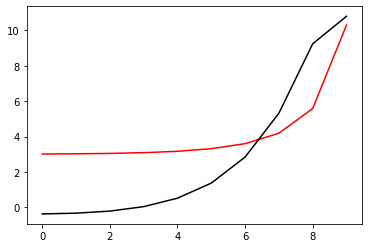

60000 96.00225314075793 -1.276357137428025
[-0.36549254 -0.32442686 -0.20687266  0.04437054  0.52141184  1.37305789
  2.8418929   5.31858025  9.23574953 10.79107527]


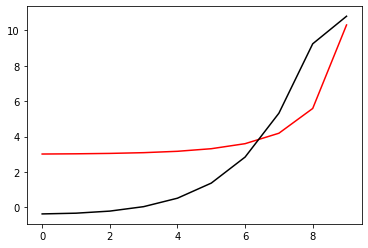

In [94]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for i in range (1, 60001):
    run()
    if i%200==0: print(i, Error_func(h, m2_2).numpy(), m2_2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

In [ ]:
[Positive0, Positive1]=NN_func_01(h, Positive)
[Negative0, Negative1]=NN_func_01(h, Negative)

x_data1=[v[0] for v in Positive0]
y_data1=[v[1] for v in Positive0]
x_data2=[v[0] for v in Positive1]
y_data2=[v[1] for v in Positive1]
x_data3=[v[0] for v in Negative0]
y_data3=[v[1] for v in Negative0]
x_data4=[v[0] for v in Negative1]
y_data4=[v[1] for v in Negative1]
plt.plot(x_data4, y_data4, 'g.')
plt.plot(x_data2, y_data2, 'co', label='Positive')
plt.plot(x_data1, y_data1, 'ro', label='NN(p)=0')
plt.plot(x_data3, y_data3, 'mo', label='NN(n)=0')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.legend(bbox_to_anchor=(1, 0.5))
plt.show()